<img src="Albuquerque.png" style="height:300px">

<font size=5> **Index** </font> <br>
    
- [<font color='black'> Import of Libraries </font>](#Import_Libraries) <br>

- [<font color='black'> Data Integration </font>](#Data_Integration) <br>

- [<font color='black'> EDA </font>](#EDA) <br>
    - [<font color='black'> Check Records </font>](#Check_Records) <br>
    - [<font color='black'> Summary Statistics </font>](#Summary_Statistics) <br>
    - [<font color='black'> Charts </font>](#Charts) <br>    

- [<font color='black'> Data Pre-Processing </font>](#Data_Pre-Processing) <br>
    - [<font color='black'> Missing Data </font>](#Missing_Data) <br>
    - [<font color='black'> Errors and Inconsistencies </font>](#Errors_Inconsistencies) <br>
    - [<font color='black'> Outliers </font>](#Outliers) <br>  

- [<font color='black'> Feature Engineering </font>](#Feature_Engineering)<br>

- [<font color='black'> Feature Transformation </font>](#Feature_Transformation)<br>
    - [<font color='black'> Binning </font>](#Binning)<br>    
    - [<font color='black'> Encoding </font>](#Encoding)<br>      
    - [<font color='black'> Normalization </font>](#Normalization)<br> 
    
- [<font color='black'> Oversampling </font>](#Oversampling)<br>

- [<font color='black'> Feature Selection </font>](#Feature_Selection)<br>
    - [<font color='black'> Filter Method </font>](#Filter_Method)<br>
    - [<font color='black'> Wrapper Method </font>](#Wrapper_Method)<br>
    - [<font color='black'> Embedded Method </font>](#Embedded_Method)<br> 
    
- [<font color='black'> Prediction </font>](#Prediction)<br>
    - [<font color='black'> Logistic Regression </font>](#Logistic_Regression)<br> 
    - [<font color='black'> Gaussian Naive Bayes </font>](#Gaussian_Naive_Bayes)<br> 
    - [<font color='black'> KNN </font>](#KNN)<br>    
    - [<font color='black'> SVC </font>](#SVC)<br>  
    - [<font color='black'> Decision Trees </font>](#Decision_Trees)<br>
    - [<font color='black'> Random Forest </font>](#Random_Forest)<br>  
    - [<font color='black'> Neural Networks </font>](#Neural_Networks)<br>  
    - [<font color='black'> Gradient Boosting </font>](#Gradient_Boosting)<br>     
    - [<font color='black'> Ada Boosting </font>](#Ada_Boosting)<br>      
    - [<font color='black'> XG Boosting </font>](#XG_Boosting)<br>  
    - [<font color='black'> Majority Voting </font>](#Majority_Voting)<br>  
 
- [<font color='black'> Assessment </font>](#Assessment)<br> 

# <span style='color:darkcyan'> Import of Libraries <a class="anchor" id="Import_Libraries">

In [1]:
#pandas
import pandas as pd

#seaborn
import seaborn as sns

#numpy
import numpy as np

#matplotlib
import matplotlib.pyplot as plt

#plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.subplots as make_subplots
from plotly import tools

#train_test_split
from sklearn.model_selection import train_test_split

#KNN
from sklearn.impute import KNNImputer

#Normalization
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler

#Filter Method
from scipy.stats import chi2_contingency
from sklearn.feature_selection import mutual_info_classif
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

#Wrapper Method
from sklearn.feature_selection import RFE

#Embedded Method
from sklearn.linear_model import LassoCV
from sklearn.linear_model import ElasticNet
  


#Oversampling
import imblearn
from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SVMSMOTE



#Prediction Algorithms
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import PredefinedSplit
from sklearn.metrics import accuracy_score

from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier


from sklearn.ensemble import RandomForestClassifier
from sklearn import model_selection
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier


from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

#Ploting Decision Trees
from sklearn import tree
from sklearn.tree import export_graphviz
import graphviz
#import pydotplus

import warnings
warnings.filterwarnings('ignore')

#Assessment
from sklearn.metrics import classification_report, confusion_matrix

In [2]:
conda install -c anaconda py-xgboost

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\nefta\anaconda3

  added / updated specs:
    - py-xgboost


The following packages will be UPDATED:

  conda              conda-forge::conda-4.10.1-py38haa244f~ --> pkgs/main::conda-4.10.1-py38haa95532_1


Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done

Note: you may need to restart the kernel to use updated packages.


# <span style='color:brown'> Data Integration <a class="anchor" id="Data_Integration">

In [3]:
Test = pd.read_csv('test.csv')
Train = pd.read_csv('train.csv')

# <span style='color:seagreen'> EDA <a class="anchor" id="EDA">

## <span style='color:seagreen'> Check Records <a class="anchor" id="Check_Records">

In [4]:
#Check the first rows of the Test set

Test.head()

,Patient_ID,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City
0,901,49242,3,Mr. Jody Pedro,NaN,0,0,203,NaN,Santa Fe
1,902,10400,3,Mr. Kevin Brent,1988.0,0,0,631,NaN,Santa Fe
2,903,10795,3,Mr. Frankie Cary,1981.0,1,0,376,NaN,Albuquerque
3,904,62440,3,Mr. Rick Pete,NaN,0,1,405,NaN,Albuquerque
4,905,81311,2,Mr. Matthew Erick,1996.0,0,0,378,NaN,Santa Fe


In [5]:
#Check the first rows of the Test set

Train.head()

,Patient_ID,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Deceased
0,1,4696,3,Miss Linda Betty,NaN,0,0,225,NaN,Santa Fe,1
1,2,21436,1,Ms. Ramona Elvira,1966.0,0,1,1663,NaN,Albuquerque,0
2,3,7273,3,Mr. Mario Vernon,1982.0,0,0,221,NaN,Santa Fe,1
3,4,8226,3,Mr. Hector Joe,1997.0,0,0,220,NaN,Santa Fe,1
4,5,19689,3,Ms. Jennie Debra,1994.0,0,0,222,NaN,Santa Fe,0


In [6]:
#Set Patient ID as the index in Test

Patient_ID = Test['Patient_ID']
Test.set_index('Patient_ID',inplace=True)

In [7]:
#Set Patient ID as the index in Train

#train_Patient_ID = Train['Patient_ID']
#train_Patient_ID = pd.DataFrame (train_Patient_ID).rename(columns={0:'Patient_ID'})
Train.set_index('Patient_ID',inplace=True)

In [8]:
#Check for duplicated rows in the Test set

Test[Test.duplicated(keep=False)]

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City
Patient_ID,,,,,,,,,


In [9]:
#Check for duplicated rows in the Train set

Train[Train.duplicated(keep=False)]

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Deceased
Patient_ID,,,,,,,,,,


In [10]:
#Check the number of records and features of the Test set

Test.shape 

(400, 9)

In [11]:
#Check the number of records and features of the Train set

Train.shape 

(900, 10)

In [12]:
#Check the features of the Teste set

Test.columns

Index(['Family_Case_ID', 'Severity', 'Name', 'Birthday_year',
       'Parents_Children_Infected', 'Partner_Siblings_Infected',
       'Medical_Expenses_Family', 'Medical_Tent', 'City'],
      dtype='object')

In [13]:
#Check the features of the Train set

Train.columns

Index(['Family_Case_ID', 'Severity', 'Name', 'Birthday_year',
       'Parents_Children_Infected', 'Partner_Siblings_Infected',
       'Medical_Expenses_Family', 'Medical_Tent', 'City', 'Deceased'],
      dtype='object')

In [14]:
#Check data types of the Test set

Test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 400 entries, 901 to 1300
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Family_Case_ID             400 non-null    int64  
 1   Severity                   400 non-null    int64  
 2   Name                       400 non-null    object 
 3   Birthday_year              318 non-null    float64
 4   Parents_Children_Infected  400 non-null    int64  
 5   Partner_Siblings_Infected  400 non-null    int64  
 6   Medical_Expenses_Family    400 non-null    int64  
 7   Medical_Tent               89 non-null     object 
 8   City                       400 non-null    object 
dtypes: float64(1), int64(5), object(3)
memory usage: 31.2+ KB


In [15]:
#Check data types of the Test set

Train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 900 entries, 1 to 900
Data columns (total 10 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Family_Case_ID             900 non-null    int64  
 1   Severity                   900 non-null    int64  
 2   Name                       900 non-null    object 
 3   Birthday_year              723 non-null    float64
 4   Parents_Children_Infected  900 non-null    int64  
 5   Partner_Siblings_Infected  900 non-null    int64  
 6   Medical_Expenses_Family    900 non-null    int64  
 7   Medical_Tent               198 non-null    object 
 8   City                       898 non-null    object 
 9   Deceased                   900 non-null    int64  
dtypes: float64(1), int64(6), object(3)
memory usage: 77.3+ KB


In [16]:
#Check the frequency of Severity in the Test set

Test['Severity'].value_counts()

3    204
1    105
2     91
Name: Severity, dtype: int64

In [17]:
#Check the frequency of Severity in the Test set

Train['Severity'].value_counts()

3    498
1    216
2    186
Name: Severity, dtype: int64

In [18]:
#Check the frequency of Parents_Children_Infected in the Test set

Test['Parents_Children_Infected'].value_counts()

0    310
1     48
2     33
3      3
9      2
4      2
6      1
5      1
Name: Parents_Children_Infected, dtype: int64

In [19]:
#Check the frequency of Parents_Children_Infected in the Train set

Train['Parents_Children_Infected'].value_counts()

0    685
1    120
2     80
5      5
3      5
4      4
6      1
Name: Parents_Children_Infected, dtype: int64

In [20]:
#Check the frequency of Partner_Siblings_Infected in the Train set

Test['Partner_Siblings_Infected'].value_counts()

0    271
1    104
2     14
4      4
3      4
8      2
5      1
Name: Partner_Siblings_Infected, dtype: int64

In [21]:
#Check the frequency of Partner_Siblings_Infected in the Train set

Train['Partner_Siblings_Infected'].value_counts()

0    614
1    212
2     28
4     18
3     16
8      7
5      5
Name: Partner_Siblings_Infected, dtype: int64

In [22]:
#Check the frequency of Medical Tent in the Test set

Test['Medical_Tent'].value_counts()

C    33
B    18
D    13
E     9
F     8
A     7
G     1
Name: Medical_Tent, dtype: int64

In [23]:
#Check the frequency of Medical Tent in the Train set

Train['Medical_Tent'].value_counts()

C    57
B    46
E    31
D    31
A    15
F    13
G     4
T     1
Name: Medical_Tent, dtype: int64

In [24]:
#Check the frequency of City in the Test set

Test['City'].value_counts()

Santa Fe       260
Albuquerque     99
Taos            41
Name: City, dtype: int64

In [25]:
#Check the frequency of City in the Train set

Train['City'].value_counts()

Santa Fe       649
Albuquerque    169
Taos            80
Name: City, dtype: int64

In [26]:
#Check the frequency of Deceased in the Train set

Train['Deceased'].value_counts()

1    553
0    347
Name: Deceased, dtype: int64

## <span style='color:seagreen'> Summary Statistics <a class="anchor" id="Summary_Statistics">

In [27]:
#Check summary statistics for numerical variables in the Test set

round(Test.describe().T,1)

,count,mean,std,min,25%,50%,75%,max
Family_Case_ID,400.0,46024.9,39279.9,1162.0,13487.0,26721.5,79045.0,128562.0
Severity,400.0,2.2,0.8,1.0,1.0,3.0,3.0,3.0
Birthday_year,318.0,1989.7,14.2,1944.0,1980.2,1993.0,1999.0,2019.0
Parents_Children_Infected,400.0,0.4,1.0,0.0,0.0,0.0,0.0,9.0
Partner_Siblings_Infected,400.0,0.5,0.9,0.0,0.0,0.0,1.0,8.0
Medical_Expenses_Family,400.0,1013.9,1587.6,0.0,221.0,406.0,883.2,14345.0


In [28]:
#Check summary statistics for numerical variables in the Train set

round(Train.describe().T,1)

,count,mean,std,min,25%,50%,75%,max
Family_Case_ID,900.0,14305.8,25418.2,345.0,8203.0,13593.5,18906.5,742836.0
Severity,900.0,2.3,0.8,1.0,2.0,3.0,3.0,3.0
Birthday_year,723.0,1990.3,14.5,1940.0,1982.0,1992.0,1999.5,2019.0
Parents_Children_Infected,900.0,0.4,0.8,0.0,0.0,0.0,0.0,6.0
Partner_Siblings_Infected,900.0,0.5,1.1,0.0,0.0,0.0,1.0,8.0
Medical_Expenses_Family,900.0,895.7,1385.8,0.0,221.0,405.0,861.2,14345.0
Deceased,900.0,0.6,0.5,0.0,0.0,1.0,1.0,1.0


In [29]:
#Check summary statistics for categorical variables in the Test set

Test.describe(include = ['O'])

,Name,Medical_Tent,City
count,400,89,400
unique,400,7,3
top,Mr. Alfred Emmett,C,Santa Fe
freq,1,33,260


In [30]:
#Check summary statistics for categorical variables in the Train set

Train.describe(include = ['O'])

,Name,Medical_Tent,City
count,900,198,898
unique,899,8,3
top,Mr. Samuel Darnell,C,Santa Fe
freq,2,57,649


In [31]:
#Check the skewness of the Test set

Test.skew()

Family_Case_ID               0.709157
Severity                    -0.494931
Birthday_year               -0.471519
Parents_Children_Infected    4.593523
Partner_Siblings_Infected    4.140158
Medical_Expenses_Family      3.650955
dtype: float64

In [32]:
#Check the skewness of the Train set

Train.skew()

Family_Case_ID               26.333819
Severity                     -0.640958
Birthday_year                -0.396954
Parents_Children_Infected     2.756345
Partner_Siblings_Infected     3.706737
Medical_Expenses_Family       4.808745
Deceased                     -0.471047
dtype: float64

In [33]:
#Check the kurtosis of the Test set

Test.kurt()

Family_Case_ID               -0.892072
Severity                     -1.421019
Birthday_year                 0.074664
Parents_Children_Infected    30.410099
Partner_Siblings_Infected    25.872874
Medical_Expenses_Family      17.468483
dtype: float64

In [34]:
#Check the kurtosis of the Train set

Train.kurt()

Family_Case_ID               753.113464
Severity                      -1.264094
Birthday_year                  0.177298
Parents_Children_Infected      9.850572
Partner_Siblings_Infected     18.026321
Medical_Expenses_Family       33.698257
Deceased                      -1.782079
dtype: float64

In [35]:
#Check the variance of the Test set

Test.var()

Family_Case_ID               1.542907e+09
Severity                     7.130263e-01
Birthday_year                2.008322e+02
Parents_Children_Infected    9.974937e-01
Partner_Siblings_Infected    8.298183e-01
Medical_Expenses_Family      2.520436e+06
dtype: float64

In [36]:
#Check the variance of the Train set

Train.var()

Family_Case_ID               6.460825e+08
Severity                     6.959288e-01
Birthday_year                2.109273e+02
Parents_Children_Infected    6.452058e-01
Partner_Siblings_Infected    1.206450e+00
Medical_Expenses_Family      1.920525e+06
Deceased                     2.371660e-01
dtype: float64

In [37]:
#Check the quantile of the Test set

Test.quantile()

Family_Case_ID               26721.5
Severity                         3.0
Birthday_year                 1993.0
Parents_Children_Infected        0.0
Partner_Siblings_Infected        0.0
Medical_Expenses_Family        406.0
Name: 0.5, dtype: float64

In [38]:
#Check the quantile of the Train set

Train.quantile()

Family_Case_ID               13593.5
Severity                         3.0
Birthday_year                 1992.0
Parents_Children_Infected        0.0
Partner_Siblings_Infected        0.0
Medical_Expenses_Family        405.0
Deceased                         1.0
Name: 0.5, dtype: float64

## <span style='color:seagreen'> Charts <a class="anchor" id="Charts">

In [39]:
#Creating a new variable "Family_Members_Infected" in the Test Set

Test["Family_Members_Infected"] = Test["Parents_Children_Infected"] + Test["Partner_Siblings_Infected"]

In [40]:
#Creating a new variable "Family_Members_Infected" in the Train Set

Train["Family_Members_Infected"] = Train["Parents_Children_Infected"] + Train["Partner_Siblings_Infected"]

In [41]:
Train["Family_Members_Infected"].value_counts()

0     543
1     162
2     104
3      29
5      22
4      15
6      12
10      7
7       6
Name: Family_Members_Infected, dtype: int64

In [42]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(Train, 
                   x='Family_Members_Infected', 
                   title='Histogram and Boxplot of the Family_Members_Infected', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Family_Members_Infected'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

### <span style='color:seagreen'> •	 Univariate Analysis

In [43]:
#Defining a function to put percentage on countplot

def perc_without_hue(plot, feature):
    total = len(feature)
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_width()/total)
        x = p.get_x() + p.get_width() + 50
        y = p.get_y() + p.get_height()/2
        plot.annotate(percentage, (x, y), size = 12)
    plt.show()

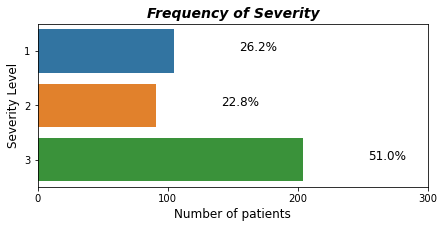

In [44]:
#Countplot of Severity (Test set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Severity', data = Test)       #palette = 'Blues'
        
plt.title (label ='Frequency of Severity',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Severity Level', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,301,100))

perc_without_hue(freq_sev, Test['Severity'])

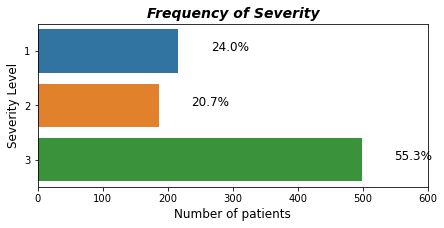

In [45]:
#Countplot of Severity (Train set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Severity', data = Train)       #palette = 'Blues'
        
plt.title (label ='Frequency of Severity',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Severity Level', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,601,100))

perc_without_hue(freq_sev, Train['Severity'])

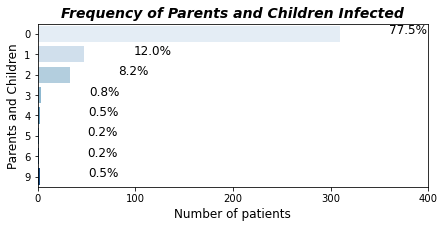

In [46]:
#Countplot of Parents_Children_Infected (Test set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Parents_Children_Infected', data = Test, palette = 'Blues')       #palette = 'Blues'
        
plt.title (label ='Frequency of Parents and Children Infected',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Parents and Children', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,401,100))

perc_without_hue(freq_sev, Test['Parents_Children_Infected'])

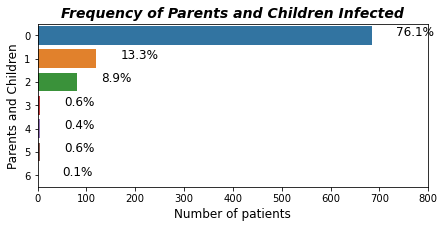

In [47]:
#Countplot of Parents_Children_Infected (Train set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Parents_Children_Infected', data = Train)       #palette = 'Blues'
        
plt.title (label ='Frequency of Parents and Children Infected',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Parents and Children', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,801,100))

perc_without_hue(freq_sev, Train['Parents_Children_Infected'])

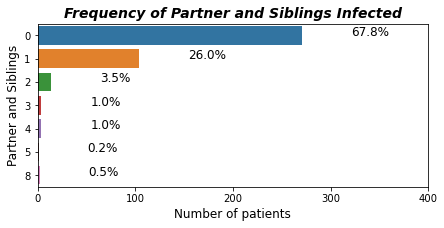

In [48]:
#Countplot of Partner_Siblings_Infected (Test set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Partner_Siblings_Infected', data = Test)       #palette = 'Blues'
        
plt.title (label ='Frequency of Partner and Siblings Infected',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Partner and Siblings', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,401,100))

perc_without_hue(freq_sev, Test['Partner_Siblings_Infected'])

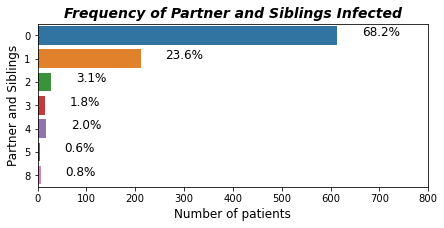

In [49]:
#Countplot of Partner_Siblings_Infected (Train set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Partner_Siblings_Infected', data = Train)       #palette = 'Blues'
        
plt.title (label ='Frequency of Partner and Siblings Infected',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Partner and Siblings', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,801,100))

perc_without_hue(freq_sev, Train['Partner_Siblings_Infected'])

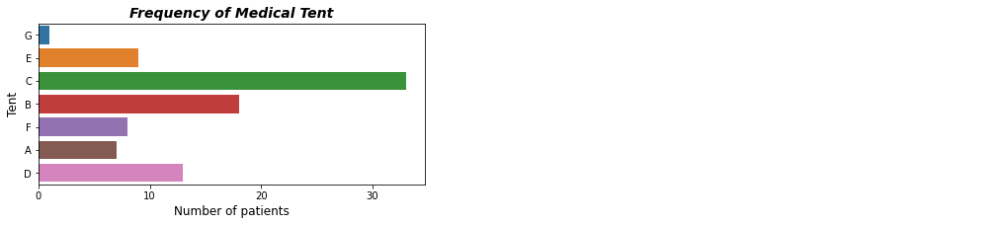

In [50]:
#Countplot of Medical_Tent (Test set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Medical_Tent', data = Test)       #palette = 'Blues'
        
plt.title (label ='Frequency of Medical Tent',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Tent', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,40,10))

perc_without_hue(freq_sev, Test['Medical_Tent'])

# NOTA: METER PERCENTAGENS NO PAINT

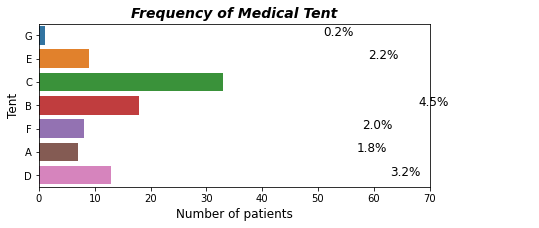

In [51]:
#Countplot of Medical_Tent (Test set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Medical_Tent', data = Test)       #palette = 'Blues'
        
plt.title (label ='Frequency of Medical Tent',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Tent', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,71,10))

perc_without_hue(freq_sev, Test['Medical_Tent'])

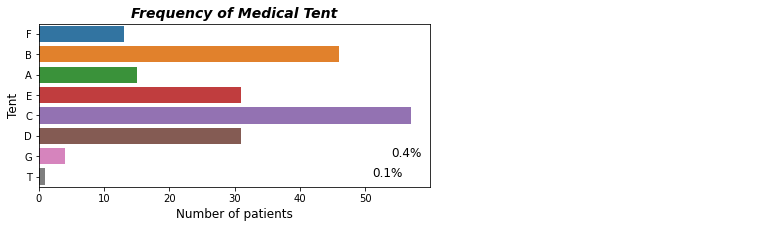

In [52]:
#Countplot of Medical_Tent (Train set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Medical_Tent', data = Train)       #palette = 'Blues'
        
plt.title (label ='Frequency of Medical Tent',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Tent', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,60,10))

perc_without_hue(freq_sev, Train['Medical_Tent'])

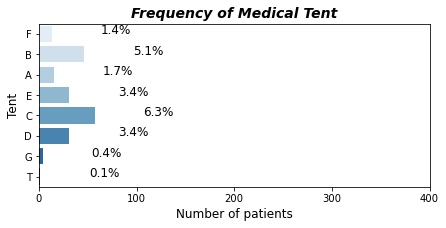

In [53]:
#Countplot of Medical_Tent (Train set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'Medical_Tent', data = Train, palette = 'Blues')       #palette = 'Blues'
        
plt.title (label ='Frequency of Medical Tent',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='Tent', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,401,100))

perc_without_hue(freq_sev, Train['Medical_Tent'])

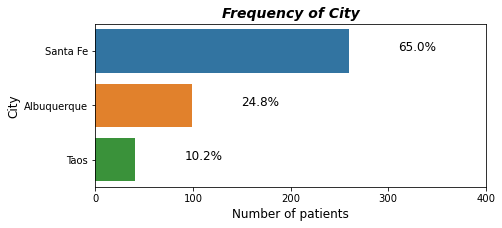

In [54]:
#Countplot of City (Test set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'City', data = Test)       #palette = 'Blues'
        
plt.title (label ='Frequency of City',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='City', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,401,100))

perc_without_hue(freq_sev, Test['City'])

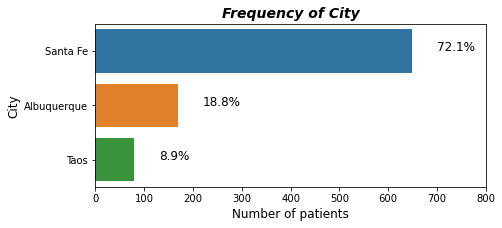

In [55]:
#Countplot of City (Train set)

plt.figure(figsize=(7,3))                                           

freq_sev = sns.countplot(y = 'City', data = Train)       #palette = 'Blues'
        
plt.title (label ='Frequency of City',
          fontsize = 14, style = 'italic', fontweight = 'bold')
plt.ylabel(ylabel ='City', fontsize = 12) 
plt.xlabel(xlabel ='Number of patients', fontsize = 12)
plt.xticks(np.arange(0,801,100))

perc_without_hue(freq_sev, Train['City'])

### <span style='color:seagreen'> •	 Bivariate Analysis

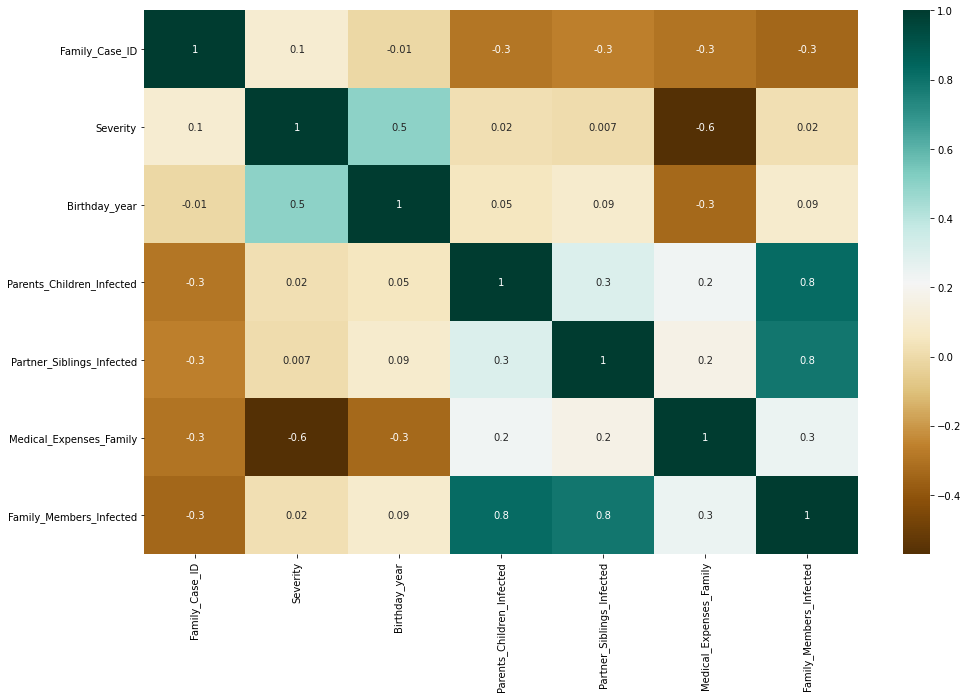

In [56]:
#Check the correlation between variables in the Test set


Test_corr = Test.copy()
corr = Test_corr.corr()
figure = plt.figure(figsize=(16,10))
sns.heatmap(data = corr, annot=True, fmt='.1g', cmap='BrBG')

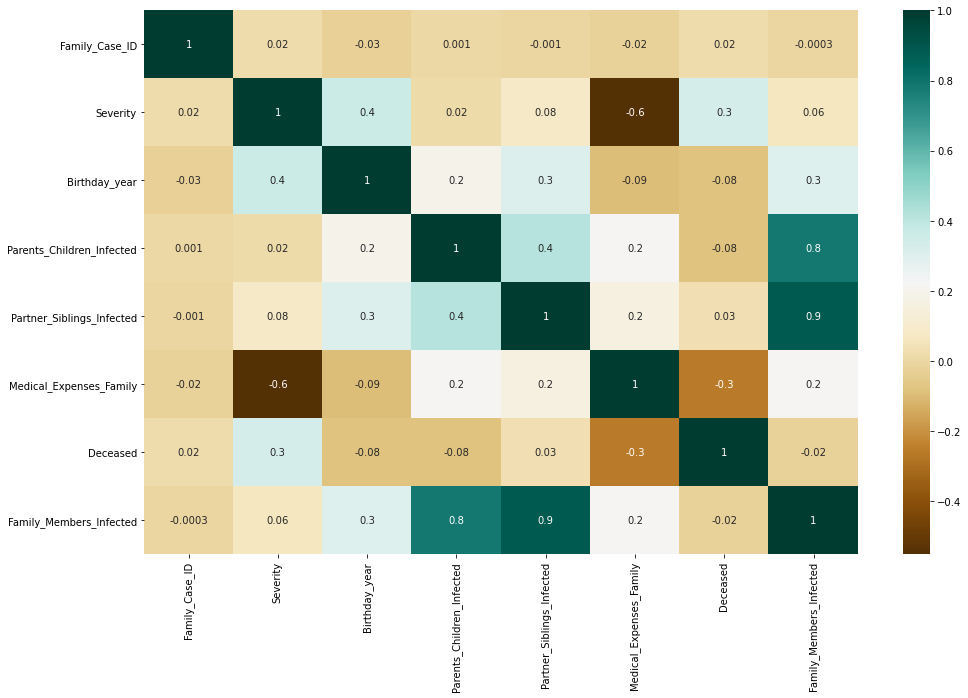

In [57]:
#Check the correlation between variables in the Train set



Train_corr = Train.copy()
corr = Train_corr.corr()
figure = plt.figure(figsize=(16,10))
sns.heatmap(data = corr, annot=True, fmt='.1g', cmap='BrBG')

In [58]:
fig = px.histogram(Train, x='Medical_Tent', color = 'Severity')
fig.show()

In [59]:
fig = px.histogram(Train, x='Medical_Tent', color = 'Deceased')
fig.show()

In [60]:
Train_no_NAN_Tent = Train[['Medical_Tent','Severity']].copy()
Train_no_NAN_Tent = Train_no_NAN_Tent.dropna()
fig = px.histogram(Train_no_NAN_Tent, x='Severity', color = 'Medical_Tent')
fig.show()

In [61]:
fig = px.histogram(Train, x='Birthday_year', color = 'Severity')
fig.show()

In [62]:
fig = px.histogram(Train, x='City', color = 'Severity')
fig.show()

In [63]:
Train_no_NAN_City = Train[['City','Severity']].copy()
Train_no_NAN_City = Train_no_NAN_City.dropna()
fig = px.histogram(Train_no_NAN_City, x='Severity', color = 'City')
fig.show()

In [64]:
fig = px.histogram(Train, x='Medical_Expenses_Family', color = 'Severity')
fig.show()

In [65]:
fig = px.histogram(Train, x='Deceased', color = 'Severity')
fig.show()

In [66]:
fig = px.histogram(Train, x='Severity', color = 'Deceased')
fig.show()

In [67]:
fig = px.histogram(Train, x='Birthday_year', color = 'Deceased')
fig.show()

In [68]:
fig = px.histogram(Train, x='Medical_Tent', color = 'Deceased')
fig.show()

In [69]:
fig = px.histogram(Train, x='Medical_Tent', color = 'Deceased')
fig.show()

In [70]:
fig = px.histogram(Train, x='City', color = 'Deceased')
fig.show()

In [71]:
Train_no_NAN_City = Train[['City','Deceased']].copy()
Train_no_NAN_City = Train_no_NAN_City.dropna()
fig = px.histogram(Train_no_NAN_City, x='Deceased', color = 'City')
fig.show()

In [72]:
Train_no_NAN_City = Train[['City','Deceased']].copy()
Train_no_NAN_City = Train_no_NAN_City.dropna()
fig = px.histogram(Train_no_NAN_City, x='Deceased', color = 'City')
fig.show()

In [73]:
Train_no_NAN_City = Train[['City','Deceased']].copy()
Train_no_NAN_City = Train_no_NAN_City.dropna()
fig = px.histogram(Train_no_NAN_City, x='Deceased', color = 'City')
fig.show()

# <span style='color:black'> Spliting the Data into Train and Validation

In [74]:
data = Train[['Family_Case_ID', 'Severity', 'Name', 'Birthday_year',
       'Parents_Children_Infected', 'Partner_Siblings_Infected',
       'Medical_Expenses_Family', 'Medical_Tent', 'City', 'Family_Members_Infected']]
target = Train['Deceased']
X_train, X_val, y_train, y_val = train_test_split(data, target, test_size = 0.2, random_state=5, stratify = target)

# <span style='color:black'> Data Pre-Processing <a class="anchor" id="Data_Pre-Processing">

## <span style='color:crimson'>  Data Cleaning <a class="anchor" id="Data_Cleaning">

### <span style='color:crimson'>  •	Missing Data <a class="anchor" id="Missing_Data">

In [75]:
#Check number of missing values in the Test set

Test.isnull().sum()

Family_Case_ID                 0
Severity                       0
Name                           0
Birthday_year                 82
Parents_Children_Infected      0
Partner_Siblings_Infected      0
Medical_Expenses_Family        0
Medical_Tent                 311
City                           0
Family_Members_Infected        0
dtype: int64

In [76]:
X_train.isnull().sum()

Family_Case_ID                 0
Severity                       0
Name                           0
Birthday_year                143
Parents_Children_Infected      0
Partner_Siblings_Infected      0
Medical_Expenses_Family        0
Medical_Tent                 558
City                           1
Family_Members_Infected        0
dtype: int64

In [77]:
#Check number of missing values in the Train set

y_train.isnull().sum()

0

In [78]:
X_val.isnull().sum()

Family_Case_ID                 0
Severity                       0
Name                           0
Birthday_year                 34
Parents_Children_Infected      0
Partner_Siblings_Infected      0
Medical_Expenses_Family        0
Medical_Tent                 144
City                           1
Family_Members_Infected        0
dtype: int64

In [79]:
y_val.isnull().sum()

0

In [80]:
#Check percentage of missing values in the Test set

Test.isna().sum()/len(Test)*100

Family_Case_ID                0.00
Severity                      0.00
Name                          0.00
Birthday_year                20.50
Parents_Children_Infected     0.00
Partner_Siblings_Infected     0.00
Medical_Expenses_Family       0.00
Medical_Tent                 77.75
City                          0.00
Family_Members_Infected       0.00
dtype: float64

In [81]:
X_train.isna().sum()/len(Test)*100

Family_Case_ID                 0.00
Severity                       0.00
Name                           0.00
Birthday_year                 35.75
Parents_Children_Infected      0.00
Partner_Siblings_Infected      0.00
Medical_Expenses_Family        0.00
Medical_Tent                 139.50
City                           0.25
Family_Members_Infected        0.00
dtype: float64

In [82]:
#Check percentage of missing values in the Train set

y_train.isna().sum()/len(Train)*100

0.0

In [83]:
X_val.isna().sum()/len(Train)*100

Family_Case_ID                0.000000
Severity                      0.000000
Name                          0.000000
Birthday_year                 3.777778
Parents_Children_Infected     0.000000
Partner_Siblings_Infected     0.000000
Medical_Expenses_Family       0.000000
Medical_Tent                 16.000000
City                          0.111111
Family_Members_Infected       0.000000
dtype: float64

In [84]:
y_val.isna().sum()/len(Train)*100

0.0

#### <span style='color:crimson'>  Medical Tent

In [85]:
#Filling the missing values with "Not Applied" in the Test set

Test['Medical_Tent'] = Test['Medical_Tent'].fillna('Not Applied')

In [86]:
Test.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected
Patient_ID,,,,,,,,,,
901,49242,3,Mr. Jody Pedro,NaN,0,0,203,Not Applied,Santa Fe,0
902,10400,3,Mr. Kevin Brent,1988.0,0,0,631,Not Applied,Santa Fe,0
903,10795,3,Mr. Frankie Cary,1981.0,1,0,376,Not Applied,Albuquerque,1
904,62440,3,Mr. Rick Pete,NaN,0,1,405,Not Applied,Albuquerque,1
905,81311,2,Mr. Matthew Erick,1996.0,0,0,378,Not Applied,Santa Fe,0


In [87]:
#Filling the missing values with "Not Applied" in the Train set

X_train['Medical_Tent'] = X_train['Medical_Tent'].fillna('Not Applied')

In [88]:
X_train.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected
Patient_ID,,,,,,,,,,
28,22832,3,Master Jeremiah Billy,NaN,0,0,217,F,Taos,0
314,18593,3,Mr. Moses Otis,1988.0,0,0,1582,Not Applied,Santa Fe,0
649,3257,2,Ms. Sue Shannon,1993.0,0,0,294,E,Santa Fe,0
375,10199,2,Mr. Jermaine Jerry,1997.0,0,0,364,Not Applied,Santa Fe,0
276,5625,1,Mr. Lonnie Don,1959.0,0,0,938,B,Santa Fe,0


In [89]:
#Filling the missing values with "Not Applied" in the Validation set

X_val['Medical_Tent'] = X_val['Medical_Tent'].fillna('Not Applied')

In [90]:
X_val.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected
Patient_ID,,,,,,,,,,
539,16773,1,Ms. Grace Natalie,1972.0,0,0,726,Not Applied,Santa Fe,0
807,2201,2,Miss Megan Marjorie,NaN,0,0,924,Not Applied,Santa Fe,0
895,9846,3,Mr. Noel Mcdougall,1993.0,0,0,243,Not Applied,Santa Fe,0
790,12635,3,Mr. Caleb Jimmy,1994.0,0,0,221,Not Applied,Santa Fe,0
466,6349,3,Miss Silvia Stacey,NaN,0,2,651,Not Applied,Taos,2


#### <span style='color:crimson'>  City

In [91]:
#Check the patient with City missingin X_train

X_train[X_train.City.isna()]

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected
Patient_ID,,,,,,,,,,
50,23155,1,Ms. Elizabeth Teri,1958.0,0,0,2240,B,NaN,0


In [92]:
#Check the patient with City missingin X_val

X_val[X_val.City.isna()]

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected
Patient_ID,,,,,,,,,,
531,23155,1,Ms. Tricia Kathryn,1982.0,0,0,2240,B,NaN,0


Now, because they are from the same Family, we will assume they need to have the same City and we will look at the patterns in both datasets at the same time

In [93]:
Test.query(' Family_Case_ID == "23155"')

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected
Patient_ID,,,,,,,,,,


In [94]:
X_train.query(' Family_Case_ID == "23155"')

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected
Patient_ID,,,,,,,,,,
50,23155,1,Ms. Elizabeth Teri,1958.0,0,0,2240,B,NaN,0


In [95]:
X_val.query(' Family_Case_ID == "23155"')

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected
Patient_ID,,,,,,,,,,
531,23155,1,Ms. Tricia Kathryn,1982.0,0,0,2240,B,NaN,0


In [96]:
#Check if there is a common city to the other patients of the tent B

for i in X_train.index:
    if X_train.at[i,'Medical_Tent']=='B': print("The city is: ", X_train.at[i,'City'])

The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Albuquerque
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Santa Fe
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  nan
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Santa Fe


In [97]:
#Check the frequency of each City

X_train['City'].value_counts()

Santa Fe       520
Albuquerque    142
Taos            57
Name: City, dtype: int64

In [98]:
#Check in each City (of the tent B), the common level of severity 

print("From Albuquerque")
for i in X_train.index:
    if X_train.at[i,'Medical_Tent']=='B' and X_train.at[i,'City']=='Albuquerque': print("The severity: ", X_train.at[i,'Severity'])
        
print("\nFrom Santa Fe")
for i in X_train.index:
    if X_train.at[i,'Medical_Tent']=='B' and X_train.at[i,'City']=='Santa Fe': print("The severity: ", X_train.at[i,'Severity'])

From Albuquerque
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1

From Santa Fe
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1


In [99]:
#Check in each City (of the tent B), if the patients tend to decease or not  

y_train_df = pd.DataFrame (y_train)


print("From Albuquerque")
for i in X_train.index:
    if X_train.at[i,'Medical_Tent']=='B' and X_train.at[i,'City']=='Albuquerque': print("The deceased is: ", y_train_df.at[i,'Deceased'])
        
print("\nFrom Santa Fe")
for i in X_train.index:
    if X_train.at[i,'Medical_Tent']=='B' and X_train.at[i,'City']=='Santa Fe': print("The deceased is: ", y_train_df.at[i,'Deceased'])

From Albuquerque
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  1
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  1
The deceased is:  1
The deceased is:  1

From Santa Fe
The deceased is:  1
The deceased is:  0
The deceased is:  1
The deceased is:  0
The deceased is:  0
The deceased is:  1
The deceased is:  1
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  1
The deceased is:  0
The deceased is:  1
The deceased is:  1


In [100]:
#Filling the missing values with the most frequent city (Santa Fe)  

X_train.at[50,'City'] = "Santa Fe"

In [101]:
X_train.at[50,'City']

'Santa Fe'

In [102]:
#Check if there is a common city to the other patients of the tent B

for i in X_val.index:
    if X_val.at[i,'Medical_Tent']=='B': print("The city is: ", X_val.at[i,'City'])

The city is:  Santa Fe
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  nan
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Albuquerque
The city is:  Santa Fe
The city is:  Santa Fe
The city is:  Albuquerque
The city is:  Santa Fe


In [103]:
#Check the frequency of each City

X_val['City'].value_counts()

Santa Fe       129
Albuquerque     27
Taos            23
Name: City, dtype: int64

In [104]:
#Check in each City (of the tent B), the common level of severity 

print("From Albuquerque")
for i in X_val.index:
    if X_val.at[i,'Medical_Tent']=='B' and X_val.at[i,'City']=='Albuquerque': print("The severity: ", X_val.at[i,'Severity'])
        
print("\nFrom Santa Fe")
for i in X_val.index:
    if X_val.at[i,'Medical_Tent']=='B' and X_val.at[i,'City']=='Santa Fe': print("The severity: ", X_val.at[i,'Severity'])

From Albuquerque
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1
The severity:  1

From Santa Fe
The severity:  1
The severity:  1
The severity:  1
The severity:  1


In [105]:
#Check in each City (of the tent B), if the patients tend to decease or not  

y_val_df = pd.DataFrame (y_val)


print("From Albuquerque")
for i in X_val.index:
    if X_val.at[i,'Medical_Tent']=='B' and X_val.at[i,'City']=='Albuquerque': print("The deceased is: ", y_val_df.at[i,'Deceased'])
        
print("\nFrom Santa Fe")
for i in X_val.index:
    if X_val.at[i,'Medical_Tent']=='B' and X_val.at[i,'City']=='Santa Fe': print("The deceased is: ", y_val_df.at[i,'Deceased'])

From Albuquerque
The deceased is:  1
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0

From Santa Fe
The deceased is:  0
The deceased is:  0
The deceased is:  0
The deceased is:  0


In [106]:
#Filling the missing values with the most frequent city (Santa Fe)  

X_val.at[531,'City'] = "Albuquerque"

In [107]:
X_val.at[531,'City']

'Albuquerque'

#### <span style='color:crimson'>  Birthday Year

In [108]:
#Split the Name into only the name and the title   

Test[['Titles','Name']] = Test['Name'].str.split(" ", n = 1, expand = True)

In [109]:
Test.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
901,49242,3,Jody Pedro,NaN,0,0,203,Not Applied,Santa Fe,0,Mr.
902,10400,3,Kevin Brent,1988.0,0,0,631,Not Applied,Santa Fe,0,Mr.
903,10795,3,Frankie Cary,1981.0,1,0,376,Not Applied,Albuquerque,1,Mr.
904,62440,3,Rick Pete,NaN,0,1,405,Not Applied,Albuquerque,1,Mr.
905,81311,2,Matthew Erick,1996.0,0,0,378,Not Applied,Santa Fe,0,Mr.


In [110]:
Test['Titles'].value_counts()

Mr.       234
Mrs.      127
Master     23
Miss       16
Name: Titles, dtype: int64

In [111]:
#Change the titles to numbers, to have a numerical string (to be able to apply KNN)    

Test['Titles_number'] = Test['Titles']
Test['Titles_number'].replace(to_replace = 'Miss',value = 1, inplace = True)
Test['Titles_number'].replace(to_replace = 'Master',value = 2, inplace = True)
Test['Titles_number'].replace(to_replace = 'Mr.',value = 3, inplace = True)
Test['Titles_number'].replace(to_replace = 'Mrs.',value = 4, inplace = True)

In [112]:
Test.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected,Titles,Titles_number
Patient_ID,,,,,,,,,,,,
901,49242,3,Jody Pedro,NaN,0,0,203,Not Applied,Santa Fe,0,Mr.,3
902,10400,3,Kevin Brent,1988.0,0,0,631,Not Applied,Santa Fe,0,Mr.,3
903,10795,3,Frankie Cary,1981.0,1,0,376,Not Applied,Albuquerque,1,Mr.,3
904,62440,3,Rick Pete,NaN,0,1,405,Not Applied,Albuquerque,1,Mr.,3
905,81311,2,Matthew Erick,1996.0,0,0,378,Not Applied,Santa Fe,0,Mr.,3


In [113]:
Test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 400 entries, 901 to 1300
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Family_Case_ID             400 non-null    int64  
 1   Severity                   400 non-null    int64  
 2   Name                       400 non-null    object 
 3   Birthday_year              318 non-null    float64
 4   Parents_Children_Infected  400 non-null    int64  
 5   Partner_Siblings_Infected  400 non-null    int64  
 6   Medical_Expenses_Family    400 non-null    int64  
 7   Medical_Tent               400 non-null    object 
 8   City                       400 non-null    object 
 9   Family_Members_Infected    400 non-null    int64  
 10  Titles                     400 non-null    object 
 11  Titles_number              400 non-null    int64  
dtypes: float64(1), int64(7), object(4)
memory usage: 60.6+ KB


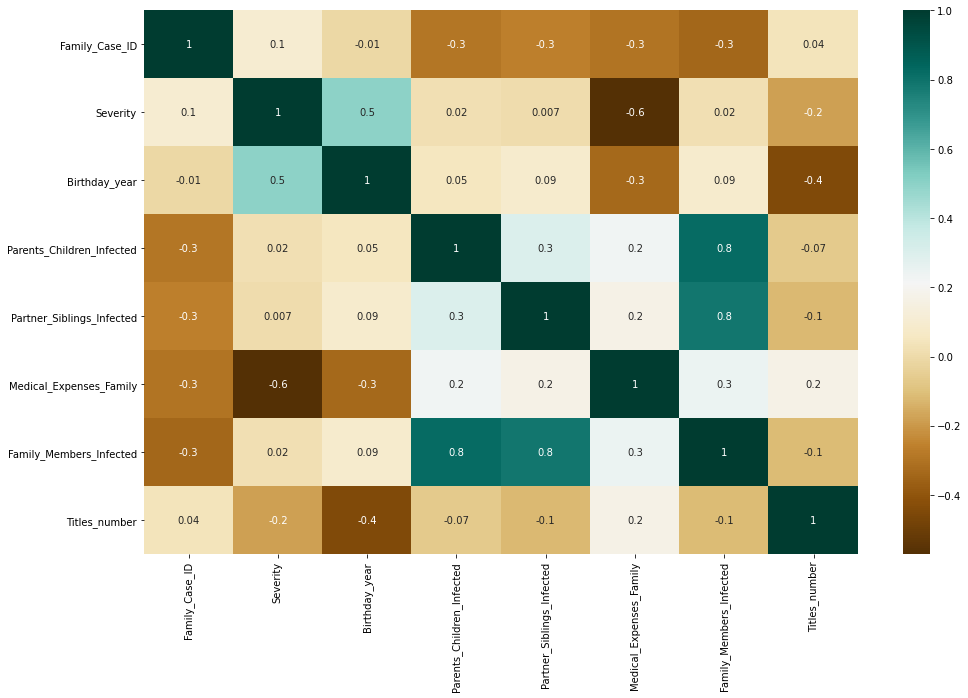

In [114]:
#Check which variables have high correlation with Birthday Year

Test_corr = Test.copy()
corr = Test_corr.corr()
figure = plt.figure(figsize=(16,10))
sns.heatmap(data = corr, annot=True, fmt='.1g', cmap='BrBG')

In [115]:
#Create the datasets needed to the KNN    

Imp_Birthday_year = Test[['Birthday_year','Severity','Medical_Expenses_Family','Titles_number']].copy()
Others=Test.copy()
Others.drop(['Birthday_year','Severity','Medical_Expenses_Family','Titles_number'],axis=1,inplace=True)

In [116]:
Imp_Birthday_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 400 entries, 901 to 1300
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Birthday_year            318 non-null    float64
 1   Severity                 400 non-null    int64  
 2   Medical_Expenses_Family  400 non-null    int64  
 3   Titles_number            400 non-null    int64  
dtypes: float64(1), int64(3)
memory usage: 15.6 KB


In [117]:
#Apply KNN to the missing values of Birthday Year    

imputer = KNNImputer(n_neighbors=5)
Imp_Birthday_year_array = imputer.fit_transform(Imp_Birthday_year)
Imp_Birthday_year = pd.DataFrame (Imp_Birthday_year_array,columns=Imp_Birthday_year.columns,index=Imp_Birthday_year.index)

In [118]:
#Join the columns used in KNN with the others    

Test=pd.concat([Imp_Birthday_year,Others],axis=1)

In [119]:
Test.isnull().sum()

Birthday_year                0
Severity                     0
Medical_Expenses_Family      0
Titles_number                0
Family_Case_ID               0
Name                         0
Parents_Children_Infected    0
Partner_Siblings_Infected    0
Medical_Tent                 0
City                         0
Family_Members_Infected      0
Titles                       0
dtype: int64

In [120]:
#Drop the column used just for KNN    

Test.drop(['Titles_number'],axis=1,inplace=True)

In [121]:
Test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 400 entries, 901 to 1300
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Birthday_year              400 non-null    float64
 1   Severity                   400 non-null    float64
 2   Medical_Expenses_Family    400 non-null    float64
 3   Family_Case_ID             400 non-null    int64  
 4   Name                       400 non-null    object 
 5   Parents_Children_Infected  400 non-null    int64  
 6   Partner_Siblings_Infected  400 non-null    int64  
 7   Medical_Tent               400 non-null    object 
 8   City                       400 non-null    object 
 9   Family_Members_Infected    400 non-null    int64  
 10  Titles                     400 non-null    object 
dtypes: float64(3), int64(4), object(4)
memory usage: 37.5+ KB


In [122]:
for i in Test.index:
    if Test.at[i, 'Birthday_year'] - int(Test.at[i, 'Birthday_year']) != 0: print("Error in patient ", i)

Error in patient  904
Error in patient  911
Error in patient  917
Error in patient  931
Error in patient  942
Error in patient  947
Error in patient  949
Error in patient  957
Error in patient  959
Error in patient  965
Error in patient  977
Error in patient  981
Error in patient  984
Error in patient  987
Error in patient  996
Error in patient  998
Error in patient  999
Error in patient  1044
Error in patient  1052
Error in patient  1055
Error in patient  1059
Error in patient  1062
Error in patient  1065
Error in patient  1071
Error in patient  1073
Error in patient  1079
Error in patient  1083
Error in patient  1091
Error in patient  1094
Error in patient  1096
Error in patient  1099
Error in patient  1101
Error in patient  1125
Error in patient  1129
Error in patient  1134
Error in patient  1140
Error in patient  1154
Error in patient  1157
Error in patient  1159
Error in patient  1172
Error in patient  1174
Error in patient  1190
Error in patient  1199
Error in patient  1202
Error

In [123]:
for i in Test.index: Test.at[i, 'Birthday_year']=round(Test.at[i, 'Birthday_year'])

In [124]:
for i in Test.index:
    if Test.at[i, 'Birthday_year'] - int(Test.at[i, 'Birthday_year']) != 0: print("Error in patient ", i)

For the X_train

In [125]:
#Split the Name into only the name and the title   

X_train[['Titles','Name']] = X_train['Name'].str.split(" ", n = 1, expand = True)

In [126]:
X_train.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
28,22832,3,Jeremiah Billy,NaN,0,0,217,F,Taos,0,Master
314,18593,3,Moses Otis,1988.0,0,0,1582,Not Applied,Santa Fe,0,Mr.
649,3257,2,Sue Shannon,1993.0,0,0,294,E,Santa Fe,0,Ms.
375,10199,2,Jermaine Jerry,1997.0,0,0,364,Not Applied,Santa Fe,0,Mr.
276,5625,1,Lonnie Don,1959.0,0,0,938,B,Santa Fe,0,Mr.


In [127]:
X_train['Titles'].value_counts()

Mr.       323
Ms.       169
Master    148
Miss       80
Name: Titles, dtype: int64

In [128]:
#Change the titles to numbers, to have a numerical string (to be able to apply KNN)    

X_train['Titles_number'] = X_train['Titles']
X_train['Titles_number'].replace(to_replace = 'Miss',value = 1, inplace = True)
X_train['Titles_number'].replace(to_replace = 'Master',value = 2, inplace = True)
X_train['Titles_number'].replace(to_replace = 'Mr.',value = 3, inplace = True)
X_train['Titles_number'].replace(to_replace = 'Ms.',value = 4, inplace = True)

In [129]:
X_train.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected,Titles,Titles_number
Patient_ID,,,,,,,,,,,,
28,22832,3,Jeremiah Billy,NaN,0,0,217,F,Taos,0,Master,2
314,18593,3,Moses Otis,1988.0,0,0,1582,Not Applied,Santa Fe,0,Mr.,3
649,3257,2,Sue Shannon,1993.0,0,0,294,E,Santa Fe,0,Ms.,4
375,10199,2,Jermaine Jerry,1997.0,0,0,364,Not Applied,Santa Fe,0,Mr.,3
276,5625,1,Lonnie Don,1959.0,0,0,938,B,Santa Fe,0,Mr.,3


In [130]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 720 entries, 28 to 673
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Family_Case_ID             720 non-null    int64  
 1   Severity                   720 non-null    int64  
 2   Name                       720 non-null    object 
 3   Birthday_year              577 non-null    float64
 4   Parents_Children_Infected  720 non-null    int64  
 5   Partner_Siblings_Infected  720 non-null    int64  
 6   Medical_Expenses_Family    720 non-null    int64  
 7   Medical_Tent               720 non-null    object 
 8   City                       720 non-null    object 
 9   Family_Members_Infected    720 non-null    int64  
 10  Titles                     720 non-null    object 
 11  Titles_number              720 non-null    int64  
dtypes: float64(1), int64(7), object(4)
memory usage: 93.1+ KB


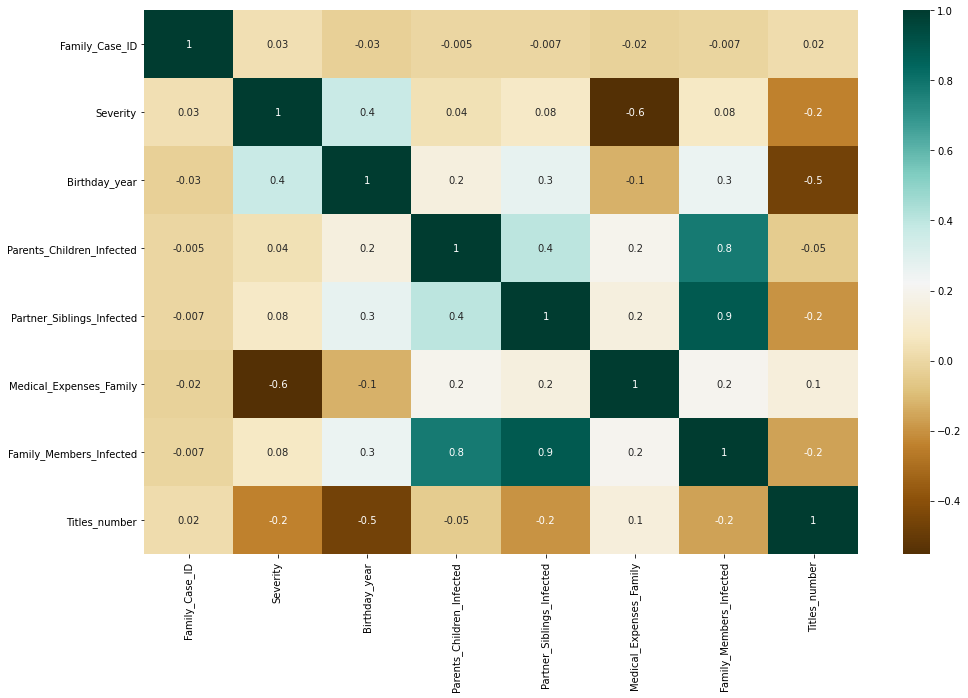

In [131]:
#Check which variables have high correlation with Birthday Year

X_train_corr = X_train.copy()
corr = X_train_corr.corr()
figure = plt.figure(figsize=(16,10))
sns.heatmap(data = corr, annot=True, fmt='.1g', cmap='BrBG')

In [132]:
#Create the datasets needed to the KNN    

Imp_Birthday_year = X_train[['Birthday_year','Severity','Family_Members_Infected','Titles_number']].copy()
Others=X_train.copy()
Others.drop(['Birthday_year','Severity','Family_Members_Infected','Titles_number'],axis=1,inplace=True)

In [133]:
Imp_Birthday_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 720 entries, 28 to 673
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Birthday_year            577 non-null    float64
 1   Severity                 720 non-null    int64  
 2   Family_Members_Infected  720 non-null    int64  
 3   Titles_number            720 non-null    int64  
dtypes: float64(1), int64(3)
memory usage: 28.1 KB


In [134]:
#Apply KNN to the missing values of Birthday Year    

imputer = KNNImputer(n_neighbors=5)
Imp_Birthday_year_array = imputer.fit_transform(Imp_Birthday_year)
Imp_Birthday_year = pd.DataFrame (Imp_Birthday_year_array,columns=Imp_Birthday_year.columns,index=Imp_Birthday_year.index)

In [135]:
#Join the columns used in KNN with the others    

X_train=pd.concat([Imp_Birthday_year,Others],axis=1)

In [136]:
X_train.isnull().sum()

Birthday_year                0
Severity                     0
Family_Members_Infected      0
Titles_number                0
Family_Case_ID               0
Name                         0
Parents_Children_Infected    0
Partner_Siblings_Infected    0
Medical_Expenses_Family      0
Medical_Tent                 0
City                         0
Titles                       0
dtype: int64

In [137]:
#Drop the column used just for KNN    

X_train.drop(['Titles_number'],axis=1,inplace=True)

In [138]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 720 entries, 28 to 673
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Birthday_year              720 non-null    float64
 1   Severity                   720 non-null    float64
 2   Family_Members_Infected    720 non-null    float64
 3   Family_Case_ID             720 non-null    int64  
 4   Name                       720 non-null    object 
 5   Parents_Children_Infected  720 non-null    int64  
 6   Partner_Siblings_Infected  720 non-null    int64  
 7   Medical_Expenses_Family    720 non-null    int64  
 8   Medical_Tent               720 non-null    object 
 9   City                       720 non-null    object 
 10  Titles                     720 non-null    object 
dtypes: float64(3), int64(4), object(4)
memory usage: 67.5+ KB


In [139]:
for i in X_train.index:
    if X_train.at[i, 'Birthday_year'] - int(X_train.at[i, 'Birthday_year']) != 0: print("Error in patient ", i)

Error in patient  28
Error in patient  650
Error in patient  96
Error in patient  443
Error in patient  129
Error in patient  698
Error in patient  444
Error in patient  308
Error in patient  57
Error in patient  407
Error in patient  230
Error in patient  62
Error in patient  496
Error in patient  600
Error in patient  1
Error in patient  250
Error in patient  295
Error in patient  848
Error in patient  136
Error in patient  516
Error in patient  486
Error in patient  483
Error in patient  499
Error in patient  37
Error in patient  596
Error in patient  149
Error in patient  239
Error in patient  16
Error in patient  317
Error in patient  359
Error in patient  24
Error in patient  10
Error in patient  202
Error in patient  870
Error in patient  21
Error in patient  347
Error in patient  15
Error in patient  433
Error in patient  429
Error in patient  66
Error in patient  213
Error in patient  817
Error in patient  815
Error in patient  287
Error in patient  40
Error in patient  41
Err

In [140]:
for i in X_train.index: X_train.at[i, 'Birthday_year']=round(X_train.at[i, 'Birthday_year'])

In [141]:
for i in X_train.index:
    if X_train.at[i, 'Birthday_year'] - int(X_train.at[i, 'Birthday_year']) != 0: print("Error in patient ", i)

For the X_val

In [142]:
#Split the Name into only the name and the title   

X_val[['Titles','Name']] = X_val['Name'].str.split(" ", n = 1, expand = True)

In [143]:
X_val.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
539,16773,1,Grace Natalie,1972.0,0,0,726,Not Applied,Santa Fe,0,Ms.
807,2201,2,Megan Marjorie,NaN,0,0,924,Not Applied,Santa Fe,0,Miss
895,9846,3,Noel Mcdougall,1993.0,0,0,243,Not Applied,Santa Fe,0,Mr.
790,12635,3,Caleb Jimmy,1994.0,0,0,221,Not Applied,Santa Fe,0,Mr.
466,6349,3,Silvia Stacey,NaN,0,2,651,Not Applied,Taos,2,Miss


In [144]:
X_val['Titles'].value_counts()

Mr.       77
Ms.       40
Master    34
Miss      29
Name: Titles, dtype: int64

In [145]:
#Change the titles to numbers, to have a numerical string (to be able to apply KNN)    

X_val['Titles_number'] = X_val['Titles']
X_val['Titles_number'].replace(to_replace = 'Miss',value = 1, inplace = True)
X_val['Titles_number'].replace(to_replace = 'Master',value = 2, inplace = True)
X_val['Titles_number'].replace(to_replace = 'Mr.',value = 3, inplace = True)
X_val['Titles_number'].replace(to_replace = 'Ms.',value = 4, inplace = True)

In [146]:
X_val.head()

,Family_Case_ID,Severity,Name,Birthday_year,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Family_Members_Infected,Titles,Titles_number
Patient_ID,,,,,,,,,,,,
539,16773,1,Grace Natalie,1972.0,0,0,726,Not Applied,Santa Fe,0,Ms.,4
807,2201,2,Megan Marjorie,NaN,0,0,924,Not Applied,Santa Fe,0,Miss,1
895,9846,3,Noel Mcdougall,1993.0,0,0,243,Not Applied,Santa Fe,0,Mr.,3
790,12635,3,Caleb Jimmy,1994.0,0,0,221,Not Applied,Santa Fe,0,Mr.,3
466,6349,3,Silvia Stacey,NaN,0,2,651,Not Applied,Taos,2,Miss,1


In [147]:
X_val.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 180 entries, 539 to 305
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Family_Case_ID             180 non-null    int64  
 1   Severity                   180 non-null    int64  
 2   Name                       180 non-null    object 
 3   Birthday_year              146 non-null    float64
 4   Parents_Children_Infected  180 non-null    int64  
 5   Partner_Siblings_Infected  180 non-null    int64  
 6   Medical_Expenses_Family    180 non-null    int64  
 7   Medical_Tent               180 non-null    object 
 8   City                       180 non-null    object 
 9   Family_Members_Infected    180 non-null    int64  
 10  Titles                     180 non-null    object 
 11  Titles_number              180 non-null    int64  
dtypes: float64(1), int64(7), object(4)
memory usage: 23.3+ KB


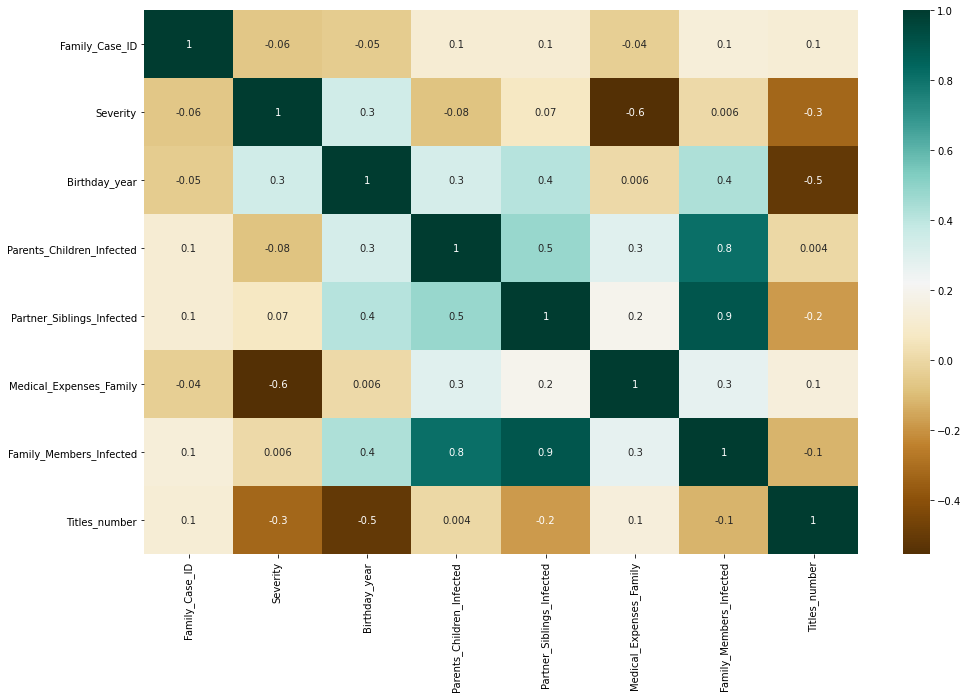

In [148]:
#Check which variables have high correlation with Birthday Year

X_val_corr = X_val.copy()
corr = X_val_corr.corr()
figure = plt.figure(figsize=(16,10))
sns.heatmap(data = corr, annot=True, fmt='.1g', cmap='BrBG')

In [149]:
#Create the datasets needed to the KNN    

Imp_Birthday_year = X_val[['Birthday_year','Severity','Family_Members_Infected','Titles_number']].copy()
Others=X_val.copy()
Others.drop(['Birthday_year','Severity','Family_Members_Infected','Titles_number'],axis=1,inplace=True)

In [150]:
Imp_Birthday_year.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 180 entries, 539 to 305
Data columns (total 4 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Birthday_year            146 non-null    float64
 1   Severity                 180 non-null    int64  
 2   Family_Members_Infected  180 non-null    int64  
 3   Titles_number            180 non-null    int64  
dtypes: float64(1), int64(3)
memory usage: 7.0 KB


In [151]:
#Apply KNN to the missing values of Birthday Year    

imputer = KNNImputer(n_neighbors=5)
Imp_Birthday_year_array = imputer.fit_transform(Imp_Birthday_year)
Imp_Birthday_year = pd.DataFrame (Imp_Birthday_year_array,columns=Imp_Birthday_year.columns,index=Imp_Birthday_year.index)

In [152]:
#Join the columns used in KNN with the others    

X_val=pd.concat([Imp_Birthday_year,Others],axis=1)

In [153]:
X_val.isnull().sum()

Birthday_year                0
Severity                     0
Family_Members_Infected      0
Titles_number                0
Family_Case_ID               0
Name                         0
Parents_Children_Infected    0
Partner_Siblings_Infected    0
Medical_Expenses_Family      0
Medical_Tent                 0
City                         0
Titles                       0
dtype: int64

In [154]:
#Drop the column used just for KNN    

X_val.drop(['Titles_number'],axis=1,inplace=True)

In [155]:
X_val.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 180 entries, 539 to 305
Data columns (total 11 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Birthday_year              180 non-null    float64
 1   Severity                   180 non-null    float64
 2   Family_Members_Infected    180 non-null    float64
 3   Family_Case_ID             180 non-null    int64  
 4   Name                       180 non-null    object 
 5   Parents_Children_Infected  180 non-null    int64  
 6   Partner_Siblings_Infected  180 non-null    int64  
 7   Medical_Expenses_Family    180 non-null    int64  
 8   Medical_Tent               180 non-null    object 
 9   City                       180 non-null    object 
 10  Titles                     180 non-null    object 
dtypes: float64(3), int64(4), object(4)
memory usage: 16.9+ KB


In [156]:
for i in X_val.index:
    if X_val.at[i, 'Birthday_year'] - int(X_val.at[i, 'Birthday_year']) != 0: print("Error in patient ", i)

Error in patient  807
Error in patient  466
Error in patient  268
Error in patient  273
Error in patient  135
Error in patient  792
Error in patient  448
Error in patient  565
Error in patient  299
Error in patient  887
Error in patient  729
Error in patient  152
Error in patient  373
Error in patient  111
Error in patient  297
Error in patient  459
Error in patient  113
Error in patient  488
Error in patient  47
Error in patient  196
Error in patient  90
Error in patient  794
Error in patient  427
Error in patient  51
Error in patient  112
Error in patient  380
Error in patient  524
Error in patient  831
Error in patient  173
Error in patient  356
Error in patient  756
Error in patient  290
Error in patient  475
Error in patient  305


In [157]:
for i in X_val.index: X_val.at[i, 'Birthday_year']=round(X_val.at[i, 'Birthday_year'])

In [158]:
for i in X_val.index:
    if X_val.at[i, 'Birthday_year'] - int(X_val.at[i, 'Birthday_year']) != 0: print("Error in patient ", i)

#  

#### <span style='color:crimson'>  Change of Data Types

In [159]:
#Change the Data Type in the Test Set    

Test['Family_Case_ID'] = Test['Family_Case_ID'].astype('int32')
Test['Severity'] = Test['Severity'].astype('int8')
Test['Birthday_year'] = Test['Birthday_year'].astype('int16')
Test['Parents_Children_Infected'] = Test['Parents_Children_Infected'].astype('int8')
Test['Partner_Siblings_Infected'] = Test['Partner_Siblings_Infected'].astype('int8')
Test['Medical_Expenses_Family'] = Test['Medical_Expenses_Family'].astype('int16')

In [160]:
#Change the Data Type in the Train Set    

X_train['Family_Case_ID'] = X_train['Family_Case_ID'].astype('int32')
X_train['Severity'] = X_train['Severity'].astype('int8')
X_train['Birthday_year'] = X_train['Birthday_year'].astype('int16')
X_train['Parents_Children_Infected'] = X_train['Parents_Children_Infected'].astype('int8')
X_train['Partner_Siblings_Infected'] = X_train['Partner_Siblings_Infected'].astype('int8')
X_train['Medical_Expenses_Family'] = X_train['Medical_Expenses_Family'].astype('int16')

In [161]:
#Change the Data Type in the Train Set    

X_val['Family_Case_ID'] = X_val['Family_Case_ID'].astype('int32')
X_val['Severity'] = X_val['Severity'].astype('int8')
X_val['Birthday_year'] = X_val['Birthday_year'].astype('int16')
X_val['Parents_Children_Infected'] = X_val['Parents_Children_Infected'].astype('int8')
X_val['Partner_Siblings_Infected'] = X_val['Partner_Siblings_Infected'].astype('int8')
X_val['Medical_Expenses_Family'] = X_val['Medical_Expenses_Family'].astype('int16')

#  

### <span style='color:crimson'>  •	Errors and Inconsistencies <a class="anchor" id="Errors_Inconsistencies">

In [162]:
#Check if the total Number of Members in a family have only possible numbers (positive and integer) in Test Set

Test['Family_Members_Infected'].value_counts()

0     241
1      72
2      53
3      14
4       7
10      4
6       4
5       3
7       2
Name: Family_Members_Infected, dtype: int64

In [163]:
#Check if the total Number of Members in a family have only possible numbers (positive and integer) in Train Set

X_train['Family_Members_Infected'].value_counts()

0.0     437
1.0     131
2.0      84
3.0      21
5.0      16
4.0      11
6.0       8
10.0      7
7.0       5
Name: Family_Members_Infected, dtype: int64

In [164]:
#Check if the total Number of Members in a family have only possible numbers (positive and integer) in Train Set

X_val['Family_Members_Infected'].value_counts()

0.0    106
1.0     31
2.0     20
3.0      8
5.0      6
4.0      4
6.0      4
7.0      1
Name: Family_Members_Infected, dtype: int64

In [165]:
#Check the classes of Titles in the Test Set   

Test['Titles'].value_counts()

Mr.       234
Mrs.      127
Master     23
Miss       16
Name: Titles, dtype: int64

In [166]:
#Check the classes of Titles in the Train Set   

X_train['Titles'].value_counts()

Mr.       323
Ms.       169
Master    148
Miss       80
Name: Titles, dtype: int64

In [167]:
#Check the classes of Titles in the Train Set   

X_val['Titles'].value_counts()

Mr.       77
Ms.       40
Master    34
Miss      29
Name: Titles, dtype: int64

In [168]:
#Solve the inconsistency by replacing the Ms. with Mrs.   

X_train['Titles'].replace(to_replace = ['Ms.'], value = 'Mrs.', inplace = True)

In [169]:
#Solve the inconsistency by replacing the Ms. with Mrs.   

X_val['Titles'].replace(to_replace = ['Ms.'], value = 'Mrs.', inplace = True)

In [170]:
#Check if the Birth Year is in the proper period (from 1900 to 2021) in the Test Set

for i in Test.index:
    if Test.at[i,'Birthday_year'] < 1900: print("Error in patient", i)
    if Test.at[i,'Birthday_year']>2021: print("Error in patient", i)

In [171]:
#Check if the Birth Year is in the proper period (from 1900 to 2021) in the Train Set

for i in X_train.index:
    if 1900>X_train.at[i,'Birthday_year'] or X_train.at[i,'Birthday_year']>2021: print("Error in patient", i)

In [172]:
#Check if the Birth Year is in the proper period (from 1900 to 2021) in the Train Set

for i in X_val.index:
    if 1900>X_val.at[i,'Birthday_year'] or X_val.at[i,'Birthday_year']>2021: print("Error in patient", i)

In the X_train Set

In [173]:
#Check if patients from the same family have the same expenses in Train Set

Families_errors = []

for i in X_train.index:
    for j in X_train.index:
        if X_train.at[i,'Family_Case_ID']==X_train.at[j,'Family_Case_ID']:
            if X_train.at[i,'Medical_Expenses_Family']!=X_train.at[j,'Medical_Expenses_Family']:
                print("Error in family", X_train.at[i,'Family_Case_ID'])
                Families_errors.append(X_train.at[i,'Family_Case_ID'])

Error in family 14355
Error in family 21356
Error in family 21356
Error in family 21038
Error in family 4680
Error in family 4680
Error in family 8483
Error in family 6649
Error in family 10289
Error in family 10289
Error in family 4680
Error in family 8207
Error in family 8483
Error in family 4680
Error in family 4680
Error in family 4680
Error in family 10289
Error in family 11650
Error in family 6649
Error in family 10289
Error in family 18812
Error in family 21038
Error in family 14355
Error in family 8207
Error in family 18812
Error in family 11650


In [174]:
#Creating a list with the Families IDs with inconsistencies

Families_errors = list( dict.fromkeys(Families_errors) )
Families_errors

[14355, 21356, 21038, 4680, 8483, 6649, 10289, 8207, 11650, 18812]

In [175]:
#Create a copy of Train set to define an option to solve the inconsistency

X_train_Sum_expenses = X_train.copy()
X_train_Family_ID = X_train.copy()
X_train_Dominant = X_train.copy()
X_train_Mix = X_train.copy()

In [176]:
#Check the last Family ID to define new ones later

X_train['Family_Case_ID'].max()

742836

In [177]:
#Check the last Family ID to define new ones later

X_val['Family_Case_ID'].max()

24260

In [178]:
Test['Family_Case_ID'].max()

128562

In [179]:
X_train.query(' Family_Case_ID == "14355"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
292,2000,3,0.0,14355,Ignacio Evan,0,0,276,Not Applied,Santa Fe,Mr.
54,2004,3,0.0,14355,Ernesto Alfredo,0,0,258,Not Applied,Santa Fe,Master


In [180]:
X_train_Sum_expenses.at[54,'Medical_Expenses_Family']=X_train.at[54,'Medical_Expenses_Family'] + X_train.at[292,'Medical_Expenses_Family']
X_train_Sum_expenses.at[292,'Medical_Expenses_Family']=X_train.at[54,'Medical_Expenses_Family'] + X_train.at[292,'Medical_Expenses_Family']

In [181]:
X_train_Sum_expenses.query(' Family_Case_ID == "14355"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
292,2000,3,0.0,14355,Ignacio Evan,0,0,534,Not Applied,Santa Fe,Mr.
54,2004,3,0.0,14355,Ernesto Alfredo,0,0,534,Not Applied,Santa Fe,Master


In [182]:
X_train_Family_ID.at[292,'Family_Case_ID']=742837

In [183]:
X_train_Family_ID.query(' Family_Case_ID == "14355"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
54,2004,3,0.0,14355,Ernesto Alfredo,0,0,258,Not Applied,Santa Fe,Master


In [184]:
X_train_Dominant.at[54,'Medical_Expenses_Family']=(X_train.at[54,'Medical_Expenses_Family'] + X_train.at[292,'Medical_Expenses_Family'])/2
X_train_Dominant.at[292,'Medical_Expenses_Family']=(X_train.at[54,'Medical_Expenses_Family'] + X_train.at[292,'Medical_Expenses_Family'])/2

In [185]:
X_train_Dominant.query(' Family_Case_ID == "14355"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
292,2000,3,0.0,14355,Ignacio Evan,0,0,267,Not Applied,Santa Fe,Mr.
54,2004,3,0.0,14355,Ernesto Alfredo,0,0,267,Not Applied,Santa Fe,Master


In [186]:
X_train_Mix.at[54,'Medical_Expenses_Family']=(X_train.at[54,'Medical_Expenses_Family'] + X_train.at[292,'Medical_Expenses_Family'])/2
X_train_Mix.at[292,'Medical_Expenses_Family']=(X_train.at[54,'Medical_Expenses_Family'] + X_train.at[292,'Medical_Expenses_Family'])/2

In [187]:
X_train_Mix.query(' Family_Case_ID == "14355"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
292,2000,3,0.0,14355,Ignacio Evan,0,0,267,Not Applied,Santa Fe,Mr.
54,2004,3,0.0,14355,Ernesto Alfredo,0,0,267,Not Applied,Santa Fe,Master


In [188]:
X_train.query(' Family_Case_ID == "21356"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
698,2005,3,0.0,21356,Benny Danny,0,0,243,Not Applied,Santa Fe,Master
394,1988,1,0.0,21356,Dave Donald,0,0,854,B,Albuquerque,Mr.


In [189]:
X_train_Sum_expenses.at[394,'Medical_Expenses_Family']=X_train.at[394,'Medical_Expenses_Family'] + X_train.at[698,'Medical_Expenses_Family']
X_train_Sum_expenses.at[698,'Medical_Expenses_Family']=X_train.at[394,'Medical_Expenses_Family'] + X_train.at[698,'Medical_Expenses_Family']

In [190]:
X_train_Sum_expenses.query(' Family_Case_ID == "21356"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
698,2005,3,0.0,21356,Benny Danny,0,0,1097,Not Applied,Santa Fe,Master
394,1988,1,0.0,21356,Dave Donald,0,0,1097,B,Albuquerque,Mr.


In [191]:
X_train_Family_ID.at[698,'Family_Case_ID']=742838

In [192]:
X_train_Family_ID.query(' Family_Case_ID == "21356"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
394,1988,1,0.0,21356,Dave Donald,0,0,854,B,Albuquerque,Mr.


In [193]:
X_train_Dominant.at[394,'Medical_Expenses_Family']=(X_train.at[394,'Medical_Expenses_Family'] + X_train.at[698,'Medical_Expenses_Family'])/2
X_train_Dominant.at[698,'Medical_Expenses_Family']=(X_train.at[394,'Medical_Expenses_Family'] + X_train.at[698,'Medical_Expenses_Family'])/2

In [194]:
X_train_Dominant.query(' Family_Case_ID == "21356"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
698,2005,3,0.0,21356,Benny Danny,0,0,548,Not Applied,Santa Fe,Master
394,1988,1,0.0,21356,Dave Donald,0,0,548,B,Albuquerque,Mr.


In [195]:
X_train_Mix.at[698,'Family_Case_ID']=742838

In [196]:
X_train_Mix.query(' Family_Case_ID == "21356"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
394,1988,1,0.0,21356,Dave Donald,0,0,854,B,Albuquerque,Mr.


In [197]:
X_train.query(' Family_Case_ID == "21038"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
295,2005,3,0.0,21038,Seth Fredrick,0,0,217,Not Applied,Taos,Master
422,1990,2,0.0,21038,Donnie Noah,0,0,364,Not Applied,Santa Fe,Mr.


In [198]:
X_train_Sum_expenses.at[295,'Medical_Expenses_Family']=X_train.at[295,'Medical_Expenses_Family'] + X_train.at[422,'Medical_Expenses_Family']
X_train_Sum_expenses.at[422,'Medical_Expenses_Family']=X_train.at[295,'Medical_Expenses_Family'] + X_train.at[422,'Medical_Expenses_Family']

In [199]:
X_train_Sum_expenses.query(' Family_Case_ID == "21038"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
295,2005,3,0.0,21038,Seth Fredrick,0,0,581,Not Applied,Taos,Master
422,1990,2,0.0,21038,Donnie Noah,0,0,581,Not Applied,Santa Fe,Mr.


In [200]:
X_train_Family_ID.at[422,'Family_Case_ID']=742839

In [201]:
X_train_Family_ID.query(' Family_Case_ID == "21038"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
295,2005,3,0.0,21038,Seth Fredrick,0,0,217,Not Applied,Taos,Master


In [202]:
X_train_Dominant.at[295,'Medical_Expenses_Family']=(X_train.at[295,'Medical_Expenses_Family'] + X_train.at[422,'Medical_Expenses_Family'])/2
X_train_Dominant.at[422,'Medical_Expenses_Family']=(X_train.at[295,'Medical_Expenses_Family'] + X_train.at[422,'Medical_Expenses_Family'])/2

In [203]:
X_train_Dominant.query(' Family_Case_ID == "21038"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
295,2005,3,0.0,21038,Seth Fredrick,0,0,290,Not Applied,Taos,Master
422,1990,2,0.0,21038,Donnie Noah,0,0,290,Not Applied,Santa Fe,Mr.


In [204]:
X_train_Mix.at[422,'Family_Case_ID']=742839

In [205]:
X_train_Mix.query(' Family_Case_ID == "21038"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
295,2005,3,0.0,21038,Seth Fredrick,0,0,217,Not Applied,Taos,Master


In [206]:
X_train.query(' Family_Case_ID == "4680"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
88,1996,1,5.0,4680,Nicole Heidi,2,3,7364,C,Santa Fe,Mrs.
69,1956,1,5.0,4680,Simon Mario,4,1,7364,C,Santa Fe,Mr.
779,2001,1,5.0,4680,Jerry Hector,2,3,7364,C,Santa Fe,Mr.
834,1990,2,0.0,4680,Curtis Wayne,0,0,364,Not Applied,Santa Fe,Mr.


In [207]:
X_train_Sum_expenses.at[69,'Medical_Expenses_Family'] = X_train.at[69,'Medical_Expenses_Family'] + X_train.at[834,'Medical_Expenses_Family']
X_train_Sum_expenses.at[88,'Medical_Expenses_Family'] = X_train.at[69,'Medical_Expenses_Family'] + X_train.at[834,'Medical_Expenses_Family']
X_train_Sum_expenses.at[779,'Medical_Expenses_Family'] = X_train.at[69,'Medical_Expenses_Family'] + X_train.at[834,'Medical_Expenses_Family']
X_train_Sum_expenses.at[834,'Medical_Expenses_Family'] = X_train.at[69,'Medical_Expenses_Family'] + X_train.at[834,'Medical_Expenses_Family']

In [208]:
X_train_Sum_expenses.query(' Family_Case_ID == "4680"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
88,1996,1,5.0,4680,Nicole Heidi,2,3,7728,C,Santa Fe,Mrs.
69,1956,1,5.0,4680,Simon Mario,4,1,7728,C,Santa Fe,Mr.
779,2001,1,5.0,4680,Jerry Hector,2,3,7728,C,Santa Fe,Mr.
834,1990,2,0.0,4680,Curtis Wayne,0,0,7728,Not Applied,Santa Fe,Mr.


In [209]:
X_train_Family_ID.at[834,'Family_Case_ID']=742840

In [210]:
X_train_Family_ID.query(' Family_Case_ID == "4680"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
88,1996,1,5.0,4680,Nicole Heidi,2,3,7364,C,Santa Fe,Mrs.
69,1956,1,5.0,4680,Simon Mario,4,1,7364,C,Santa Fe,Mr.
779,2001,1,5.0,4680,Jerry Hector,2,3,7364,C,Santa Fe,Mr.


In [211]:
X_train_Dominant.at[834,'Medical_Expenses_Family']=7364

In [212]:
X_train_Dominant.query(' Family_Case_ID == "4680"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
88,1996,1,5.0,4680,Nicole Heidi,2,3,7364,C,Santa Fe,Mrs.
69,1956,1,5.0,4680,Simon Mario,4,1,7364,C,Santa Fe,Mr.
779,2001,1,5.0,4680,Jerry Hector,2,3,7364,C,Santa Fe,Mr.
834,1990,2,0.0,4680,Curtis Wayne,0,0,7364,Not Applied,Santa Fe,Mr.


In [213]:
X_train_Mix.at[834,'Medical_Expenses_Family']=7364

In [214]:
X_train_Mix.query(' Family_Case_ID == "4680"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
88,1996,1,5.0,4680,Nicole Heidi,2,3,7364,C,Santa Fe,Mrs.
69,1956,1,5.0,4680,Simon Mario,4,1,7364,C,Santa Fe,Mr.
779,2001,1,5.0,4680,Jerry Hector,2,3,7364,C,Santa Fe,Mr.
834,1990,2,0.0,4680,Curtis Wayne,0,0,7364,Not Applied,Santa Fe,Mr.


In [215]:
X_train.query(' Family_Case_ID == "8483"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
147,2019,3,1.0,8483,Ian Darnell,1,0,238,Not Applied,Albuquerque,Master
105,1998,3,0.0,8483,Daryl Wilbur,0,0,202,Not Applied,Albuquerque,Mr.


In [216]:
X_train_Sum_expenses.at[105,'Medical_Expenses_Family']=X_train.at[105,'Medical_Expenses_Family'] + X_train.at[147,'Medical_Expenses_Family']
X_train_Sum_expenses.at[147,'Medical_Expenses_Family']=X_train.at[105,'Medical_Expenses_Family'] + X_train.at[147,'Medical_Expenses_Family']

In [217]:
X_train_Sum_expenses.query(' Family_Case_ID == "8483"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
147,2019,3,1.0,8483,Ian Darnell,1,0,440,Not Applied,Albuquerque,Master
105,1998,3,0.0,8483,Daryl Wilbur,0,0,440,Not Applied,Albuquerque,Mr.


In [218]:
X_train_Family_ID.at[147,'Family_Case_ID']=742841

In [219]:
X_train_Family_ID.query(' Family_Case_ID == "8483"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
105,1998,3,0.0,8483,Daryl Wilbur,0,0,202,Not Applied,Albuquerque,Mr.


In [220]:
X_train_Dominant.at[105,'Medical_Expenses_Family']=(X_train.at[105,'Medical_Expenses_Family'] + X_train.at[147,'Medical_Expenses_Family'])/2
X_train_Dominant.at[147,'Medical_Expenses_Family']=(X_train.at[105,'Medical_Expenses_Family'] + X_train.at[147,'Medical_Expenses_Family'])/2

In [221]:
X_train_Dominant.query(' Family_Case_ID == "8483"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
147,2019,3,1.0,8483,Ian Darnell,1,0,220,Not Applied,Albuquerque,Master
105,1998,3,0.0,8483,Daryl Wilbur,0,0,220,Not Applied,Albuquerque,Mr.


In [222]:
X_train_Mix.at[105,'Medical_Expenses_Family']=(X_train.at[105,'Medical_Expenses_Family'] + X_train.at[147,'Medical_Expenses_Family'])/2
X_train_Mix.at[147,'Medical_Expenses_Family']=(X_train.at[105,'Medical_Expenses_Family'] + X_train.at[147,'Medical_Expenses_Family'])/2

In [223]:
X_train_Mix.query(' Family_Case_ID == "8483"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
147,2019,3,1.0,8483,Ian Darnell,1,0,220,Not Applied,Albuquerque,Master
105,1998,3,0.0,8483,Daryl Wilbur,0,0,220,Not Applied,Albuquerque,Mr.


In [224]:
X_train.query(' Family_Case_ID == "6649"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
58,1970,3,0.0,6649,Noah Luther,0,0,225,Not Applied,Santa Fe,Mr.
289,2005,3,0.0,6649,Curtis Joe,0,0,221,Not Applied,Santa Fe,Master


In [225]:
X_train_Sum_expenses.at[58,'Medical_Expenses_Family']=X_train.at[58,'Medical_Expenses_Family'] + X_train.at[289,'Medical_Expenses_Family']
X_train_Sum_expenses.at[289,'Medical_Expenses_Family']=X_train.at[58,'Medical_Expenses_Family'] + X_train.at[289,'Medical_Expenses_Family']

In [226]:
X_train_Sum_expenses.query(' Family_Case_ID == "6649"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
58,1970,3,0.0,6649,Noah Luther,0,0,446,Not Applied,Santa Fe,Mr.
289,2005,3,0.0,6649,Curtis Joe,0,0,446,Not Applied,Santa Fe,Master


In [227]:
X_train_Family_ID.at[289,'Family_Case_ID']=742842

In [228]:
X_train_Family_ID.query(' Family_Case_ID == "6649"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
58,1970,3,0.0,6649,Noah Luther,0,0,225,Not Applied,Santa Fe,Mr.


In [229]:
X_train_Dominant.at[58,'Medical_Expenses_Family']=(X_train.at[58,'Medical_Expenses_Family'] + X_train.at[289,'Medical_Expenses_Family'])/2
X_train_Dominant.at[289,'Medical_Expenses_Family']=(X_train.at[58,'Medical_Expenses_Family'] + X_train.at[289,'Medical_Expenses_Family'])/2

In [230]:
X_train_Dominant.query(' Family_Case_ID == "6649"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
58,1970,3,0.0,6649,Noah Luther,0,0,223,Not Applied,Santa Fe,Mr.
289,2005,3,0.0,6649,Curtis Joe,0,0,223,Not Applied,Santa Fe,Master


In [231]:
X_train_Mix.at[58,'Medical_Expenses_Family']=(X_train.at[58,'Medical_Expenses_Family'] + X_train.at[289,'Medical_Expenses_Family'])/2
X_train_Mix.at[289,'Medical_Expenses_Family']=(X_train.at[58,'Medical_Expenses_Family'] + X_train.at[289,'Medical_Expenses_Family'])/2

In [232]:
X_train_Mix.query(' Family_Case_ID == "6649"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
58,1970,3,0.0,6649,Noah Luther,0,0,223,Not Applied,Santa Fe,Mr.
289,2005,3,0.0,6649,Curtis Joe,0,0,223,Not Applied,Santa Fe,Master


In [233]:
X_train.query(' Family_Case_ID == "10289"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
572,1985,3,0.0,10289,Pedro Johnny,0,0,200,Not Applied,Santa Fe,Mr.
670,1996,1,0.0,10289,Myra Peggy,0,0,1940,B,Albuquerque,Mrs.
370,1996,1,0.0,10289,Shelly Kristi,0,0,1940,B,Albuquerque,Mrs.


In [234]:
X_train_Sum_expenses.at[370,'Medical_Expenses_Family']=X_train.at[370,'Medical_Expenses_Family'] + X_train.at[572,'Medical_Expenses_Family']
X_train_Sum_expenses.at[572,'Medical_Expenses_Family']=X_train.at[370,'Medical_Expenses_Family'] + X_train.at[572,'Medical_Expenses_Family']
X_train_Sum_expenses.at[670,'Medical_Expenses_Family']=X_train.at[370,'Medical_Expenses_Family'] + X_train.at[572,'Medical_Expenses_Family']

In [235]:
X_train_Sum_expenses.query(' Family_Case_ID == "10289"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
572,1985,3,0.0,10289,Pedro Johnny,0,0,2140,Not Applied,Santa Fe,Mr.
670,1996,1,0.0,10289,Myra Peggy,0,0,2140,B,Albuquerque,Mrs.
370,1996,1,0.0,10289,Shelly Kristi,0,0,2140,B,Albuquerque,Mrs.


In [236]:
X_train_Family_ID.at[572,'Family_Case_ID']=742843

In [237]:
X_train_Family_ID.query(' Family_Case_ID == "10289"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
670,1996,1,0.0,10289,Myra Peggy,0,0,1940,B,Albuquerque,Mrs.
370,1996,1,0.0,10289,Shelly Kristi,0,0,1940,B,Albuquerque,Mrs.


In [238]:
X_train_Dominant.at[572,'Medical_Expenses_Family']=1940

In [239]:
X_train_Dominant.query(' Family_Case_ID == "10289"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
572,1985,3,0.0,10289,Pedro Johnny,0,0,1940,Not Applied,Santa Fe,Mr.
670,1996,1,0.0,10289,Myra Peggy,0,0,1940,B,Albuquerque,Mrs.
370,1996,1,0.0,10289,Shelly Kristi,0,0,1940,B,Albuquerque,Mrs.


In [240]:
X_train_Mix.at[572,'Family_Case_ID']=742843

In [241]:
X_train_Mix.query(' Family_Case_ID == "10289"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
670,1996,1,0.0,10289,Myra Peggy,0,0,1940,B,Albuquerque,Mrs.
370,1996,1,0.0,10289,Shelly Kristi,0,0,1940,B,Albuquerque,Mrs.


In [242]:
X_train.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
213,2010,3,2.0,8207,Samuel Julius,0,2,607,Not Applied,Albuquerque,Master
255,1989,3,1.0,8207,Rosa Angie,0,1,504,Not Applied,Santa Fe,Mrs.


In [243]:
X_train_Sum_expenses.at[213,'Medical_Expenses_Family']=X_train.at[213,'Medical_Expenses_Family'] + X_train.at[255,'Medical_Expenses_Family']
X_train_Sum_expenses.at[255,'Medical_Expenses_Family']=X_train.at[213,'Medical_Expenses_Family'] + X_train.at[255,'Medical_Expenses_Family']

In [244]:
X_train_Sum_expenses.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
213,2010,3,2.0,8207,Samuel Julius,0,2,1111,Not Applied,Albuquerque,Master
255,1989,3,1.0,8207,Rosa Angie,0,1,1111,Not Applied,Santa Fe,Mrs.


In [245]:
X_train_Family_ID.at[255,'Family_Case_ID']=742844

In [246]:
X_train_Family_ID.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
213,2010,3,2.0,8207,Samuel Julius,0,2,607,Not Applied,Albuquerque,Master


In [247]:
X_train_Dominant.at[213,'Medical_Expenses_Family']=(X_train.at[213,'Medical_Expenses_Family'] + X_train.at[255,'Medical_Expenses_Family'])/2
X_train_Dominant.at[255,'Medical_Expenses_Family']=(X_train.at[213,'Medical_Expenses_Family'] + X_train.at[255,'Medical_Expenses_Family'])/2

In [248]:
X_train_Dominant.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
213,2010,3,2.0,8207,Samuel Julius,0,2,555,Not Applied,Albuquerque,Master
255,1989,3,1.0,8207,Rosa Angie,0,1,555,Not Applied,Santa Fe,Mrs.


In [249]:
X_train_Mix.at[255,'Family_Case_ID']=742844

In [250]:
X_train_Mix.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
213,2010,3,2.0,8207,Samuel Julius,0,2,607,Not Applied,Albuquerque,Master


In [251]:
X_train.query(' Family_Case_ID == "11650"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
420,1996,3,0.0,11650,Warren Cary,0,0,210,Not Applied,Santa Fe,Mr.
449,1995,2,2.0,11650,Juanita Virginia,1,1,840,Not Applied,Santa Fe,Mrs.


In [252]:
X_train_Sum_expenses.at[420,'Medical_Expenses_Family']=X_train.at[420,'Medical_Expenses_Family'] + X_train.at[449,'Medical_Expenses_Family']
X_train_Sum_expenses.at[449,'Medical_Expenses_Family']=X_train.at[420,'Medical_Expenses_Family'] + X_train.at[449,'Medical_Expenses_Family']

In [253]:
X_train_Sum_expenses.query(' Family_Case_ID == "11650"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
420,1996,3,0.0,11650,Warren Cary,0,0,1050,Not Applied,Santa Fe,Mr.
449,1995,2,2.0,11650,Juanita Virginia,1,1,1050,Not Applied,Santa Fe,Mrs.


In [254]:
X_train_Family_ID.at[449,'Family_Case_ID']=742845

In [255]:
X_train_Family_ID.query(' Family_Case_ID == "11650"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
420,1996,3,0.0,11650,Warren Cary,0,0,210,Not Applied,Santa Fe,Mr.


In [256]:
X_train_Dominant.at[420,'Medical_Expenses_Family']=(X_train.at[420,'Medical_Expenses_Family'] + X_train.at[449,'Medical_Expenses_Family'])/2
X_train_Dominant.at[449,'Medical_Expenses_Family']=(X_train.at[420,'Medical_Expenses_Family'] + X_train.at[449,'Medical_Expenses_Family'])/2

In [257]:
X_train_Dominant.query(' Family_Case_ID == "11650"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
420,1996,3,0.0,11650,Warren Cary,0,0,525,Not Applied,Santa Fe,Mr.
449,1995,2,2.0,11650,Juanita Virginia,1,1,525,Not Applied,Santa Fe,Mrs.


In [258]:
X_train_Mix.at[420,'Medical_Expenses_Family']=(X_train.at[420,'Medical_Expenses_Family'] + X_train.at[449,'Medical_Expenses_Family'])/2
X_train_Mix.at[449,'Medical_Expenses_Family']=(X_train.at[420,'Medical_Expenses_Family'] + X_train.at[449,'Medical_Expenses_Family'])/2

In [259]:
X_train_Mix.query(' Family_Case_ID == "11650"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
420,1996,3,0.0,11650,Warren Cary,0,0,525,Not Applied,Santa Fe,Mr.
449,1995,2,2.0,11650,Juanita Virginia,1,1,525,Not Applied,Santa Fe,Mrs.


In [260]:
X_train.query(' Family_Case_ID == "18812"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
823,2002,3,0.0,18812,Cora Heather,0,0,218,Not Applied,Santa Fe,Mrs.
463,1992,1,1.0,18812,Rex Barry,0,1,2301,Not Applied,Albuquerque,Mr.


In [261]:
X_train_Sum_expenses.at[463,'Medical_Expenses_Family']=X_train.at[463,'Medical_Expenses_Family'] + X_train.at[823,'Medical_Expenses_Family']
X_train_Sum_expenses.at[823,'Medical_Expenses_Family']=X_train.at[463,'Medical_Expenses_Family'] + X_train.at[823,'Medical_Expenses_Family']

In [262]:
X_train_Sum_expenses.query(' Family_Case_ID == "18812"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
823,2002,3,0.0,18812,Cora Heather,0,0,2519,Not Applied,Santa Fe,Mrs.
463,1992,1,1.0,18812,Rex Barry,0,1,2519,Not Applied,Albuquerque,Mr.


In [263]:
X_train_Family_ID.at[823,'Family_Case_ID']=742846

In [264]:
X_train_Family_ID.query(' Family_Case_ID == "18812"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
463,1992,1,1.0,18812,Rex Barry,0,1,2301,Not Applied,Albuquerque,Mr.


In [265]:
X_train_Dominant.at[463,'Medical_Expenses_Family']=X_train.at[463,'Medical_Expenses_Family'] + X_train.at[823,'Medical_Expenses_Family']
X_train_Dominant.at[823,'Medical_Expenses_Family']=X_train.at[463,'Medical_Expenses_Family'] + X_train.at[823,'Medical_Expenses_Family']

In [266]:
X_train_Dominant.query(' Family_Case_ID == "18812"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
823,2002,3,0.0,18812,Cora Heather,0,0,2519,Not Applied,Santa Fe,Mrs.
463,1992,1,1.0,18812,Rex Barry,0,1,2519,Not Applied,Albuquerque,Mr.


In [267]:
X_train_Mix.at[823,'Family_Case_ID']=742846

In [268]:
X_train_Mix.query(' Family_Case_ID == "18812"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
463,1992,1,1.0,18812,Rex Barry,0,1,2301,Not Applied,Albuquerque,Mr.


In the X_val Set

In [269]:
#Check if patients from the same family have the same expenses in Train Set

Families_errors = []

for i in X_val.index:
    for j in X_val.index:
        if X_val.at[i,'Family_Case_ID']==X_val.at[j,'Family_Case_ID']:
            if X_val.at[i,'Medical_Expenses_Family']!=X_val.at[j,'Medical_Expenses_Family']:
                print("Error in family", X_val.at[i,'Family_Case_ID'])
                Families_errors.append(X_val.at[i,'Family_Case_ID'])

Error in family 13504
Error in family 13504


In [270]:
#Create a copy of Train set to define an option to solve the inconsistency

X_val_Sum_expenses = X_val.copy()
X_val_Family_ID = X_val.copy()
X_val_Dominant = X_val.copy()
X_val_Mix = X_val.copy()

In [271]:
X_val.query(' Family_Case_ID == "13504"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
427,1997,3,0.0,13504,Kent Julian,0,0,406,Not Applied,Santa Fe,Master
380,2004,3,0.0,13504,Josefina Katherine,0,0,218,Not Applied,Taos,Miss


In [272]:
X_val_Sum_expenses.at[380,'Medical_Expenses_Family']=X_val.at[380,'Medical_Expenses_Family'] + X_val.at[427,'Medical_Expenses_Family']
X_val_Sum_expenses.at[427,'Medical_Expenses_Family']=X_val.at[380,'Medical_Expenses_Family'] + X_val.at[427,'Medical_Expenses_Family']

In [273]:
X_val_Sum_expenses.query(' Family_Case_ID == "13504"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
427,1997,3,0.0,13504,Kent Julian,0,0,624,Not Applied,Santa Fe,Master
380,2004,3,0.0,13504,Josefina Katherine,0,0,624,Not Applied,Taos,Miss


In [274]:
X_val_Family_ID.at[427,'Family_Case_ID']=742847

In [275]:
X_val_Family_ID.query(' Family_Case_ID == "13504"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
380,2004,3,0.0,13504,Josefina Katherine,0,0,218,Not Applied,Taos,Miss


In [276]:
X_val_Dominant.at[380,'Medical_Expenses_Family']=(X_val.at[380,'Medical_Expenses_Family'] + X_val.at[427,'Medical_Expenses_Family'])/2
X_val_Dominant.at[427,'Medical_Expenses_Family']=(X_val.at[380,'Medical_Expenses_Family'] + X_val.at[427,'Medical_Expenses_Family'])/2

In [277]:
X_val_Dominant.query(' Family_Case_ID == "13504"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
427,1997,3,0.0,13504,Kent Julian,0,0,312,Not Applied,Santa Fe,Master
380,2004,3,0.0,13504,Josefina Katherine,0,0,312,Not Applied,Taos,Miss


In [278]:
X_val_Mix.at[427,'Family_Case_ID']=742847

In [279]:
X_val_Mix.query(' Family_Case_ID == "13504"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles
Patient_ID,,,,,,,,,,,
380,2004,3,0.0,13504,Josefina Katherine,0,0,218,Not Applied,Taos,Miss


In the Test Set

In [280]:
#Check if patients from the same family have the same expenses in Test Set

Families_errors_test = []

for i in Test.index:
    for j in Test.index:
        if Test.at[i,'Family_Case_ID']==Test.at[j,'Family_Case_ID']:
            if Test.at[i,'Medical_Expenses_Family']!=Test.at[j,'Medical_Expenses_Family']:
                print("Error in family", Test.at[i,'Family_Case_ID'])
                Families_errors_test.append(Test.at[i,'Family_Case_ID'])

Error in family 93112
Error in family 93112
Error in family 8207
Error in family 8207
Error in family 8207
Error in family 8207


In [281]:
Test_Sum_expenses = Test.copy()
Test_Family_ID = Test.copy()
Test_Dominant = Test.copy()
Test_Mix = Test.copy()

In [282]:
Test.query('Family_Case_ID == "93112"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
960,1999,1,743,93112,Isabel Olivia,0,0,Not Applied,Santa Fe,0,Mrs.
1004,2001,2,364,93112,Emma Hope,0,0,Not Applied,Santa Fe,0,Mrs.


In [283]:
Test_Sum_expenses.at[960,'Medical_Expenses_Family']=Test.at[960,'Medical_Expenses_Family'] + Test.at[1004,'Medical_Expenses_Family']
Test_Sum_expenses.at[1004,'Medical_Expenses_Family']=Test.at[960,'Medical_Expenses_Family'] + Test.at[1004,'Medical_Expenses_Family']

In [284]:
Test_Sum_expenses.query('Family_Case_ID == "93112"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
960,1999,1,1107,93112,Isabel Olivia,0,0,Not Applied,Santa Fe,0,Mrs.
1004,2001,2,1107,93112,Emma Hope,0,0,Not Applied,Santa Fe,0,Mrs.


In [285]:
Test_Family_ID.at[1004,'Family_Case_ID']=742848

In [286]:
Test_Family_ID.query('Family_Case_ID == "93112"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
960,1999,1,743,93112,Isabel Olivia,0,0,Not Applied,Santa Fe,0,Mrs.


In [287]:
Test_Dominant.at[960,'Medical_Expenses_Family']=(Test.at[960,'Medical_Expenses_Family'] + Test.at[1004,'Medical_Expenses_Family'])/2
Test_Dominant.at[1004,'Medical_Expenses_Family']=(Test.at[960,'Medical_Expenses_Family'] + Test.at[1004,'Medical_Expenses_Family'])/2

In [288]:
Test_Dominant.query('Family_Case_ID == "93112"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
960,1999,1,553,93112,Isabel Olivia,0,0,Not Applied,Santa Fe,0,Mrs.
1004,2001,2,553,93112,Emma Hope,0,0,Not Applied,Santa Fe,0,Mrs.


In [289]:
Test_Mix.at[960,'Medical_Expenses_Family']=(Test.at[960,'Medical_Expenses_Family'] + Test.at[1004,'Medical_Expenses_Family'])/2
Test_Mix.at[1004,'Medical_Expenses_Family']=(Test.at[960,'Medical_Expenses_Family'] + Test.at[1004,'Medical_Expenses_Family'])/2

In [290]:
Test_Mix.query('Family_Case_ID == "93112"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
960,1999,1,553,93112,Isabel Olivia,0,0,Not Applied,Santa Fe,0,Mrs.
1004,2001,2,553,93112,Emma Hope,0,0,Not Applied,Santa Fe,0,Mrs.


In [291]:
Test_Sum_expenses.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
1005,1989,3,504,8207,Sergio Jon,0,3,Not Applied,Santa Fe,3,Mr.
1071,1992,3,607,8207,Kirk Thomas,0,2,Not Applied,Albuquerque,2,Mr.
1244,1992,3,607,8207,Clarence Mike,0,2,Not Applied,Albuquerque,2,Mr.


In [292]:
Test_Sum_expenses.at[1005,'Medical_Expenses_Family']=Test.at[1005,'Medical_Expenses_Family'] + Test.at[1071,'Medical_Expenses_Family']
Test_Sum_expenses.at[1071,'Medical_Expenses_Family']=Test.at[1005,'Medical_Expenses_Family'] + Test.at[1071,'Medical_Expenses_Family']
Test_Sum_expenses.at[1244,'Medical_Expenses_Family']=Test.at[1005,'Medical_Expenses_Family'] + Test.at[1071,'Medical_Expenses_Family']

In [293]:
Test_Sum_expenses.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
1005,1989,3,1111,8207,Sergio Jon,0,3,Not Applied,Santa Fe,3,Mr.
1071,1992,3,1111,8207,Kirk Thomas,0,2,Not Applied,Albuquerque,2,Mr.
1244,1992,3,1111,8207,Clarence Mike,0,2,Not Applied,Albuquerque,2,Mr.


In [294]:
Test_Family_ID.at[1005,'Family_Case_ID']=742849

In [295]:
Test_Family_ID.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
1071,1992,3,607,8207,Kirk Thomas,0,2,Not Applied,Albuquerque,2,Mr.
1244,1992,3,607,8207,Clarence Mike,0,2,Not Applied,Albuquerque,2,Mr.


In [296]:
Test_Dominant.at[1005,'Medical_Expenses_Family']=607

In [297]:
Test_Dominant.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
1005,1989,3,607,8207,Sergio Jon,0,3,Not Applied,Santa Fe,3,Mr.
1071,1992,3,607,8207,Kirk Thomas,0,2,Not Applied,Albuquerque,2,Mr.
1244,1992,3,607,8207,Clarence Mike,0,2,Not Applied,Albuquerque,2,Mr.


In [298]:
Test_Mix.at[1005,'Family_Case_ID']=742849

In [299]:
Test_Mix.query(' Family_Case_ID == "8207"')

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles
Patient_ID,,,,,,,,,,,
1071,1992,3,607,8207,Kirk Thomas,0,2,Not Applied,Albuquerque,2,Mr.
1244,1992,3,607,8207,Clarence Mike,0,2,Not Applied,Albuquerque,2,Mr.


### <span style='color:crimson'> •	 Outliers <a class="anchor" id="Outliers">

#### <span style='color:crimson'> Removing and cliping X_train Set <a class="anchor" id="fifth-bullet">

In X_train

In [300]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(X_train, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [301]:
#Check how many patients are the most extreme outliers

X_train[X_train.Medical_Expenses_Family > 5900].shape[0]

15

In [302]:
#Remove the extreme outliers

X_train_no_outliers = X_train[X_train.Medical_Expenses_Family < 5900]

y_train_no_outliers = y_train
y_train_no_outliers_df = pd.DataFrame(y_train_no_outliers)
y_train_no_outliers_df = y_train_no_outliers_df.reset_index()
y_train_no_outliers_df

,Patient_ID,Deceased
0,28,1
1,314,0
2,649,0
3,375,1
4,276,1
...,...,...
715,182,1
716,108,1
717,622,0
718,77,1


In [303]:
Outliers_X_train = []

for i in X_train.index:
    if X_train.at[i,'Medical_Expenses_Family']>5900: Outliers_X_train.append(i)

Outliers_X_train

[88, 69, 779, 873, 342, 74, 472, 471, 279, 621, 301, 424, 320, 666, 867]

In [304]:
y_train_no_outliers_df.query(' Patient_ID == "88"')

,Patient_ID,Deceased
94,88,0


In [305]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[94]])
y_train_no_outliers_df.shape

(719, 2)

In [306]:
y_train_no_outliers_df.query(' Patient_ID == "88"')

,Patient_ID,Deceased


In [307]:
y_train_no_outliers_df.query(' Patient_ID == "69"')

,Patient_ID,Deceased
102,69,1


In [308]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[102]])
y_train_no_outliers_df.shape

(718, 2)

In [309]:
y_train_no_outliers_df.query(' Patient_ID == "779"')

,Patient_ID,Deceased
186,779,1


In [310]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[186]])
y_train_no_outliers_df.shape

(717, 2)

In [311]:
y_train_no_outliers_df.query(' Patient_ID == "873"')

,Patient_ID,Deceased
210,873,1


In [312]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[210]])
y_train_no_outliers_df.shape

(716, 2)

In [313]:
y_train_no_outliers_df.query(' Patient_ID == "342"')

,Patient_ID,Deceased
261,342,0


In [314]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[261]])
y_train_no_outliers_df.shape

(715, 2)

In [315]:
y_train_no_outliers_df.query(' Patient_ID == "74"')

,Patient_ID,Deceased
271,74,0


In [316]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[271]])
y_train_no_outliers_df.shape

(714, 2)

In [317]:
y_train_no_outliers_df.query(' Patient_ID == "472"')

,Patient_ID,Deceased
295,472,1


In [318]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[295]])
y_train_no_outliers_df.shape

(713, 2)

In [319]:
y_train_no_outliers_df.query(' Patient_ID == "471"')

,Patient_ID,Deceased
324,471,0


In [320]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[324]])
y_train_no_outliers_df.shape

(712, 2)

In [321]:
y_train_no_outliers_df.query(' Patient_ID == "279"')

,Patient_ID,Deceased
434,279,0


In [322]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[434]])
y_train_no_outliers_df.shape

(711, 2)

In [323]:
y_train_no_outliers_df.query(' Patient_ID == "621"')

,Patient_ID,Deceased
470,621,0


In [324]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[470]])
y_train_no_outliers_df.shape

(710, 2)

In [325]:
y_train_no_outliers_df.query(' Patient_ID == "301"')

,Patient_ID,Deceased
472,301,0


In [326]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[472]])
y_train_no_outliers_df.shape

(709, 2)

In [327]:
y_train_no_outliers_df.query(' Patient_ID == "424"')

,Patient_ID,Deceased
546,424,1


In [328]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[546]])
y_train_no_outliers_df.shape

(708, 2)

In [329]:
y_train_no_outliers_df.query(' Patient_ID == "320"')

,Patient_ID,Deceased
552,320,1


In [330]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[552]])
y_train_no_outliers_df.shape

(707, 2)

In [331]:
y_train_no_outliers_df.query(' Patient_ID == "666"')

,Patient_ID,Deceased
614,666,0


In [332]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[614]])
y_train_no_outliers_df.shape

(706, 2)

In [333]:
y_train_no_outliers_df.query(' Patient_ID == "867"')

,Patient_ID,Deceased
672,867,0


In [334]:
y_train_no_outliers_df = y_train_no_outliers_df.drop(y_train_no_outliers_df.index[[672]])
y_train_no_outliers_df.shape

(705, 2)

In [335]:
    y_train_no_outliers = y_train_no_outliers_df.squeeze()
y_train_no_outliers.set_index('Patient_ID',inplace=True)
y_train_no_outliers

,Deceased
Patient_ID,
28,1
314,0
649,0
375,1
276,1
...,...
182,1
108,1
622,0


In [336]:
#Remove the extreme outliers and clip the others

X_train_clip = X_train[X_train.Medical_Expenses_Family < 5900]

X_train_Expenses = X_train_clip[['Medical_Expenses_Family']].copy()
Q1 = X_train_Expenses.quantile(0.25)
Q3 = X_train_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_train_Expenses = X_train_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)
X_train_Expenses.head()

,Medical_Expenses_Family
Patient_ID,
28,217.0
314,1582.0
649,294.0
375,364.0
276,938.0


In [337]:
X_train_clip2 = X_train_clip.copy()
X_train_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_train_clip = pd.concat([X_train_clip2,X_train_Expenses],axis=1)

In [338]:
y_train_clip = y_train_no_outliers
y_train_clip

,Deceased
Patient_ID,
28,1
314,0
649,0
375,1
276,1
...,...
182,1
108,1
622,0


In [339]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(X_train_no_outliers, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [340]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(X_train_clip, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [341]:
X_train_clip.shape

(705, 11)

In X_train_Sum_expenses

In [342]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(X_train_Sum_expenses, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [343]:
#Check how many patients are the most extreme outliers

X_train_Sum_expenses[X_train_Sum_expenses.Medical_Expenses_Family > 5900].shape[0]

16

In [344]:
#Remove the extreme outliers

X_train_Sum_expenses_no_outliers = X_train_Sum_expenses[X_train_Sum_expenses.Medical_Expenses_Family < 5900]

In [345]:
y_train_Sum_expenses_no_outliers = y_train
y_train_Sum_expenses_no_outliers = pd.DataFrame(y_train_Sum_expenses_no_outliers)
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.reset_index()
y_train_Sum_expenses_no_outliers

,Patient_ID,Deceased
0,28,1
1,314,0
2,649,0
3,375,1
4,276,1
...,...,...
715,182,1
716,108,1
717,622,0
718,77,1


In [346]:
Outliers_X_train_Sum_expenses = []

for i in X_train_Sum_expenses.index:
    if X_train_Sum_expenses.at[i,'Medical_Expenses_Family']>5900: Outliers_X_train_Sum_expenses.append(i)

Outliers_X_train_Sum_expenses

[88, 69, 779, 873, 834, 342, 74, 472, 471, 279, 621, 301, 424, 320, 666, 867]

In [347]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "88"')

,Patient_ID,Deceased
94,88,0


In [348]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[94]])
y_train_Sum_expenses_no_outliers.shape

(719, 2)

In [349]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "88"')

,Patient_ID,Deceased


In [350]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "69"')

,Patient_ID,Deceased
102,69,1


In [351]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[102]])
y_train_Sum_expenses_no_outliers.shape

(718, 2)

In [352]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "779"')

,Patient_ID,Deceased
186,779,1


In [353]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[186]])
y_train_Sum_expenses_no_outliers.shape

(717, 2)

In [354]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "873"')

,Patient_ID,Deceased
210,873,1


In [355]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[210]])
y_train_Sum_expenses_no_outliers.shape

(716, 2)

In [356]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "834"')

,Patient_ID,Deceased
255,834,1


In [357]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[255]])
y_train_Sum_expenses_no_outliers.shape

(715, 2)

In [358]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "342"')

,Patient_ID,Deceased
261,342,0


In [359]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[261]])
y_train_Sum_expenses_no_outliers.shape

(714, 2)

In [360]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "74"')

,Patient_ID,Deceased
271,74,0


In [361]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[271]])
y_train_Sum_expenses_no_outliers.shape

(713, 2)

In [362]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "472"')

,Patient_ID,Deceased
295,472,1


In [363]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[295]])
y_train_Sum_expenses_no_outliers.shape

(712, 2)

In [364]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "471"')

,Patient_ID,Deceased
324,471,0


In [365]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[324]])
y_train_Sum_expenses_no_outliers.shape

(711, 2)

In [366]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "279"')

,Patient_ID,Deceased
434,279,0


In [367]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[434]])
y_train_Sum_expenses_no_outliers.shape

(710, 2)

In [368]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "621"')

,Patient_ID,Deceased
470,621,0


In [369]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[470]])
y_train_Sum_expenses_no_outliers.shape

(709, 2)

In [370]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "301"')

,Patient_ID,Deceased
472,301,0


In [371]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[472]])
y_train_Sum_expenses_no_outliers.shape

(708, 2)

In [372]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "424"')

,Patient_ID,Deceased
546,424,1


In [373]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[546]])
y_train_Sum_expenses_no_outliers.shape

(707, 2)

In [374]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "320"')

,Patient_ID,Deceased
552,320,1


In [375]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[552]])
y_train_Sum_expenses_no_outliers.shape

(706, 2)

In [376]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "666"')

,Patient_ID,Deceased
614,666,0


In [377]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[614]])
y_train_Sum_expenses_no_outliers.shape

(705, 2)

In [378]:
y_train_Sum_expenses_no_outliers.query(' Patient_ID == "867"')

,Patient_ID,Deceased
672,867,0


In [379]:
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(y_train_Sum_expenses_no_outliers.index[[672]])
y_train_Sum_expenses_no_outliers.shape

(704, 2)

In [380]:
y_train_Sum_expenses_no_outliers.set_index('Patient_ID',inplace=True)
y_train_Sum_expenses_no_outliers

,Deceased
Patient_ID,
28,1
314,0
649,0
375,1
276,1
...,...
182,1
108,1
622,0


In [381]:
#Remove the extreme outliers and clip the others

X_train_Sum_expenses_clip = X_train_Sum_expenses[X_train_Sum_expenses.Medical_Expenses_Family < 5900]

X_train_Sum_expenses_Expenses = X_train_Sum_expenses_clip[['Medical_Expenses_Family']].copy()
Q1 = X_train_Sum_expenses_Expenses.quantile(0.25)
Q3 = X_train_Sum_expenses_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_train_Sum_expenses_Expenses = X_train_Sum_expenses_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)
X_train_Sum_expenses_Expenses.head()

,Medical_Expenses_Family
Patient_ID,
28,217
314,1582
649,294
375,364
276,938


In [382]:
X_train_Sum_expenses_clip2 = X_train_Sum_expenses_clip.copy()
X_train_Sum_expenses_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_train_Sum_expenses_clip = pd.concat([X_train_Sum_expenses_clip2, X_train_Sum_expenses_Expenses],axis=1)

In [383]:
y_train_Sum_expenses_clip = y_train_Sum_expenses_no_outliers

In the X_train Family_ID Set

In [384]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(X_train_Family_ID, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [385]:
#Check how many patients are the most extreme outliers

X_train_Family_ID[X_train_Family_ID.Medical_Expenses_Family > 5900].shape[0]

15

In [386]:
#Remove the extreme outliers

X_train_Family_ID_no_outliers = X_train_Family_ID[X_train_Family_ID.Medical_Expenses_Family < 5900]

In [387]:
y_train_Family_ID_no_outliers = y_train
y_train_Family_ID_no_outliers = pd.DataFrame(y_train_Family_ID_no_outliers)
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.reset_index()
y_train_Family_ID_no_outliers

,Patient_ID,Deceased
0,28,1
1,314,0
2,649,0
3,375,1
4,276,1
...,...,...
715,182,1
716,108,1
717,622,0
718,77,1


In [388]:
Outliers_X_train_Family_ID = []

for i in X_train_Family_ID.index:
    if X_train_Family_ID.at[i,'Medical_Expenses_Family']>5900: Outliers_X_train_Family_ID.append(i)

Outliers_X_train_Family_ID

[88, 69, 779, 873, 342, 74, 472, 471, 279, 621, 301, 424, 320, 666, 867]

In [389]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "88"')

,Patient_ID,Deceased
94,88,0


In [390]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[94]])
y_train_Family_ID_no_outliers.shape

(719, 2)

In [391]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "88"')

,Patient_ID,Deceased


In [392]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "69"')

,Patient_ID,Deceased
102,69,1


In [393]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[102]])
y_train_Family_ID_no_outliers.shape

(718, 2)

In [394]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "779"')

,Patient_ID,Deceased
186,779,1


In [395]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[186]])
y_train_Family_ID_no_outliers.shape

(717, 2)

In [396]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "873"')

,Patient_ID,Deceased
210,873,1


In [397]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[210]])
y_train_Family_ID_no_outliers.shape

(716, 2)

In [398]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "342"')

,Patient_ID,Deceased
261,342,0


In [399]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[261]])
y_train_Family_ID_no_outliers.shape

(715, 2)

In [400]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "74"')

,Patient_ID,Deceased
271,74,0


In [401]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[271]])
y_train_Family_ID_no_outliers.shape

(714, 2)

In [402]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "472"')

,Patient_ID,Deceased
295,472,1


In [403]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[295]])
y_train_Family_ID_no_outliers.shape

(713, 2)

In [404]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "471"')

,Patient_ID,Deceased
324,471,0


In [405]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[324]])
y_train_Family_ID_no_outliers.shape

(712, 2)

In [406]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "279"')

,Patient_ID,Deceased
434,279,0


In [407]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[434]])
y_train_Family_ID_no_outliers.shape

(711, 2)

In [408]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "621"')

,Patient_ID,Deceased
470,621,0


In [409]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[470]])
y_train_Family_ID_no_outliers.shape

(710, 2)

In [410]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "301"')

,Patient_ID,Deceased
472,301,0


In [411]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[472]])
y_train_Family_ID_no_outliers.shape

(709, 2)

In [412]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "424"')

,Patient_ID,Deceased
546,424,1


In [413]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[546]])
y_train_Family_ID_no_outliers.shape

(708, 2)

In [414]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "320"')

,Patient_ID,Deceased
552,320,1


In [415]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[552]])
y_train_Family_ID_no_outliers.shape

(707, 2)

In [416]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "666"')

,Patient_ID,Deceased
614,666,0


In [417]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[614]])
y_train_Family_ID_no_outliers.shape

(706, 2)

In [418]:
y_train_Family_ID_no_outliers.query(' Patient_ID == "867"')

,Patient_ID,Deceased
672,867,0


In [419]:
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(y_train_Family_ID_no_outliers.index[[672]])
y_train_Family_ID_no_outliers.shape

(705, 2)

In [420]:
y_train_Family_ID_no_outliers.set_index('Patient_ID',inplace=True)
y_train_Family_ID_no_outliers

,Deceased
Patient_ID,
28,1
314,0
649,0
375,1
276,1
...,...
182,1
108,1
622,0


In [421]:
#Remove the extreme outliers and clip the others

X_train_Family_ID_clip = X_train_Family_ID[X_train_Family_ID.Medical_Expenses_Family < 5900]

X_train_Family_ID_Expenses = X_train_Family_ID_clip[['Medical_Expenses_Family']].copy()
Q1 = X_train_Family_ID_Expenses.quantile(0.25)
Q3 = X_train_Family_ID_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_train_Family_ID_Expenses = X_train_Family_ID_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)
X_train_Family_ID_Expenses.head()

,Medical_Expenses_Family
Patient_ID,
28,217.0
314,1582.0
649,294.0
375,364.0
276,938.0


In [422]:
X_train_Family_ID_clip2 = X_train_Family_ID_clip.copy()
X_train_Family_ID_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_train_Family_ID_clip = pd.concat([X_train_Family_ID_clip2, X_train_Family_ID_Expenses],axis=1)

In [423]:
y_train_Family_ID_clip = y_train_Family_ID_no_outliers

In the X_train Dominant Set

In [424]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(X_train_Dominant, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [425]:
#Check how many patients are the most extreme outliers

X_train_Dominant[X_train_Dominant.Medical_Expenses_Family > 5900].shape[0]

16

In [426]:
#Remove the extreme outliers

X_train_Dominant_no_outliers = X_train_Dominant[X_train_Dominant.Medical_Expenses_Family < 5900]

In [427]:
y_train_Dominant_no_outliers = y_train
y_train_Dominant_no_outliers = pd.DataFrame(y_train_Dominant_no_outliers)
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.reset_index()
y_train_Dominant_no_outliers

,Patient_ID,Deceased
0,28,1
1,314,0
2,649,0
3,375,1
4,276,1
...,...,...
715,182,1
716,108,1
717,622,0
718,77,1


In [428]:
Outliers_X_train_Dominant = []

for i in X_train_Dominant.index:
    if X_train_Dominant.at[i,'Medical_Expenses_Family']>5900: Outliers_X_train_Dominant.append(i)

Outliers_X_train_Dominant

[88, 69, 779, 873, 834, 342, 74, 472, 471, 279, 621, 301, 424, 320, 666, 867]

In [429]:
y_train_Dominant_no_outliers.query(' Patient_ID == "88"')

,Patient_ID,Deceased
94,88,0


In [430]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[94]])
y_train_Dominant_no_outliers.shape

(719, 2)

In [431]:
y_train_Dominant_no_outliers.query(' Patient_ID == "88"')

,Patient_ID,Deceased


In [432]:
y_train_Dominant_no_outliers.query(' Patient_ID == "69"')

,Patient_ID,Deceased
102,69,1


In [433]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[102]])
y_train_Dominant_no_outliers.shape

(718, 2)

In [434]:
y_train_Dominant_no_outliers.query(' Patient_ID == "779"')

,Patient_ID,Deceased
186,779,1


In [435]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[186]])
y_train_Dominant_no_outliers.shape

(717, 2)

In [436]:
y_train_Dominant_no_outliers.query(' Patient_ID == "873"')

,Patient_ID,Deceased
210,873,1


In [437]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[210]])
y_train_Dominant_no_outliers.shape

(716, 2)

In [438]:
y_train_Dominant_no_outliers.query(' Patient_ID == "834"')

,Patient_ID,Deceased
255,834,1


In [439]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[255]])
y_train_Dominant_no_outliers.shape

(715, 2)

In [440]:
y_train_Dominant_no_outliers.query(' Patient_ID == "342"')

,Patient_ID,Deceased
261,342,0


In [441]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[261]])
y_train_Dominant_no_outliers.shape

(714, 2)

In [442]:
y_train_Dominant_no_outliers.query(' Patient_ID == "74"')

,Patient_ID,Deceased
271,74,0


In [443]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[271]])
y_train_Dominant_no_outliers.shape

(713, 2)

In [444]:
y_train_Dominant_no_outliers.query(' Patient_ID == "472"')

,Patient_ID,Deceased
295,472,1


In [445]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[295]])
y_train_Dominant_no_outliers.shape

(712, 2)

In [446]:
y_train_Dominant_no_outliers.query(' Patient_ID == "471"')

,Patient_ID,Deceased
324,471,0


In [447]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[324]])
y_train_Dominant_no_outliers.shape

(711, 2)

In [448]:
y_train_Dominant_no_outliers.query(' Patient_ID == "279"')

,Patient_ID,Deceased
434,279,0


In [449]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[434]])
y_train_Dominant_no_outliers.shape

(710, 2)

In [450]:
y_train_Dominant_no_outliers.query(' Patient_ID == "621"')

,Patient_ID,Deceased
470,621,0


In [451]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[470]])
y_train_Dominant_no_outliers.shape

(709, 2)

In [452]:
y_train_Dominant_no_outliers.query(' Patient_ID == "301"')

,Patient_ID,Deceased
472,301,0


In [453]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[472]])
y_train_Dominant_no_outliers.shape

(708, 2)

In [454]:
y_train_Dominant_no_outliers.query(' Patient_ID == "424"')

,Patient_ID,Deceased
546,424,1


In [455]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[546]])
y_train_Dominant_no_outliers.shape

(707, 2)

In [456]:
y_train_Dominant_no_outliers.query(' Patient_ID == "320"')

,Patient_ID,Deceased
552,320,1


In [457]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[552]])
y_train_Dominant_no_outliers.shape

(706, 2)

In [458]:
y_train_Dominant_no_outliers.query(' Patient_ID == "666"')

,Patient_ID,Deceased
614,666,0


In [459]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[614]])
y_train_Dominant_no_outliers.shape

(705, 2)

In [460]:
y_train_Dominant_no_outliers.query(' Patient_ID == "867"')

,Patient_ID,Deceased
672,867,0


In [461]:
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(y_train_Dominant_no_outliers.index[[672]])
y_train_Dominant_no_outliers.shape

(704, 2)

In [462]:
y_train_Dominant_no_outliers.set_index('Patient_ID',inplace=True)
y_train_Dominant_no_outliers

,Deceased
Patient_ID,
28,1
314,0
649,0
375,1
276,1
...,...
182,1
108,1
622,0


In [463]:
#Remove the extreme outliers and clip the others

X_train_Dominant_clip = X_train_Dominant[X_train_Dominant.Medical_Expenses_Family < 5900]

X_train_Dominant_Expenses = X_train_Dominant_clip[['Medical_Expenses_Family']].copy()
Q1 = X_train_Dominant_Expenses.quantile(0.25)
Q3 = X_train_Dominant_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_train_Dominant_Expenses = X_train_Dominant_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)
X_train_Dominant_Expenses.head()

,Medical_Expenses_Family
Patient_ID,
28,217
314,1582
649,294
375,364
276,938


In [464]:
X_train_Dominant_clip2 = X_train_Dominant_clip.copy()
X_train_Dominant_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_train_Dominant_clip = pd.concat([X_train_Dominant_clip2, X_train_Dominant_Expenses],axis=1)

In [465]:
y_train_Dominant_clip = y_train_Dominant_no_outliers

In the X_train Mix Set

In [466]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(X_train_Mix, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [467]:
#Check how many patients are the most extreme outliers

X_train_Mix[X_train_Mix.Medical_Expenses_Family > 5900].shape[0]

16

In [468]:
#Remove the extreme outliers

X_train_Mix_no_outliers = X_train_Mix[X_train_Mix.Medical_Expenses_Family < 5900]

In [469]:
y_train_Mix_no_outliers = y_train
y_train_Mix_no_outliers = pd.DataFrame(y_train_Mix_no_outliers)
y_train_Mix_no_outliers = y_train_Mix_no_outliers.reset_index()
y_train_Mix_no_outliers

,Patient_ID,Deceased
0,28,1
1,314,0
2,649,0
3,375,1
4,276,1
...,...,...
715,182,1
716,108,1
717,622,0
718,77,1


In [470]:
Outliers_X_train_Mix = []

for i in X_train_Mix.index:
    if X_train_Mix.at[i,'Medical_Expenses_Family']>5900: Outliers_X_train_Mix.append(i)

Outliers_X_train_Mix

[88, 69, 779, 873, 834, 342, 74, 472, 471, 279, 621, 301, 424, 320, 666, 867]

In [471]:
y_train_Mix_no_outliers.query(' Patient_ID == "88"')

,Patient_ID,Deceased
94,88,0


In [472]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[94]])
y_train_Mix_no_outliers.shape

(719, 2)

In [473]:
y_train_Mix_no_outliers.query(' Patient_ID == "88"')

,Patient_ID,Deceased


In [474]:
y_train_Mix_no_outliers.query(' Patient_ID == "69"')

,Patient_ID,Deceased
102,69,1


In [475]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[102]])
y_train_Mix_no_outliers.shape

(718, 2)

In [476]:
y_train_Mix_no_outliers.query(' Patient_ID == "779"')

,Patient_ID,Deceased
186,779,1


In [477]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[186]])
y_train_Mix_no_outliers.shape

(717, 2)

In [478]:
y_train_Mix_no_outliers.query(' Patient_ID == "873"')

,Patient_ID,Deceased
210,873,1


In [479]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[210]])
y_train_Mix_no_outliers.shape

(716, 2)

In [480]:
y_train_Mix_no_outliers.query(' Patient_ID == "834"')

,Patient_ID,Deceased
255,834,1


In [481]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[255]])
y_train_Mix_no_outliers.shape

(715, 2)

In [482]:
y_train_Mix_no_outliers.query(' Patient_ID == "342"')

,Patient_ID,Deceased
261,342,0


In [483]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[261]])
y_train_Mix_no_outliers.shape

(714, 2)

In [484]:
y_train_Mix_no_outliers.query(' Patient_ID == "74"')

,Patient_ID,Deceased
271,74,0


In [485]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[271]])
y_train_Mix_no_outliers.shape

(713, 2)

In [486]:
y_train_Mix_no_outliers.query(' Patient_ID == "472"')

,Patient_ID,Deceased
295,472,1


In [487]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[295]])
y_train_Mix_no_outliers.shape

(712, 2)

In [488]:
y_train_Mix_no_outliers.query(' Patient_ID == "471"')

,Patient_ID,Deceased
324,471,0


In [489]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[324]])
y_train_Mix_no_outliers.shape

(711, 2)

In [490]:
y_train_Mix_no_outliers.query(' Patient_ID == "279"')

,Patient_ID,Deceased
434,279,0


In [491]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[434]])
y_train_Mix_no_outliers.shape

(710, 2)

In [492]:
y_train_Mix_no_outliers.query(' Patient_ID == "621"')

,Patient_ID,Deceased
470,621,0


In [493]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[470]])
y_train_Mix_no_outliers.shape

(709, 2)

In [494]:
y_train_Mix_no_outliers.query(' Patient_ID == "301"')

,Patient_ID,Deceased
472,301,0


In [495]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[472]])
y_train_Mix_no_outliers.shape

(708, 2)

In [496]:
y_train_Mix_no_outliers.query(' Patient_ID == "424"')

,Patient_ID,Deceased
546,424,1


In [497]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[546]])
y_train_Mix_no_outliers.shape

(707, 2)

In [498]:
y_train_Mix_no_outliers.query(' Patient_ID == "320"')

,Patient_ID,Deceased
552,320,1


In [499]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[552]])
y_train_Mix_no_outliers.shape

(706, 2)

In [500]:
y_train_Mix_no_outliers.query(' Patient_ID == "666"')

,Patient_ID,Deceased
614,666,0


In [501]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[614]])
y_train_Mix_no_outliers.shape

(705, 2)

In [502]:
y_train_Mix_no_outliers.query(' Patient_ID == "867"')

,Patient_ID,Deceased
672,867,0


In [503]:
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(y_train_Mix_no_outliers.index[[672]])
y_train_Mix_no_outliers.shape

(704, 2)

In [504]:
y_train_Mix_no_outliers.set_index('Patient_ID',inplace=True)
y_train_Mix_no_outliers

,Deceased
Patient_ID,
28,1
314,0
649,0
375,1
276,1
...,...
182,1
108,1
622,0


In [505]:
#Remove the extreme outliers and clip the others

X_train_Mix_clip = X_train_Mix[X_train_Mix.Medical_Expenses_Family < 5900]

X_train_Mix_Expenses = X_train_Mix_clip[['Medical_Expenses_Family']].copy()
Q1 = X_train_Mix_Expenses.quantile(0.25)
Q3 = X_train_Mix_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_train_Mix_Expenses = X_train_Mix_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)
X_train_Mix_Expenses.head()

,Medical_Expenses_Family
Patient_ID,
28,217
314,1582
649,294
375,364
276,938


In [506]:
X_train_Mix_clip2 = X_train_Mix_clip.copy()
X_train_Mix_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_train_Mix_clip = pd.concat([X_train_Mix_clip2, X_train_Mix_Expenses],axis=1)

In [507]:
y_train_Mix_clip = y_train_Mix_no_outliers

#### <span style='color:crimson'> Cliping the Validation Set

In [508]:
#Clip the outliers

X_val_clip = X_val.copy()

X_val_Expenses = X_val_clip[['Medical_Expenses_Family']].copy()
Q1 = X_val_Expenses.quantile(0.25)
Q3 = X_val_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_val_Expenses = X_val_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


X_val_clip2 = X_val_clip.copy()
X_val_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_val_clip = pd.concat([X_val_clip2, X_val_Expenses],axis=1)

In [509]:
#Check the Family Medical Expenses Outliers of the Test Set

fig = px.histogram(X_val_clip, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [510]:
#Clip the outliers

X_val_Sum_expenses_clip = X_val_Sum_expenses.copy()

X_val_Sum_expenses_Expenses = X_val_Sum_expenses_clip[['Medical_Expenses_Family']].copy()
Q1 = X_val_Sum_expenses_Expenses.quantile(0.25)
Q3 = X_val_Sum_expenses_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_val_Sum_expenses_Expenses = X_val_Sum_expenses_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


X_val_Sum_expenses_clip2 = X_val_Sum_expenses_clip.copy()
X_val_Sum_expenses_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_val_Sum_expenses_clip = pd.concat([X_val_Sum_expenses_clip2, X_val_Sum_expenses_Expenses],axis=1)

In [511]:
#Check the Family Medical Expenses Outliers of the Test Set

fig = px.histogram(X_val_Sum_expenses_clip, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [512]:
#Clip the outliers

X_val_Family_ID_clip = X_val_Family_ID.copy()

X_val_Family_ID_Expenses = X_val_Family_ID_clip[['Medical_Expenses_Family']].copy()
Q1 = X_val_Family_ID_Expenses.quantile(0.25)
Q3 = X_val_Family_ID_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_val_Family_ID_Expenses = X_val_Family_ID_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


X_val_Family_ID_clip2 = X_val_Family_ID_clip.copy()
X_val_Family_ID_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_val_Family_ID_clip = pd.concat([X_val_Family_ID_clip2, X_val_Family_ID_Expenses],axis=1)

In [513]:
#Check the Family Medical Expenses Outliers of the Test Set

fig = px.histogram(X_val_Family_ID_clip, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [514]:
#Clip the outliers

X_val_Dominant_clip = X_val_Dominant.copy()

X_val_Dominant_Expenses = X_val_Dominant_clip[['Medical_Expenses_Family']].copy()
Q1 = X_val_Dominant_Expenses.quantile(0.25)
Q3 = X_val_Dominant_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_val_Dominant_Expenses = X_val_Dominant_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


X_val_Dominant_clip2 = X_val_Dominant_clip.copy()
X_val_Dominant_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_val_Dominant_clip = pd.concat([X_val_Dominant_clip2, X_val_Dominant_Expenses],axis=1)

In [515]:
#Check the Family Medical Expenses Outliers of the Test Set

fig = px.histogram(X_val_Dominant_clip, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [516]:
#Clip the outliers

X_val_Mix_clip = X_val_Mix.copy()

X_val_Mix_Expenses = X_val_Mix_clip[['Medical_Expenses_Family']].copy()
Q1 = X_val_Mix_Expenses.quantile(0.25)
Q3 = X_val_Mix_Expenses.quantile(0.75)
IQR = Q3 - Q1
X_val_Mix_Expenses = X_val_Mix_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


X_val_Mix_clip2 = X_val_Mix_clip.copy()
X_val_Mix_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
X_val_Mix_clip = pd.concat([X_val_Mix_clip2, X_val_Mix_Expenses],axis=1)

In [517]:
#Check the Family Medical Expenses Outliers of the Test Set

fig = px.histogram(X_val_Mix_clip, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

#### <span style='color:crimson'> Cliping the Test Set <a class="anchor" id="fifth-bullet">

In [518]:
#Check the Family Medical Expenses Outliers of the Train Set

fig = px.histogram(Test, 
                   x='Medical_Expenses_Family', 
                   title='Histogram and Boxplot of the Family Medical Expenses', marginal = 'box',
                   opacity = 0.5,
                   color_discrete_sequence=['darkcyan'])

fig.update_layout(xaxis = dict(title = 'Medical_Expenses_Family'),
                   yaxis = dict(title = 'Frequency'))

fig.update_layout(xaxis = dict(tickmode = 'linear', tick0 = 1, dtick = 250),
                 yaxis = dict(tickmode = 'linear', tick0 = 0, dtick = 500
                             ))

In [519]:
#Clip the outliers

Test_clip = Test.copy()

Test_Expenses = Test_clip[['Medical_Expenses_Family']].copy()
Q1 = Test_Expenses.quantile(0.25)
Q3 = Test_Expenses.quantile(0.75)
IQR = Q3 - Q1
Test_Expenses = Test_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


Test_clip2 = Test_clip.copy()
Test_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
Test_clip = pd.concat([Test_clip2,Test_Expenses],axis=1)

In [520]:
#Clip the outliers

Test_Sum_expenses_clip = Test.copy()

Test_Sum_expenses_Expenses = Test_Sum_expenses_clip[['Medical_Expenses_Family']].copy()
Q1 = Test_Sum_expenses_Expenses.quantile(0.25)
Q3 = Test_Sum_expenses_Expenses.quantile(0.75)
IQR = Q3 - Q1
Test_Sum_expenses_Expenses = Test_Sum_expenses_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


Test_Sum_expenses_clip2 = Test_Sum_expenses_clip.copy()
Test_Sum_expenses_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
Test_Sum_expenses_clip = pd.concat([Test_Sum_expenses_clip2,Test_Sum_expenses_Expenses],axis=1)

In [521]:
#Clip the outliers

Test_Family_ID_clip = Test_Family_ID.copy()

Test_Family_ID_Expenses = Test_Family_ID_clip[['Medical_Expenses_Family']].copy()
Q1 = Test_Family_ID_Expenses.quantile(0.25)
Q3 = Test_Family_ID_Expenses.quantile(0.75)
IQR = Q3 - Q1
Test_Family_ID_Expenses = Test_Family_ID_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


Test_Family_ID_clip2 = Test_Family_ID_clip.copy()
Test_Family_ID_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
Test_Family_ID_clip = pd.concat([Test_Family_ID_clip2, Test_Family_ID_Expenses],axis=1)

In [522]:
#Clip the outliers

Test_Dominant_clip = Test_Dominant.copy()

Test_Dominant_Expenses = Test_Dominant_clip[['Medical_Expenses_Family']].copy()
Q1 = Test_Dominant_Expenses.quantile(0.25)
Q3 = Test_Dominant_Expenses.quantile(0.75)
IQR = Q3 - Q1
Test_Dominant_Expenses = Test_Dominant_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


Test_Dominant_clip2 = Test_Dominant_clip.copy()
Test_Dominant_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
Test_Dominant_clip = pd.concat([Test_Dominant_clip2, Test_Dominant_Expenses],axis=1)

In [523]:
#Clip the outliers

Test_Mix_clip = Test_Mix.copy()

Test_Mix_Expenses = Test_Mix_clip[['Medical_Expenses_Family']].copy()
Q1 = Test_Mix_Expenses.quantile(0.25)
Q3 = Test_Mix_Expenses.quantile(0.75)
IQR = Q3 - Q1
Test_Mix_Expenses = Test_Mix_Expenses.clip(Q1 - 1.5*IQR, Q3 + 1.5*IQR, axis=1)


Test_Mix_clip2 = Test_Mix_clip.copy()
Test_Mix_clip2.drop(labels = ['Medical_Expenses_Family'], axis = 1, inplace = True)
Test_Mix_clip = pd.concat([Test_Mix_clip2, Test_Mix_Expenses],axis=1)

#  

## <span style='color:darkolivegreen'> Feature Engineering <a class="anchor" id="Feature_Engineering"> 

In [524]:
# new variables 

#### <span style='color:darkolivegreen'> In the X_train <a class="anchor" id="fifth-bullet">

Without outliers

In [525]:
#We already did the family_members_infected / titles

X_train['Age'] = 2020 - X_train['Birthday_year']

X_train['Gender'] = X_train['Titles'].copy()
X_train['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


In [526]:
#We already did the family_members_infected / titles

X_train_Sum_expenses['Age'] = 2020 - X_train_Sum_expenses['Birthday_year']

X_train_Sum_expenses['Gender'] = X_train_Sum_expenses['Titles'].copy()
X_train_Sum_expenses['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Sum_expenses['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


In [527]:
#We already did the family_members_infected / titles

X_train_Family_ID['Age'] = 2020 - X_train_Family_ID['Birthday_year']

X_train_Family_ID['Gender'] = X_train_Family_ID['Titles'].copy()
X_train_Family_ID['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Family_ID['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


In [528]:
#We already did the family_members_infected / titles

X_train_Dominant['Age'] = 2020 - X_train_Dominant['Birthday_year']

X_train_Dominant['Gender'] = X_train_Dominant['Titles'].copy()
X_train_Dominant['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Dominant['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


In [529]:
#We already did the family_members_infected / titles

X_train_Mix['Age'] = 2020 - X_train_Mix['Birthday_year']

X_train_Mix['Gender'] = X_train_Mix['Titles'].copy()
X_train_Mix['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Mix['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


Without outliers

In [530]:
X_train_no_outliers['Age'] = 2020 - X_train_no_outliers['Birthday_year']

X_train_no_outliers['Gender'] = X_train_no_outliers['Titles'].copy()
X_train_no_outliers['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_no_outliers['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


In [531]:
X_train_Sum_expenses_no_outliers['Age'] = 2020 - X_train_Sum_expenses_no_outliers['Birthday_year']

X_train_Sum_expenses_no_outliers['Gender'] = X_train_Sum_expenses_no_outliers['Titles'].copy()
X_train_Sum_expenses_no_outliers['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Sum_expenses_no_outliers['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


In [532]:
X_train_Family_ID_no_outliers['Age'] = 2020 - X_train_Family_ID_no_outliers['Birthday_year']

X_train_Family_ID_no_outliers['Gender'] = X_train_Family_ID_no_outliers['Titles'].copy()
X_train_Family_ID_no_outliers['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Family_ID_no_outliers['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


In [533]:
X_train_Dominant_no_outliers['Age'] = 2020 - X_train_Dominant_no_outliers['Birthday_year']

X_train_Dominant_no_outliers['Gender'] = X_train_Dominant_no_outliers['Titles'].copy()
X_train_Dominant_no_outliers['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Dominant_no_outliers['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


In [534]:
X_train_Mix_no_outliers['Age'] = 2020 - X_train_Mix_no_outliers['Birthday_year']

X_train_Mix_no_outliers['Gender'] = X_train_Mix_no_outliers['Titles'].copy()
X_train_Mix_no_outliers['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Mix_no_outliers['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E,Santa Fe,Mrs.,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B,Santa Fe,Mr.,61,male


Cliped outliers

In [535]:
X_train_clip['Age'] = 2020 - X_train_clip['Birthday_year']

X_train_clip['Gender'] = X_train_clip['Titles'].copy()
X_train_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217.0,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582.0,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,E,Santa Fe,Mrs.,294.0,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364.0,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,B,Santa Fe,Mr.,938.0,61,male


In [536]:
X_train_Sum_expenses_clip['Age'] = 2020 - X_train_Sum_expenses_clip['Birthday_year']

X_train_Sum_expenses_clip['Gender'] = X_train_Sum_expenses_clip['Titles'].copy()
X_train_Sum_expenses_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Sum_expenses_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,E,Santa Fe,Mrs.,294,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,B,Santa Fe,Mr.,938,61,male


In [537]:
X_train_Family_ID_clip['Age'] = 2020 - X_train_Family_ID_clip['Birthday_year']

X_train_Family_ID_clip['Gender'] = X_train_Family_ID_clip['Titles'].copy()
X_train_Family_ID_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Family_ID_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217.0,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582.0,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,E,Santa Fe,Mrs.,294.0,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364.0,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,B,Santa Fe,Mr.,938.0,61,male


In [538]:
X_train_Dominant_clip['Age'] = 2020 - X_train_Dominant_clip['Birthday_year']

X_train_Dominant_clip['Gender'] = X_train_Dominant_clip['Titles'].copy()
X_train_Dominant_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Dominant_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,E,Santa Fe,Mrs.,294,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,B,Santa Fe,Mr.,938,61,male


In [539]:
X_train_Mix_clip['Age'] = 2020 - X_train_Mix_clip['Birthday_year']

X_train_Mix_clip['Gender'] = X_train_Mix_clip['Titles'].copy()
X_train_Mix_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_train_Mix_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_train_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217,15,male
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582,32,male
649,1993,2,0.0,3257,Sue Shannon,0,0,E,Santa Fe,Mrs.,294,27,female
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364,23,male
276,1959,1,0.0,5625,Lonnie Don,0,0,B,Santa Fe,Mr.,938,61,male


#### <span style='color:darkolivegreen'> In the X_val <a class="anchor" id="fifth-bullet">

With outliers

In [540]:
#We already did the family_members_infected / titles

X_val['Age'] = 2020 - X_val['Birthday_year']

X_val['Gender'] = X_val['Titles'].copy()
X_val['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female


In [541]:
#We already did the family_members_infected / titles

X_val_Sum_expenses['Age'] = 2020 - X_val_Sum_expenses['Birthday_year']

X_val_Sum_expenses['Gender'] = X_val_Sum_expenses['Titles'].copy()
X_val_Sum_expenses['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_Sum_expenses['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female


In [542]:
#We already did the family_members_infected / titles

X_val_Family_ID['Age'] = 2020 - X_val_Family_ID['Birthday_year']

X_val_Family_ID['Gender'] = X_val_Family_ID['Titles'].copy()
X_val_Family_ID['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_Family_ID['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female


In [543]:
#We already did the family_members_infected / titles

X_val_Dominant['Age'] = 2020 - X_val_Dominant['Birthday_year']

X_val_Dominant['Gender'] = X_val_Dominant['Titles'].copy()
X_val_Dominant['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_Dominant['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female


In [544]:
#We already did the family_members_infected / titles

X_val_Mix['Age'] = 2020 - X_val_Mix['Birthday_year']

X_val_Mix['Gender'] = X_val_Mix['Titles'].copy()
X_val_Mix['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_Mix['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female


Cliped outliers

In [545]:
#We already did the family_members_infected / titles

X_val_clip['Age'] = 2020 - X_val_clip['Birthday_year']

X_val_clip['Gender'] = X_val_clip['Titles'].copy()
X_val_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female


In [546]:
#We already did the family_members_infected / titles

X_val_Sum_expenses_clip['Age'] = 2020 - X_val_Sum_expenses_clip['Birthday_year']

X_val_Sum_expenses_clip['Gender'] = X_val_Sum_expenses_clip['Titles'].copy()
X_val_Sum_expenses_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_Sum_expenses_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female


In [547]:
#We already did the family_members_infected / titles

X_val_Family_ID_clip['Age'] = 2020 - X_val_Family_ID_clip['Birthday_year']

X_val_Family_ID_clip['Gender'] = X_val_Family_ID_clip['Titles'].copy()
X_val_Family_ID_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_Family_ID_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female


In [548]:
#We already did the family_members_infected / titles

X_val_Dominant_clip['Age'] = 2020 - X_val_Dominant_clip['Birthday_year']

X_val_Dominant_clip['Gender'] = X_val_Dominant_clip['Titles'].copy()
X_val_Dominant_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_Dominant_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female


In [549]:
#We already did the family_members_infected / titles

X_val_Mix_clip['Age'] = 2020 - X_val_Mix_clip['Birthday_year']

X_val_Mix_clip['Gender'] = X_val_Mix_clip['Titles'].copy()
X_val_Mix_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
X_val_Mix_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

X_val_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female


#### <span style='color:darkolivegreen'> In the Test <a class="anchor" id="fifth-bullet">

With outliers

In [550]:
#We already did the family_members_infected / titles

Test['Age'] = 2020 - Test['Birthday_year']

Test['Gender'] = Test['Titles'].copy()
Test['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male


In [551]:
#We already did the family_members_infected / titles

Test_Sum_expenses['Age'] = 2020 - Test_Sum_expenses['Birthday_year']

Test_Sum_expenses['Gender'] = Test_Sum_expenses['Titles'].copy()
Test_Sum_expenses['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_Sum_expenses['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_Sum_expenses.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male


In [552]:
#We already did the family_members_infected / titles

Test_Family_ID['Age'] = 2020 - Test_Family_ID['Birthday_year']

Test_Family_ID['Gender'] = Test_Family_ID['Titles'].copy()
Test_Family_ID['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_Family_ID['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_Family_ID.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male


In [553]:
#We already did the family_members_infected / titles

Test_Dominant['Age'] = 2020 - Test_Dominant['Birthday_year']

Test_Dominant['Gender'] = Test_Dominant['Titles'].copy()
Test_Dominant['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_Dominant['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_Dominant.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male


In [554]:
#We already did the family_members_infected / titles

Test_Mix['Age'] = 2020 - Test_Mix['Birthday_year']

Test_Mix['Gender'] = Test_Mix['Titles'].copy()
Test_Mix['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_Mix['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_Mix.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male


Cliped outliers

In [555]:
#We already did the family_members_infected / titles

Test_clip['Age'] = 2020 - Test_clip['Birthday_year']

Test_clip['Gender'] = Test_clip['Titles'].copy()
Test_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male


In [556]:
#We already did the family_members_infected / titles

Test_Sum_expenses_clip['Age'] = 2020 - Test_Sum_expenses_clip['Birthday_year']

Test_Sum_expenses_clip['Gender'] = Test_Sum_expenses_clip['Titles'].copy()
Test_Sum_expenses_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_Sum_expenses_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male


In [557]:
#We already did the family_members_infected / titles

Test_Family_ID_clip['Age'] = 2020 - Test_Family_ID_clip['Birthday_year']

Test_Family_ID_clip['Gender'] = Test_Family_ID_clip['Titles'].copy()
Test_Family_ID_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_Family_ID_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_Family_ID_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male


In [558]:
#We already did the family_members_infected / titles

Test_Dominant_clip['Age'] = 2020 - Test_Dominant_clip['Birthday_year']

Test_Dominant_clip['Gender'] = Test_Dominant_clip['Titles'].copy()
Test_Dominant_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_Dominant_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_Dominant_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male


In [559]:
#We already did the family_members_infected / titles

Test_Mix_clip['Age'] = 2020 - Test_Mix_clip['Birthday_year']

Test_Mix_clip['Gender'] = Test_Mix_clip['Titles'].copy()
Test_Mix_clip['Gender'].replace(to_replace = ['Miss','Mrs.'], value = 'female', inplace = True)
Test_Mix_clip['Gender'].replace(to_replace = ['Master','Mr.'], value = 'male', inplace = True)

Test_Mix_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male


#  

## <span style='color:crimson'> Feature Transformation <a class="anchor" id="Feature_Transformation">

### <span style='color:crimson'> •	Binning <a class="anchor" id="Binning"> 

In [560]:
# transform numerical into categorical OR reduce the number of classes in categorical

#### <span style='color:crimson'> Medical Tent <a class="anchor" id="eighth-bullet"> 

##### <span style='color:crimson'> In the X_train Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [561]:
X_train.query(' Medical_Tent == "T"')

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender
Patient_ID,,,,,,,,,,,,,
578,1975,1,0.0,21621,Levi Ted,0,0,994,T,Santa Fe,Mr.,45,male


In [562]:
#Reducing the number of classes in the Medical Tent

X_train['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train = X_train[X_train.Medical_Tent != 'T']
y_train = y_train.drop(578)

In [563]:
#Reducing the number of classes in the Medical Tent

X_train_Sum_expenses['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Sum_expenses['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Sum_expenses['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Sum_expenses['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Sum_expenses = X_train_Sum_expenses[X_train_Sum_expenses.Medical_Tent != 'T']

In [564]:
#Reducing the number of classes in the Medical Tent

X_train_Family_ID['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Family_ID['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Family_ID['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Family_ID['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Family_ID = X_train_Family_ID[X_train_Family_ID.Medical_Tent != 'T']

In [565]:
#Reducing the number of classes in the Medical Tent

X_train_Dominant['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Dominant['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Dominant['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Dominant['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Dominant = X_train_Dominant[X_train_Dominant.Medical_Tent != 'T']

In [566]:
#Reducing the number of classes in the Medical Tent

X_train_Mix['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Mix['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Mix['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Mix['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Mix = X_train_Mix[X_train_Mix.Medical_Tent != 'T']

Without outliers

In [567]:
#Reducing the number of classes in the Medical Tent

X_train_no_outliers['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_no_outliers['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_no_outliers['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_no_outliers['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_no_outliers = X_train_no_outliers[X_train_no_outliers.Medical_Tent != 'T']
y_train_no_outliers = y_train_no_outliers.drop(578)

In [568]:
#Reducing the number of classes in the Medical Tent

X_train_Sum_expenses_no_outliers['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Sum_expenses_no_outliers['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Sum_expenses_no_outliers['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Sum_expenses_no_outliers['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Sum_expenses_no_outliers = X_train_Sum_expenses_no_outliers[X_train_Sum_expenses_no_outliers.Medical_Tent != 'T']
y_train_Sum_expenses_no_outliers = y_train_Sum_expenses_no_outliers.drop(578)

In [569]:
#Reducing the number of classes in the Medical Tent

X_train_Family_ID_no_outliers['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Family_ID_no_outliers['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Family_ID_no_outliers['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Family_ID_no_outliers['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Family_ID_no_outliers = X_train_Family_ID_no_outliers[X_train_Family_ID_no_outliers.Medical_Tent != 'T']
y_train_Family_ID_no_outliers = y_train_Family_ID_no_outliers.drop(578)

In [570]:
#Reducing the number of classes in the Medical Tent

X_train_Dominant_no_outliers['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Dominant_no_outliers['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Dominant_no_outliers['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Dominant_no_outliers['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Dominant_no_outliers = X_train_Dominant_no_outliers[X_train_Dominant_no_outliers.Medical_Tent != 'T']
y_train_Dominant_no_outliers = y_train_Dominant_no_outliers.drop(578)

In [571]:
#Reducing the number of classes in the Medical Tent

X_train_Mix_no_outliers['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Mix_no_outliers['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Mix_no_outliers['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Mix_no_outliers['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Mix_no_outliers = X_train_Mix_no_outliers[X_train_Mix_no_outliers.Medical_Tent != 'T']
y_train_Mix_no_outliers = y_train_Mix_no_outliers.drop(578)

Clip outliers

In [572]:
#Reducing the number of classes in the Medical Tent

X_train_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_clip = X_train_clip[X_train_clip.Medical_Tent != 'T']
y_train_clip = y_train_clip.drop(578)

In [573]:
#Reducing the number of classes in the Medical Tent

X_train_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Sum_expenses_clip = X_train_Sum_expenses_clip[X_train_Sum_expenses_clip.Medical_Tent != 'T']
y_train_Sum_expenses_clip  = y_train_Sum_expenses_clip.drop(578)

In [574]:
#Reducing the number of classes in the Medical Tent

X_train_Family_ID_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Family_ID_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Family_ID_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Family_ID_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Family_ID_clip = X_train_Family_ID_clip[X_train_Family_ID_clip.Medical_Tent != 'T']
y_train_Family_ID_clip = y_train_Family_ID_clip.drop(578)

In [575]:
#Reducing the number of classes in the Medical Tent

X_train_Dominant_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Dominant_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Dominant_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Dominant_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Dominant_clip = X_train_Dominant_clip[X_train_Dominant_clip.Medical_Tent != 'T']
y_train_Dominant_clip = y_train_Dominant_clip.drop(578)

In [576]:
#Reducing the number of classes in the Medical Tent

X_train_Mix_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_train_Mix_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_train_Mix_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_train_Mix_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)
X_train_Mix_clip = X_train_Mix_clip[X_train_Mix_clip.Medical_Tent != 'T']
y_train_Mix_clip = y_train_Mix_clip.drop(578)

##### <span style='color:crimson'> In the X_val Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [577]:
#Reducing the number of classes in the Medical Tent

X_val['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [578]:
#Reducing the number of classes in the Medical Tent

X_val_Sum_expenses['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_Sum_expenses['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_Sum_expenses['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_Sum_expenses['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [579]:
#Reducing the number of classes in the Medical Tent

X_val_Family_ID['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_Family_ID['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_Family_ID['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_Family_ID['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [580]:
#Reducing the number of classes in the Medical Tent

X_val_Dominant['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_Dominant['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_Dominant['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_Dominant['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [581]:
#Reducing the number of classes in the Medical Tent

X_val_Mix['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_Mix['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_Mix['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_Mix['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

Clip outliers

In [582]:
#Reducing the number of classes in the Medical Tent

X_val_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [583]:
#Reducing the number of classes in the Medical Tent

X_val_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [584]:
#Reducing the number of classes in the Medical Tent

X_val_Family_ID_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_Family_ID_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_Family_ID_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_Family_ID_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [585]:
#Reducing the number of classes in the Medical Tent

X_val_Dominant_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_Dominant_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_Dominant_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_Dominant_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [586]:
#Reducing the number of classes in the Medical Tent

X_val_Mix_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
X_val_Mix_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
X_val_Mix_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
X_val_Mix_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

##### <span style='color:crimson'> In the Test Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [587]:
#Reducing the number of classes in the Medical Tent

Test['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [588]:
#Reducing the number of classes in the Medical Tent

Test_Sum_expenses['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_Sum_expenses['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_Sum_expenses['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_Sum_expenses['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [589]:
#Reducing the number of classes in the Medical Tent

Test_Family_ID['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_Family_ID['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_Family_ID['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_Family_ID['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [590]:
#Reducing the number of classes in the Medical Tent

Test_Dominant['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_Dominant['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_Dominant['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_Dominant['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [591]:
#Reducing the number of classes in the Medical Tent

Test_Mix['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_Mix['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_Mix['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_Mix['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

Clip outliers

In [592]:
#Reducing the number of classes in the Medical Tent

Test_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [593]:
#Reducing the number of classes in the Medical Tent

Test_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_Sum_expenses_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [594]:
#Reducing the number of classes in the Medical Tent

Test_Family_ID_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_Family_ID_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_Family_ID_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_Family_ID_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [595]:
#Reducing the number of classes in the Medical Tent

Test_Dominant_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_Dominant_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_Dominant_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_Dominant_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

In [596]:
#Reducing the number of classes in the Medical Tent

Test_Mix_clip['Medical_Tent'].replace(to_replace = 'B',value = 'B_C', inplace = True)
Test_Mix_clip['Medical_Tent'].replace(to_replace = 'C',value = 'B_C', inplace = True)
Test_Mix_clip['Medical_Tent'].replace(to_replace = 'E',value = 'E_D', inplace = True)
Test_Mix_clip['Medical_Tent'].replace(to_replace = 'D',value = 'E_D', inplace = True)

#### <span style='color:crimson'> Age Range <a class="anchor" id="eighth-bullet"> 

In [597]:
#Creating a new variable that is the binning of age

labels_age = ['Senior', 'Adult', 'Young Adult', 'Teen', 'Child']

##### <span style='color:crimson'> In the X_train Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [598]:
X_train['Age_Range'] = pd.cut(X_train['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


In [599]:
X_train_Sum_expenses['Age_Range'] = pd.cut(X_train_Sum_expenses['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Sum_expenses.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


In [600]:
X_train_Family_ID['Age_Range'] = pd.cut(X_train_Family_ID['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Family_ID.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


In [601]:
X_train_Dominant['Age_Range'] = pd.cut(X_train_Dominant['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Dominant.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


In [602]:
X_train_Mix['Age_Range'] = pd.cut(X_train_Mix['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Mix.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


Without outliers

In [603]:
X_train_no_outliers['Age_Range'] = pd.cut(X_train_no_outliers['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_no_outliers.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


In [604]:
X_train_Sum_expenses_no_outliers['Age_Range'] = pd.cut(X_train_Sum_expenses_no_outliers['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Sum_expenses_no_outliers.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


In [605]:
X_train_Family_ID_no_outliers['Age_Range'] = pd.cut(X_train_Family_ID_no_outliers['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Family_ID_no_outliers.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


In [606]:
X_train_Dominant_no_outliers['Age_Range'] = pd.cut(X_train_Dominant_no_outliers['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Dominant_no_outliers.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


In [607]:
X_train_Mix_no_outliers['Age_Range'] = pd.cut(X_train_Mix_no_outliers['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Mix_no_outliers.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,0,B_C,Santa Fe,Mr.,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,203,Not Applied,Santa Fe,Master,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,218,Not Applied,Santa Fe,Master,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,1487,B_C,Santa Fe,Mr.,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,854,Not Applied,Santa Fe,Mr.,27,male,Young Adult


Cliped outliers

In [608]:
X_train_clip['Age_Range'] = pd.cut(X_train_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,B_C,Santa Fe,Mr.,0.0,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,Not Applied,Santa Fe,Master,203.0,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,Not Applied,Santa Fe,Master,218.0,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,B_C,Santa Fe,Mr.,1487.0,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,Not Applied,Santa Fe,Mr.,854.0,27,male,Young Adult


In [609]:
X_train_Sum_expenses_clip['Age_Range'] = pd.cut(X_train_Sum_expenses_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Sum_expenses_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,B_C,Santa Fe,Mr.,0,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,Not Applied,Santa Fe,Master,203,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,Not Applied,Santa Fe,Master,218,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,B_C,Santa Fe,Mr.,1487,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,Not Applied,Santa Fe,Mr.,854,27,male,Young Adult


In [610]:
X_train_Family_ID_clip['Age_Range'] = pd.cut(X_train_Family_ID_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Family_ID_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,B_C,Santa Fe,Mr.,0.0,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,Not Applied,Santa Fe,Master,203.0,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,Not Applied,Santa Fe,Master,218.0,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,B_C,Santa Fe,Mr.,1487.0,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,Not Applied,Santa Fe,Mr.,854.0,27,male,Young Adult


In [611]:
X_train_Dominant_clip['Age_Range'] = pd.cut(X_train_Dominant_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Dominant_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,B_C,Santa Fe,Mr.,0,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,Not Applied,Santa Fe,Master,203,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,Not Applied,Santa Fe,Master,218,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,B_C,Santa Fe,Mr.,1487,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,Not Applied,Santa Fe,Mr.,854,27,male,Young Adult


In [612]:
X_train_Mix_clip['Age_Range'] = pd.cut(X_train_Mix_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_train_Mix_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
182,1980,1,0.0,10772,Clay Danny,0,0,B_C,Santa Fe,Mr.,0,40,male,Adult
108,2005,3,0.0,5915,Harvey Ignacio,0,0,Not Applied,Santa Fe,Master,203,15,male,Teen
622,2005,3,0.0,15677,Roosevelt Salvatore,0,0,Not Applied,Santa Fe,Master,218,15,male,Teen
77,1983,1,1.0,12147,Lance Merle,0,1,B_C,Santa Fe,Mr.,1487,37,male,Adult
673,1993,1,0.0,18057,Anthony Derrick,0,0,Not Applied,Santa Fe,Mr.,854,27,male,Young Adult


##### <span style='color:crimson'> In the X_val Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [613]:
X_val['Age_Range'] = pd.cut(X_val['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,203,Not Applied,Santa Fe,Mr.,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,743,E_D,Santa Fe,Mr.,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,1472,E_D,Santa Fe,Mrs.,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,202,Not Applied,Albuquerque,Mr.,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,221,Not Applied,Albuquerque,Master,23,male,Young Adult


In [614]:
X_val_Sum_expenses['Age_Range'] = pd.cut(X_val_Sum_expenses['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_Sum_expenses.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,203,Not Applied,Santa Fe,Mr.,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,743,E_D,Santa Fe,Mr.,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,1472,E_D,Santa Fe,Mrs.,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,202,Not Applied,Albuquerque,Mr.,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,221,Not Applied,Albuquerque,Master,23,male,Young Adult


In [615]:
X_val_Family_ID['Age_Range'] = pd.cut(X_val_Family_ID['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_Family_ID.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,203,Not Applied,Santa Fe,Mr.,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,743,E_D,Santa Fe,Mr.,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,1472,E_D,Santa Fe,Mrs.,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,202,Not Applied,Albuquerque,Mr.,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,221,Not Applied,Albuquerque,Master,23,male,Young Adult


In [616]:
X_val_Dominant['Age_Range'] = pd.cut(X_val_Dominant['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_Dominant.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,203,Not Applied,Santa Fe,Mr.,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,743,E_D,Santa Fe,Mr.,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,1472,E_D,Santa Fe,Mrs.,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,202,Not Applied,Albuquerque,Mr.,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,221,Not Applied,Albuquerque,Master,23,male,Young Adult


In [617]:
X_val_Mix['Age_Range'] = pd.cut(X_val_Mix['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_Mix.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,203,Not Applied,Santa Fe,Mr.,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,743,E_D,Santa Fe,Mr.,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,1472,E_D,Santa Fe,Mrs.,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,202,Not Applied,Albuquerque,Mr.,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,221,Not Applied,Albuquerque,Master,23,male,Young Adult


Cliped outliers

In [618]:
X_val_clip

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender
Patient_ID,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female
...,...,...,...,...,...,...,...,...,...,...,...,...,...
286,1995,3,0.0,17406,Jimmy Cecil,0,0,Not Applied,Santa Fe,Mr.,203.0,25,male
441,1972,1,0.0,7873,Tracy Horace,0,0,E_D,Santa Fe,Mr.,743.0,48,male
222,1973,1,2.0,19540,Nina Cora,1,1,E_D,Santa Fe,Mrs.,1472.0,47,female


In [619]:
X_val_clip['Age_Range'] = pd.cut(X_val_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,Not Applied,Santa Fe,Mr.,203.0,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,E_D,Santa Fe,Mr.,743.0,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,E_D,Santa Fe,Mrs.,1472.0,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,Not Applied,Albuquerque,Mr.,202.0,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,Not Applied,Albuquerque,Master,221.0,23,male,Young Adult


In [620]:
X_val_Sum_expenses_clip['Age_Range'] = pd.cut(X_val_Sum_expenses_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_Sum_expenses_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,Not Applied,Santa Fe,Mr.,203.0,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,E_D,Santa Fe,Mr.,743.0,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,E_D,Santa Fe,Mrs.,1472.0,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,Not Applied,Albuquerque,Mr.,202.0,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,Not Applied,Albuquerque,Master,221.0,23,male,Young Adult


In [621]:
X_val_Family_ID_clip['Age_Range'] = pd.cut(X_val_Family_ID_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_Family_ID_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,Not Applied,Santa Fe,Mr.,203.0,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,E_D,Santa Fe,Mr.,743.0,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,E_D,Santa Fe,Mrs.,1472.0,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,Not Applied,Albuquerque,Mr.,202.0,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,Not Applied,Albuquerque,Master,221.0,23,male,Young Adult


In [622]:
X_val_Dominant_clip['Age_Range'] = pd.cut(X_val_Dominant_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_Dominant_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,Not Applied,Santa Fe,Mr.,203.0,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,E_D,Santa Fe,Mr.,743.0,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,E_D,Santa Fe,Mrs.,1472.0,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,Not Applied,Albuquerque,Mr.,202.0,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,Not Applied,Albuquerque,Master,221.0,23,male,Young Adult


In [623]:
X_val_Mix_clip['Age_Range'] = pd.cut(X_val_Mix_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
X_val_Mix_clip.tail()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
286,1995,3,0.0,17406,Jimmy Cecil,0,0,Not Applied,Santa Fe,Mr.,203.0,25,male,Young Adult
441,1972,1,0.0,7873,Tracy Horace,0,0,E_D,Santa Fe,Mr.,743.0,48,male,Adult
222,1973,1,2.0,19540,Nina Cora,1,1,E_D,Santa Fe,Mrs.,1472.0,47,female,Adult
654,1995,3,0.0,5123,Nicolas Roland,0,0,Not Applied,Albuquerque,Mr.,202.0,25,male,Young Adult
305,1997,3,0.0,17360,Cary Jerome,0,0,Not Applied,Albuquerque,Master,221.0,23,male,Young Adult


##### <span style='color:crimson'> In the Test Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [624]:
Test['Age_Range'] = pd.cut(Test['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test.tail()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,221,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,25,male,Young Adult
1297,1996,3,202,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,24,male,Young Adult
1298,1994,1,3830,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,26,female,Young Adult
1299,2007,3,567,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,13,male,Teen
1300,1975,1,1774,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,45,female,Adult


In [625]:
Test_Sum_expenses['Age_Range'] = pd.cut(Test_Sum_expenses['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_Sum_expenses.tail()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,221,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,25,male,Young Adult
1297,1996,3,202,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,24,male,Young Adult
1298,1994,1,3830,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,26,female,Young Adult
1299,2007,3,567,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,13,male,Teen
1300,1975,1,1774,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,45,female,Adult


In [626]:
Test_Family_ID['Age_Range'] = pd.cut(Test_Family_ID['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_Family_ID.tail()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,221,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,25,male,Young Adult
1297,1996,3,202,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,24,male,Young Adult
1298,1994,1,3830,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,26,female,Young Adult
1299,2007,3,567,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,13,male,Teen
1300,1975,1,1774,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,45,female,Adult


In [627]:
Test_Dominant['Age_Range'] = pd.cut(Test_Dominant['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_Dominant.tail()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,221,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,25,male,Young Adult
1297,1996,3,202,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,24,male,Young Adult
1298,1994,1,3830,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,26,female,Young Adult
1299,2007,3,567,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,13,male,Teen
1300,1975,1,1774,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,45,female,Adult


In [628]:
Test_Mix['Age_Range'] = pd.cut(Test_Mix['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_Mix.tail()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,221,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,25,male,Young Adult
1297,1996,3,202,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,24,male,Young Adult
1298,1994,1,3830,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,26,female,Young Adult
1299,2007,3,567,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,13,male,Teen
1300,1975,1,1774,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,45,female,Adult


Cliped outliers

In [629]:
Test_clip['Age_Range'] = pd.cut(Test_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_clip.tail()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,221.000,25,male,Young Adult
1297,1996,3,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,202.000,24,male,Young Adult
1298,1994,1,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,1876.625,26,female,Young Adult
1299,2007,3,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,567.000,13,male,Teen
1300,1975,1,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,1774.000,45,female,Adult


In [630]:
Test_Sum_expenses_clip['Age_Range'] = pd.cut(Test_Sum_expenses_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_Sum_expenses_clip.tail()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,221.000,25,male,Young Adult
1297,1996,3,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,202.000,24,male,Young Adult
1298,1994,1,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,1876.625,26,female,Young Adult
1299,2007,3,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,567.000,13,male,Teen
1300,1975,1,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,1774.000,45,female,Adult


In [631]:
Test_Family_ID_clip['Age_Range'] = pd.cut(Test_Family_ID_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_Family_ID_clip.tail()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,221.000,25,male,Young Adult
1297,1996,3,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,202.000,24,male,Young Adult
1298,1994,1,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,1876.625,26,female,Young Adult
1299,2007,3,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,567.000,13,male,Teen
1300,1975,1,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,1774.000,45,female,Adult


In [632]:
Test_Dominant_clip['Age_Range'] = pd.cut(Test_Dominant_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_Dominant_clip.tail()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,221.000,25,male,Young Adult
1297,1996,3,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,202.000,24,male,Young Adult
1298,1994,1,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,1876.625,26,female,Young Adult
1299,2007,3,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,567.000,13,male,Teen
1300,1975,1,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,1774.000,45,female,Adult


In [633]:
Test_Mix_clip['Age_Range'] = pd.cut(Test_Mix_clip['Birthday_year'], [1939, 1960, 1990, 2002, 2008, 2019], labels=labels_age)
Test_Mix_clip.tail()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
1296,1995,3,110522,Luther Rogelio,0,0,Not Applied,Santa Fe,0,Mr.,221.000,25,male,Young Adult
1297,1996,3,118768,Emanuel Ruben,0,0,Not Applied,Albuquerque,0,Mr.,202.000,24,male,Young Adult
1298,1994,1,86158,Misty Camille,0,1,B_C,Albuquerque,1,Mrs.,1876.625,26,female,Young Adult
1299,2007,3,18523,Gustavo Jordan,2,0,Not Applied,Santa Fe,2,Master,567.000,13,male,Teen
1300,1975,1,19893,Minnie Sheryl,1,0,E_D,Albuquerque,1,Mrs.,1774.000,45,female,Adult


#### <span style='color:crimson'> Severity Range <a class="anchor" id="eighth-bullet"> 

In [634]:
#Creating a new variable that is the binning of severity

##### <span style='color:crimson'> In the X_train Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [635]:
X_train['Severity_Range'] = X_train['Severity']
X_train['Severity_Range'] = X_train['Severity'].copy()
X_train['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


In [636]:
X_train_Sum_expenses['Severity_Range'] = X_train_Sum_expenses['Severity']
X_train_Sum_expenses['Severity_Range'] = X_train_Sum_expenses['Severity'].copy()
X_train_Sum_expenses['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Sum_expenses['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Sum_expenses['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


In [637]:
X_train_Family_ID['Severity_Range'] = X_train_Family_ID['Severity']
X_train_Family_ID['Severity_Range'] = X_train_Family_ID['Severity'].copy()
X_train_Family_ID['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Family_ID['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Family_ID['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


In [638]:
X_train_Dominant['Severity_Range'] = X_train_Dominant['Severity']
X_train_Dominant['Severity_Range'] = X_train_Dominant['Severity'].copy()
X_train_Dominant['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Dominant['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Dominant['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


In [639]:
X_train_Mix['Severity_Range'] = X_train_Mix['Severity']
X_train_Mix['Severity_Range'] = X_train_Mix['Severity'].copy()
X_train_Mix['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Mix['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Mix['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


Without outliers

In [640]:
X_train_no_outliers['Severity_Range'] = X_train_no_outliers['Severity']
X_train_no_outliers['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_no_outliers['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_no_outliers['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


In [641]:
X_train_Sum_expenses_no_outliers['Severity_Range'] = X_train_Sum_expenses_no_outliers['Severity']
X_train_Sum_expenses_no_outliers['Severity_Range'] = X_train_Sum_expenses_no_outliers['Severity'].copy()
X_train_Sum_expenses_no_outliers['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Sum_expenses_no_outliers['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Sum_expenses_no_outliers['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


In [642]:
X_train_Family_ID_no_outliers['Severity_Range'] = X_train_Family_ID_no_outliers['Severity']
X_train_Family_ID_no_outliers['Severity_Range'] = X_train_Family_ID_no_outliers['Severity'].copy()
X_train_Family_ID_no_outliers['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Family_ID_no_outliers['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Family_ID_no_outliers['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Family_ID_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


In [643]:
X_train_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range
Patient_ID,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior


In [644]:
X_train_Dominant_no_outliers['Severity_Range'] = X_train_Dominant_no_outliers['Severity']
X_train_Dominant_no_outliers['Severity_Range'] = X_train_Dominant_no_outliers['Severity'].copy()
X_train_Dominant_no_outliers['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Dominant_no_outliers['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Dominant_no_outliers['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


In [645]:
X_train_Mix_no_outliers['Severity_Range'] = X_train_Mix_no_outliers['Severity']
X_train_Mix_no_outliers['Severity_Range'] = X_train_Mix_no_outliers['Severity'].copy()
X_train_Mix_no_outliers['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Mix_no_outliers['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Mix_no_outliers['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Mix_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low


Cliped outliers

In [646]:
X_train_clip['Severity_Range'] = X_train_clip['Severity']
X_train_clip['Severity_Range'] = X_train_clip['Severity'].copy()
X_train_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217.0,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582.0,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,E_D,Santa Fe,Mrs.,294.0,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364.0,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,B_C,Santa Fe,Mr.,938.0,61,male,Senior,Low


In [647]:
X_train_Sum_expenses_clip['Severity_Range'] = X_train_Sum_expenses_clip['Severity']
X_train_Sum_expenses_clip['Severity_Range'] = X_train_Sum_expenses_clip['Severity'].copy()
X_train_Sum_expenses_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Sum_expenses_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Sum_expenses_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,E_D,Santa Fe,Mrs.,294,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,B_C,Santa Fe,Mr.,938,61,male,Senior,Low


In [648]:
X_train_Family_ID_clip['Severity_Range'] = X_train_Family_ID_clip['Severity']
X_train_Family_ID_clip['Severity_Range'] = X_train_Family_ID_clip['Severity'].copy()
X_train_Family_ID_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Family_ID_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Family_ID_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217.0,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582.0,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,E_D,Santa Fe,Mrs.,294.0,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364.0,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,B_C,Santa Fe,Mr.,938.0,61,male,Senior,Low


In [649]:
X_train_Dominant_clip['Severity_Range'] = X_train_Dominant_clip['Severity']
X_train_Dominant_clip['Severity_Range'] = X_train_Dominant_clip['Severity'].copy()
X_train_Dominant_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Dominant_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Dominant_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,E_D,Santa Fe,Mrs.,294,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,B_C,Santa Fe,Mr.,938,61,male,Senior,Low


In [650]:
X_train_Mix_clip['Severity_Range'] = X_train_Mix_clip['Severity']
X_train_Mix_clip['Severity_Range'] = X_train_Mix_clip['Severity'].copy()
X_train_Mix_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_train_Mix_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_train_Mix_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_train_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,Jeremiah Billy,0,0,F,Taos,Master,217,15,male,Teen,High
314,1988,3,0.0,18593,Moses Otis,0,0,Not Applied,Santa Fe,Mr.,1582,32,male,Adult,High
649,1993,2,0.0,3257,Sue Shannon,0,0,E_D,Santa Fe,Mrs.,294,27,female,Young Adult,Medium
375,1997,2,0.0,10199,Jermaine Jerry,0,0,Not Applied,Santa Fe,Mr.,364,23,male,Young Adult,Medium
276,1959,1,0.0,5625,Lonnie Don,0,0,B_C,Santa Fe,Mr.,938,61,male,Senior,Low


##### <span style='color:crimson'> In the X_val Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [651]:
X_val['Severity_Range'] = X_val['Severity']
X_val['Severity_Range'] = X_val['Severity'].copy()
X_val['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female,Child,High


In [652]:
X_val_Sum_expenses['Severity_Range'] = X_val_Sum_expenses['Severity']
X_val_Sum_expenses['Severity_Range'] = X_val_Sum_expenses['Severity'].copy()
X_val_Sum_expenses['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_Sum_expenses['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_Sum_expenses['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female,Child,High


In [653]:
X_val_Family_ID['Severity_Range'] = X_val_Family_ID['Severity']
X_val_Family_ID['Severity_Range'] = X_val_Family_ID['Severity'].copy()
X_val_Family_ID['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_Family_ID['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_Family_ID['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female,Child,High


In [654]:
X_val_Dominant['Severity_Range'] = X_val_Dominant['Severity']
X_val_Dominant['Severity_Range'] = X_val_Dominant['Severity'].copy()
X_val_Dominant['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_Dominant['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_Dominant['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female,Child,High


In [655]:
X_val_Mix['Severity_Range'] = X_val_Mix['Severity']
X_val_Mix['Severity_Range'] = X_val_Mix['Severity'].copy()
X_val_Mix['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_Mix['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_Mix['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,726,Not Applied,Santa Fe,Mrs.,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,924,Not Applied,Santa Fe,Miss,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,243,Not Applied,Santa Fe,Mr.,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,221,Not Applied,Santa Fe,Mr.,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,651,Not Applied,Taos,Miss,6,female,Child,High


Cliped outliers

In [656]:
X_val_clip['Severity_Range'] = X_val_clip['Severity']
X_val_clip['Severity_Range'] = X_val_clip['Severity'].copy()
X_val_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female,Child,High


In [657]:
X_val_Sum_expenses_clip['Severity_Range'] = X_val_Sum_expenses_clip['Severity']
X_val_Sum_expenses_clip['Severity_Range'] = X_val_Sum_expenses_clip['Severity'].copy()
X_val_Sum_expenses_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_Sum_expenses_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_Sum_expenses_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female,Child,High


In [658]:
X_val_Family_ID_clip['Severity_Range'] = X_val_Family_ID_clip['Severity']
X_val_Family_ID_clip['Severity_Range'] = X_val_Family_ID_clip['Severity'].copy()
X_val_Family_ID_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_Family_ID_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_Family_ID_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female,Child,High


In [659]:
X_val_Dominant_clip['Severity_Range'] = X_val_Dominant_clip['Severity']
X_val_Dominant_clip['Severity_Range'] = X_val_Dominant_clip['Severity'].copy()
X_val_Dominant_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_Dominant_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_Dominant_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female,Child,High


In [660]:
X_val_Mix_clip['Severity_Range'] = X_val_Mix_clip['Severity']
X_val_Mix_clip['Severity_Range'] = X_val_Mix_clip['Severity'].copy()
X_val_Mix_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
X_val_Mix_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
X_val_Mix_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
X_val_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,Grace Natalie,0,0,Not Applied,Santa Fe,Mrs.,726.0,48,female,Adult,Low
807,2005,2,0.0,2201,Megan Marjorie,0,0,Not Applied,Santa Fe,Miss,924.0,15,female,Teen,Medium
895,1993,3,0.0,9846,Noel Mcdougall,0,0,Not Applied,Santa Fe,Mr.,243.0,27,male,Young Adult,High
790,1994,3,0.0,12635,Caleb Jimmy,0,0,Not Applied,Santa Fe,Mr.,221.0,26,male,Young Adult,High
466,2014,3,2.0,6349,Silvia Stacey,0,2,Not Applied,Taos,Miss,651.0,6,female,Child,High


##### <span style='color:crimson'> In the Test Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [661]:
Test['Severity_Range'] = Test['Severity']
Test['Severity_Range'] = Test['Severity'].copy()
Test['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male,Young Adult,High
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male,Adult,High
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male,Adult,High
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male,Young Adult,High
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male,Young Adult,Medium


In [662]:
Test_Sum_expenses['Severity_Range'] = Test_Sum_expenses['Severity']
Test_Sum_expenses['Severity_Range'] = Test_Sum_expenses['Severity'].copy()
Test_Sum_expenses['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_Sum_expenses['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_Sum_expenses['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_Sum_expenses.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male,Young Adult,High
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male,Adult,High
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male,Adult,High
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male,Young Adult,High
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male,Young Adult,Medium


In [663]:
Test_Family_ID['Severity_Range'] = Test_Family_ID['Severity']
Test_Family_ID['Severity_Range'] = Test_Family_ID['Severity'].copy()
Test_Family_ID['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_Family_ID['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_Family_ID['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_Family_ID.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male,Young Adult,High
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male,Adult,High
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male,Adult,High
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male,Young Adult,High
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male,Young Adult,Medium


In [664]:
Test_Dominant['Severity_Range'] = Test_Dominant['Severity']
Test_Dominant['Severity_Range'] = Test_Dominant['Severity'].copy()
Test_Dominant['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_Dominant['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_Dominant['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_Dominant.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male,Young Adult,High
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male,Adult,High
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male,Adult,High
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male,Young Adult,High
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male,Young Adult,Medium


In [665]:
Test_Mix['Severity_Range'] = Test_Mix['Severity']
Test_Mix['Severity_Range'] = Test_Mix['Severity'].copy()
Test_Mix['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_Mix['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_Mix['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_Mix.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,203,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,28,male,Young Adult,High
902,1988,3,631,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,32,male,Adult,High
903,1981,3,376,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,39,male,Adult,High
904,1995,3,405,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,25,male,Young Adult,High
905,1996,2,378,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,24,male,Young Adult,Medium


Cliped outliers

In [666]:
Test_clip['Severity_Range'] = Test_clip['Severity']
Test_clip['Severity_Range'] = Test_clip['Severity'].copy()
Test_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male,Young Adult,High
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male,Adult,High
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male,Adult,High
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male,Young Adult,High
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male,Young Adult,Medium


In [667]:
Test_Sum_expenses_clip['Severity_Range'] = Test_Sum_expenses_clip['Severity']
Test_Sum_expenses_clip['Severity_Range'] = Test_Sum_expenses_clip['Severity'].copy()
Test_Sum_expenses_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_Sum_expenses_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_Sum_expenses_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male,Young Adult,High
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male,Adult,High
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male,Adult,High
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male,Young Adult,High
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male,Young Adult,Medium


In [668]:
Test_Family_ID_clip['Severity_Range'] = Test_Family_ID_clip['Severity']
Test_Family_ID_clip['Severity_Range'] = Test_Family_ID_clip['Severity'].copy()
Test_Family_ID_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_Family_ID_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_Family_ID_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_Family_ID_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male,Young Adult,High
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male,Adult,High
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male,Adult,High
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male,Young Adult,High
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male,Young Adult,Medium


In [669]:
Test_Dominant_clip['Severity_Range'] = Test_Dominant_clip['Severity']
Test_Dominant_clip['Severity_Range'] = Test_Dominant_clip['Severity'].copy()
Test_Dominant_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_Dominant_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_Dominant_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_Dominant_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male,Young Adult,High
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male,Adult,High
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male,Adult,High
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male,Young Adult,High
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male,Young Adult,Medium


In [670]:
Test_Mix_clip['Severity_Range'] = Test_Mix_clip['Severity']
Test_Mix_clip['Severity_Range'] = Test_Mix_clip['Severity'].copy()
Test_Mix_clip['Severity_Range'].replace(to_replace = 1, value = 'Low', inplace = True)
Test_Mix_clip['Severity_Range'].replace(to_replace = 2, value = 'Medium', inplace = True)
Test_Mix_clip['Severity_Range'].replace(to_replace = 3 ,value = 'High', inplace = True)
Test_Mix_clip.head()

,Birthday_year,Severity,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,City,Family_Members_Infected,Titles,Medical_Expenses_Family,Age,Gender,Age_Range,Severity_Range
Patient_ID,,,,,,,,,,,,,,,
901,1992,3,49242,Jody Pedro,0,0,Not Applied,Santa Fe,0,Mr.,203.0,28,male,Young Adult,High
902,1988,3,10400,Kevin Brent,0,0,Not Applied,Santa Fe,0,Mr.,631.0,32,male,Adult,High
903,1981,3,10795,Frankie Cary,1,0,Not Applied,Albuquerque,1,Mr.,376.0,39,male,Adult,High
904,1995,3,62440,Rick Pete,0,1,Not Applied,Albuquerque,1,Mr.,405.0,25,male,Young Adult,High
905,1996,2,81311,Matthew Erick,0,0,Not Applied,Santa Fe,0,Mr.,378.0,24,male,Young Adult,Medium


#### <span style='color:crimson'> Medical Expenses Range <a class="anchor" id="eighth-bullet"> 

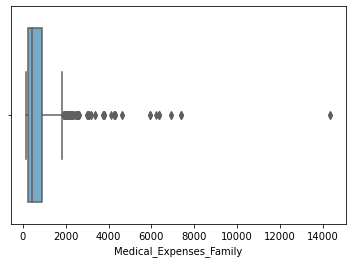

In [671]:
sns.boxplot(X_train[X_train["Medical_Expenses_Family"]!=0]["Medical_Expenses_Family"], palette = "Blues")

##### <span style='color:crimson'> In the X_train Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [672]:
Q1 = X_train[(X_train["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train[(X_train["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train["Expenses_Range"] = expenses_range
X_train["Expenses_Range"].value_counts()

Very High    352
Low          179
High         174
Zero          14
Name: Expenses_Range, dtype: int64

In [673]:
Q1 = X_train_Sum_expenses[(X_train_Sum_expenses["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Sum_expenses[(X_train_Sum_expenses["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Sum_expenses["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Sum_expenses["Expenses_Range"] = expenses_range
X_train_Sum_expenses["Expenses_Range"].value_counts()

Very High    352
Low          206
High         147
Zero          14
Name: Expenses_Range, dtype: int64

In [674]:
Q1 = X_train_Family_ID[(X_train_Family_ID["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Family_ID[(X_train_Family_ID["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Family_ID["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Family_ID["Expenses_Range"] = expenses_range
X_train_Family_ID["Expenses_Range"].value_counts()

Very High    352
Low          179
High         174
Zero          14
Name: Expenses_Range, dtype: int64

In [675]:
Q1 = X_train_Dominant[(X_train_Dominant["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Dominant[(X_train_Dominant["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Dominant["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Dominant["Expenses_Range"] = expenses_range
X_train_Dominant["Expenses_Range"].value_counts()

Very High    349
High         179
Low          177
Zero          14
Name: Expenses_Range, dtype: int64

In [676]:
Q1 = X_train_Mix[(X_train_Mix["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Mix[(X_train_Mix["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Mix["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Mix["Expenses_Range"] = expenses_range
X_train_Mix["Expenses_Range"].value_counts()

Very High    352
Low          178
High         175
Zero          14
Name: Expenses_Range, dtype: int64

Without outliers

In [677]:
Q1 = X_train_no_outliers[(X_train_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_no_outliers[(X_train_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_no_outliers["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_no_outliers["Expenses_Range"] = expenses_range
X_train_no_outliers["Expenses_Range"].value_counts()

Very High    342
Low          179
High         169
Zero          14
Name: Expenses_Range, dtype: int64

In [678]:
Q1 = X_train_Sum_expenses_no_outliers[(X_train_Sum_expenses_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Sum_expenses_no_outliers[(X_train_Sum_expenses_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Sum_expenses_no_outliers["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Sum_expenses_no_outliers["Expenses_Range"] = expenses_range
X_train_Sum_expenses_no_outliers["Expenses_Range"].value_counts()

Very High    341
High         175
Low          173
Zero          14
Name: Expenses_Range, dtype: int64

In [679]:
Q1 = X_train_Family_ID_no_outliers[(X_train_Family_ID_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Family_ID_no_outliers[(X_train_Family_ID_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Family_ID_no_outliers["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Family_ID_no_outliers["Expenses_Range"] = expenses_range
X_train_Family_ID_no_outliers["Expenses_Range"].value_counts()

Very High    342
Low          179
High         169
Zero          14
Name: Expenses_Range, dtype: int64

In [680]:
Q1 = X_train_Dominant_no_outliers[(X_train_Dominant_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Dominant_no_outliers[(X_train_Dominant_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Dominant_no_outliers["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Dominant_no_outliers["Expenses_Range"] = expenses_range
X_train_Dominant_no_outliers["Expenses_Range"].value_counts()

Very High    342
Low          175
High         172
Zero          14
Name: Expenses_Range, dtype: int64

In [681]:
Q1 = X_train_Mix_no_outliers[(X_train_Mix_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Mix_no_outliers[(X_train_Mix_no_outliers["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Mix_no_outliers["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Mix_no_outliers["Expenses_Range"] = expenses_range
X_train_Mix_no_outliers["Expenses_Range"].value_counts()

Very High    343
Low          178
High         168
Zero          14
Name: Expenses_Range, dtype: int64

Cliped outliers

In [682]:
Q1 = X_train_clip[(X_train_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_clip[(X_train_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_clip["Expenses_Range"] = expenses_range
X_train_clip["Expenses_Range"].value_counts()

Very High    342
Low          179
High         169
Zero          14
Name: Expenses_Range, dtype: int64

In [683]:
Q1 = X_train_Sum_expenses_clip[(X_train_Sum_expenses_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Sum_expenses_clip[(X_train_Sum_expenses_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Sum_expenses_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Sum_expenses_clip["Expenses_Range"] = expenses_range
X_train_Sum_expenses_clip["Expenses_Range"].value_counts()

Very High    341
High         175
Low          173
Zero          14
Name: Expenses_Range, dtype: int64

In [684]:
Q1 = X_train_Family_ID_clip[(X_train_Family_ID_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Family_ID_clip[(X_train_Family_ID_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Family_ID_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Family_ID_clip["Expenses_Range"] = expenses_range
X_train_Family_ID_clip["Expenses_Range"].value_counts()

Very High    342
Low          179
High         169
Zero          14
Name: Expenses_Range, dtype: int64

In [685]:
Q1 = X_train_Dominant_clip[(X_train_Dominant_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Dominant_clip[(X_train_Dominant_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Dominant_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Dominant_clip["Expenses_Range"] = expenses_range
X_train_Dominant_clip["Expenses_Range"].value_counts()

Very High    342
Low          175
High         172
Zero          14
Name: Expenses_Range, dtype: int64

In [686]:
Q1 = X_train_Mix_clip[(X_train_Mix_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_train_Mix_clip[(X_train_Mix_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_train_Mix_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_train_Mix_clip["Expenses_Range"] = expenses_range
X_train_Mix_clip["Expenses_Range"].value_counts()

Very High    343
Low          178
High         168
Zero          14
Name: Expenses_Range, dtype: int64

##### <span style='color:crimson'> In the X_val Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [687]:
Q1 = X_val[(X_val["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val[(X_val["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val["Expenses_Range"] = expenses_range
X_val["Expenses_Range"].value_counts()

Very High    88
Low          48
High         43
Zero          1
Name: Expenses_Range, dtype: int64

In [688]:
Q1 = X_val_Sum_expenses[(X_val_Sum_expenses["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_Sum_expenses[(X_val_Sum_expenses["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_Sum_expenses["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_Sum_expenses["Expenses_Range"] = expenses_range
X_val_Sum_expenses["Expenses_Range"].value_counts()

Very High    89
Low          47
High         43
Zero          1
Name: Expenses_Range, dtype: int64

In [689]:
Q1 = X_val_Family_ID[(X_val_Family_ID["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_Family_ID[(X_val_Family_ID["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_Family_ID["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_Family_ID["Expenses_Range"] = expenses_range
X_val_Family_ID["Expenses_Range"].value_counts()

Very High    88
Low          48
High         43
Zero          1
Name: Expenses_Range, dtype: int64

In [690]:
Q1 = X_val_Dominant[(X_val_Dominant["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_Dominant[(X_val_Dominant["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_Dominant["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_Dominant["Expenses_Range"] = expenses_range
X_val_Dominant["Expenses_Range"].value_counts()

Very High    87
Low          47
High         45
Zero          1
Name: Expenses_Range, dtype: int64

In [691]:
Q1 = X_val_Mix[(X_val_Mix["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_Mix[(X_val_Mix["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_Mix["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_Mix["Expenses_Range"] = expenses_range
X_val_Mix["Expenses_Range"].value_counts()

Very High    88
Low          48
High         43
Zero          1
Name: Expenses_Range, dtype: int64

Cliped outliers

In [692]:
Q1 = X_val_clip[(X_val_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_clip[(X_val_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_clip["Expenses_Range"] = expenses_range
X_val_clip["Expenses_Range"].value_counts()

Very High    88
Low          48
High         43
Zero          1
Name: Expenses_Range, dtype: int64

In [693]:
Q1 = X_val_Sum_expenses_clip[(X_val_Sum_expenses_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_Sum_expenses_clip[(X_val_Sum_expenses_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_Sum_expenses_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_Sum_expenses_clip["Expenses_Range"] = expenses_range
X_val_Sum_expenses_clip["Expenses_Range"].value_counts()

Very High    89
Low          47
High         43
Zero          1
Name: Expenses_Range, dtype: int64

In [694]:
Q1 = X_val_Family_ID_clip[(X_val_Family_ID_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_Family_ID_clip[(X_val_Family_ID_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_Family_ID_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_Family_ID_clip["Expenses_Range"] = expenses_range
X_val_Family_ID_clip["Expenses_Range"].value_counts()

Very High    88
Low          48
High         43
Zero          1
Name: Expenses_Range, dtype: int64

In [695]:
Q1 = X_val_Dominant_clip[(X_val_Dominant_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_Dominant_clip[(X_val_Dominant_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_Dominant_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_Dominant_clip["Expenses_Range"] = expenses_range
X_val_Dominant_clip["Expenses_Range"].value_counts()

Very High    87
Low          47
High         45
Zero          1
Name: Expenses_Range, dtype: int64

In [696]:
Q1 = X_val_Mix_clip[(X_val_Mix_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = X_val_Mix_clip[(X_val_Mix_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(X_val_Mix_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
X_val_Mix_clip["Expenses_Range"] = expenses_range
X_val_Mix_clip["Expenses_Range"].value_counts()

Very High    88
Low          48
High         43
Zero          1
Name: Expenses_Range, dtype: int64

##### <span style='color:crimson'> In the Test Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [697]:
Q1 = Test[(Test["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test[(Test["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test["Expenses_Range"] = expenses_range
Test["Expenses_Range"].value_counts()

Very High    198
Low          105
High          94
Zero           3
Name: Expenses_Range, dtype: int64

In [698]:
Q1 = Test_Sum_expenses[(Test_Sum_expenses["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_Sum_expenses[(Test_Sum_expenses["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_Sum_expenses["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_Sum_expenses["Expenses_Range"] = expenses_range
Test_Sum_expenses["Expenses_Range"].value_counts()

Very High    196
Low          105
High          96
Zero           3
Name: Expenses_Range, dtype: int64

In [699]:
Q1 = Test_Family_ID[(Test_Family_ID["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_Family_ID[(Test_Family_ID["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_Family_ID["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_Family_ID["Expenses_Range"] = expenses_range
Test_Family_ID["Expenses_Range"].value_counts()

Very High    198
Low          105
High          94
Zero           3
Name: Expenses_Range, dtype: int64

In [700]:
Q1 = Test_Dominant[(Test_Dominant["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_Dominant[(Test_Dominant["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_Dominant["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_Dominant["Expenses_Range"] = expenses_range
Test_Dominant["Expenses_Range"].value_counts()

Very High    196
Low          105
High          96
Zero           3
Name: Expenses_Range, dtype: int64

In [701]:
Q1 = Test_Mix[(Test_Mix["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_Mix[(Test_Mix["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_Mix["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_Mix["Expenses_Range"] = expenses_range
Test_Mix["Expenses_Range"].value_counts()

Very High    196
Low          105
High          96
Zero           3
Name: Expenses_Range, dtype: int64

Cliped outliers

In [702]:
Q1 = Test_clip[(Test_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_clip[(Test_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_clip["Expenses_Range"] = expenses_range
Test_clip["Expenses_Range"].value_counts()

Very High    198
Low          105
High          94
Zero           3
Name: Expenses_Range, dtype: int64

In [703]:
Q1 = Test_Sum_expenses_clip[(Test_Sum_expenses_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_Sum_expenses_clip[(Test_Sum_expenses_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_Sum_expenses_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_Sum_expenses_clip["Expenses_Range"] = expenses_range
Test_Sum_expenses_clip["Expenses_Range"].value_counts()

Very High    198
Low          105
High          94
Zero           3
Name: Expenses_Range, dtype: int64

In [704]:
Q1 = Test_Family_ID_clip[(Test_Family_ID_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_Family_ID_clip[(Test_Family_ID_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_Family_ID_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_Family_ID_clip["Expenses_Range"] = expenses_range
Test_Family_ID_clip["Expenses_Range"].value_counts()

Very High    198
Low          105
High          94
Zero           3
Name: Expenses_Range, dtype: int64

In [705]:
Q1 = Test_Dominant_clip[(Test_Dominant_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_Dominant_clip[(Test_Dominant_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_Dominant_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_Dominant_clip["Expenses_Range"] = expenses_range
Test_Dominant_clip["Expenses_Range"].value_counts()

Very High    196
Low          105
High          96
Zero           3
Name: Expenses_Range, dtype: int64

In [706]:
Q1 = Test_Mix_clip[(Test_Mix_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.25)
Median = Test_Mix_clip[(Test_Mix_clip["Medical_Expenses_Family"]!=0)]["Medical_Expenses_Family"].quantile(0.5)

expenses_range = pd.Series(Test_Mix_clip["Medical_Expenses_Family"].map(lambda x: 'Zero' if x==0 else "Low" if 0<x<=Q1 
                                                          else "High" if Q1 < x <= Median else "Very High"), name='Expenses_Range')
Test_Mix_clip["Expenses_Range"] = expenses_range
Test_Mix_clip["Expenses_Range"].value_counts()

Very High    196
Low          105
High          96
Zero           3
Name: Expenses_Range, dtype: int64

#  

### <span style='color:crimson'> •	Encoding <a class="anchor" id="Encoding">

In [707]:
# transform categorical into numerical

In [708]:
#Using One-Hot encoding to City, Titles, Gender and Severity
#Using Frequency encoding to Medical Tent
#Using Ordinal encoding to Age Range 

##### <span style='color:crimson'> In the X_train Set <a class="anchor" id="eighth-bullet"> 

With outliers

In [709]:
X_train['Medical_Tent'].value_counts()

Not Applied    558
B_C             83
E_D             50
A               14
F               12
G                2
Name: Medical_Tent, dtype: int64

In [710]:
X_train_dummy = X_train.copy()
X_train_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_dummy['Medical_Tent'] = X_train_dummy['Medical_Tent'].replace(['A'], 14/719).replace(['B_C'], 83/719).replace(['E_D'], 50/719).replace(['F'], 12/719).replace(['G'], 2/719).replace(['Not Applied'], 558/719).astype('float16')
X_train_dummy['Age_Range'] = X_train_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_dummy['Expenses_Range'] = X_train_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_dummy = pd.get_dummies(X_train_dummy, drop_first = True)
X_train_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.016693,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.775879,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.069519,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.775879,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.115417,61,5,3,1,0,0,1,0,1


In [711]:
X_train_Sum_expenses_dummy = X_train_Sum_expenses.copy()
X_train_Sum_expenses_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Sum_expenses_dummy['Medical_Tent'] = X_train_Sum_expenses_dummy['Medical_Tent'].replace(['A'], 14/719).replace(['B_C'], 83/719).replace(['E_D'], 50/719).replace(['F'], 12/719).replace(['G'], 2/719).replace(['Not Applied'], 558/719).astype('float16')
X_train_Sum_expenses_dummy['Age_Range'] = X_train_Sum_expenses_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Sum_expenses_dummy['Expenses_Range'] = X_train_Sum_expenses_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Sum_expenses_dummy = pd.get_dummies(X_train_Sum_expenses_dummy, drop_first = True)
X_train_Sum_expenses_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.016693,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.775879,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.069519,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.775879,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.115417,61,5,3,1,0,0,1,0,1


In [712]:
X_train_Family_ID_dummy = X_train_Family_ID.copy()
X_train_Family_ID_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Family_ID_dummy['Medical_Tent'] = X_train_Family_ID_dummy['Medical_Tent'].replace(['A'], 14/719).replace(['B_C'], 83/719).replace(['E_D'], 50/719).replace(['F'], 12/719).replace(['G'], 2/719).replace(['Not Applied'], 558/719).astype('float16')
X_train_Family_ID_dummy['Age_Range'] = X_train_Family_ID_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Family_ID_dummy['Expenses_Range'] = X_train_Family_ID_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Family_ID_dummy = pd.get_dummies(X_train_Family_ID_dummy, drop_first = True)
X_train_Family_ID_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.016693,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.775879,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.069519,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.775879,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.115417,61,5,3,1,0,0,1,0,1


In [713]:
X_train_Dominant_dummy = X_train_Dominant.copy()
X_train_Dominant_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Dominant_dummy['Medical_Tent'] = X_train_Dominant_dummy['Medical_Tent'].replace(['A'], 14/719).replace(['B_C'], 83/719).replace(['E_D'], 50/719).replace(['F'], 12/719).replace(['G'], 2/719).replace(['Not Applied'], 558/719).astype('float16')
X_train_Dominant_dummy['Age_Range'] = X_train_Dominant_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Dominant_dummy['Expenses_Range'] = X_train_Dominant_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Dominant_dummy = pd.get_dummies(X_train_Dominant_dummy, drop_first = True)
X_train_Dominant_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.016693,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.775879,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.069519,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.775879,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.115417,61,5,3,1,0,0,1,0,1


In [714]:
X_train_Mix_dummy = X_train_Mix.copy()
X_train_Mix_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Mix_dummy['Medical_Tent'] = X_train_Mix_dummy['Medical_Tent'].replace(['A'], 14/719).replace(['B_C'], 83/719).replace(['E_D'], 50/719).replace(['F'], 12/719).replace(['G'], 2/719).replace(['Not Applied'], 558/719).astype('float16')
X_train_Mix_dummy['Age_Range'] = X_train_Mix_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Mix_dummy['Expenses_Range'] = X_train_Mix_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Mix_dummy = pd.get_dummies(X_train_Mix_dummy, drop_first = True)
X_train_Mix_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.016693,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.775879,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.069519,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.775879,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.115417,61,5,3,1,0,0,1,0,1


Without outliers

In [715]:
X_train_no_outliers['Medical_Tent'].value_counts()

Not Applied    554
B_C             72
E_D             50
A               14
F               12
G                2
Name: Medical_Tent, dtype: int64

In [716]:
X_train_no_outliers_dummy = X_train_no_outliers.copy()
X_train_no_outliers_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_no_outliers_dummy['Medical_Tent'] = X_train_no_outliers_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_no_outliers_dummy['Age_Range'] = X_train_no_outliers_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_no_outliers_dummy['Expenses_Range'] = X_train_no_outliers_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_no_outliers_dummy = pd.get_dummies(X_train_no_outliers_dummy, drop_first = True)
X_train_no_outliers_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.017044,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.787109,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.071045,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.787109,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.102295,61,5,3,1,0,0,1,0,1


In [717]:
X_train_Sum_expenses_no_outliers_dummy = X_train_Sum_expenses.copy()
X_train_Sum_expenses_no_outliers_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Sum_expenses_no_outliers_dummy['Medical_Tent'] = X_train_Sum_expenses_no_outliers_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_Sum_expenses_no_outliers_dummy['Age_Range'] = X_train_Sum_expenses_no_outliers_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Sum_expenses_no_outliers_dummy['Expenses_Range'] = X_train_Sum_expenses_no_outliers_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Sum_expenses_no_outliers_dummy = pd.get_dummies(X_train_Sum_expenses_no_outliers_dummy, drop_first = True)
X_train_Sum_expenses_no_outliers_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.017044,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.787109,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.071045,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.787109,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.102295,61,5,3,1,0,0,1,0,1


In [718]:
X_train_Family_ID_no_outliers_dummy = X_train_Family_ID_no_outliers.copy()
X_train_Family_ID_no_outliers_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Family_ID_no_outliers_dummy['Medical_Tent'] = X_train_Family_ID_no_outliers_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_Family_ID_no_outliers_dummy['Age_Range'] = X_train_Family_ID_no_outliers_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Family_ID_no_outliers_dummy['Expenses_Range'] = X_train_Family_ID_no_outliers_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Family_ID_no_outliers_dummy = pd.get_dummies(X_train_Family_ID_no_outliers_dummy, drop_first = True)
X_train_Family_ID_no_outliers_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.017044,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.787109,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.071045,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.787109,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.102295,61,5,3,1,0,0,1,0,1


In [719]:
X_train_Dominant_no_outliers_dummy = X_train_Dominant_no_outliers.copy()
X_train_Dominant_no_outliers_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Dominant_no_outliers_dummy['Medical_Tent'] = X_train_Dominant_no_outliers_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_Dominant_no_outliers_dummy['Age_Range'] = X_train_Dominant_no_outliers_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Dominant_no_outliers_dummy['Expenses_Range'] = X_train_Dominant_no_outliers_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Dominant_no_outliers_dummy = pd.get_dummies(X_train_Dominant_no_outliers_dummy, drop_first = True)
X_train_Dominant_no_outliers_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.017044,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.787109,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.071045,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.787109,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.102295,61,5,3,1,0,0,1,0,1


In [720]:
X_train_Mix_no_outliers_dummy = X_train_Mix_no_outliers.copy()
X_train_Mix_no_outliers_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Mix_no_outliers_dummy['Medical_Tent'] = X_train_Mix_no_outliers_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_Mix_no_outliers_dummy['Age_Range'] = X_train_Mix_no_outliers_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Mix_no_outliers_dummy['Expenses_Range'] = X_train_Mix_no_outliers_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Mix_no_outliers_dummy = pd.get_dummies(X_train_Mix_no_outliers_dummy, drop_first = True)
X_train_Mix_no_outliers_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.017044,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.787109,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.071045,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.787109,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.102295,61,5,3,1,0,0,1,0,1


Cliped outliers

In [721]:
X_train_clip_dummy = X_train_clip.copy()
X_train_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_clip_dummy['Medical_Tent'] = X_train_clip_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_clip_dummy['Age_Range'] = X_train_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_clip_dummy['Expenses_Range'] = X_train_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_clip_dummy = pd.get_dummies(X_train_clip_dummy, drop_first = True)
X_train_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,0.017044,217.0,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,0.787109,1582.0,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,0.071045,294.0,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,0.787109,364.0,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,0.102295,938.0,61,5,3,1,0,0,1,0,1


In [722]:
X_train_Sum_expenses_clip_dummy = X_train_Sum_expenses_clip.copy()
X_train_Sum_expenses_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Sum_expenses_clip_dummy['Medical_Tent'] = X_train_Sum_expenses_clip_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_Sum_expenses_clip_dummy['Age_Range'] = X_train_Sum_expenses_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Sum_expenses_clip_dummy['Expenses_Range'] = X_train_Sum_expenses_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Sum_expenses_clip_dummy = pd.get_dummies(X_train_Sum_expenses_clip_dummy, drop_first = True)
X_train_Sum_expenses_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,0.017044,217,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,0.787109,1582,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,0.071045,294,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,0.787109,364,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,0.102295,938,61,5,3,1,0,0,1,0,1


In [723]:
X_train_Family_ID_clip_dummy = X_train_Family_ID_clip.copy()
X_train_Family_ID_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Family_ID_clip_dummy['Medical_Tent'] = X_train_Family_ID_clip_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_Family_ID_clip_dummy['Age_Range'] = X_train_Family_ID_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Family_ID_clip_dummy['Expenses_Range'] = X_train_Family_ID_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Family_ID_clip_dummy = pd.get_dummies(X_train_Family_ID_clip_dummy, drop_first = True)
X_train_Family_ID_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,0.017044,217.0,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,0.787109,1582.0,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,0.071045,294.0,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,0.787109,364.0,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,0.102295,938.0,61,5,3,1,0,0,1,0,1


In [724]:
X_train_Dominant_clip_dummy = X_train_Dominant_clip.copy()
X_train_Dominant_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Dominant_clip_dummy['Medical_Tent'] = X_train_Dominant_clip_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_Dominant_clip_dummy['Age_Range'] = X_train_Dominant_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Dominant_clip_dummy['Expenses_Range'] = X_train_Dominant_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Dominant_clip_dummy = pd.get_dummies(X_train_Dominant_clip_dummy, drop_first = True)
X_train_Dominant_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,0.017044,217,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,0.787109,1582,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,0.071045,294,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,0.787109,364,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,0.102295,938,61,5,3,1,0,0,1,0,1


In [725]:
X_train_Mix_clip_dummy = X_train_Mix_clip.copy()
X_train_Mix_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_train_Mix_clip_dummy['Medical_Tent'] = X_train_Mix_clip_dummy['Medical_Tent'].replace(['A'], 14/704).replace(['B_C'], 72/704).replace(['E_D'], 50/704).replace(['F'], 12/704).replace(['G'], 2/704).replace(['Not Applied'], 554/704).astype('float16')
X_train_Mix_clip_dummy['Age_Range'] = X_train_Mix_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_train_Mix_clip_dummy['Expenses_Range'] = X_train_Mix_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_train_Mix_clip_dummy = pd.get_dummies(X_train_Mix_clip_dummy, drop_first = True)
X_train_Mix_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,0.017044,217,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,0.787109,1582,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,0.071045,294,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,0.787109,364,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,0.102295,938,61,5,3,1,0,0,1,0,1


##### <span style='color:crimson'> In the X_val Set <a class="anchor" id="eighth-bullet"> 

In [726]:
X_val['Medical_Tent'].value_counts()

Not Applied    144
B_C             20
E_D             12
G                2
A                1
F                1
Name: Medical_Tent, dtype: int64

With outliers

In [727]:
X_val_dummy = X_val.copy()
X_val_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_dummy['Medical_Tent'] = X_val_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_dummy['Age_Range'] = X_val_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_dummy['Expenses_Range'] = X_val_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_dummy = pd.get_dummies(X_val_dummy, drop_first = True)
X_val_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,726,0.799805,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,924,0.799805,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,243,0.799805,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,221,0.799805,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,651,0.799805,6,1,3,0,1,1,0,0,0


In [728]:
X_val_Sum_expenses_dummy = X_val_Sum_expenses.copy()
X_val_Sum_expenses_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_Sum_expenses_dummy['Medical_Tent'] = X_val_Sum_expenses_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_Sum_expenses_dummy['Age_Range'] = X_val_Sum_expenses_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_Sum_expenses_dummy['Expenses_Range'] = X_val_Sum_expenses_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_Sum_expenses_dummy = pd.get_dummies(X_val_Sum_expenses_dummy, drop_first = True)
X_val_Sum_expenses_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,726,0.799805,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,924,0.799805,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,243,0.799805,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,221,0.799805,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,651,0.799805,6,1,3,0,1,1,0,0,0


In [729]:
X_val_Family_ID_dummy = X_val_Family_ID.copy()
X_val_Family_ID_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_Family_ID_dummy['Medical_Tent'] = X_val_Family_ID_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_Family_ID_dummy['Age_Range'] = X_val_Family_ID_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_Family_ID_dummy['Expenses_Range'] = X_val_Family_ID_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_Family_ID_dummy = pd.get_dummies(X_val_Family_ID_dummy, drop_first = True)
X_val_Family_ID_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,726,0.799805,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,924,0.799805,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,243,0.799805,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,221,0.799805,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,651,0.799805,6,1,3,0,1,1,0,0,0


In [730]:
X_val_Dominant_dummy = X_val_Dominant.copy()
X_val_Dominant_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_Dominant_dummy['Medical_Tent'] = X_val_Dominant_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_Dominant_dummy['Age_Range'] = X_val_Dominant_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_Dominant_dummy['Expenses_Range'] = X_val_Dominant_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_Dominant_dummy = pd.get_dummies(X_val_Dominant_dummy, drop_first = True)
X_val_Dominant_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,726,0.799805,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,924,0.799805,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,243,0.799805,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,221,0.799805,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,651,0.799805,6,1,3,0,1,1,0,0,0


In [731]:
X_val_Mix_dummy = X_val_Mix.copy()
X_val_Mix_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_Mix_dummy['Medical_Tent'] = X_val_Mix_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_Mix_dummy['Age_Range'] = X_val_Mix_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_Mix_dummy['Expenses_Range'] = X_val_Mix_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_Mix_dummy = pd.get_dummies(X_val_Mix_dummy, drop_first = True)
X_val_Mix_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,726,0.799805,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,924,0.799805,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,243,0.799805,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,221,0.799805,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,651,0.799805,6,1,3,0,1,1,0,0,0


Cliped outliers

In [732]:
X_val_clip_dummy = X_val_clip.copy()
X_val_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_clip_dummy['Medical_Tent'] = X_val_clip_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_clip_dummy['Age_Range'] = X_val_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_clip_dummy['Expenses_Range'] = X_val_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_clip_dummy = pd.get_dummies(X_val_clip_dummy, drop_first = True)
X_val_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,0.799805,726.0,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,0.799805,924.0,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,0.799805,243.0,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,0.799805,221.0,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,0.799805,651.0,6,1,3,0,1,1,0,0,0


In [733]:
X_val_Sum_expenses_clip_dummy = X_val_Sum_expenses_clip.copy()
X_val_Sum_expenses_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_Sum_expenses_clip_dummy['Medical_Tent'] = X_val_Sum_expenses_clip_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_Sum_expenses_clip_dummy['Age_Range'] = X_val_Sum_expenses_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_Sum_expenses_clip_dummy['Expenses_Range'] = X_val_Sum_expenses_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_Sum_expenses_clip_dummy = pd.get_dummies(X_val_Sum_expenses_clip_dummy, drop_first = True)
X_val_Sum_expenses_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,0.799805,726.0,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,0.799805,924.0,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,0.799805,243.0,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,0.799805,221.0,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,0.799805,651.0,6,1,3,0,1,1,0,0,0


In [734]:
X_val_Family_ID_clip_dummy = X_val_Family_ID_clip.copy()
X_val_Family_ID_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_Family_ID_clip_dummy['Medical_Tent'] = X_val_Family_ID_clip_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_Family_ID_clip_dummy['Age_Range'] = X_val_Family_ID_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_Family_ID_clip_dummy['Expenses_Range'] = X_val_Family_ID_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_Family_ID_clip_dummy = pd.get_dummies(X_val_Family_ID_clip_dummy, drop_first = True)
X_val_Family_ID_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,0.799805,726.0,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,0.799805,924.0,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,0.799805,243.0,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,0.799805,221.0,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,0.799805,651.0,6,1,3,0,1,1,0,0,0


In [735]:
X_val_Dominant_clip_dummy = X_val_Dominant_clip.copy()
X_val_Dominant_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_Dominant_clip_dummy['Medical_Tent'] = X_val_Dominant_clip_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_Dominant_clip_dummy['Age_Range'] = X_val_Dominant_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_Dominant_clip_dummy['Expenses_Range'] = X_val_Dominant_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_Dominant_clip_dummy = pd.get_dummies(X_val_Dominant_clip_dummy, drop_first = True)
X_val_Dominant_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,0.799805,726.0,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,0.799805,924.0,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,0.799805,243.0,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,0.799805,221.0,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,0.799805,651.0,6,1,3,0,1,1,0,0,0


In [736]:
X_val_Mix_clip_dummy = X_val_Mix_clip.copy()
X_val_Mix_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
X_val_Mix_clip_dummy['Medical_Tent'] = X_val_Mix_clip_dummy['Medical_Tent'].replace(['A'], 1/180).replace(['B_C'], 20/180).replace(['E_D'], 12/180).replace(['F'], 1/180).replace(['G'], 2/180).replace(['Not Applied'], 144/180).astype('float16')
X_val_Mix_clip_dummy['Age_Range'] = X_val_Mix_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
X_val_Mix_clip_dummy['Expenses_Range'] = X_val_Mix_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
X_val_Mix_clip_dummy = pd.get_dummies(X_val_Mix_clip_dummy, drop_first = True)
X_val_Mix_clip_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
539,1972,1,0.0,16773,0,0,0.799805,726.0,48,4,3,1,0,0,0,1,0
807,2005,2,0.0,2201,0,0,0.799805,924.0,15,2,3,1,0,1,0,0,0
895,1993,3,0.0,9846,0,0,0.799805,243.0,27,3,2,1,0,0,1,0,1
790,1994,3,0.0,12635,0,0,0.799805,221.0,26,3,1,1,0,0,1,0,1
466,2014,3,2.0,6349,0,2,0.799805,651.0,6,1,3,0,1,1,0,0,0


##### <span style='color:crimson'> In the Test Set <a class="anchor" id="eighth-bullet"> 

In [737]:
Test['Medical_Tent'].value_counts()

Not Applied    311
B_C             51
E_D             22
F                8
A                7
G                1
Name: Medical_Tent, dtype: int64

With outliers

In [738]:
Test_dummy = Test.copy()
Test_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_dummy['Medical_Tent'] = Test_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_dummy['Age_Range'] = Test_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_dummy['Expenses_Range'] = Test_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_dummy = pd.get_dummies(Test_dummy, drop_first = True)
Test_dummy.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,203,49242,0,0,0.777344,0,28,3,1,1,0,0,1,0,1
902,1988,3,631,10400,0,0,0.777344,0,32,4,3,1,0,0,1,0,1
903,1981,3,376,10795,1,0,0.777344,1,39,4,2,0,0,0,1,0,1
904,1995,3,405,62440,0,1,0.777344,1,25,3,2,0,0,0,1,0,1
905,1996,2,378,81311,0,0,0.777344,0,24,3,2,1,0,0,1,0,1


In [739]:
Test_Sum_expenses_dummy = Test_Sum_expenses.copy()
Test_Sum_expenses_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_Sum_expenses_dummy['Medical_Tent'] = Test_Sum_expenses_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_Sum_expenses_dummy['Age_Range'] = Test_Sum_expenses_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_Sum_expenses_dummy['Expenses_Range'] = Test_Sum_expenses_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_Sum_expenses_dummy = pd.get_dummies(Test_Sum_expenses_dummy, drop_first = True)
Test_Sum_expenses_dummy.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,203,49242,0,0,0.777344,0,28,3,1,1,0,0,1,0,1
902,1988,3,631,10400,0,0,0.777344,0,32,4,3,1,0,0,1,0,1
903,1981,3,376,10795,1,0,0.777344,1,39,4,2,0,0,0,1,0,1
904,1995,3,405,62440,0,1,0.777344,1,25,3,2,0,0,0,1,0,1
905,1996,2,378,81311,0,0,0.777344,0,24,3,2,1,0,0,1,0,1


In [740]:
Test_Family_ID_dummy = Test_Family_ID.copy()
Test_Family_ID_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_Family_ID_dummy['Medical_Tent'] = Test_Family_ID_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_Family_ID_dummy['Age_Range'] = Test_Family_ID_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_Family_ID_dummy['Expenses_Range'] = Test_Family_ID_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_Family_ID_dummy = pd.get_dummies(Test_Family_ID_dummy, drop_first = True)
Test_Family_ID_dummy.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,203,49242,0,0,0.777344,0,28,3,1,1,0,0,1,0,1
902,1988,3,631,10400,0,0,0.777344,0,32,4,3,1,0,0,1,0,1
903,1981,3,376,10795,1,0,0.777344,1,39,4,2,0,0,0,1,0,1
904,1995,3,405,62440,0,1,0.777344,1,25,3,2,0,0,0,1,0,1
905,1996,2,378,81311,0,0,0.777344,0,24,3,2,1,0,0,1,0,1


In [741]:
Test_Dominant_dummy = Test_Dominant.copy()
Test_Dominant_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_Dominant_dummy['Medical_Tent'] = Test_Dominant_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_Dominant_dummy['Age_Range'] = Test_Dominant_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_Dominant_dummy['Expenses_Range'] = Test_Dominant_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_Dominant_dummy = pd.get_dummies(Test_Dominant_dummy, drop_first = True)
Test_Dominant_dummy.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,203,49242,0,0,0.777344,0,28,3,1,1,0,0,1,0,1
902,1988,3,631,10400,0,0,0.777344,0,32,4,3,1,0,0,1,0,1
903,1981,3,376,10795,1,0,0.777344,1,39,4,2,0,0,0,1,0,1
904,1995,3,405,62440,0,1,0.777344,1,25,3,2,0,0,0,1,0,1
905,1996,2,378,81311,0,0,0.777344,0,24,3,2,1,0,0,1,0,1


In [742]:
Test_Mix_dummy = Test_Mix.copy()
Test_Mix_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_Mix_dummy['Medical_Tent'] = Test_Mix_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_Mix_dummy['Age_Range'] = Test_Mix_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_Mix_dummy['Expenses_Range'] = Test_Mix_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_Mix_dummy = pd.get_dummies(Test_Mix_dummy, drop_first = True)
Test_Mix_dummy.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,203,49242,0,0,0.777344,0,28,3,1,1,0,0,1,0,1
902,1988,3,631,10400,0,0,0.777344,0,32,4,3,1,0,0,1,0,1
903,1981,3,376,10795,1,0,0.777344,1,39,4,2,0,0,0,1,0,1
904,1995,3,405,62440,0,1,0.777344,1,25,3,2,0,0,0,1,0,1
905,1996,2,378,81311,0,0,0.777344,0,24,3,2,1,0,0,1,0,1


Cliped outliers

In [743]:
Test_clip['Medical_Tent'].value_counts()

Not Applied    311
B_C             51
E_D             22
F                8
A                7
G                1
Name: Medical_Tent, dtype: int64

In [744]:
Test_clip_dummy = Test_clip.copy()
Test_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_clip_dummy['Medical_Tent'] = Test_clip_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_clip_dummy['Age_Range'] = Test_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_clip_dummy['Expenses_Range'] = Test_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_clip_dummy = pd.get_dummies(Test_clip_dummy, drop_first = True)
Test_clip_dummy.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,49242,0,0,0.777344,0,203.0,28,3,1,1,0,0,1,0,1
902,1988,3,10400,0,0,0.777344,0,631.0,32,4,3,1,0,0,1,0,1
903,1981,3,10795,1,0,0.777344,1,376.0,39,4,2,0,0,0,1,0,1
904,1995,3,62440,0,1,0.777344,1,405.0,25,3,2,0,0,0,1,0,1
905,1996,2,81311,0,0,0.777344,0,378.0,24,3,2,1,0,0,1,0,1


In [745]:
Test_Sum_expenses_clip_dummy = Test_Sum_expenses_clip.copy()
Test_Sum_expenses_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_Sum_expenses_clip_dummy['Medical_Tent'] = Test_Sum_expenses_clip_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_Sum_expenses_clip_dummy['Age_Range'] = Test_Sum_expenses_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_Sum_expenses_clip_dummy['Expenses_Range'] = Test_Sum_expenses_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_Sum_expenses_clip_dummy = pd.get_dummies(Test_Sum_expenses_clip_dummy, drop_first = True)
Test_Sum_expenses_clip_dummy.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,49242,0,0,0.777344,0,203.0,28,3,1,1,0,0,1,0,1
902,1988,3,10400,0,0,0.777344,0,631.0,32,4,3,1,0,0,1,0,1
903,1981,3,10795,1,0,0.777344,1,376.0,39,4,2,0,0,0,1,0,1
904,1995,3,62440,0,1,0.777344,1,405.0,25,3,2,0,0,0,1,0,1
905,1996,2,81311,0,0,0.777344,0,378.0,24,3,2,1,0,0,1,0,1


In [746]:
Test_Family_ID_clip_dummy = Test_Family_ID_clip.copy()
Test_Family_ID_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_Family_ID_clip_dummy['Medical_Tent'] = Test_Family_ID_clip_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_Family_ID_clip_dummy['Age_Range'] = Test_Family_ID_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_Family_ID_clip_dummy['Expenses_Range'] = Test_Family_ID_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_Family_ID_clip_dummy = pd.get_dummies(Test_Family_ID_clip_dummy, drop_first = True)
Test_Family_ID_clip_dummy.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,49242,0,0,0.777344,0,203.0,28,3,1,1,0,0,1,0,1
902,1988,3,10400,0,0,0.777344,0,631.0,32,4,3,1,0,0,1,0,1
903,1981,3,10795,1,0,0.777344,1,376.0,39,4,2,0,0,0,1,0,1
904,1995,3,62440,0,1,0.777344,1,405.0,25,3,2,0,0,0,1,0,1
905,1996,2,81311,0,0,0.777344,0,378.0,24,3,2,1,0,0,1,0,1


In [747]:
Test_Dominant_clip_dummy = Test_Dominant_clip.copy()
Test_Dominant_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_Dominant_clip_dummy['Medical_Tent'] = Test_Dominant_clip_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_Dominant_clip_dummy['Age_Range'] = Test_Dominant_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_Dominant_clip_dummy['Expenses_Range'] = Test_Dominant_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_Dominant_clip_dummy = pd.get_dummies(Test_Dominant_clip_dummy, drop_first = True)
Test_Dominant_clip_dummy.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,49242,0,0,0.777344,0,203.0,28,3,1,1,0,0,1,0,1
902,1988,3,10400,0,0,0.777344,0,631.0,32,4,3,1,0,0,1,0,1
903,1981,3,10795,1,0,0.777344,1,376.0,39,4,2,0,0,0,1,0,1
904,1995,3,62440,0,1,0.777344,1,405.0,25,3,2,0,0,0,1,0,1
905,1996,2,81311,0,0,0.777344,0,378.0,24,3,2,1,0,0,1,0,1


In [748]:
Test_Mix_clip_dummy = Test_Mix_clip.copy()
Test_Mix_clip_dummy.drop(labels = ['Name', 'Severity_Range'], axis = 1, inplace = True)
Test_Mix_clip_dummy['Medical_Tent'] = Test_Mix_clip_dummy['Medical_Tent'].replace(['A'], 7/400).replace(['B_C'], 51/400).replace(['E_D'], 22/400).replace(['F'], 8/400).replace(['G'], 1/400).replace(['Not Applied'], 311/400).astype('float16')
Test_Mix_clip_dummy['Age_Range'] = Test_Mix_clip_dummy['Age_Range'].replace(['Child'],'1').replace(['Teen'],'2').replace(['Young Adult'],'3').replace(['Adult'],'4').replace(['Senior'],'5').astype('int')
Test_Mix_clip_dummy['Expenses_Range'] = Test_Mix_clip_dummy['Expenses_Range'].replace(['Zero'], 0).replace(['Low'], 1).replace(['High'], 2).replace(['Very High'], 3).astype('int')
Test_Mix_clip_dummy = pd.get_dummies(Test_Mix_clip_dummy, drop_first = True)
Test_Mix_clip_dummy.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
901,1992,3,49242,0,0,0.777344,0,203.0,28,3,1,1,0,0,1,0,1
902,1988,3,10400,0,0,0.777344,0,631.0,32,4,3,1,0,0,1,0,1
903,1981,3,10795,1,0,0.777344,1,376.0,39,4,2,0,0,0,1,0,1
904,1995,3,62440,0,1,0.777344,1,405.0,25,3,2,0,0,0,1,0,1
905,1996,2,81311,0,0,0.777344,0,378.0,24,3,2,1,0,0,1,0,1


### <span style='color:crimson'> •	Normalization <a class="anchor" id="Normalization"> 

In [749]:
# put all variables in the same range

#### <span style='color:crimson'> Min Max Scaler [0,1]

In [750]:
#Creating the instance of MinMaxScaler()

minmax_scaler = MinMaxScaler() 

##### <span style='color:crimson'> In the X_train Set

With outliers

In [751]:
scale_X_train = minmax_scaler.fit(X_train_dummy)
minmax_X_train = scale_X_train.transform(X_train_dummy)
minmax_X_train = pd.DataFrame(minmax_X_train, columns = X_train_dummy.columns)
minmax_X_train.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [752]:
scale_X_train_Sum_expenses = minmax_scaler.fit(X_train_Sum_expenses_dummy)
minmax_X_train_Sum_expenses = scale_X_train_Sum_expenses.transform(X_train_Sum_expenses_dummy)
minmax_X_train_Sum_expenses = pd.DataFrame(minmax_X_train_Sum_expenses, columns = X_train_Sum_expenses_dummy.columns)
minmax_X_train_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [753]:
scale_X_train_Family_ID = minmax_scaler.fit(X_train_Family_ID_dummy)
minmax_X_train_Family_ID = scale_X_train_Family_ID.transform(X_train_Family_ID_dummy)
minmax_X_train_Family_ID = pd.DataFrame(minmax_X_train_Family_ID, columns = X_train_Family_ID_dummy.columns)
minmax_X_train_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [754]:
scale_X_train_Dominant = minmax_scaler.fit(X_train_Dominant_dummy)
minmax_X_train_Dominant = scale_X_train_Dominant.transform(X_train_Dominant_dummy)
minmax_X_train_Dominant = pd.DataFrame(minmax_X_train_Dominant, columns = X_train_Dominant_dummy.columns)
minmax_X_train_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [755]:
scale_X_train_Mix = minmax_scaler.fit(X_train_Mix_dummy)
minmax_X_train_Mix = scale_X_train_Mix.transform(X_train_Mix_dummy)
minmax_X_train_Mix = pd.DataFrame(minmax_X_train_Mix, columns = X_train_Mix_dummy.columns)
minmax_X_train_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


Without outliers

In [756]:
scale_X_train_no_outliers = minmax_scaler.fit(X_train_no_outliers_dummy)
minmax_X_train_no_outliers = scale_X_train_no_outliers.transform(X_train_no_outliers_dummy)
minmax_X_train_no_outliers = pd.DataFrame(minmax_X_train_no_outliers, columns = X_train_no_outliers_dummy.columns)
minmax_X_train_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.047010,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.342721,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.063692,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.078856,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.203206,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [757]:
scale_X_train_Sum_expenses_no_outliers = minmax_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
minmax_X_train_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(X_train_Sum_expenses_no_outliers_dummy)
minmax_X_train_Sum_expenses_no_outliers = pd.DataFrame(minmax_X_train_Sum_expenses_no_outliers, columns = X_train_Sum_expenses_no_outliers_dummy.columns)
minmax_X_train_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.015127,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [758]:
scale_X_train_Family_ID_no_outliers = minmax_scaler.fit(X_train_Family_ID_no_outliers_dummy)
minmax_X_train_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(X_train_Family_ID_no_outliers_dummy)
minmax_X_train_Family_ID_no_outliers = pd.DataFrame(minmax_X_train_Family_ID_no_outliers, columns = X_train_Family_ID_no_outliers_dummy.columns)
minmax_X_train_Family_ID_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.047010,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,0.342721,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.063692,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,0.078856,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.203206,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [759]:
scale_X_train_Dominant_no_outliers = minmax_scaler.fit(X_train_Dominant_no_outliers_dummy)
minmax_X_train_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(X_train_Dominant_no_outliers_dummy)
minmax_X_train_Dominant_no_outliers = pd.DataFrame(minmax_X_train_Dominant_no_outliers, columns = X_train_Dominant_no_outliers_dummy.columns)
minmax_X_train_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.047010,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.342721,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.063692,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.078856,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.203206,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [760]:
scale_X_train_Mix_no_outliers = minmax_scaler.fit(X_train_Mix_no_outliers_dummy)
minmax_X_train_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(X_train_Mix_no_outliers_dummy)
minmax_X_train_Mix_no_outliers = pd.DataFrame(minmax_X_train_Mix_no_outliers, columns = X_train_Mix_no_outliers_dummy.columns)
minmax_X_train_Mix_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.047010,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,0.342721,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.063692,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,0.078856,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.203206,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


Cliped outliers

In [761]:
scale_X_train_clip = minmax_scaler.fit(X_train_clip_dummy)
minmax_X_train_clip = scale_X_train_clip.transform(X_train_clip_dummy)
minmax_X_train_clip = pd.DataFrame(minmax_X_train_clip, columns = X_train_clip_dummy.columns)
minmax_X_train_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.018111,0.122357,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,1.000000,0.892021,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.165774,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,1.000000,0.205244,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.528898,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [762]:
scale_X_train_Sum_expenses_clip = minmax_scaler.fit(X_train_Sum_expenses_clip_dummy)
minmax_X_train_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(X_train_Sum_expenses_clip_dummy)
minmax_X_train_Sum_expenses_clip = pd.DataFrame(minmax_X_train_Sum_expenses_clip, columns = X_train_Sum_expenses_clip_dummy.columns)
minmax_X_train_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.018111,0.118127,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,1.000000,0.861187,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.160044,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,1.000000,0.198149,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.510615,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [763]:
scale_X_train_Family_ID_clip = minmax_scaler.fit(X_train_Family_ID_clip_dummy)
minmax_X_train_Family_ID_clip = scale_X_train_Family_ID_clip.transform(X_train_Family_ID_clip_dummy)
minmax_X_train_Family_ID_clip = pd.DataFrame(minmax_X_train_Family_ID_clip, columns = X_train_Family_ID_clip_dummy.columns)
minmax_X_train_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.018111,0.122357,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,1.000000,0.892021,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.165774,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,1.000000,0.205244,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.528898,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [764]:
scale_X_train_Dominant_clip = minmax_scaler.fit(X_train_Dominant_clip_dummy)
minmax_X_train_Dominant_clip = scale_X_train_Dominant_clip.transform(X_train_Dominant_clip_dummy)
minmax_X_train_Dominant_clip = pd.DataFrame(minmax_X_train_Dominant_clip, columns = X_train_Dominant_clip_dummy.columns)
minmax_X_train_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.018111,0.120422,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,1.000000,0.877913,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.163152,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,1.000000,0.201998,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.520533,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [765]:
scale_X_train_Mix_clip = minmax_scaler.fit(X_train_Mix_clip_dummy)
minmax_X_train_Mix_clip = scale_X_train_Mix_clip.transform(X_train_Mix_clip_dummy)
minmax_X_train_Mix_clip = pd.DataFrame(minmax_X_train_Mix_clip, columns = X_train_Mix_clip_dummy.columns)
minmax_X_train_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.018111,0.121842,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,1.000000,0.888265,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.165076,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,1.000000,0.204380,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.526670,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


##### <span style='color:crimson'> In the X_val Set

With outliers

In [766]:
scale_X_train = minmax_scaler.fit(X_train_dummy)
minmax_X_val = scale_X_train.transform(X_val_dummy)
minmax_X_val = pd.DataFrame(minmax_X_val, columns = X_val_dummy.columns)
minmax_X_val.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [767]:
scale_X_train_Sum_expenses = minmax_scaler.fit(X_train_Sum_expenses_dummy)
minmax_X_val_Sum_expenses = scale_X_train_Sum_expenses.transform(X_val_Sum_expenses_dummy)
minmax_X_val_Sum_expenses = pd.DataFrame(minmax_X_val_Sum_expenses, columns = X_val_Sum_expenses_dummy.columns)
minmax_X_val_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [768]:
scale_X_train_Family_ID = minmax_scaler.fit(X_train_Family_ID_dummy)
minmax_X_val_Family_ID = scale_X_train_Family_ID.transform(X_val_Family_ID_dummy)
minmax_X_val_Family_ID = pd.DataFrame(minmax_X_val_Family_ID, columns = X_val_Family_ID_dummy.columns)
minmax_X_val_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [769]:
scale_X_train_Dominant = minmax_scaler.fit(X_train_Dominant_dummy)
minmax_X_val_Dominant = scale_X_train_Dominant.transform(X_val_Dominant_dummy)
minmax_X_val_Dominant = pd.DataFrame(minmax_X_val_Dominant, columns = X_val_Dominant_dummy.columns)
minmax_X_val_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [770]:
scale_X_train_Mix = minmax_scaler.fit(X_train_Mix_dummy)
minmax_X_val_Mix = scale_X_train_Mix.transform(X_val_Mix_dummy)
minmax_X_val_Mix = pd.DataFrame(minmax_X_val_Mix, columns = X_val_Mix_dummy.columns)
minmax_X_val_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


Without outliers

In [771]:
scale_X_train_no_outliers = minmax_scaler.fit(X_train_no_outliers_dummy)
minmax_X_val_no_outliers = scale_X_train_no_outliers.transform(X_val_dummy)
minmax_X_val_no_outliers = pd.DataFrame(minmax_X_val_no_outliers, columns = X_val_dummy.columns)
minmax_X_val_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.157279,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.200173,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.052643,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.047877,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.141031,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [772]:
scale_X_train_Sum_expenses_no_outliers = minmax_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
minmax_X_val_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(X_val_Sum_expenses_dummy)
minmax_X_val_Sum_expenses_no_outliers = pd.DataFrame(minmax_X_val_Sum_expenses_no_outliers, columns = X_val_Sum_expenses_dummy.columns)
minmax_X_val_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.050610,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [773]:
scale_X_train_Family_ID_no_outliers = minmax_scaler.fit(X_train_Family_ID_no_outliers_dummy)
minmax_X_val_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(X_val_Family_ID_dummy)
minmax_X_val_Family_ID_no_outliers = pd.DataFrame(minmax_X_val_Family_ID_no_outliers, columns = X_val_Family_ID_dummy.columns)
minmax_X_val_Family_ID_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,0.157279,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.200173,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.052643,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.047877,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.141031,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [774]:
scale_X_train_Dominant_no_outliers = minmax_scaler.fit(X_train_Dominant_no_outliers_dummy)
minmax_X_val_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(X_val_Dominant_dummy)
minmax_X_val_Dominant_no_outliers = pd.DataFrame(minmax_X_val_Dominant_no_outliers, columns = X_val_Dominant_dummy.columns)
minmax_X_val_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.157279,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.200173,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.052643,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.047877,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.141031,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [775]:
scale_X_train_Mix_no_outliers = minmax_scaler.fit(X_train_Mix_no_outliers_dummy)
minmax_X_val_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(X_val_Mix_dummy)
minmax_X_val_Mix_no_outliers = pd.DataFrame(minmax_X_val_Mix_no_outliers, columns = X_val_Mix_dummy.columns)
minmax_X_val_Mix_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,0.157279,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.200173,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.052643,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.047877,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.141031,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


Cliped outliers

In [776]:
scale_X_train_clip = minmax_scaler.fit(X_train_clip_dummy)
minmax_X_val_clip = scale_X_train_clip.transform(X_val_clip_dummy)
minmax_X_val_clip = pd.DataFrame(minmax_X_val_clip, columns = X_val_clip_dummy.columns)
minmax_X_val_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,1.016187,0.409360,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.521004,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.137017,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.124612,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.367071,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [777]:
scale_X_train_Sum_expenses_clip = minmax_scaler.fit(X_train_Sum_expenses_clip_dummy)
minmax_X_val_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(X_val_Sum_expenses_clip_dummy)
minmax_X_val_Sum_expenses_clip = pd.DataFrame(minmax_X_val_Sum_expenses_clip, columns = X_val_Sum_expenses_clip_dummy.columns)
minmax_X_val_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,1.016187,0.395210,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.502994,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.132281,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.120305,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.354382,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [778]:
scale_X_train_Family_ID_clip = minmax_scaler.fit(X_train_Family_ID_clip_dummy)
minmax_X_val_Family_ID_clip = scale_X_train_Family_ID_clip.transform(X_val_Family_ID_clip_dummy)
minmax_X_val_Family_ID_clip = pd.DataFrame(minmax_X_val_Family_ID_clip, columns = X_val_Family_ID_clip_dummy.columns)
minmax_X_val_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,1.016187,0.409360,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.521004,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.137017,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.124612,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.367071,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [779]:
scale_X_train_Dominant_clip = minmax_scaler.fit(X_train_Dominant_clip_dummy)
minmax_X_val_Dominant_clip = scale_X_train_Dominant_clip.transform(X_val_Dominant_clip_dummy)
minmax_X_val_Dominant_clip = pd.DataFrame(minmax_X_val_Dominant_clip, columns = X_val_Dominant_clip_dummy.columns)
minmax_X_val_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,1.016187,0.402886,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.512764,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.134850,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.122642,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.361265,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [780]:
scale_X_train_Mix_clip = minmax_scaler.fit(X_train_Mix_clip_dummy)
minmax_X_val_Mix_clip = scale_X_train_Mix_clip.transform(X_val_Mix_clip_dummy)
minmax_X_val_Mix_clip = pd.DataFrame(minmax_X_val_Mix_clip, columns = X_val_Mix_clip_dummy.columns)
minmax_X_val_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,1.016187,0.407636,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.518810,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.136440,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.124088,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.365525,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


##### <span style='color:crimson'> In the Test Set

With outliers

In [781]:
scale_X_train = minmax_scaler.fit(X_train_dummy)
minmax_Test = scale_X_train.transform(Test_dummy)
minmax_Test = pd.DataFrame(minmax_Test, columns = Test_dummy.columns)
minmax_Test.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [782]:
scale_X_train_Sum_expenses = minmax_scaler.fit(X_train_Sum_expenses_dummy)
minmax_Test_Sum_expenses = scale_X_train_Sum_expenses.transform(Test_Sum_expenses_dummy)
minmax_Test_Sum_expenses = pd.DataFrame(minmax_Test_Sum_expenses, columns = Test_Sum_expenses_dummy.columns)
minmax_Test_Sum_expenses.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [783]:
scale_X_train_Family_ID = minmax_scaler.fit(X_train_Family_ID_dummy)
minmax_Test_Family_ID = scale_X_train_Family_ID.transform(Test_Family_ID_dummy)
minmax_Test_Family_ID = pd.DataFrame(minmax_Test_Family_ID, columns = Test_Family_ID_dummy.columns)
minmax_Test_Family_ID.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065854,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083630,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109045,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [784]:
scale_X_train_Dominant = minmax_scaler.fit(X_train_Dominant_dummy)
minmax_Test_Dominant = scale_X_train_Dominant.transform(Test_Dominant_dummy)
minmax_Test_Dominant = pd.DataFrame(minmax_Test_Dominant, columns = Test_Dominant_dummy.columns)
minmax_Test_Dominant.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [785]:
scale_X_train_Mix = minmax_scaler.fit(X_train_Mix_dummy)
minmax_Test_Mix = scale_X_train_Mix.transform(Test_Mix_dummy)
minmax_Test_Mix = pd.DataFrame(minmax_Test_Mix, columns = Test_Mix_dummy.columns)
minmax_Test_Mix.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065854,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083630,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109045,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


Without outliers

In [786]:
scale_X_train_no_outliers = minmax_scaler.fit(X_train_no_outliers_dummy)
minmax_Test_no_outliers = scale_X_train_no_outliers.transform(Test_dummy)
minmax_Test_no_outliers = pd.DataFrame(minmax_Test_no_outliers, columns = Test_dummy.columns)
minmax_Test_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000168,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000168,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000168,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000168,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000168,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [787]:
scale_X_train_Sum_expenses_no_outliers = minmax_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
minmax_Test_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(Test_Sum_expenses_dummy)
minmax_Test_Sum_expenses_no_outliers = pd.DataFrame(minmax_Test_Sum_expenses_no_outliers, columns = Test_Sum_expenses_dummy.columns)
minmax_Test_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000054,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000054,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000054,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [788]:
scale_X_train_Family_ID_no_outliers = minmax_scaler.fit(X_train_Family_ID_no_outliers_dummy)
minmax_Test_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(Test_Family_ID_dummy)
minmax_Test_Family_ID_no_outliers = pd.DataFrame(minmax_Test_Family_ID_no_outliers, columns = Test_Family_ID_dummy.columns)
minmax_Test_Family_ID_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065854,0.000000,0.000,0.000168,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000168,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000168,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083630,0.000000,0.125,0.000168,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109045,0.000000,0.000,0.000168,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [789]:
scale_X_train_Dominant_no_outliers = minmax_scaler.fit(X_train_Dominant_no_outliers_dummy)
minmax_Test_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(Test_Dominant_dummy)
minmax_Test_Dominant_no_outliers = pd.DataFrame(minmax_Test_Dominant_no_outliers, columns = Test_Dominant_dummy.columns)
minmax_Test_Dominant_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000168,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000168,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000168,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000168,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000168,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [790]:
scale_X_train_Mix_no_outliers = minmax_scaler.fit(X_train_Mix_no_outliers_dummy)
minmax_Test_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(Test_Mix_dummy)
minmax_Test_Mix_no_outliers = pd.DataFrame(minmax_Test_Mix_no_outliers, columns = Test_Mix_dummy.columns)
minmax_Test_Mix_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065854,0.000000,0.000,0.000168,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000168,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000168,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083630,0.000000,0.125,0.000168,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109045,0.000000,0.000,0.000168,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


Cliped outliers

In [791]:
scale_X_train_clip = minmax_scaler.fit(X_train_clip_dummy)
minmax_Test_clip = scale_X_train_clip.transform(Test_clip_dummy)
minmax_Test_clip = pd.DataFrame(minmax_Test_clip, columns = Test_clip_dummy.columns)
minmax_Test_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.114463,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.355794,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.212010,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.228362,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.213138,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [792]:
scale_X_train_Sum_expenses_clip = minmax_scaler.fit(X_train_Sum_expenses_clip_dummy)
minmax_Test_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(Test_Sum_expenses_clip_dummy)
minmax_Test_Sum_expenses_clip = pd.DataFrame(minmax_Test_Sum_expenses_clip, columns = Test_Sum_expenses_clip_dummy.columns)
minmax_Test_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.110506,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.343495,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.204682,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.220468,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.205770,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [793]:
scale_X_train_Family_ID_clip = minmax_scaler.fit(X_train_Family_ID_clip_dummy)
minmax_Test_Family_ID_clip = scale_X_train_Family_ID_clip.transform(Test_Family_ID_clip_dummy)
minmax_Test_Family_ID_clip = pd.DataFrame(minmax_Test_Family_ID_clip, columns = Test_Family_ID_clip_dummy.columns)
minmax_Test_Family_ID_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.114463,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.355794,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.212010,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.228362,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.213138,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [794]:
scale_X_train_Dominant_clip = minmax_scaler.fit(X_train_Dominant_clip_dummy)
minmax_Test_Dominant_clip = scale_X_train_Dominant_clip.transform(Test_Dominant_clip_dummy)
minmax_Test_Dominant_clip = pd.DataFrame(minmax_Test_Dominant_clip, columns = Test_Dominant_clip_dummy.columns)
minmax_Test_Dominant_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.112653,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.350166,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.208657,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.224750,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.209767,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [795]:
scale_X_train_Mix_clip = minmax_scaler.fit(X_train_Mix_clip_dummy)
minmax_Test_Mix_clip = scale_X_train_Mix_clip.transform(Test_Mix_clip_dummy)
minmax_Test_Mix_clip = pd.DataFrame(minmax_Test_Mix_clip, columns = Test_Mix_clip_dummy.columns)
minmax_Test_Mix_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.113981,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.354295,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.211117,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.227400,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.212240,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


#### <span style='color:crimson'> Min Max Scaler [-1,1]

In [796]:
#Creating the instance of MinMaxScaler()

minmax_scaler = MinMaxScaler(feature_range=(-1,1))

##### <span style='color:crimson'> In the X_train Set

With outliers

In [797]:
scale_X_train = minmax_scaler.fit(X_train_dummy)
minmax_X_train1 = scale_X_train.transform(X_train_dummy)
minmax_X_train1 = pd.DataFrame(minmax_X_train, columns = X_train_dummy.columns)
minmax_X_train1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [798]:
scale_X_train_Sum_expenses = minmax_scaler.fit(X_train_Sum_expenses_dummy)
minmax_X_train_Sum_expenses1 = scale_X_train_Sum_expenses.transform(X_train_Sum_expenses_dummy)
minmax_X_train_Sum_expenses1 = pd.DataFrame(minmax_X_train_Sum_expenses, columns = X_train_Sum_expenses_dummy.columns)
minmax_X_train_Sum_expenses1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [799]:
scale_X_train_Family_ID = minmax_scaler.fit(X_train_Family_ID_dummy)
minmax_X_train_Family_ID1 = scale_X_train_Family_ID.transform(X_train_Family_ID_dummy)
minmax_X_train_Family_ID1 = pd.DataFrame(minmax_X_train_Family_ID, columns = X_train_Family_ID_dummy.columns)
minmax_X_train_Family_ID1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [800]:
scale_X_train_Dominant = minmax_scaler.fit(X_train_Dominant_dummy)
minmax_X_train_Dominant1 = scale_X_train_Dominant.transform(X_train_Dominant_dummy)
minmax_X_train_Dominant1 = pd.DataFrame(minmax_X_train_Dominant, columns = X_train_Dominant_dummy.columns)
minmax_X_train_Dominant1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [801]:
scale_X_train_Mix = minmax_scaler.fit(X_train_Mix_dummy)
minmax_X_train_Mix1 = scale_X_train_Mix.transform(X_train_Mix_dummy)
minmax_X_train_Mix1 = pd.DataFrame(minmax_X_train_Mix, columns = X_train_Mix_dummy.columns)
minmax_X_train_Mix1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.015127,0.017995,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086326,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.145695,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


Without outliers

In [802]:
scale_X_train_no_outliers = minmax_scaler.fit(X_train_no_outliers_dummy)
minmax_X_train_no_outliers1 = scale_X_train_no_outliers.transform(X_train_no_outliers_dummy)
minmax_X_train_no_outliers1 = pd.DataFrame(minmax_X_train_no_outliers, columns = X_train_no_outliers_dummy.columns)
minmax_X_train_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.047010,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.342721,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.063692,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.078856,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.203206,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [803]:
scale_X_train_Sum_expenses_no_outliers = minmax_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
minmax_X_train_Sum_expenses_no_outliers1 = scale_X_train_Sum_expenses_no_outliers.transform(X_train_Sum_expenses_no_outliers_dummy)
minmax_X_train_Sum_expenses_no_outliers1 = pd.DataFrame(minmax_X_train_Sum_expenses_no_outliers, columns = X_train_Sum_expenses_no_outliers_dummy.columns)
minmax_X_train_Sum_expenses_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.015127,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.110282,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.020495,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.025375,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.065389,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [804]:
scale_X_train_Family_ID_no_outliers = minmax_scaler.fit(X_train_Family_ID_no_outliers_dummy)
minmax_X_train_Family_ID_no_outliers1 = scale_X_train_Family_ID_no_outliers.transform(X_train_Family_ID_no_outliers_dummy)
minmax_X_train_Family_ID_no_outliers1 = pd.DataFrame(minmax_X_train_Family_ID_no_outliers, columns = X_train_Family_ID_no_outliers_dummy.columns)
minmax_X_train_Family_ID_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.047010,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,0.342721,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.063692,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,0.078856,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.203206,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [805]:
scale_X_train_Dominant_no_outliers = minmax_scaler.fit(X_train_Dominant_no_outliers_dummy)
minmax_X_train_Dominant_no_outliers1 = scale_X_train_Dominant_no_outliers.transform(X_train_Dominant_no_outliers_dummy)
minmax_X_train_Dominant_no_outliers1 = pd.DataFrame(minmax_X_train_Dominant_no_outliers, columns = X_train_Dominant_no_outliers_dummy.columns)
minmax_X_train_Dominant_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.047010,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,0.342721,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.063692,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,0.078856,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.203206,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [806]:
scale_X_train_Mix_no_outliers = minmax_scaler.fit(X_train_Mix_no_outliers_dummy)
minmax_X_train_Mix_no_outliers1 = scale_X_train_Mix_no_outliers.transform(X_train_Mix_no_outliers_dummy)
minmax_X_train_Mix_no_outliers1 = pd.DataFrame(minmax_X_train_Mix_no_outliers, columns = X_train_Mix_no_outliers_dummy.columns)
minmax_X_train_Mix_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.047010,0.018111,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,0.342721,1.000000,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.063692,0.086966,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,0.078856,1.000000,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.203206,0.126812,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


Cliped outliers

In [807]:
scale_X_train_clip = minmax_scaler.fit(X_train_clip_dummy)
minmax_X_train_clip1 = scale_X_train_clip.transform(X_train_clip_dummy)
minmax_X_train_clip1 = pd.DataFrame(minmax_X_train_clip, columns = X_train_clip_dummy.columns)
minmax_X_train_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.018111,0.122357,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,1.000000,0.892021,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.165774,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,1.000000,0.205244,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.528898,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [808]:
scale_X_train_Sum_expenses_clip = minmax_scaler.fit(X_train_Sum_expenses_clip_dummy)
minmax_X_train_Sum_expenses_clip1 = scale_X_train_Sum_expenses_clip.transform(X_train_Sum_expenses_clip_dummy)
minmax_X_train_Sum_expenses_clip1 = pd.DataFrame(minmax_X_train_Sum_expenses_clip, columns = X_train_Sum_expenses_clip_dummy.columns)
minmax_X_train_Sum_expenses_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.018111,0.118127,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,1.000000,0.861187,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.160044,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,1.000000,0.198149,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.510615,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [809]:
scale_X_train_Family_ID_clip = minmax_scaler.fit(X_train_Family_ID_clip_dummy)
minmax_X_train_Family_ID_clip1 = scale_X_train_Family_ID_clip.transform(X_train_Family_ID_clip_dummy)
minmax_X_train_Family_ID_clip1 = pd.DataFrame(minmax_X_train_Family_ID_clip, columns = X_train_Family_ID_clip_dummy.columns)
minmax_X_train_Family_ID_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.018111,0.122357,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,1.000000,0.892021,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.165774,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,1.000000,0.205244,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.528898,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [810]:
scale_X_train_Dominant_clip = minmax_scaler.fit(X_train_Dominant_clip_dummy)
minmax_X_train_Dominant_clip1 = scale_X_train_Dominant_clip.transform(X_train_Dominant_clip_dummy)
minmax_X_train_Dominant_clip1 = pd.DataFrame(minmax_X_train_Dominant_clip, columns = X_train_Dominant_clip_dummy.columns)
minmax_X_train_Dominant_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030286,0.0,0.0,0.018111,0.120422,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024577,0.0,0.0,1.000000,0.877913,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.163152,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013272,0.0,0.0,1.000000,0.201998,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.520533,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


In [811]:
scale_X_train_Mix_clip = minmax_scaler.fit(X_train_Mix_clip_dummy)
minmax_X_train_Mix_clip1 = scale_X_train_Mix_clip.transform(X_train_Mix_clip_dummy)
minmax_X_train_Mix_clip1 = pd.DataFrame(minmax_X_train_Mix_clip, columns = X_train_Mix_clip_dummy.columns)
minmax_X_train_Mix_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.822785,1.0,0.0,0.030285,0.0,0.0,0.018111,0.121842,0.177215,0.25,0.333333,0.0,1.0,0.0,0.0,0.0,1.0
1,0.607595,1.0,0.0,0.024576,0.0,0.0,1.000000,0.888265,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.670886,0.5,0.0,0.003922,0.0,0.0,0.086966,0.165076,0.329114,0.50,0.666667,1.0,0.0,0.0,0.0,1.0,0.0
3,0.721519,0.5,0.0,0.013271,0.0,0.0,1.000000,0.204380,0.278481,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
4,0.240506,0.0,0.0,0.007111,0.0,0.0,0.126812,0.526670,0.759494,1.00,1.000000,1.0,0.0,0.0,1.0,0.0,1.0


##### <span style='color:crimson'> In the X_val Set

With outliers

In [812]:
scale_X_train = minmax_scaler.fit(X_train_dummy)
minmax_X_val1 = scale_X_train.transform(X_val_dummy)
minmax_X_val1 = pd.DataFrame(minmax_X_val, columns = X_val_dummy.columns)
minmax_X_val1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [813]:
scale_X_train_Sum_expenses = minmax_scaler.fit(X_train_Sum_expenses_dummy)
minmax_X_val_Sum_expenses1 = scale_X_train_Sum_expenses.transform(X_val_Sum_expenses_dummy)
minmax_X_val_Sum_expenses1 = pd.DataFrame(minmax_X_val_Sum_expenses, columns = X_val_Sum_expenses_dummy.columns)
minmax_X_val_Sum_expenses1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [814]:
scale_X_train_Family_ID = minmax_scaler.fit(X_train_Family_ID_dummy)
minmax_X_val_Family_ID1 = scale_X_train_Family_ID.transform(X_val_Family_ID_dummy)
minmax_X_val_Family_ID1 = pd.DataFrame(minmax_X_val_Family_ID, columns = X_val_Family_ID_dummy.columns)
minmax_X_val_Family_ID1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [815]:
scale_X_train_Dominant = minmax_scaler.fit(X_train_Dominant_dummy)
minmax_X_val_Dominant1 = scale_X_train_Dominant.transform(X_val_Dominant_dummy)
minmax_X_val_Dominant1 = pd.DataFrame(minmax_X_val_Dominant, columns = X_val_Dominant_dummy.columns)
minmax_X_val_Dominant1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [816]:
scale_X_train_Mix = minmax_scaler.fit(X_train_Mix_dummy)
minmax_X_val_Mix1 = scale_X_train_Mix.transform(X_val_Mix_dummy)
minmax_X_val_Mix1 = pd.DataFrame(minmax_X_val_Mix, columns = X_val_Mix_dummy.columns)
minmax_X_val_Mix1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,0.050610,1.030948,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.030948,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.030948,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.030948,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.030948,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


Without outliers

In [817]:
scale_X_train_no_outliers = minmax_scaler.fit(X_train_no_outliers_dummy)
minmax_X_val_no_outliers1 = scale_X_train_no_outliers.transform(X_val_dummy)
minmax_X_val_no_outliers1 = pd.DataFrame(minmax_X_val_no_outliers, columns = X_val_dummy.columns)
minmax_X_val_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.157279,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.200173,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.052643,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.047877,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.141031,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [818]:
scale_X_train_Sum_expenses_no_outliers = minmax_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
minmax_X_val_Sum_expenses_no_outliers1 = scale_X_train_Sum_expenses_no_outliers.transform(X_val_Sum_expenses_dummy)
minmax_X_val_Sum_expenses_no_outliers1 = pd.DataFrame(minmax_X_val_Sum_expenses_no_outliers, columns = X_val_Sum_expenses_dummy.columns)
minmax_X_val_Sum_expenses_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.050610,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.064413,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.016940,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.015406,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.045382,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [819]:
scale_X_train_Family_ID_no_outliers = minmax_scaler.fit(X_train_Family_ID_no_outliers_dummy)
minmax_X_val_Family_ID_no_outliers1 = scale_X_train_Family_ID_no_outliers.transform(X_val_Family_ID_dummy)
minmax_X_val_Family_ID_no_outliers1 = pd.DataFrame(minmax_X_val_Family_ID_no_outliers, columns = X_val_Family_ID_dummy.columns)
minmax_X_val_Family_ID_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,0.157279,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.200173,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.052643,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.047877,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.141031,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [820]:
scale_X_train_Dominant_no_outliers = minmax_scaler.fit(X_train_Dominant_no_outliers_dummy)
minmax_X_val_Dominant_no_outliers1 = scale_X_train_Dominant_no_outliers.transform(X_val_Dominant_dummy)
minmax_X_val_Dominant_no_outliers1 = pd.DataFrame(minmax_X_val_Dominant_no_outliers, columns = X_val_Dominant_dummy.columns)
minmax_X_val_Dominant_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,0.157279,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.200173,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.052643,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.047877,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.141031,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [821]:
scale_X_train_Mix_no_outliers = minmax_scaler.fit(X_train_Mix_no_outliers_dummy)
minmax_X_val_Mix_no_outliers1 = scale_X_train_Mix_no_outliers.transform(X_val_Mix_dummy)
minmax_X_val_Mix_no_outliers1 = pd.DataFrame(minmax_X_val_Mix_no_outliers, columns = X_val_Mix_dummy.columns)
minmax_X_val_Mix_no_outliers1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,0.157279,1.016187,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,0.200173,1.016187,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,0.052643,1.016187,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,0.047877,1.016187,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,0.141031,1.016187,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


Cliped outliers

In [822]:
scale_X_train_clip = minmax_scaler.fit(X_train_clip_dummy)
minmax_X_val_clip1 = scale_X_train_clip.transform(X_val_clip_dummy)
minmax_X_val_clip1 = pd.DataFrame(minmax_X_val_clip, columns = X_val_clip_dummy.columns)
minmax_X_val_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,1.016187,0.409360,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.521004,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.137017,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.124612,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.367071,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [823]:
scale_X_train_Sum_expenses_clip = minmax_scaler.fit(X_train_Sum_expenses_clip_dummy)
minmax_X_val_Sum_expenses_clip1 = scale_X_train_Sum_expenses_clip.transform(X_val_Sum_expenses_clip_dummy)
minmax_X_val_Sum_expenses_clip1 = pd.DataFrame(minmax_X_val_Sum_expenses_clip, columns = X_val_Sum_expenses_clip_dummy.columns)
minmax_X_val_Sum_expenses_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,1.016187,0.395210,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.502994,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.132281,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.120305,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.354382,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [824]:
scale_X_train_Family_ID_clip = minmax_scaler.fit(X_train_Family_ID_clip_dummy)
minmax_X_val_Family_ID_clip1 = scale_X_train_Family_ID_clip.transform(X_val_Family_ID_clip_dummy)
minmax_X_val_Family_ID_clip1 = pd.DataFrame(minmax_X_val_Family_ID_clip, columns = X_val_Family_ID_clip_dummy.columns)
minmax_X_val_Family_ID_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,1.016187,0.409360,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.521004,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.137017,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.124612,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.367071,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [825]:
scale_X_train_Dominant_clip = minmax_scaler.fit(X_train_Dominant_clip_dummy)
minmax_X_val_Dominant_clip1 = scale_X_train_Dominant_clip.transform(X_val_Dominant_clip_dummy)
minmax_X_val_Dominant_clip1 = pd.DataFrame(minmax_X_val_Dominant_clip, columns = X_val_Dominant_clip_dummy.columns)
minmax_X_val_Dominant_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022126,0.0,0.00,1.016187,0.402886,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.512764,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.134850,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.122642,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.361265,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


In [826]:
scale_X_train_Mix_clip = minmax_scaler.fit(X_train_Mix_clip_dummy)
minmax_X_val_Mix_clip1 = scale_X_train_Mix_clip.transform(X_val_Mix_clip_dummy)
minmax_X_val_Mix_clip1 = pd.DataFrame(minmax_X_val_Mix_clip, columns = X_val_Mix_clip_dummy.columns)
minmax_X_val_Mix_clip1.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.405063,0.0,0.0,0.022125,0.0,0.00,1.016187,0.407636,0.594937,0.75,1.000000,1.0,0.0,0.0,0.0,1.0,0.0
1,0.822785,0.5,0.0,0.002500,0.0,0.00,1.016187,0.518810,0.177215,0.25,1.000000,1.0,0.0,1.0,0.0,0.0,0.0
2,0.670886,1.0,0.0,0.012796,0.0,0.00,1.016187,0.136440,0.329114,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0
3,0.683544,1.0,0.0,0.016552,0.0,0.00,1.016187,0.124088,0.316456,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
4,0.936709,1.0,0.2,0.008086,0.0,0.25,1.016187,0.365525,0.063291,0.00,1.000000,0.0,1.0,1.0,0.0,0.0,0.0


##### <span style='color:crimson'> In the Test Set

With outliers

In [827]:
scale_X_train = minmax_scaler.fit(X_train_dummy)
minmax_Test1 = scale_X_train.transform(Test_dummy)
minmax_Test1 = pd.DataFrame(minmax_Test, columns = Test_dummy.columns)
minmax_Test1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [828]:
scale_X_train_Sum_expenses = minmax_scaler.fit(X_train_Sum_expenses_dummy)
minmax_Test_Sum_expenses1 = scale_X_train_Sum_expenses.transform(Test_Sum_expenses_dummy)
minmax_Test_Sum_expenses1 = pd.DataFrame(minmax_Test_Sum_expenses, columns = Test_Sum_expenses_dummy.columns)
minmax_Test_Sum_expenses1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [829]:
scale_X_train_Family_ID = minmax_scaler.fit(X_train_Family_ID_dummy)
minmax_Test_Family_ID1 = scale_X_train_Family_ID.transform(Test_Family_ID_dummy)
minmax_Test_Family_ID1 = pd.DataFrame(minmax_Test_Family_ID, columns = Test_Family_ID_dummy.columns)
minmax_Test_Family_ID1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065854,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083630,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109045,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [830]:
scale_X_train_Dominant = minmax_scaler.fit(X_train_Dominant_dummy)
minmax_Test_Dominant1 = scale_X_train_Dominant.transform(Test_Dominant_dummy)
minmax_Test_Dominant1 = pd.DataFrame(minmax_Test_Dominant, columns = Test_Dominant_dummy.columns)
minmax_Test_Dominant1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [831]:
scale_X_train_Mix = minmax_scaler.fit(X_train_Mix_dummy)
minmax_Test_Mix1 = scale_X_train_Mix.transform(Test_Mix_dummy)
minmax_Test_Mix1 = pd.DataFrame(minmax_Test_Mix, columns = Test_Mix_dummy.columns)
minmax_Test_Mix1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065854,0.000000,0.000,0.000054,-0.003597,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003597,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.289900,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083630,0.000000,0.125,0.000054,1.289900,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109045,0.000000,0.000,0.000054,-0.003597,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


Without outliers

In [832]:
scale_X_train_no_outliers = minmax_scaler.fit(X_train_no_outliers_dummy)
minmax_Test_no_outliers1 = scale_X_train_no_outliers.transform(Test_dummy)
minmax_Test_no_outliers1 = pd.DataFrame(minmax_Test_no_outliers, columns = Test_dummy.columns)
minmax_Test_no_outliers1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000168,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000168,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000168,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000168,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000168,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [833]:
scale_X_train_Sum_expenses_no_outliers = minmax_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
minmax_Test_Sum_expenses_no_outliers1 = scale_X_train_Sum_expenses_no_outliers.transform(Test_Sum_expenses_dummy)
minmax_Test_Sum_expenses_no_outliers1 = pd.DataFrame(minmax_Test_Sum_expenses_no_outliers, columns = Test_Sum_expenses_dummy.columns)
minmax_Test_Sum_expenses_no_outliers1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000054,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000054,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000054,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000054,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000054,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [834]:
scale_X_train_Family_ID_no_outliers = minmax_scaler.fit(X_train_Family_ID_no_outliers_dummy)
minmax_Test_Family_ID_no_outliers1 = scale_X_train_Family_ID_no_outliers.transform(Test_Family_ID_dummy)
minmax_Test_Family_ID_no_outliers1 = pd.DataFrame(minmax_Test_Family_ID_no_outliers, columns = Test_Family_ID_dummy.columns)
minmax_Test_Family_ID_no_outliers1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065854,0.000000,0.000,0.000168,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000168,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000168,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083630,0.000000,0.125,0.000168,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109045,0.000000,0.000,0.000168,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [835]:
scale_X_train_Dominant_no_outliers = minmax_scaler.fit(X_train_Dominant_no_outliers_dummy)
minmax_Test_Dominant_no_outliers1 = scale_X_train_Dominant_no_outliers.transform(Test_Dominant_dummy)
minmax_Test_Dominant_no_outliers1 = pd.DataFrame(minmax_Test_Dominant_no_outliers, columns = Test_Dominant_dummy.columns)
minmax_Test_Dominant_no_outliers1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065855,0.000000,0.000,0.000168,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000168,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000168,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083631,0.000000,0.125,0.000168,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109046,0.000000,0.000,0.000168,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [836]:
scale_X_train_Mix_no_outliers = minmax_scaler.fit(X_train_Mix_no_outliers_dummy)
minmax_Test_Mix_no_outliers1 = scale_X_train_Mix_no_outliers.transform(Test_Mix_dummy)
minmax_Test_Mix_no_outliers1 = pd.DataFrame(minmax_Test_Mix_no_outliers, columns = Test_Mix_dummy.columns)
minmax_Test_Mix_no_outliers1.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,20.3,0.065854,0.000000,0.000,0.000168,-0.003621,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,63.1,0.013542,0.000000,0.000,0.000168,-0.003621,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,37.6,0.014074,0.166667,0.000,0.000168,1.271451,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,40.5,0.083630,0.000000,0.125,0.000168,1.271451,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,37.8,0.109045,0.000000,0.000,0.000168,-0.003621,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


Cliped outliers

In [837]:
scale_X_train_clip = minmax_scaler.fit(X_train_clip_dummy)
minmax_Test_clip1 = scale_X_train_clip.transform(Test_clip_dummy)
minmax_Test_clip1 = pd.DataFrame(minmax_Test_clip, columns = Test_clip_dummy.columns)
minmax_Test_clip1.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.114463,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.355794,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.212010,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.228362,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.213138,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [838]:
scale_X_train_Sum_expenses_clip = minmax_scaler.fit(X_train_Sum_expenses_clip_dummy)
minmax_Test_Sum_expenses_clip1 = scale_X_train_Sum_expenses_clip.transform(Test_Sum_expenses_clip_dummy)
minmax_Test_Sum_expenses_clip1 = pd.DataFrame(minmax_Test_Sum_expenses_clip, columns = Test_Sum_expenses_clip_dummy.columns)
minmax_Test_Sum_expenses_clip1.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.110506,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.343495,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.204682,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.220468,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.205770,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [839]:
scale_X_train_Family_ID_clip = minmax_scaler.fit(X_train_Family_ID_clip_dummy)
minmax_Test_Family_ID_clip1 = scale_X_train_Family_ID_clip.transform(Test_Family_ID_clip_dummy)
minmax_Test_Family_ID_clip1 = pd.DataFrame(minmax_Test_Family_ID_clip, columns = Test_Family_ID_clip_dummy.columns)
minmax_Test_Family_ID_clip1.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.114463,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.355794,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.212010,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.228362,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.213138,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [840]:
scale_X_train_Dominant_clip = minmax_scaler.fit(X_train_Dominant_clip_dummy)
minmax_Test_Dominant_clip1 = scale_X_train_Dominant_clip.transform(Test_Dominant_clip_dummy)
minmax_Test_Dominant_clip1 = pd.DataFrame(minmax_Test_Dominant_clip, columns = Test_Dominant_clip_dummy.columns)
minmax_Test_Dominant_clip1.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.112653,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.350166,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.208657,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.224750,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.209767,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


In [841]:
scale_X_train_Mix_clip = minmax_scaler.fit(X_train_Mix_clip_dummy)
minmax_Test_Mix_clip1 = scale_X_train_Mix_clip.transform(Test_Mix_clip_dummy)
minmax_Test_Mix_clip1 = pd.DataFrame(minmax_Test_Mix_clip, columns = Test_Mix_clip_dummy.columns)
minmax_Test_Mix_clip1.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.658228,1.0,4924.2,-0.000465,0.000000,0.097168,-0.003621,0.113981,0.341772,0.50,0.333333,1.0,0.0,0.0,1.0,0.0,1.0
1,0.607595,1.0,1040.0,-0.000465,0.000000,0.097168,-0.003621,0.354295,0.392405,0.75,1.000000,1.0,0.0,0.0,1.0,0.0,1.0
2,0.518987,1.0,1079.5,-0.000463,0.000000,0.097168,1.271451,0.211117,0.481013,0.75,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
3,0.696203,1.0,6244.0,-0.000465,0.166667,0.097168,1.271451,0.227400,0.303797,0.50,0.666667,0.0,0.0,0.0,1.0,0.0,1.0
4,0.708861,0.5,8131.1,-0.000465,0.000000,0.097168,-0.003621,0.212240,0.291139,0.50,0.666667,1.0,0.0,0.0,1.0,0.0,1.0


#    

#### <span style='color:crimson'> Standard

In [842]:
#Creating the instance of StandardScaler()

standard_scaler = StandardScaler()

##### <span style='color:crimson'> In the X_train Set

With outliers

In [843]:
scale_X_train = standard_scaler.fit(X_train_dummy)
standard_X_train = scale_X_train.transform(X_train_dummy)
standard_X_train = pd.DataFrame(standard_X_train, columns = X_train_dummy.columns)
standard_X_train.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.888417,0.846670,-0.547131,0.292754,-0.463792,-0.458068,-0.509207,-2.091462,-0.888417,-1.015722,-1.364352,-1.616498,3.407937,-0.35383,-0.900602,-0.554322,0.727865
1,-0.296430,0.846670,-0.547131,0.142677,-0.463792,-0.458068,0.515113,0.536173,0.296430,0.906131,0.906410,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,0.052055,-0.349314,-0.547131,-0.400274,-0.463792,-0.458068,-0.451425,-1.908625,-0.052055,-0.054796,-0.228971,0.618621,-0.293433,-0.35383,-0.900602,1.804006,-1.373881
3,0.330842,-0.349314,-0.547131,-0.154502,-0.463792,-0.458068,-0.398896,0.536173,-0.330842,-0.054796,-0.228971,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,-2.317638,-1.545297,-0.547131,-0.316438,-0.463792,-0.458068,0.031844,-1.749765,2.317638,1.867057,0.906410,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [844]:
scale_X_train_Sum_expenses = standard_scaler.fit(X_train_Sum_expenses_dummy)
standard_X_train_Sum_expenses = scale_X_train_Sum_expenses.transform(X_train_Sum_expenses_dummy)
standard_X_train_Sum_expenses = pd.DataFrame(standard_X_train_Sum_expenses, columns = X_train_Sum_expenses_dummy.columns)
standard_X_train_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.888417,0.846670,-0.547131,0.292754,-0.463792,-0.458068,-0.516155,-2.091462,-0.888417,-1.015722,-1.280077,-1.616498,3.407937,-0.35383,-0.900602,-0.554322,0.727865
1,-0.296430,0.846670,-0.547131,0.142677,-0.463792,-0.458068,0.484064,0.536173,0.296430,0.906131,0.919147,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,0.052055,-0.349314,-0.547131,-0.400274,-0.463792,-0.458068,-0.459733,-1.908625,-0.052055,-0.054796,-0.180465,0.618621,-0.293433,-0.35383,-0.900602,1.804006,-1.373881
3,0.330842,-0.349314,-0.547131,-0.154502,-0.463792,-0.458068,-0.408440,0.536173,-0.330842,-0.054796,-0.180465,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,-2.317638,-1.545297,-0.547131,-0.316438,-0.463792,-0.458068,0.012165,-1.749765,2.317638,1.867057,0.919147,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [845]:
scale_X_train_Family_ID = standard_scaler.fit(X_train_Family_ID_dummy)
standard_X_train_Family_ID = scale_X_train_Family_ID.transform(X_train_Family_ID_dummy)
standard_X_train_Family_ID = pd.DataFrame(standard_X_train_Family_ID, columns = X_train_Family_ID_dummy.columns)
standard_X_train_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.888417,0.846670,-0.547131,-0.021016,-0.463792,-0.458068,-0.509207,-2.091462,-0.888417,-1.015722,-1.364352,-1.616498,3.407937,-0.35383,-0.900602,-0.554322,0.727865
1,-0.296430,0.846670,-0.547131,-0.068200,-0.463792,-0.458068,0.515113,0.536173,0.296430,0.906131,0.906410,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,0.052055,-0.349314,-0.547131,-0.238907,-0.463792,-0.458068,-0.451425,-1.908625,-0.052055,-0.054796,-0.228971,0.618621,-0.293433,-0.35383,-0.900602,1.804006,-1.373881
3,0.330842,-0.349314,-0.547131,-0.161635,-0.463792,-0.458068,-0.398896,0.536173,-0.330842,-0.054796,-0.228971,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,-2.317638,-1.545297,-0.547131,-0.212549,-0.463792,-0.458068,0.031844,-1.749765,2.317638,1.867057,0.906410,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [846]:
scale_X_train_Dominant = standard_scaler.fit(X_train_Dominant_dummy)
standard_X_train_Dominant = scale_X_train_Dominant.transform(X_train_Dominant_dummy)
standard_X_train_Dominant = pd.DataFrame(standard_X_train_Dominant, columns = X_train_Dominant_dummy.columns)
standard_X_train_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.888417,0.846670,-0.547131,0.292754,-0.463792,-0.458068,-0.512122,-2.091462,-0.888417,-1.015722,-1.368425,-1.616498,3.407937,-0.35383,-0.900602,-0.554322,0.727865
1,-0.296430,0.846670,-0.547131,0.142677,-0.463792,-0.458068,0.494830,0.536173,0.296430,0.906131,0.911755,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,0.052055,-0.349314,-0.547131,-0.400274,-0.463792,-0.458068,-0.455319,-1.908625,-0.052055,-0.054796,-0.228335,0.618621,-0.293433,-0.35383,-0.900602,1.804006,-1.373881
3,0.330842,-0.349314,-0.547131,-0.154502,-0.463792,-0.458068,-0.403681,0.536173,-0.330842,-0.054796,-0.228335,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,-2.317638,-1.545297,-0.547131,-0.316438,-0.463792,-0.458068,0.019756,-1.749765,2.317638,1.867057,0.911755,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [847]:
scale_X_train_Mix = standard_scaler.fit(X_train_Mix_dummy)
standard_X_train_Mix = scale_X_train_Mix.transform(X_train_Mix_dummy)
standard_X_train_Mix = pd.DataFrame(standard_X_train_Mix, columns = X_train_Mix_dummy.columns)
standard_X_train_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.888417,0.846670,-0.547131,0.048124,-0.463792,-0.458068,-0.508359,-2.091462,-0.888417,-1.015722,-1.367654,-1.616498,3.407937,-0.35383,-0.900602,-0.554322,0.727865
1,-0.296430,0.846670,-0.547131,-0.015347,-0.463792,-0.458068,0.499790,0.536173,0.296430,0.906131,0.905972,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,0.052055,-0.349314,-0.547131,-0.244974,-0.463792,-0.458068,-0.451489,-1.908625,-0.052055,-0.054796,-0.230841,0.618621,-0.293433,-0.35383,-0.900602,1.804006,-1.373881
3,0.330842,-0.349314,-0.547131,-0.141031,-0.463792,-0.458068,-0.399789,0.536173,-0.330842,-0.054796,-0.230841,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,-2.317638,-1.545297,-0.547131,-0.209518,-0.463792,-0.458068,0.024151,-1.749765,2.317638,1.867057,0.905972,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


Without outliers

In [848]:
scale_X_train_no_outliers = standard_scaler.fit(X_train_no_outliers_dummy)
standard_X_train_no_outliers = scale_X_train_no_outliers.transform(X_train_no_outliers_dummy)
standard_X_train_no_outliers = pd.DataFrame(standard_X_train_no_outliers, columns = X_train_no_outliers_dummy.columns)
standard_X_train_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.878827,0.826512,-0.542077,0.288219,-0.456007,-0.456882,-0.649707,-2.121805,-0.878827,-1.001896,-1.346963,-1.644768,3.369106,-0.355528,-0.905053,-0.546711,0.72147
1,-0.306411,0.826512,-0.542077,0.139595,-0.456007,-0.456882,1.006158,0.519702,0.306411,0.914774,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
2,0.042188,-0.388236,-0.542077,-0.398103,-0.456007,-0.456882,-0.556299,-1.936569,-0.042188,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,-0.905053,1.829120,-1.38606
3,0.321068,-0.388236,-0.542077,-0.154708,-0.456007,-0.456882,-0.471383,0.519702,-0.321068,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,-2.328288,-1.602985,-0.542077,-0.315078,-0.456007,-0.456882,0.224930,-1.829374,2.328288,1.873109,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147


In [849]:
scale_X_train_Sum_expenses_no_outliers = standard_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
standard_X_train_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(X_train_Sum_expenses_no_outliers_dummy)
standard_X_train_Sum_expenses_no_outliers = pd.DataFrame(standard_X_train_Sum_expenses_no_outliers, columns = X_train_Sum_expenses_no_outliers_dummy.columns)
standard_X_train_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.888417,0.846670,-0.547131,0.292754,-0.463792,-0.458068,-0.516155,-2.064736,-0.888417,-1.015722,-1.280077,-1.616498,3.407937,-0.35383,-0.900602,-0.554322,0.727865
1,-0.296430,0.846670,-0.547131,0.142677,-0.463792,-0.458068,0.484064,0.536491,0.296430,0.906131,0.919147,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,0.052055,-0.349314,-0.547131,-0.400274,-0.463792,-0.458068,-0.459733,-1.882325,-0.052055,-0.054796,-0.180465,0.618621,-0.293433,-0.35383,-0.900602,1.804006,-1.373881
3,0.330842,-0.349314,-0.547131,-0.154502,-0.463792,-0.458068,-0.408440,0.536491,-0.330842,-0.054796,-0.180465,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,-2.317638,-1.545297,-0.547131,-0.316438,-0.463792,-0.458068,0.012165,-1.776764,2.317638,1.867057,0.919147,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [850]:
scale_X_train_Family_ID_no_outliers = standard_scaler.fit(X_train_Family_ID_no_outliers_dummy)
standard_X_train_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(X_train_Family_ID_no_outliers_dummy)
standard_X_train_Family_ID_no_outliers = pd.DataFrame(standard_X_train_Family_ID_no_outliers, columns = X_train_Family_ID_no_outliers_dummy.columns)
standard_X_train_Family_ID_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.878827,0.826512,-0.542077,-0.023720,-0.456007,-0.456882,-0.649707,-2.121805,-0.878827,-1.001896,-1.346963,-1.644768,3.369106,-0.355528,-0.905053,-0.546711,0.72147
1,-0.306411,0.826512,-0.542077,-0.070423,-0.456007,-0.456882,1.006158,0.519702,0.306411,0.914774,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
2,0.042188,-0.388236,-0.542077,-0.239387,-0.456007,-0.456882,-0.556299,-1.936569,-0.042188,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,-0.905053,1.829120,-1.38606
3,0.321068,-0.388236,-0.542077,-0.162904,-0.456007,-0.456882,-0.471383,0.519702,-0.321068,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,-2.328288,-1.602985,-0.542077,-0.213298,-0.456007,-0.456882,0.224930,-1.829374,2.328288,1.873109,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147


In [851]:
scale_X_train_Dominant_no_outliers = standard_scaler.fit(X_train_Dominant_no_outliers_dummy)
standard_X_train_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(X_train_Dominant_no_outliers_dummy)
standard_X_train_Dominant_no_outliers = pd.DataFrame(standard_X_train_Dominant_no_outliers, columns = X_train_Dominant_no_outliers_dummy.columns)
standard_X_train_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.877983,0.825462,-0.542575,0.287544,-0.456399,-0.457275,-0.654469,-2.119966,-0.877983,-1.000479,-1.359661,-1.643168,3.366502,-0.355813,-0.903625,-0.547216,0.722250
1,-0.306437,0.825462,-0.542575,0.139013,-0.456399,-0.457275,0.993208,0.520172,0.306437,0.915970,0.910747,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
2,0.041922,-0.388554,-0.542575,-0.398349,-0.456399,-0.457275,-0.561524,-1.934826,-0.041922,-0.042255,-0.224457,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
3,0.320609,-0.388554,-0.542575,-0.155107,-0.456399,-0.457275,-0.477027,0.520172,-0.320609,-0.042255,-0.224457,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,-2.326917,-1.602570,-0.542575,-0.315376,-0.456399,-0.457275,0.215842,-1.827687,2.326917,1.874195,0.910747,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250


In [852]:
scale_X_train_Mix_no_outliers = standard_scaler.fit(X_train_Mix_no_outliers_dummy)
standard_X_train_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(X_train_Mix_no_outliers_dummy)
standard_X_train_Mix_no_outliers = pd.DataFrame(standard_X_train_Mix_no_outliers, columns = X_train_Mix_no_outliers_dummy.columns)
standard_X_train_Mix_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.877983,0.825462,-0.542575,0.044968,-0.456399,-0.457275,-0.650153,-2.119966,-0.877983,-1.000479,-1.350521,-1.643168,3.366502,-0.355813,-0.903625,-0.547216,0.722250
1,-0.306437,0.825462,-0.542575,-0.017811,-0.456399,-0.457275,1.005142,0.520172,0.306437,0.915970,0.909994,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
2,0.041922,-0.388554,-0.542575,-0.244937,-0.456399,-0.457275,-0.556778,-1.934826,-0.041922,-0.042255,-0.220263,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
3,0.320609,-0.388554,-0.542575,-0.142126,-0.456399,-0.457275,-0.471891,0.520172,-0.320609,-0.042255,-0.220263,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,-2.326917,-1.602570,-0.542575,-0.209867,-0.456399,-0.457275,0.224182,-1.827687,2.326917,1.874195,0.909994,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250


Cliped outliers

In [853]:
scale_X_train_clip = standard_scaler.fit(X_train_clip_dummy)
standard_X_train_clip = scale_X_train_clip.transform(X_train_clip_dummy)
standard_X_train_clip = pd.DataFrame(standard_X_train_clip, columns = X_train_clip_dummy.columns)
standard_X_train_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.878827,0.826512,-0.542077,0.288219,-0.456007,-0.456882,-2.121805,-0.793919,-0.878827,-1.001896,-1.346963,-1.644768,3.369106,-0.355528,-0.905053,-0.546711,0.72147
1,-0.306411,0.826512,-0.542077,0.139595,-0.456007,-0.456882,0.519702,1.713832,0.306411,0.914774,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
2,0.042188,-0.388236,-0.542077,-0.398103,-0.456007,-0.456882,-1.936569,-0.652456,-0.042188,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,-0.905053,1.829120,-1.38606
3,0.321068,-0.388236,-0.542077,-0.154708,-0.456007,-0.456882,0.519702,-0.523854,-0.321068,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,-2.328288,-1.602985,-0.542077,-0.315078,-0.456007,-0.456882,-1.829374,0.530688,2.328288,1.873109,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147


In [854]:
scale_X_train_Sum_expenses_clip = standard_scaler.fit(X_train_Sum_expenses_clip_dummy)
standard_X_train_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(X_train_Sum_expenses_clip_dummy)
standard_X_train_Sum_expenses_clip = pd.DataFrame(standard_X_train_Sum_expenses_clip, columns = X_train_Sum_expenses_clip_dummy.columns)
standard_X_train_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.877983,0.825462,-0.542575,0.287544,-0.456399,-0.457275,-2.119966,-0.803976,-0.877983,-1.000479,-1.365534,-1.643168,3.366502,-0.355813,-0.903625,-0.547216,0.722250
1,-0.306437,0.825462,-0.542575,0.139013,-0.456399,-0.457275,0.520172,1.623869,0.306437,0.915970,0.911976,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
2,0.041922,-0.388554,-0.542575,-0.398349,-0.456399,-0.457275,-1.934826,-0.667021,-0.041922,-0.042255,-0.226779,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
3,0.320609,-0.388554,-0.542575,-0.155107,-0.456399,-0.457275,0.520172,-0.542516,-0.320609,-0.042255,-0.226779,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,-2.326917,-1.602570,-0.542575,-0.315376,-0.456399,-0.457275,-1.827687,0.478424,2.326917,1.874195,0.911976,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250


In [855]:
scale_X_train_Family_ID_clip = standard_scaler.fit(X_train_Family_ID_clip_dummy)
standard_X_train_Family_ID_clip = scale_X_train_Family_ID_clip.transform(X_train_Family_ID_clip_dummy)
standard_X_train_Family_ID_clip = pd.DataFrame(standard_X_train_Family_ID_clip, columns = X_train_Family_ID_clip_dummy.columns)
standard_X_train_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.878827,0.826512,-0.542077,-0.023720,-0.456007,-0.456882,-2.121805,-0.793919,-0.878827,-1.001896,-1.346963,-1.644768,3.369106,-0.355528,-0.905053,-0.546711,0.72147
1,-0.306411,0.826512,-0.542077,-0.070423,-0.456007,-0.456882,0.519702,1.713832,0.306411,0.914774,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
2,0.042188,-0.388236,-0.542077,-0.239387,-0.456007,-0.456882,-1.936569,-0.652456,-0.042188,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,-0.905053,1.829120,-1.38606
3,0.321068,-0.388236,-0.542077,-0.162904,-0.456007,-0.456882,0.519702,-0.523854,-0.321068,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,-2.328288,-1.602985,-0.542077,-0.213298,-0.456007,-0.456882,-1.829374,0.530688,2.328288,1.873109,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147


In [856]:
scale_X_train_Dominant_clip = standard_scaler.fit(X_train_Dominant_clip_dummy)
standard_X_train_Dominant_clip = scale_X_train_Dominant_clip.transform(X_train_Dominant_clip_dummy)
standard_X_train_Dominant_clip = pd.DataFrame(standard_X_train_Dominant_clip, columns = X_train_Dominant_clip_dummy.columns)
standard_X_train_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.877983,0.825462,-0.542575,0.287544,-0.456399,-0.457275,-2.119966,-0.795165,-0.877983,-1.000479,-1.359661,-1.643168,3.366502,-0.355813,-0.903625,-0.547216,0.722250
1,-0.306437,0.825462,-0.542575,0.139013,-0.456399,-0.457275,0.520172,1.669422,0.306437,0.915970,0.910747,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
2,0.041922,-0.388554,-0.542575,-0.398349,-0.456399,-0.457275,-1.934826,-0.656137,-0.041922,-0.042255,-0.224457,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
3,0.320609,-0.388554,-0.542575,-0.155107,-0.456399,-0.457275,0.520172,-0.529748,-0.320609,-0.042255,-0.224457,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,-2.326917,-1.602570,-0.542575,-0.315376,-0.456399,-0.457275,-1.827687,0.506643,2.326917,1.874195,0.910747,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250


In [857]:
scale_X_train_Mix_clip = standard_scaler.fit(X_train_Mix_clip_dummy)
standard_X_train_Mix_clip = scale_X_train_Mix_clip.transform(X_train_Mix_clip_dummy)
standard_X_train_Mix_clip = pd.DataFrame(standard_X_train_Mix_clip, columns = X_train_Mix_clip_dummy.columns)
standard_X_train_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.877983,0.825462,-0.542575,0.044968,-0.456399,-0.457275,-2.119966,-0.793604,-0.877983,-1.000479,-1.350521,-1.643168,3.366502,-0.355813,-0.903625,-0.547216,0.722250
1,-0.306437,0.825462,-0.542575,-0.017811,-0.456399,-0.457275,0.520172,1.705742,0.306437,0.915970,0.909994,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
2,0.041922,-0.388554,-0.542575,-0.244937,-0.456399,-0.457275,-1.934826,-0.652615,-0.041922,-0.042255,-0.220263,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
3,0.320609,-0.388554,-0.542575,-0.142126,-0.456399,-0.457275,0.520172,-0.524443,-0.320609,-0.042255,-0.220263,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,-2.326917,-1.602570,-0.542575,-0.209867,-0.456399,-0.457275,-1.827687,0.526564,2.326917,1.874195,0.909994,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250


##### <span style='color:crimson'> In the X_val Set

With outliers

In [858]:
scale_X_train = standard_scaler.fit(X_train_dummy)
standard_X_val = scale_X_train.transform(X_val_dummy)
standard_X_val = pd.DataFrame(standard_X_val, columns = X_val_dummy.columns)
standard_X_val.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.411579,-1.545297,-0.547131,0.078243,-0.463792,-0.458068,-0.127244,0.618983,1.411579,0.906131,0.906410,0.618621,-0.293433,-0.353830,-0.900602,1.804006,-1.373881
1,0.888417,-0.349314,-0.547131,-0.437661,-0.463792,-0.458068,0.021338,0.618983,-0.888417,-1.015722,0.906410,0.618621,-0.293433,2.826217,-0.900602,-0.554322,-1.373881
2,0.052055,0.846670,-0.547131,-0.166999,-0.463792,-0.458068,-0.489696,0.618983,-0.052055,-0.054796,-0.228971,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
3,0.121751,0.846670,-0.547131,-0.068258,-0.463792,-0.458068,-0.506206,0.618983,-0.121751,-0.054796,-1.364352,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
4,1.515688,0.846670,0.684128,-0.290806,-0.463792,1.331883,-0.183526,0.618983,-1.515688,-1.976648,0.906410,-1.616498,3.407937,2.826217,-0.900602,-0.554322,-1.373881


In [859]:
scale_X_train_Sum_expenses = standard_scaler.fit(X_train_Sum_expenses_dummy)
standard_X_val_Sum_expenses = scale_X_train_Sum_expenses.transform(X_val_Sum_expenses_dummy)
standard_X_val_Sum_expenses = pd.DataFrame(standard_X_val_Sum_expenses, columns = X_val_Sum_expenses_dummy.columns)
standard_X_val_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.411579,-1.545297,-0.547131,0.078243,-0.463792,-0.458068,-0.143180,0.618983,1.411579,0.906131,0.919147,0.618621,-0.293433,-0.353830,-0.900602,1.804006,-1.373881
1,0.888417,-0.349314,-0.547131,-0.437661,-0.463792,-0.458068,0.001907,0.618983,-0.888417,-1.015722,0.919147,0.618621,-0.293433,2.826217,-0.900602,-0.554322,-1.373881
2,0.052055,0.846670,-0.547131,-0.166999,-0.463792,-0.458068,-0.497104,0.618983,-0.052055,-0.054796,-0.180465,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
3,0.121751,0.846670,-0.547131,-0.068258,-0.463792,-0.458068,-0.513224,0.618983,-0.121751,-0.054796,-1.280077,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
4,1.515688,0.846670,0.684128,-0.290806,-0.463792,1.331883,-0.198137,0.618983,-1.515688,-1.976648,0.919147,-1.616498,3.407937,2.826217,-0.900602,-0.554322,-1.373881


In [860]:
scale_X_train_Family_ID = standard_scaler.fit(X_train_Family_ID_dummy)
standard_X_val_Family_ID = scale_X_train_Family_ID.transform(X_val_Family_ID_dummy)
standard_X_val_Family_ID = pd.DataFrame(standard_X_val_Family_ID, columns = X_val_Family_ID_dummy.columns)
standard_X_val_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.411579,-1.545297,-0.547131,-0.088459,-0.463792,-0.458068,-0.127244,0.618983,1.411579,0.906131,0.906410,0.618621,-0.293433,-0.353830,-0.900602,1.804006,-1.373881
1,0.888417,-0.349314,-0.547131,-0.250662,-0.463792,-0.458068,0.021338,0.618983,-0.888417,-1.015722,0.906410,0.618621,-0.293433,2.826217,-0.900602,-0.554322,-1.373881
2,0.052055,0.846670,-0.547131,-0.165564,-0.463792,-0.458068,-0.489696,0.618983,-0.052055,-0.054796,-0.228971,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
3,0.121751,0.846670,-0.547131,-0.134520,-0.463792,-0.458068,-0.506206,0.618983,-0.121751,-0.054796,-1.364352,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
4,1.515688,0.846670,0.684128,-0.204490,-0.463792,1.331883,-0.183526,0.618983,-1.515688,-1.976648,0.906410,-1.616498,3.407937,2.826217,-0.900602,-0.554322,-1.373881


In [861]:
scale_X_train_Dominant = standard_scaler.fit(X_train_Dominant_dummy)
standard_X_val_Dominant = scale_X_train_Dominant.transform(X_val_Dominant_dummy)
standard_X_val_Dominant = pd.DataFrame(standard_X_val_Dominant, columns = X_val_Dominant_dummy.columns)
standard_X_val_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.411579,-1.545297,-0.547131,0.078243,-0.463792,-0.458068,-0.136635,0.618983,1.411579,0.906131,0.911755,0.618621,-0.293433,-0.353830,-0.900602,1.804006,-1.373881
1,0.888417,-0.349314,-0.547131,-0.437661,-0.463792,-0.458068,0.009428,0.618983,-0.888417,-1.015722,0.911755,0.618621,-0.293433,2.826217,-0.900602,-0.554322,-1.373881
2,0.052055,0.846670,-0.547131,-0.166999,-0.463792,-0.458068,-0.492942,0.618983,-0.052055,-0.054796,-0.228335,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
3,0.121751,0.846670,-0.547131,-0.068258,-0.463792,-0.458068,-0.509171,0.618983,-0.121751,-0.054796,-1.368425,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
4,1.515688,0.846670,0.684128,-0.290806,-0.463792,1.331883,-0.191962,0.618983,-1.515688,-1.976648,0.911755,-1.616498,3.407937,2.826217,-0.900602,-0.554322,-1.373881


In [862]:
scale_X_train_Mix = standard_scaler.fit(X_train_Mix_dummy)
standard_X_val_Mix = scale_X_train_Mix.transform(X_val_Mix_dummy)
standard_X_val_Mix = pd.DataFrame(standard_X_val_Mix, columns = X_val_Mix_dummy.columns)
standard_X_val_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.411579,-1.545297,-0.547131,-0.042598,-0.463792,-0.458068,-0.132426,0.618983,1.411579,0.906131,0.905972,0.618621,-0.293433,-0.353830,-0.900602,1.804006,-1.373881
1,0.888417,-0.349314,-0.547131,-0.260786,-0.463792,-0.458068,0.013811,0.618983,-0.888417,-1.015722,0.905972,0.618621,-0.293433,2.826217,-0.900602,-0.554322,-1.373881
2,0.052055,0.846670,-0.547131,-0.146316,-0.463792,-0.458068,-0.489156,0.618983,-0.052055,-0.054796,-0.230841,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
3,0.121751,0.846670,-0.547131,-0.104556,-0.463792,-0.458068,-0.505404,0.618983,-0.121751,-0.054796,-1.367654,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
4,1.515688,0.846670,0.684128,-0.198677,-0.463792,1.331883,-0.187819,0.618983,-1.515688,-1.976648,0.905972,-1.616498,3.407937,2.826217,-0.900602,-0.554322,-1.373881


Without outliers

In [863]:
scale_X_train_no_outliers = standard_scaler.fit(X_train_no_outliers_dummy)
standard_X_val_no_outliers = scale_X_train_no_outliers.transform(X_val_dummy)
standard_X_val_no_outliers = pd.DataFrame(standard_X_val_no_outliers, columns = X_val_dummy.columns)
standard_X_val_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421929,-1.602985,-0.542077,0.075784,-0.456007,-0.456882,-0.032245,0.56325,1.421929,0.914774,0.913494,0.607988,-0.296815,-0.355528,-0.905053,1.829120,-1.38606
1,0.878827,-0.388236,-0.542077,-0.435127,-0.456007,-0.456882,0.207946,0.56325,-0.878827,-1.001896,0.913494,0.607988,-0.296815,2.812720,-0.905053,-0.546711,-1.38606
2,0.042188,0.826512,-0.542077,-0.167085,-0.456007,-0.456882,-0.618167,0.56325,-0.042188,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
3,0.111908,0.826512,-0.542077,-0.069299,-0.456007,-0.456882,-0.644854,0.56325,-0.111908,-0.043561,-1.346963,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,1.506306,0.826512,0.694947,-0.289694,-0.456007,1.330035,-0.123227,0.56325,-1.506306,-1.960231,0.913494,-1.644768,3.369106,2.812720,-0.905053,-0.546711,-1.38606


In [864]:
scale_X_train_Sum_expenses_no_outliers = standard_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
standard_X_val_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(X_val_Sum_expenses_dummy)
standard_X_val_Sum_expenses_no_outliers = pd.DataFrame(standard_X_val_Sum_expenses_no_outliers, columns = X_val_Sum_expenses_dummy.columns)
standard_X_val_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.411579,-1.545297,-0.547131,0.078243,-0.463792,-0.458068,-0.143180,0.579375,1.411579,0.906131,0.919147,0.618621,-0.293433,-0.353830,-0.900602,1.804006,-1.373881
1,0.888417,-0.349314,-0.547131,-0.437661,-0.463792,-0.458068,0.001907,0.579375,-0.888417,-1.015722,0.919147,0.618621,-0.293433,2.826217,-0.900602,-0.554322,-1.373881
2,0.052055,0.846670,-0.547131,-0.166999,-0.463792,-0.458068,-0.497104,0.579375,-0.052055,-0.054796,-0.180465,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
3,0.121751,0.846670,-0.547131,-0.068258,-0.463792,-0.458068,-0.513224,0.579375,-0.121751,-0.054796,-1.280077,0.618621,-0.293433,-0.353830,1.110369,-0.554322,0.727865
4,1.515688,0.846670,0.684128,-0.290806,-0.463792,1.331883,-0.198137,0.579375,-1.515688,-1.976648,0.919147,-1.616498,3.407937,2.826217,-0.900602,-0.554322,-1.373881


In [865]:
scale_X_train_Family_ID_no_outliers = standard_scaler.fit(X_train_Family_ID_no_outliers_dummy)
standard_X_val_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(X_val_Family_ID_dummy)
standard_X_val_Family_ID_no_outliers = pd.DataFrame(standard_X_val_Family_ID_no_outliers, columns = X_val_Family_ID_dummy.columns)
standard_X_val_Family_ID_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421929,-1.602985,-0.542077,-0.090475,-0.456007,-0.456882,-0.032245,0.56325,1.421929,0.914774,0.913494,0.607988,-0.296815,-0.355528,-0.905053,1.829120,-1.38606
1,0.878827,-0.388236,-0.542077,-0.251021,-0.456007,-0.456882,0.207946,0.56325,-0.878827,-1.001896,0.913494,0.607988,-0.296815,2.812720,-0.905053,-0.546711,-1.38606
2,0.042188,0.826512,-0.542077,-0.166793,-0.456007,-0.456882,-0.618167,0.56325,-0.042188,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
3,0.111908,0.826512,-0.542077,-0.136065,-0.456007,-0.456882,-0.644854,0.56325,-0.111908,-0.043561,-1.346963,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,1.506306,0.826512,0.694947,-0.205321,-0.456007,1.330035,-0.123227,0.56325,-1.506306,-1.960231,0.913494,-1.644768,3.369106,2.812720,-0.905053,-0.546711,-1.38606


In [866]:
scale_X_train_Dominant_no_outliers = standard_scaler.fit(X_train_Dominant_no_outliers_dummy)
standard_X_val_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(X_val_Dominant_dummy)
standard_X_val_Dominant_no_outliers = pd.DataFrame(standard_X_val_Dominant_no_outliers, columns = X_val_Dominant_dummy.columns)
standard_X_val_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421185,-1.602570,-0.542575,0.075241,-0.456399,-0.457275,-0.040061,0.563697,1.421185,0.915970,0.910747,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
1,0.877983,-0.388554,-0.542575,-0.435351,-0.456399,-0.457275,0.198943,0.563697,-0.877983,-1.000479,0.910747,0.608581,-0.297044,2.810469,-0.903625,-0.547216,-1.384562
2,0.041922,0.825462,-0.542575,-0.167476,-0.456399,-0.457275,-0.623085,0.563697,-0.041922,-0.042255,-0.224457,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
3,0.111594,0.825462,-0.542575,-0.069751,-0.456399,-0.457275,-0.649641,0.563697,-0.111594,-0.042255,-1.359661,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,1.505029,0.825462,0.693828,-0.290008,-0.456399,1.328638,-0.130592,0.563697,-1.505029,-1.958704,0.910747,-1.643168,3.366502,2.810469,-0.903625,-0.547216,-1.384562


In [867]:
scale_X_train_Mix_no_outliers = standard_scaler.fit(X_train_Mix_no_outliers_dummy)
standard_X_val_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(X_val_Mix_dummy)
standard_X_val_Mix_no_outliers = pd.DataFrame(standard_X_val_Mix_no_outliers, columns = X_val_Mix_dummy.columns)
standard_X_val_Mix_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421185,-1.602570,-0.542575,-0.044765,-0.456399,-0.457275,-0.032904,0.563697,1.421185,0.915970,0.909994,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
1,0.877983,-0.388554,-0.542575,-0.260577,-0.456399,-0.457275,0.207204,0.563697,-0.877983,-1.000479,0.909994,0.608581,-0.297044,2.810469,-0.903625,-0.547216,-1.384562
2,0.041922,0.825462,-0.542575,-0.147354,-0.456399,-0.457275,-0.618624,0.563697,-0.041922,-0.042255,-0.220263,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
3,0.111594,0.825462,-0.542575,-0.106049,-0.456399,-0.457275,-0.645303,0.563697,-0.111594,-0.042255,-1.350521,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,1.505029,0.825462,0.693828,-0.199145,-0.456399,1.328638,-0.123855,0.563697,-1.505029,-1.958704,0.909994,-1.643168,3.366502,2.810469,-0.903625,-0.547216,-1.384562


Cliped outliers

In [868]:
scale_X_train_clip = standard_scaler.fit(X_train_clip_dummy)
standard_X_val_clip = scale_X_train_clip.transform(X_val_clip_dummy)
standard_X_val_clip = pd.DataFrame(standard_X_val_clip, columns = X_val_clip_dummy.columns)
standard_X_val_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421929,-1.602985,-0.542077,0.075784,-0.456007,-0.456882,0.56325,0.141206,1.421929,0.914774,0.913494,0.607988,-0.296815,-0.355528,-0.905053,1.829120,-1.38606
1,0.878827,-0.388236,-0.542077,-0.435127,-0.456007,-0.456882,0.56325,0.504968,-0.878827,-1.001896,0.913494,0.607988,-0.296815,2.812720,-0.905053,-0.546711,-1.38606
2,0.042188,0.826512,-0.542077,-0.167085,-0.456007,-0.456882,0.56325,-0.746152,-0.042188,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
3,0.111908,0.826512,-0.542077,-0.069299,-0.456007,-0.456882,0.56325,-0.786570,-0.111908,-0.043561,-1.346963,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,1.506306,0.826512,0.694947,-0.289694,-0.456007,1.330035,0.56325,0.003417,-1.506306,-1.960231,0.913494,-1.644768,3.369106,2.812720,-0.905053,-0.546711,-1.38606


In [869]:
scale_X_train_Sum_expenses_clip = standard_scaler.fit(X_train_Sum_expenses_clip_dummy)
standard_X_val_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(X_val_Sum_expenses_clip_dummy)
standard_X_val_Sum_expenses_clip = pd.DataFrame(standard_X_val_Sum_expenses_clip, columns = X_val_Sum_expenses_clip_dummy.columns)
standard_X_val_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421185,-1.602570,-0.542575,0.075241,-0.456399,-0.457275,0.563697,0.101352,1.421185,0.915970,0.911976,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
1,0.877983,-0.388554,-0.542575,-0.435351,-0.456399,-0.457275,0.563697,0.453523,-0.877983,-1.000479,0.911976,0.608581,-0.297044,2.810469,-0.903625,-0.547216,-1.384562
2,0.041922,0.825462,-0.542575,-0.167476,-0.456399,-0.457275,0.563697,-0.757731,-0.041922,-0.042255,-0.226779,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
3,0.111594,0.825462,-0.542575,-0.069751,-0.456399,-0.457275,0.563697,-0.796862,-0.111594,-0.042255,-1.365534,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,1.505029,0.825462,0.693828,-0.290008,-0.456399,1.328638,0.563697,-0.032046,-1.505029,-1.958704,0.911976,-1.643168,3.366502,2.810469,-0.903625,-0.547216,-1.384562


In [870]:
scale_X_train_Family_ID_clip = standard_scaler.fit(X_train_Family_ID_clip_dummy)
standard_X_val_Family_ID_clip = scale_X_train_Family_ID_clip.transform(X_val_Family_ID_clip_dummy)
standard_X_val_Family_ID_clip = pd.DataFrame(standard_X_val_Family_ID_clip, columns = X_val_Family_ID_clip_dummy.columns)
standard_X_val_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421929,-1.602985,-0.542077,-0.090475,-0.456007,-0.456882,0.56325,0.141206,1.421929,0.914774,0.913494,0.607988,-0.296815,-0.355528,-0.905053,1.829120,-1.38606
1,0.878827,-0.388236,-0.542077,-0.251021,-0.456007,-0.456882,0.56325,0.504968,-0.878827,-1.001896,0.913494,0.607988,-0.296815,2.812720,-0.905053,-0.546711,-1.38606
2,0.042188,0.826512,-0.542077,-0.166793,-0.456007,-0.456882,0.56325,-0.746152,-0.042188,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
3,0.111908,0.826512,-0.542077,-0.136065,-0.456007,-0.456882,0.56325,-0.786570,-0.111908,-0.043561,-1.346963,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,1.506306,0.826512,0.694947,-0.205321,-0.456007,1.330035,0.56325,0.003417,-1.506306,-1.960231,0.913494,-1.644768,3.369106,2.812720,-0.905053,-0.546711,-1.38606


In [871]:
scale_X_train_Dominant_clip = standard_scaler.fit(X_train_Dominant_clip_dummy)
standard_X_val_Dominant_clip = scale_X_train_Dominant_clip.transform(X_val_Dominant_clip_dummy)
standard_X_val_Dominant_clip = pd.DataFrame(standard_X_val_Dominant_clip, columns = X_val_Dominant_clip_dummy.columns)
standard_X_val_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421185,-1.602570,-0.542575,0.075241,-0.456399,-0.457275,0.563697,0.123864,1.421185,0.915970,0.910747,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
1,0.877983,-0.388554,-0.542575,-0.435351,-0.456399,-0.457275,0.563697,0.481365,-0.877983,-1.000479,0.910747,0.608581,-0.297044,2.810469,-0.903625,-0.547216,-1.384562
2,0.041922,0.825462,-0.542575,-0.167476,-0.456399,-0.457275,0.563697,-0.748220,-0.041922,-0.042255,-0.224457,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
3,0.111594,0.825462,-0.542575,-0.069751,-0.456399,-0.457275,0.563697,-0.787942,-0.111594,-0.042255,-1.359661,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,1.505029,0.825462,0.693828,-0.290008,-0.456399,1.328638,0.563697,-0.011552,-1.505029,-1.958704,0.910747,-1.643168,3.366502,2.810469,-0.903625,-0.547216,-1.384562


In [872]:
scale_X_train_Mix_clip = standard_scaler.fit(X_train_Mix_clip_dummy)
standard_X_val_Mix_clip = scale_X_train_Mix_clip.transform(X_val_Mix_clip_dummy)
standard_X_val_Mix_clip = pd.DataFrame(standard_X_val_Mix_clip, columns = X_val_Mix_clip_dummy.columns)
standard_X_val_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.421185,-1.602570,-0.542575,-0.044765,-0.456399,-0.457275,0.563697,0.138387,1.421185,0.915970,0.909994,0.608581,-0.297044,-0.355813,-0.903625,1.827432,-1.384562
1,0.877983,-0.388554,-0.542575,-0.260577,-0.456399,-0.457275,0.563697,0.500929,-0.877983,-1.000479,0.909994,0.608581,-0.297044,2.810469,-0.903625,-0.547216,-1.384562
2,0.041922,0.825462,-0.542575,-0.147354,-0.456399,-0.457275,0.563697,-0.745997,-0.041922,-0.042255,-0.220263,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
3,0.111594,0.825462,-0.542575,-0.106049,-0.456399,-0.457275,0.563697,-0.786280,-0.111594,-0.042255,-1.350521,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.722250
4,1.505029,0.825462,0.693828,-0.199145,-0.456399,1.328638,0.563697,0.001060,-1.505029,-1.958704,0.909994,-1.643168,3.366502,2.810469,-0.903625,-0.547216,-1.384562


##### <span style='color:crimson'> In the Test Set

With outliers

In [873]:
scale_X_train = standard_scaler.fit(X_train_dummy)
standard_Test = scale_X_train.transform(Test_dummy)
standard_Test = pd.DataFrame(standard_Test, columns = Test_dummy.columns)
standard_Test.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.017642,0.846670,124.425673,1.227766,-0.463792,-0.458068,-0.671465,-2.149239,0.017642,-0.054796,-1.364352,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
1,-0.296430,0.846670,387.915132,-0.147385,-0.463792,-0.458068,-0.671465,-2.149239,0.296430,0.906131,0.906410,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,-0.784308,0.846670,230.929590,-0.133401,0.766712,-0.458068,-0.671465,1.311883,0.784308,0.906131,-0.228971,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
3,0.191448,0.846670,248.782847,1.695025,-0.463792,0.436907,-0.671465,1.311883,-0.191448,-0.054796,-0.228971,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,0.261145,-0.349314,232.160849,2.363128,-0.463792,-0.458068,-0.671465,-2.149239,-0.261145,-0.054796,-0.228971,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [874]:
scale_X_train_Sum_expenses = standard_scaler.fit(X_train_Sum_expenses_dummy)
standard_Test_Sum_expenses = scale_X_train_Sum_expenses.transform(Test_Sum_expenses_dummy)
standard_Test_Sum_expenses = pd.DataFrame(standard_Test_Sum_expenses, columns = Test_Sum_expenses_dummy.columns)
standard_Test_Sum_expenses.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.017642,0.846670,124.425673,1.227766,-0.463792,-0.458068,-0.674595,-2.149239,0.017642,-0.054796,-1.280077,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
1,-0.296430,0.846670,387.915132,-0.147385,-0.463792,-0.458068,-0.674595,-2.149239,0.296430,0.906131,0.919147,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,-0.784308,0.846670,230.929590,-0.133401,0.766712,-0.458068,-0.674595,1.311883,0.784308,0.906131,-0.180465,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
3,0.191448,0.846670,248.782847,1.695025,-0.463792,0.436907,-0.674595,1.311883,-0.191448,-0.054796,-0.180465,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,0.261145,-0.349314,232.160849,2.363128,-0.463792,-0.458068,-0.674595,-2.149239,-0.261145,-0.054796,-0.180465,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [875]:
scale_X_train_Family_ID = standard_scaler.fit(X_train_Family_ID_dummy)
standard_Test_Family_ID = scale_X_train_Family_ID.transform(Test_Family_ID_dummy)
standard_Test_Family_ID = pd.DataFrame(standard_Test_Family_ID, columns = Test_Family_ID_dummy.columns)
standard_Test_Family_ID.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.017642,0.846670,124.425673,0.272957,-0.463792,-0.458068,-0.671465,-2.149239,0.017642,-0.054796,-1.364352,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
1,-0.296430,0.846670,387.915132,-0.159398,-0.463792,-0.458068,-0.671465,-2.149239,0.296430,0.906131,0.906410,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,-0.784308,0.846670,230.929590,-0.155001,0.766712,-0.458068,-0.671465,1.311883,0.784308,0.906131,-0.228971,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
3,0.191448,0.846670,248.782847,0.419866,-0.463792,0.436907,-0.671465,1.311883,-0.191448,-0.054796,-0.228971,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,0.261145,-0.349314,232.160849,0.629921,-0.463792,-0.458068,-0.671465,-2.149239,-0.261145,-0.054796,-0.228971,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [876]:
scale_X_train_Dominant = standard_scaler.fit(X_train_Dominant_dummy)
standard_Test_Dominant = scale_X_train_Dominant.transform(Test_Dominant_dummy)
standard_Test_Dominant = pd.DataFrame(standard_Test_Dominant, columns = Test_Dominant_dummy.columns)
standard_Test_Dominant.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.017642,0.846670,124.425673,1.227766,-0.463792,-0.458068,-0.671628,-2.149239,0.017642,-0.054796,-1.368425,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
1,-0.296430,0.846670,387.915132,-0.147385,-0.463792,-0.458068,-0.671628,-2.149239,0.296430,0.906131,0.911755,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,-0.784308,0.846670,230.929590,-0.133401,0.766712,-0.458068,-0.671628,1.311883,0.784308,0.906131,-0.228335,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
3,0.191448,0.846670,248.782847,1.695025,-0.463792,0.436907,-0.671628,1.311883,-0.191448,-0.054796,-0.228335,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,0.261145,-0.349314,232.160849,2.363128,-0.463792,-0.458068,-0.671628,-2.149239,-0.261145,-0.054796,-0.228335,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [877]:
scale_X_train_Mix = standard_scaler.fit(X_train_Mix_dummy)
standard_Test_Mix = scale_X_train_Mix.transform(Test_Mix_dummy)
standard_Test_Mix = pd.DataFrame(standard_Test_Mix, columns = Test_Mix_dummy.columns)
standard_Test_Mix.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.017642,0.846670,124.425673,0.443564,-0.463792,-0.458068,-0.668054,-2.149239,0.017642,-0.054796,-1.367654,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
1,-0.296430,0.846670,387.915132,-0.138021,-0.463792,-0.458068,-0.668054,-2.149239,0.296430,0.906131,0.905972,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,-0.784308,0.846670,230.929590,-0.132107,0.766712,-0.458068,-0.668054,1.311883,0.784308,0.906131,-0.230841,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
3,0.191448,0.846670,248.782847,0.641179,-0.463792,0.436907,-0.668054,1.311883,-0.191448,-0.054796,-0.230841,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,0.261145,-0.349314,232.160849,0.923737,-0.463792,-0.458068,-0.668054,-2.149239,-0.261145,-0.054796,-0.230841,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


Without outliers

In [878]:
scale_X_train_no_outliers = standard_scaler.fit(X_train_no_outliers_dummy)
standard_Test_no_outliers = scale_X_train_no_outliers.transform(Test_dummy)
standard_Test_no_outliers = pd.DataFrame(standard_Test_no_outliers, columns = Test_dummy.columns)
standard_Test_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027531,0.826512,125.015846,1.214183,-0.456007,-0.456882,-0.912004,-2.180270,0.027531,-0.043561,-1.346963,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
1,-0.306411,0.826512,389.738954,-0.147661,-0.456007,-0.456882,-0.912004,-2.180270,0.306411,0.914774,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
2,-0.794450,0.826512,232.018411,-0.133812,0.793133,-0.456882,-0.912004,1.249968,0.794450,0.914774,-0.216734,-1.644768,-0.296815,-0.355528,1.104907,-0.546711,0.72147
3,0.181628,0.826512,249.955257,1.676920,-0.456007,0.436576,-0.912004,1.249968,-0.181628,-0.043561,-0.216734,-1.644768,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,0.251348,-0.388236,233.255435,2.338559,-0.456007,-0.456882,-0.912004,-2.180270,-0.251348,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147


In [879]:
scale_X_train_Sum_expenses_no_outliers = standard_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
standard_Test_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(Test_Sum_expenses_dummy)
standard_Test_Sum_expenses_no_outliers = pd.DataFrame(standard_Test_Sum_expenses_no_outliers, columns = Test_Sum_expenses_dummy.columns)
standard_Test_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.017642,0.846670,124.425673,1.227766,-0.463792,-0.458068,-0.674595,-2.122309,0.017642,-0.054796,-1.280077,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
1,-0.296430,0.846670,387.915132,-0.147385,-0.463792,-0.458068,-0.674595,-2.122309,0.296430,0.906131,0.919147,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865
2,-0.784308,0.846670,230.929590,-0.133401,0.766712,-0.458068,-0.674595,1.255621,0.784308,0.906131,-0.180465,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
3,0.191448,0.846670,248.782847,1.695025,-0.463792,0.436907,-0.674595,1.255621,-0.191448,-0.054796,-0.180465,-1.616498,-0.293433,-0.35383,1.110369,-0.554322,0.727865
4,0.261145,-0.349314,232.160849,2.363128,-0.463792,-0.458068,-0.674595,-2.122309,-0.261145,-0.054796,-0.180465,0.618621,-0.293433,-0.35383,1.110369,-0.554322,0.727865


In [880]:
scale_X_train_Family_ID_no_outliers = standard_scaler.fit(X_train_Family_ID_no_outliers_dummy)
standard_Test_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(Test_Family_ID_dummy)
standard_Test_Family_ID_no_outliers = pd.DataFrame(standard_Test_Family_ID_no_outliers, columns = Test_Family_ID_dummy.columns)
standard_Test_Family_ID_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027531,0.826512,125.015846,0.267251,-0.456007,-0.456882,-0.912004,-2.180270,0.027531,-0.043561,-1.346963,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
1,-0.306411,0.826512,389.738954,-0.160689,-0.456007,-0.456882,-0.912004,-2.180270,0.306411,0.914774,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
2,-0.794450,0.826512,232.018411,-0.156337,0.793133,-0.456882,-0.912004,1.249968,0.794450,0.914774,-0.216734,-1.644768,-0.296815,-0.355528,1.104907,-0.546711,0.72147
3,0.181628,0.826512,249.955257,0.412660,-0.456007,0.436576,-0.912004,1.249968,-0.181628,-0.043561,-0.216734,-1.644768,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,0.251348,-0.388236,233.255435,0.620570,-0.456007,-0.456882,-0.912004,-2.180270,-0.251348,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147


In [881]:
scale_X_train_Dominant_no_outliers = standard_scaler.fit(X_train_Dominant_no_outliers_dummy)
standard_Test_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(Test_Dominant_dummy)
standard_Test_Dominant_no_outliers = pd.DataFrame(standard_Test_Dominant_no_outliers, columns = Test_Dominant_dummy.columns)
standard_Test_Dominant_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027750,0.825462,124.952372,1.212930,-0.456399,-0.457275,-0.91547,-2.178401,0.027750,-0.042255,-1.359661,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
1,-0.306437,0.825462,389.542703,-0.148064,-0.456399,-0.457275,-0.91547,-2.178401,0.306437,0.915970,0.910747,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
2,-0.794139,0.825462,231.901267,-0.134223,0.792039,-0.457275,-0.91547,1.250059,0.794139,0.915970,-0.224457,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
3,0.181265,0.825462,249.829117,1.675378,-0.456399,0.435681,-0.91547,1.250059,-0.181265,-0.042255,-0.224457,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
4,0.250937,-0.388554,233.137671,2.336604,-0.456399,-0.457275,-0.91547,-2.178401,-0.250937,-0.042255,-0.224457,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225


In [882]:
scale_X_train_Mix_no_outliers = standard_scaler.fit(X_train_Mix_no_outliers_dummy)
standard_Test_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(Test_Mix_dummy)
standard_Test_Mix_no_outliers = pd.DataFrame(standard_Test_Mix_no_outliers, columns = Test_Mix_dummy.columns)
standard_Test_Mix_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027750,0.825462,124.952372,0.436100,-0.456399,-0.457275,-0.91236,-2.178401,0.027750,-0.042255,-1.350521,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
1,-0.306437,0.825462,389.542703,-0.139150,-0.456399,-0.457275,-0.91236,-2.178401,0.306437,0.915970,0.909994,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
2,-0.794139,0.825462,231.901267,-0.133300,0.792039,-0.457275,-0.91236,1.250059,0.794139,0.915970,-0.220263,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
3,0.181265,0.825462,249.829117,0.631562,-0.456399,0.435681,-0.91236,1.250059,-0.181265,-0.042255,-0.220263,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
4,0.250937,-0.388554,233.137671,0.911041,-0.456399,-0.457275,-0.91236,-2.178401,-0.250937,-0.042255,-0.220263,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225


Cliped outliers

In [883]:
scale_X_train_clip = standard_scaler.fit(X_train_clip_dummy)
standard_Test_clip = scale_X_train_clip.transform(Test_clip_dummy)
standard_Test_clip = pd.DataFrame(standard_Test_clip, columns = Test_clip_dummy.columns)
standard_Test_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027531,0.826512,30456.222602,-0.512297,-0.456007,0.237642,-2.180270,-0.819640,0.027531,-0.043561,-1.346963,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
1,-0.306411,0.826512,6431.982042,-0.512297,-0.456007,0.237642,-2.180270,-0.033326,0.306411,0.914774,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
2,-0.794450,0.826512,6676.294256,-0.512262,-0.456007,0.237642,1.249968,-0.501807,0.794450,0.914774,-0.216734,-1.644768,-0.296815,-0.355528,1.104907,-0.546711,0.72147
3,0.181628,0.826512,38619.343114,-0.512297,0.793133,0.237642,1.249968,-0.448529,-0.181628,-0.043561,-0.216734,-1.644768,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,0.251348,-0.388236,50291.281830,-0.512297,-0.456007,0.237642,-2.180270,-0.498133,-0.251348,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147


In [884]:
scale_X_train_Sum_expenses_clip = standard_scaler.fit(X_train_Sum_expenses_clip_dummy)
standard_Test_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(Test_Sum_expenses_clip_dummy)
standard_Test_Sum_expenses_clip = pd.DataFrame(standard_Test_Sum_expenses_clip, columns = Test_Sum_expenses_clip_dummy.columns)
standard_Test_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027750,0.825462,30440.945975,-0.512472,-0.456399,0.236859,-2.178401,-0.828877,0.027750,-0.042255,-1.365534,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
1,-0.306437,0.825462,6428.755197,-0.512472,-0.456399,0.236859,-2.178401,-0.067619,0.306437,0.915970,0.911976,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
2,-0.794139,0.825462,6672.944872,-0.512437,-0.456399,0.236859,1.250059,-0.521172,0.794139,0.915970,-0.226779,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
3,0.181265,0.825462,38599.972129,-0.512472,0.792039,0.236859,1.250059,-0.469592,-0.181265,-0.042255,-0.226779,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
4,0.250937,-0.388554,50266.056578,-0.512472,-0.456399,0.236859,-2.178401,-0.517615,-0.250937,-0.042255,-0.226779,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225


In [885]:
scale_X_train_Family_ID_clip = standard_scaler.fit(X_train_Family_ID_clip_dummy)
standard_Test_Family_ID_clip = scale_X_train_Family_ID_clip.transform(Test_Family_ID_clip_dummy)
standard_Test_Family_ID_clip = pd.DataFrame(standard_Test_Family_ID_clip, columns = Test_Family_ID_clip_dummy.columns)
standard_Test_Family_ID_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027531,0.826512,30456.222602,-0.275271,-0.456007,0.237642,-2.180270,-0.819640,0.027531,-0.043561,-1.346963,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
1,-0.306411,0.826512,6431.982042,-0.275271,-0.456007,0.237642,-2.180270,-0.033326,0.306411,0.914774,0.913494,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147
2,-0.794450,0.826512,6676.294256,-0.275260,-0.456007,0.237642,1.249968,-0.501807,0.794450,0.914774,-0.216734,-1.644768,-0.296815,-0.355528,1.104907,-0.546711,0.72147
3,0.181628,0.826512,38619.343114,-0.275271,0.793133,0.237642,1.249968,-0.448529,-0.181628,-0.043561,-0.216734,-1.644768,-0.296815,-0.355528,1.104907,-0.546711,0.72147
4,0.251348,-0.388236,50291.281830,-0.275271,-0.456007,0.237642,-2.180270,-0.498133,-0.251348,-0.043561,-0.216734,0.607988,-0.296815,-0.355528,1.104907,-0.546711,0.72147


In [886]:
scale_X_train_Dominant_clip = standard_scaler.fit(X_train_Dominant_clip_dummy)
standard_Test_Dominant_clip = scale_X_train_Dominant_clip.transform(Test_Dominant_clip_dummy)
standard_Test_Dominant_clip = pd.DataFrame(standard_Test_Dominant_clip, columns = Test_Dominant_clip_dummy.columns)
standard_Test_Dominant_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027750,0.825462,30440.945975,-0.512472,-0.456399,0.236859,-2.178401,-0.820442,0.027750,-0.042255,-1.359661,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
1,-0.306437,0.825462,6428.755197,-0.512472,-0.456399,0.236859,-2.178401,-0.047664,0.306437,0.915970,0.910747,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
2,-0.794139,0.825462,6672.944872,-0.512437,-0.456399,0.236859,1.250059,-0.508081,0.794139,0.915970,-0.224457,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
3,0.181265,0.825462,38599.972129,-0.512472,0.792039,0.236859,1.250059,-0.455720,-0.181265,-0.042255,-0.224457,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
4,0.250937,-0.388554,50266.056578,-0.512472,-0.456399,0.236859,-2.178401,-0.504470,-0.250937,-0.042255,-0.224457,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225


In [887]:
scale_X_train_Mix_clip = standard_scaler.fit(X_train_Mix_clip_dummy)
standard_Test_Mix_clip = scale_X_train_Mix_clip.transform(Test_Mix_clip_dummy)
standard_Test_Mix_clip = pd.DataFrame(standard_Test_Mix_clip, columns = Test_Mix_clip_dummy.columns)
standard_Test_Mix_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.027750,0.825462,30440.945975,-0.293173,-0.456399,0.236859,-2.178401,-0.819238,0.027750,-0.042255,-1.350521,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
1,-0.306437,0.825462,6428.755197,-0.293173,-0.456399,0.236859,-2.178401,-0.035560,0.306437,0.915970,0.909994,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225
2,-0.794139,0.825462,6672.944872,-0.293159,-0.456399,0.236859,1.250059,-0.502471,0.794139,0.915970,-0.220263,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
3,0.181265,0.825462,38599.972129,-0.293173,0.792039,0.236859,1.250059,-0.449372,-0.181265,-0.042255,-0.220263,-1.643168,-0.297044,-0.355813,1.106654,-0.547216,0.72225
4,0.250937,-0.388554,50266.056578,-0.293173,-0.456399,0.236859,-2.178401,-0.498809,-0.250937,-0.042255,-0.220263,0.608581,-0.297044,-0.355813,1.106654,-0.547216,0.72225


#  

#### <span style='color:crimson'> Robust Scaler

In [888]:
#Creating the instance of StandardScaler()

robust_scaler = RobustScaler()

##### <span style='color:crimson'> In the X_train Set

With outliers

In [889]:
scale_X_train = robust_scaler.fit(X_train_dummy)
robust_X_train = scale_X_train.transform(X_train_dummy)
robust_X_train = pd.DataFrame(robust_X_train, columns = X_train_dummy.columns)
robust_X_train.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.523810,0.0,0.0,0.820548,0.0,0.0,-0.287462,-0.759186,-0.523810,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.285714,0.0,0.0,0.430648,0.0,0.0,1.799694,0.000000,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.047619,-1.0,0.0,-0.979948,0.0,0.0,-0.169725,-0.706360,0.047619,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.142857,-1.0,0.0,-0.341428,0.0,0.0,-0.062691,0.000000,-0.142857,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.666667,-2.0,0.0,-0.762141,0.0,0.0,0.814985,-0.660461,1.666667,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [890]:
scale_X_train_Sum_expenses = robust_scaler.fit(X_train_Sum_expenses_dummy)
robust_X_train_Sum_expenses = scale_X_train_Sum_expenses.transform(X_train_Sum_expenses_dummy)
robust_X_train_Sum_expenses = pd.DataFrame(robust_X_train_Sum_expenses, columns = X_train_Sum_expenses_dummy.columns)
robust_X_train_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.523810,0.0,0.0,0.820548,0.0,0.0,-0.296192,-0.759186,-0.523810,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.285714,0.0,0.0,0.430648,0.0,0.0,1.629055,0.000000,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.047619,-1.0,0.0,-0.979948,0.0,0.0,-0.187588,-0.706360,0.047619,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.142857,-1.0,0.0,-0.341428,0.0,0.0,-0.088858,0.000000,-0.142857,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.666667,-2.0,0.0,-0.762141,0.0,0.0,0.720733,-0.660461,1.666667,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [891]:
scale_X_train_Family_ID = robust_scaler.fit(X_train_Family_ID_dummy)
robust_X_train_Family_ID = scale_X_train_Family_ID.transform(X_train_Family_ID_dummy)
robust_X_train_Family_ID = pd.DataFrame(robust_X_train_Family_ID, columns = X_train_Family_ID_dummy.columns)
robust_X_train_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.523810,0.0,0.0,0.775632,0.0,0.0,-0.287462,-0.759186,-0.523810,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.285714,0.0,0.0,0.396710,0.0,0.0,1.799694,0.000000,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.047619,-1.0,0.0,-0.974166,0.0,0.0,-0.169725,-0.706360,0.047619,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.142857,-1.0,0.0,-0.353625,0.0,0.0,-0.062691,0.000000,-0.142857,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.666667,-2.0,0.0,-0.762492,0.0,0.0,0.814985,-0.660461,1.666667,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [892]:
scale_X_train_Dominant = robust_scaler.fit(X_train_Dominant_dummy)
robust_X_train_Dominant = scale_X_train_Dominant.transform(X_train_Dominant_dummy)
robust_X_train_Dominant = pd.DataFrame(robust_X_train_Dominant, columns = X_train_Dominant_dummy.columns)
robust_X_train_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.523810,0.0,0.0,0.820548,0.0,0.0,-0.288991,-0.759186,-0.523810,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.285714,0.0,0.0,0.430648,0.0,0.0,1.798165,0.000000,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.047619,-1.0,0.0,-0.979948,0.0,0.0,-0.171254,-0.706360,0.047619,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.142857,-1.0,0.0,-0.341428,0.0,0.0,-0.064220,0.000000,-0.142857,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.666667,-2.0,0.0,-0.762141,0.0,0.0,0.813456,-0.660461,1.666667,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [893]:
scale_X_train_Mix = robust_scaler.fit(X_train_Mix_dummy)
robust_X_train_Mix = scale_X_train_Mix.transform(X_train_Mix_dummy)
robust_X_train_Mix = pd.DataFrame(robust_X_train_Mix, columns = X_train_Mix_dummy.columns)
robust_X_train_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.523810,0.0,0.0,0.803019,0.0,0.0,-0.287462,-0.759186,-0.523810,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.285714,0.0,0.0,0.417602,0.0,0.0,1.799694,0.000000,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.047619,-1.0,0.0,-0.976770,0.0,0.0,-0.169725,-0.706360,0.047619,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.142857,-1.0,0.0,-0.345593,0.0,0.0,-0.062691,0.000000,-0.142857,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.666667,-2.0,0.0,-0.761467,0.0,0.0,0.814985,-0.660461,1.666667,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


Without outliers

In [894]:
scale_X_train_no_outliers = robust_scaler.fit(X_train_no_outliers_dummy)
robust_X_train_no_outliers = scale_X_train_no_outliers.transform(X_train_no_outliers_dummy)
robust_X_train_no_outliers = pd.DataFrame(robust_X_train_no_outliers, columns = X_train_no_outliers_dummy.columns)
robust_X_train_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.543210,0.0,0.0,0.824899,0.0,0.0,-0.280998,-0.770065,-0.543210,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.296296,0.0,0.0,0.430188,0.0,0.0,1.917069,0.000000,0.296296,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.049383,-1.0,0.0,-0.997812,0.0,0.0,-0.157005,-0.716064,0.049383,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.148148,-1.0,0.0,-0.351413,0.0,0.0,-0.044283,0.000000,-0.148148,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.728395,-2.0,0.0,-0.777317,0.0,0.0,0.880032,-0.684814,1.728395,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [895]:
scale_X_train_Sum_expenses_no_outliers = robust_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
robust_X_train_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(X_train_Sum_expenses_no_outliers_dummy)
robust_X_train_Sum_expenses_no_outliers = pd.DataFrame(robust_X_train_Sum_expenses_no_outliers, columns = X_train_Sum_expenses_no_outliers_dummy.columns)
robust_X_train_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.523810,0.0,0.0,0.820548,0.0,0.0,-0.296192,-0.770065,-0.523810,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.285714,0.0,0.0,0.430648,0.0,0.0,1.629055,0.000000,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.047619,-1.0,0.0,-0.979948,0.0,0.0,-0.187588,-0.716064,0.047619,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.142857,-1.0,0.0,-0.341428,0.0,0.0,-0.088858,0.000000,-0.142857,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.666667,-2.0,0.0,-0.762141,0.0,0.0,0.720733,-0.684814,1.666667,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [896]:
scale_X_train_Family_ID_no_outliers = robust_scaler.fit(X_train_Family_ID_no_outliers_dummy)
robust_X_train_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(X_train_Family_ID_no_outliers_dummy)
robust_X_train_Family_ID_no_outliers = pd.DataFrame(robust_X_train_Family_ID_no_outliers, columns = X_train_Family_ID_no_outliers_dummy.columns)
robust_X_train_Family_ID_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.543210,0.0,0.0,0.789954,0.0,0.0,-0.280998,-0.770065,-0.543210,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.296296,0.0,0.0,0.403501,0.0,0.0,1.917069,0.000000,0.296296,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.049383,-1.0,0.0,-0.994621,0.0,0.0,-0.157005,-0.716064,0.049383,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.148148,-1.0,0.0,-0.361747,0.0,0.0,-0.044283,0.000000,-0.148148,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.728395,-2.0,0.0,-0.778740,0.0,0.0,0.880032,-0.684814,1.728395,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [897]:
scale_X_train_Dominant_no_outliers = robust_scaler.fit(X_train_Dominant_no_outliers_dummy)
robust_X_train_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(X_train_Dominant_no_outliers_dummy)
robust_X_train_Dominant_no_outliers = pd.DataFrame(robust_X_train_Dominant_no_outliers, columns = X_train_Dominant_no_outliers_dummy.columns)
robust_X_train_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.536585,0.0,0.0,0.821123,0.0,0.0,-0.300319,-0.770065,-0.536585,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.292683,0.0,0.0,0.427017,0.0,0.0,1.880192,0.000000,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.048780,-1.0,0.0,-0.998791,0.0,0.0,-0.177316,-0.716064,0.048780,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.146341,-1.0,0.0,-0.353384,0.0,0.0,-0.065495,0.000000,-0.146341,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.707317,-2.0,0.0,-0.778635,0.0,0.0,0.851438,-0.684814,1.707317,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [898]:
scale_X_train_Mix_no_outliers = robust_scaler.fit(X_train_Mix_no_outliers_dummy)
robust_X_train_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(X_train_Mix_no_outliers_dummy)
robust_X_train_Mix_no_outliers = pd.DataFrame(robust_X_train_Mix_no_outliers, columns = X_train_Mix_no_outliers_dummy.columns)
robust_X_train_Mix_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.536585,0.0,0.0,0.810430,0.0,0.0,-0.299517,-0.770065,-0.536585,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.292683,0.0,0.0,0.420530,0.0,0.0,1.898551,0.000000,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.048780,-1.0,0.0,-0.990066,0.0,0.0,-0.175523,-0.716064,0.048780,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.146341,-1.0,0.0,-0.351545,0.0,0.0,-0.062802,0.000000,-0.146341,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.707317,-2.0,0.0,-0.772259,0.0,0.0,0.861514,-0.684814,1.707317,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


Cliped outliers

In [899]:
scale_X_train_clip = robust_scaler.fit(X_train_clip_dummy)
robust_X_train_clip = scale_X_train_clip.transform(X_train_clip_dummy)
robust_X_train_clip = pd.DataFrame(robust_X_train_clip, columns = X_train_clip_dummy.columns)
robust_X_train_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.543210,0.0,0.0,0.824899,0.0,0.0,-0.770065,-0.280998,-0.543210,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.296296,0.0,0.0,0.430188,0.0,0.0,0.000000,1.917069,0.296296,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.049383,-1.0,0.0,-0.997812,0.0,0.0,-0.716064,-0.157005,0.049383,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.148148,-1.0,0.0,-0.351413,0.0,0.0,0.000000,-0.044283,-0.148148,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.728395,-2.0,0.0,-0.777317,0.0,0.0,-0.684814,0.880032,1.728395,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [900]:
scale_X_train_Sum_expenses_clip = robust_scaler.fit(X_train_Sum_expenses_clip_dummy)
robust_X_train_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(X_train_Sum_expenses_clip_dummy)
robust_X_train_Sum_expenses_clip = pd.DataFrame(robust_X_train_Sum_expenses_clip, columns = X_train_Sum_expenses_clip_dummy.columns)
robust_X_train_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.536585,0.0,0.0,0.821123,0.0,0.0,-0.770065,-0.292570,-0.536585,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.292683,0.0,0.0,0.427017,0.0,0.0,0.000000,1.820433,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.048780,-1.0,0.0,-0.998791,0.0,0.0,-0.716064,-0.173375,0.048780,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.146341,-1.0,0.0,-0.353384,0.0,0.0,0.000000,-0.065015,-0.146341,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.707317,-2.0,0.0,-0.778635,0.0,0.0,-0.684814,0.823529,1.707317,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [901]:
scale_X_train_Family_ID_clip = robust_scaler.fit(X_train_Family_ID_clip_dummy)
robust_X_train_Family_ID_clip = scale_X_train_Family_ID_clip.transform(X_train_Family_ID_clip_dummy)
robust_X_train_Family_ID_clip = pd.DataFrame(robust_X_train_Family_ID_clip, columns = X_train_Family_ID_clip_dummy.columns)
robust_X_train_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.543210,0.0,0.0,0.789954,0.0,0.0,-0.770065,-0.280998,-0.543210,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.296296,0.0,0.0,0.403501,0.0,0.0,0.000000,1.917069,0.296296,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.049383,-1.0,0.0,-0.994621,0.0,0.0,-0.716064,-0.157005,0.049383,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.148148,-1.0,0.0,-0.361747,0.0,0.0,0.000000,-0.044283,-0.148148,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.728395,-2.0,0.0,-0.778740,0.0,0.0,-0.684814,0.880032,1.728395,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [902]:
scale_X_train_Dominant_clip = robust_scaler.fit(X_train_Dominant_clip_dummy)
robust_X_train_Dominant_clip = scale_X_train_Dominant_clip.transform(X_train_Dominant_clip_dummy)
robust_X_train_Dominant_clip = pd.DataFrame(robust_X_train_Dominant_clip, columns = X_train_Dominant_clip_dummy.columns)
robust_X_train_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.536585,0.0,0.0,0.821123,0.0,0.0,-0.770065,-0.300319,-0.536585,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.292683,0.0,0.0,0.427017,0.0,0.0,0.000000,1.880192,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.048780,-1.0,0.0,-0.998791,0.0,0.0,-0.716064,-0.177316,0.048780,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.146341,-1.0,0.0,-0.353384,0.0,0.0,0.000000,-0.065495,-0.146341,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.707317,-2.0,0.0,-0.778635,0.0,0.0,-0.684814,0.851438,1.707317,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


In [903]:
scale_X_train_Mix_clip = robust_scaler.fit(X_train_Mix_clip_dummy)
robust_X_train_Mix_clip = scale_X_train_Mix_clip.transform(X_train_Mix_clip_dummy)
robust_X_train_Mix_clip = pd.DataFrame(robust_X_train_Mix_clip, columns = X_train_Mix_clip_dummy.columns)
robust_X_train_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,0.536585,0.0,0.0,0.810430,0.0,0.0,-0.770065,-0.299517,-0.536585,-0.5,-0.5,-1.0,1.0,0.0,0.0,0.0,0.0
1,-0.292683,0.0,0.0,0.420530,0.0,0.0,0.000000,1.898551,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.048780,-1.0,0.0,-0.990066,0.0,0.0,-0.716064,-0.175523,0.048780,0.0,0.0,0.0,0.0,0.0,0.0,1.0,-1.0
3,0.146341,-1.0,0.0,-0.351545,0.0,0.0,0.000000,-0.062802,-0.146341,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,-1.707317,-2.0,0.0,-0.772259,0.0,0.0,-0.684814,0.861514,1.707317,1.0,0.5,0.0,0.0,0.0,1.0,0.0,0.0


##### <span style='color:crimson'> In the X_val Set

With outliers

In [904]:
scale_X_train = robust_scaler.fit(X_train_dummy)
robust_X_val = scale_X_train.transform(X_val_dummy)
robust_X_val = pd.DataFrame(robust_X_val, columns = X_val_dummy.columns)
robust_X_val.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.047619,-2.0,0.0,0.263245,0.0,0.0,0.490826,0.023926,1.047619,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.523810,-1.0,0.0,-1.077079,0.0,0.0,0.793578,0.023926,-0.523810,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.047619,0.0,0.0,-0.373896,0.0,0.0,-0.247706,0.023926,0.047619,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.117366,0.0,0.0,-0.281346,0.023926,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.952381,0.0,2.0,-0.695548,0.0,2.0,0.376147,0.023926,-0.952381,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [905]:
scale_X_train_Sum_expenses = robust_scaler.fit(X_train_Sum_expenses_dummy)
robust_X_val_Sum_expenses = scale_X_train_Sum_expenses.transform(X_val_Sum_expenses_dummy)
robust_X_val_Sum_expenses = pd.DataFrame(robust_X_val_Sum_expenses, columns = X_val_Sum_expenses_dummy.columns)
robust_X_val_Sum_expenses.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.047619,-2.0,0.0,0.263245,0.0,0.0,0.421721,0.023926,1.047619,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.523810,-1.0,0.0,-1.077079,0.0,0.0,0.700987,0.023926,-0.523810,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.047619,0.0,0.0,-0.373896,0.0,0.0,-0.259520,0.023926,0.047619,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.117366,0.0,0.0,-0.290550,0.023926,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.952381,0.0,2.0,-0.695548,0.0,2.0,0.315938,0.023926,-0.952381,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [906]:
scale_X_train_Family_ID = robust_scaler.fit(X_train_Family_ID_dummy)
robust_X_val_Family_ID = scale_X_train_Family_ID.transform(X_val_Family_ID_dummy)
robust_X_val_Family_ID = pd.DataFrame(robust_X_val_Family_ID, columns = X_val_Family_ID_dummy.columns)
robust_X_val_Family_ID.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.047619,-2.0,0.0,0.234022,0.0,0.0,0.490826,0.023926,1.047619,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.523810,-1.0,0.0,-1.068562,0.0,0.0,0.793578,0.023926,-0.523810,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.047619,0.0,0.0,-0.385179,0.0,0.0,-0.247706,0.023926,0.047619,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.135872,0.0,0.0,-0.281346,0.023926,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.952381,0.0,2.0,-0.697774,0.0,2.0,0.376147,0.023926,-0.952381,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [907]:
scale_X_train_Dominant = robust_scaler.fit(X_train_Dominant_dummy)
robust_X_val_Dominant = scale_X_train_Dominant.transform(X_val_Dominant_dummy)
robust_X_val_Dominant = pd.DataFrame(robust_X_val_Dominant, columns = X_val_Dominant_dummy.columns)
robust_X_val_Dominant.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.047619,-2.0,0.0,0.263245,0.0,0.0,0.489297,0.023926,1.047619,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.523810,-1.0,0.0,-1.077079,0.0,0.0,0.792049,0.023926,-0.523810,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.047619,0.0,0.0,-0.373896,0.0,0.0,-0.249235,0.023926,0.047619,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.117366,0.0,0.0,-0.282875,0.023926,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.952381,0.0,2.0,-0.695548,0.0,2.0,0.374618,0.023926,-0.952381,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [908]:
scale_X_train_Mix = robust_scaler.fit(X_train_Mix_dummy)
robust_X_val_Mix = scale_X_train_Mix.transform(X_val_Mix_dummy)
robust_X_val_Mix = pd.DataFrame(robust_X_val_Mix, columns = X_val_Mix_dummy.columns)
robust_X_val_Mix.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.047619,-2.0,0.0,0.252125,0.0,0.0,0.490826,0.023926,1.047619,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.523810,-1.0,0.0,-1.072783,0.0,0.0,0.793578,0.023926,-0.523810,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.047619,0.0,0.0,-0.377688,0.0,0.0,-0.247706,0.023926,0.047619,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.124108,0.0,0.0,-0.281346,0.023926,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.952381,0.0,2.0,-0.695640,0.0,2.0,0.376147,0.023926,-0.952381,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


Without outliers

In [909]:
scale_X_train_no_outliers = robust_scaler.fit(X_train_no_outliers_dummy)
robust_X_val_no_outliers = scale_X_train_no_outliers.transform(X_val_dummy)
robust_X_val_no_outliers = pd.DataFrame(robust_X_val_no_outliers, columns = X_val_dummy.columns)
robust_X_val_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.086420,-2.0,0.0,0.260720,0.0,0.0,0.538647,0.012695,1.086420,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.543210,-1.0,0.0,-1.096140,0.0,0.0,0.857488,0.012695,-0.543210,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.049383,0.0,0.0,-0.384282,0.0,0.0,-0.239130,0.012695,0.049383,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.124587,0.0,0.0,-0.274557,0.012695,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.987654,0.0,2.0,-0.709903,0.0,2.0,0.417874,0.012695,-0.987654,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [910]:
scale_X_train_Sum_expenses_no_outliers = robust_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
robust_X_val_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(X_val_Sum_expenses_dummy)
robust_X_val_Sum_expenses_no_outliers = pd.DataFrame(robust_X_val_Sum_expenses_no_outliers, columns = X_val_Sum_expenses_dummy.columns)
robust_X_val_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.047619,-2.0,0.0,0.263245,0.0,0.0,0.421721,0.012695,1.047619,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.523810,-1.0,0.0,-1.077079,0.0,0.0,0.700987,0.012695,-0.523810,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.047619,0.0,0.0,-0.373896,0.0,0.0,-0.259520,0.012695,0.047619,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.117366,0.0,0.0,-0.290550,0.012695,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.952381,0.0,2.0,-0.695548,0.0,2.0,0.315938,0.012695,-0.952381,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [911]:
scale_X_train_Family_ID_no_outliers = robust_scaler.fit(X_train_Family_ID_no_outliers_dummy)
robust_X_val_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(X_val_Family_ID_dummy)
robust_X_val_Family_ID_no_outliers = pd.DataFrame(robust_X_val_Family_ID_no_outliers, columns = X_val_Family_ID_dummy.columns)
robust_X_val_Family_ID_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.086420,-2.0,0.0,0.237579,0.0,0.0,0.538647,0.012695,1.086420,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.543210,-1.0,0.0,-1.090893,0.0,0.0,0.857488,0.012695,-0.543210,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.049383,0.0,0.0,-0.393928,0.0,0.0,-0.239130,0.012695,0.049383,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.139666,0.0,0.0,-0.274557,0.012695,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.987654,0.0,2.0,-0.712736,0.0,2.0,0.417874,0.012695,-0.987654,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [912]:
scale_X_train_Dominant_no_outliers = robust_scaler.fit(X_train_Dominant_no_outliers_dummy)
robust_X_val_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(X_val_Dominant_dummy)
robust_X_val_Dominant_no_outliers = pd.DataFrame(robust_X_val_Dominant_no_outliers, columns = X_val_Dominant_dummy.columns)
robust_X_val_Dominant_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.073171,-2.0,0.0,0.257810,0.0,0.0,0.512780,0.012695,1.073171,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.536585,-1.0,0.0,-1.096969,0.0,0.0,0.829073,0.012695,-0.536585,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.048780,0.0,0.0,-0.386203,0.0,0.0,-0.258786,0.012695,0.048780,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.126906,0.0,0.0,-0.293930,0.012695,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.975610,0.0,2.0,-0.711324,0.0,2.0,0.392971,0.012695,-0.975610,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [913]:
scale_X_train_Mix_no_outliers = robust_scaler.fit(X_train_Mix_no_outliers_dummy)
robust_X_val_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(X_val_Mix_dummy)
robust_X_val_Mix_no_outliers = pd.DataFrame(robust_X_val_Mix_no_outliers, columns = X_val_Mix_dummy.columns)
robust_X_val_Mix_no_outliers.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.073171,-2.0,0.0,0.253127,0.0,0.0,0.520129,0.012695,1.073171,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.536585,-1.0,0.0,-1.087196,0.0,0.0,0.838969,0.012695,-0.536585,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.048780,0.0,0.0,-0.384014,0.0,0.0,-0.257649,0.012695,0.048780,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.127483,0.0,0.0,-0.293076,0.012695,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.975610,0.0,2.0,-0.705666,0.0,2.0,0.399356,0.012695,-0.975610,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


Cliped outliers

In [914]:
scale_X_train_clip = robust_scaler.fit(X_train_clip_dummy)
robust_X_val_clip = scale_X_train_clip.transform(X_val_clip_dummy)
robust_X_val_clip = pd.DataFrame(robust_X_val_clip, columns = X_val_clip_dummy.columns)
robust_X_val_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.086420,-2.0,0.0,0.260720,0.0,0.0,0.012695,0.538647,1.086420,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.543210,-1.0,0.0,-1.096140,0.0,0.0,0.012695,0.857488,-0.543210,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.049383,0.0,0.0,-0.384282,0.0,0.0,0.012695,-0.239130,0.049383,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.124587,0.0,0.0,0.012695,-0.274557,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.987654,0.0,2.0,-0.709903,0.0,2.0,0.012695,0.417874,-0.987654,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [915]:
scale_X_train_Sum_expenses_clip = robust_scaler.fit(X_train_Sum_expenses_clip_dummy)
robust_X_val_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(X_val_Sum_expenses_clip_dummy)
robust_X_val_Sum_expenses_clip = pd.DataFrame(robust_X_val_Sum_expenses_clip, columns = X_val_Sum_expenses_clip_dummy.columns)
robust_X_val_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.073171,-2.0,0.0,0.257810,0.0,0.0,0.012695,0.495356,1.073171,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.536585,-1.0,0.0,-1.096969,0.0,0.0,0.012695,0.801858,-0.536585,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.048780,0.0,0.0,-0.386203,0.0,0.0,0.012695,-0.252322,0.048780,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.126906,0.0,0.0,0.012695,-0.286378,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.975610,0.0,2.0,-0.711324,0.0,2.0,0.012695,0.379257,-0.975610,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [916]:
scale_X_train_Family_ID_clip = robust_scaler.fit(X_train_Family_ID_clip_dummy)
robust_X_val_Family_ID_clip = scale_X_train_Family_ID_clip.transform(X_val_Family_ID_clip_dummy)
robust_X_val_Family_ID_clip = pd.DataFrame(robust_X_val_Family_ID_clip, columns = X_val_Family_ID_clip_dummy.columns)
robust_X_val_Family_ID_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.086420,-2.0,0.0,0.237579,0.0,0.0,0.012695,0.538647,1.086420,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.543210,-1.0,0.0,-1.090893,0.0,0.0,0.012695,0.857488,-0.543210,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.049383,0.0,0.0,-0.393928,0.0,0.0,0.012695,-0.239130,0.049383,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.139666,0.0,0.0,0.012695,-0.274557,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.987654,0.0,2.0,-0.712736,0.0,2.0,0.012695,0.417874,-0.987654,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [917]:
scale_X_train_Dominant_clip = robust_scaler.fit(X_train_Dominant_clip_dummy)
robust_X_val_Dominant_clip = scale_X_train_Dominant_clip.transform(X_val_Dominant_clip_dummy)
robust_X_val_Dominant_clip = pd.DataFrame(robust_X_val_Dominant_clip, columns = X_val_Dominant_clip_dummy.columns)
robust_X_val_Dominant_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.073171,-2.0,0.0,0.257810,0.0,0.0,0.012695,0.512780,1.073171,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.536585,-1.0,0.0,-1.096969,0.0,0.0,0.012695,0.829073,-0.536585,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.048780,0.0,0.0,-0.386203,0.0,0.0,0.012695,-0.258786,0.048780,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.126906,0.0,0.0,0.012695,-0.293930,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.975610,0.0,2.0,-0.711324,0.0,2.0,0.012695,0.392971,-0.975610,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


In [918]:
scale_X_train_Mix_clip = robust_scaler.fit(X_train_Mix_clip_dummy)
robust_X_val_Mix_clip = scale_X_train_Mix_clip.transform(X_val_Mix_clip_dummy)
robust_X_val_Mix_clip = pd.DataFrame(robust_X_val_Mix_clip, columns = X_val_Mix_clip_dummy.columns)
robust_X_val_Mix_clip.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-1.073171,-2.0,0.0,0.253127,0.0,0.0,0.012695,0.520129,1.073171,0.5,0.5,0.0,0.0,0.0,0.0,1.0,-1.0
1,0.536585,-1.0,0.0,-1.087196,0.0,0.0,0.012695,0.838969,-0.536585,-0.5,0.5,0.0,0.0,1.0,0.0,0.0,-1.0
2,-0.048780,0.0,0.0,-0.384014,0.0,0.0,0.012695,-0.257649,0.048780,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
3,0.000000,0.0,0.0,-0.127483,0.0,0.0,0.012695,-0.293076,0.000000,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
4,0.975610,0.0,2.0,-0.705666,0.0,2.0,0.012695,0.399356,-0.975610,-1.0,0.5,-1.0,1.0,1.0,0.0,0.0,-1.0


##### <span style='color:crimson'> In the Test Set

With outliers

In [919]:
scale_X_train = robust_scaler.fit(X_train_dummy)
robust_Test = scale_X_train.transform(Test_dummy)
robust_Test = pd.DataFrame(robust_Test, columns = Test_dummy.columns)
robust_Test.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.095238,0.0,203.0,3.249724,0.0,0.0,-0.618077,-0.775879,0.095238,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.285714,0.0,631.0,-0.322940,0.0,0.0,-0.618077,-0.775879,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.619048,0.0,376.0,-0.286608,1.0,0.0,-0.618077,0.224121,0.619048,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.047619,0.0,405.0,4.463668,0.0,1.0,-0.618077,0.224121,-0.047619,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.095238,-1.0,378.0,6.199411,0.0,0.0,-0.618077,-0.775879,-0.095238,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [920]:
scale_X_train_Sum_expenses = robust_scaler.fit(X_train_Sum_expenses_dummy)
robust_Test_Sum_expenses = scale_X_train_Sum_expenses.transform(Test_Sum_expenses_dummy)
robust_Test_Sum_expenses = pd.DataFrame(robust_Test_Sum_expenses, columns = Test_Sum_expenses_dummy.columns)
robust_Test_Sum_expenses.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.095238,0.0,203.0,3.249724,0.0,0.0,-0.60116,-0.775879,0.095238,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.285714,0.0,631.0,-0.322940,0.0,0.0,-0.60116,-0.775879,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.619048,0.0,376.0,-0.286608,1.0,0.0,-0.60116,0.224121,0.619048,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.047619,0.0,405.0,4.463668,0.0,1.0,-0.60116,0.224121,-0.047619,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.095238,-1.0,378.0,6.199411,0.0,0.0,-0.60116,-0.775879,-0.095238,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [921]:
scale_X_train_Family_ID = robust_scaler.fit(X_train_Family_ID_dummy)
robust_Test_Family_ID = scale_X_train_Family_ID.transform(Test_Family_ID_dummy)
robust_Test_Family_ID = pd.DataFrame(robust_Test_Family_ID, columns = Test_Family_ID_dummy.columns)
robust_Test_Family_ID.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.095238,0.0,203.0,3.136408,0.0,0.0,-0.618077,-0.775879,0.095238,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.285714,0.0,631.0,-0.335657,0.0,0.0,-0.618077,-0.775879,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.619048,0.0,376.0,-0.300349,1.0,0.0,-0.618077,0.224121,0.619048,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.047619,0.0,405.0,4.316171,0.0,1.0,-0.618077,0.224121,-0.047619,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.095238,-1.0,378.0,6.003039,0.0,0.0,-0.618077,-0.775879,-0.095238,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [922]:
scale_X_train_Dominant = robust_scaler.fit(X_train_Dominant_dummy)
robust_Test_Dominant = scale_X_train_Dominant.transform(Test_Dominant_dummy)
robust_Test_Dominant = pd.DataFrame(robust_Test_Dominant, columns = Test_Dominant_dummy.columns)
robust_Test_Dominant.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.095238,0.0,203.0,3.249724,0.0,0.0,-0.619607,-0.775879,0.095238,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.285714,0.0,631.0,-0.322940,0.0,0.0,-0.619607,-0.775879,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.619048,0.0,376.0,-0.286608,1.0,0.0,-0.619607,0.224121,0.619048,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.047619,0.0,405.0,4.463668,0.0,1.0,-0.619607,0.224121,-0.047619,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.095238,-1.0,378.0,6.199411,0.0,0.0,-0.619607,-0.775879,-0.095238,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [923]:
scale_X_train_Mix = robust_scaler.fit(X_train_Mix_dummy)
robust_Test_Mix = scale_X_train_Mix.transform(Test_Mix_dummy)
robust_Test_Mix = pd.DataFrame(robust_Test_Mix, columns = Test_Mix_dummy.columns)
robust_Test_Mix.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.095238,0.0,203.0,3.204255,0.0,0.0,-0.618077,-0.775879,0.095238,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.285714,0.0,631.0,-0.327317,0.0,0.0,-0.618077,-0.775879,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.619048,0.0,376.0,-0.291403,1.0,0.0,-0.618077,0.224121,0.619048,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.047619,0.0,405.0,4.404237,0.0,1.0,-0.618077,0.224121,-0.047619,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.095238,-1.0,378.0,6.120016,0.0,0.0,-0.618077,-0.775879,-0.095238,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


Without outliers

In [924]:
scale_X_train_no_outliers = robust_scaler.fit(X_train_no_outliers_dummy)
robust_Test_no_outliers = scale_X_train_no_outliers.transform(Test_dummy)
robust_Test_no_outliers = pd.DataFrame(robust_Test_no_outliers, columns = Test_dummy.columns)
robust_Test_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.098765,0.0,203.0,3.284045,0.0,0.0,-0.629183,-0.787109,0.098765,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.296296,0.0,631.0,-0.332697,0.0,0.0,-0.629183,-0.787109,0.296296,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.641975,0.0,376.0,-0.295917,1.0,0.0,-0.629183,0.212891,0.641975,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.049383,0.0,405.0,4.512966,0.0,1.0,-0.629183,0.212891,-0.049383,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.098765,-1.0,378.0,6.270124,0.0,0.0,-0.629183,-0.787109,-0.098765,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [925]:
scale_X_train_Sum_expenses_no_outliers = robust_scaler.fit(X_train_Sum_expenses_no_outliers_dummy)
robust_Test_Sum_expenses_no_outliers = scale_X_train_Sum_expenses_no_outliers.transform(Test_Sum_expenses_dummy)
robust_Test_Sum_expenses_no_outliers = pd.DataFrame(robust_Test_Sum_expenses_no_outliers, columns = Test_Sum_expenses_dummy.columns)
robust_Test_Sum_expenses_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.095238,0.0,203.0,3.249724,0.0,0.0,-0.60116,-0.787109,0.095238,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.285714,0.0,631.0,-0.322940,0.0,0.0,-0.60116,-0.787109,0.285714,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.619048,0.0,376.0,-0.286608,1.0,0.0,-0.60116,0.212891,0.619048,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.047619,0.0,405.0,4.463668,0.0,1.0,-0.60116,0.212891,-0.047619,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.095238,-1.0,378.0,6.199411,0.0,0.0,-0.60116,-0.787109,-0.095238,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [926]:
scale_X_train_Family_ID_no_outliers = robust_scaler.fit(X_train_Family_ID_no_outliers_dummy)
robust_Test_Family_ID_no_outliers = scale_X_train_Family_ID_no_outliers.transform(Test_Family_ID_dummy)
robust_Test_Family_ID_no_outliers = pd.DataFrame(robust_Test_Family_ID_no_outliers, columns = Test_Family_ID_dummy.columns)
robust_Test_Family_ID_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.098765,0.0,203.0,3.197648,0.0,0.0,-0.629183,-0.787109,0.098765,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.296296,0.0,631.0,-0.343422,0.0,0.0,-0.629183,-0.787109,0.296296,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.641975,0.0,376.0,-0.307412,1.0,0.0,-0.629183,0.212891,0.641975,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.049383,0.0,405.0,4.400857,0.0,1.0,-0.629183,0.212891,-0.049383,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.098765,-1.0,378.0,6.121251,0.0,0.0,-0.629183,-0.787109,-0.098765,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [927]:
scale_X_train_Dominant_no_outliers = robust_scaler.fit(X_train_Dominant_no_outliers_dummy)
robust_Test_Dominant_no_outliers = scale_X_train_Dominant_no_outliers.transform(Test_Dominant_dummy)
robust_Test_Dominant_no_outliers = pd.DataFrame(robust_Test_Dominant_no_outliers, columns = Test_Dominant_dummy.columns)
robust_Test_Dominant_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.097561,0.0,203.0,3.276497,0.0,0.0,-0.645723,-0.787109,0.097561,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.292683,0.0,631.0,-0.334697,0.0,0.0,-0.645723,-0.787109,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.634146,0.0,376.0,-0.297973,1.0,0.0,-0.645723,0.212891,0.634146,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.048780,0.0,405.0,4.503533,0.0,1.0,-0.645723,0.212891,-0.048780,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.097561,-1.0,378.0,6.257996,0.0,0.0,-0.645723,-0.787109,-0.097561,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [928]:
scale_X_train_Mix_no_outliers = robust_scaler.fit(X_train_Mix_no_outliers_dummy)
robust_Test_Mix_no_outliers = scale_X_train_Mix_no_outliers.transform(Test_Mix_dummy)
robust_Test_Mix_no_outliers = pd.DataFrame(robust_Test_Mix_no_outliers, columns = Test_Mix_dummy.columns)
robust_Test_Mix_no_outliers.head()

,Birthday_year,Severity,Medical_Expenses_Family,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.097561,0.0,203.0,3.239606,0.0,0.0,-0.647702,-0.787109,0.097561,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.292683,0.0,631.0,-0.333057,0.0,0.0,-0.647702,-0.787109,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.634146,0.0,376.0,-0.296726,1.0,0.0,-0.647702,0.212891,0.634146,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.048780,0.0,405.0,4.453550,0.0,1.0,-0.647702,0.212891,-0.048780,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.097561,-1.0,378.0,6.189294,0.0,0.0,-0.647702,-0.787109,-0.097561,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


Cliped outliers

In [929]:
scale_X_train_clip = robust_scaler.fit(X_train_clip_dummy)
robust_Test_clip = scale_X_train_clip.transform(Test_clip_dummy)
robust_Test_clip = pd.DataFrame(robust_Test_clip, columns = Test_clip_dummy.columns)
robust_Test_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.098765,0.0,49242.0,-1.301085,0.0,0.777344,-0.787109,-0.303543,0.098765,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.296296,0.0,10400.0,-1.301085,0.0,0.777344,-0.787109,0.385668,0.296296,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.641975,0.0,10795.0,-1.300992,0.0,0.777344,0.212891,-0.024960,0.641975,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.049383,0.0,62440.0,-1.301085,1.0,0.777344,0.212891,0.021739,-0.049383,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.098765,-1.0,81311.0,-1.301085,0.0,0.777344,-0.787109,-0.021739,-0.098765,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [930]:
scale_X_train_Sum_expenses_clip = robust_scaler.fit(X_train_Sum_expenses_clip_dummy)
robust_Test_Sum_expenses_clip = scale_X_train_Sum_expenses_clip.transform(Test_Sum_expenses_clip_dummy)
robust_Test_Sum_expenses_clip = pd.DataFrame(robust_Test_Sum_expenses_clip, columns = Test_Sum_expenses_clip_dummy.columns)
robust_Test_Sum_expenses_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.097561,0.0,49242.0,-1.301599,0.0,0.777344,-0.787109,-0.314241,0.097561,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.292683,0.0,10400.0,-1.301599,0.0,0.777344,-0.787109,0.348297,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.634146,0.0,10795.0,-1.301506,0.0,0.777344,0.212891,-0.046440,0.634146,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.048780,0.0,62440.0,-1.301599,1.0,0.777344,0.212891,-0.001548,-0.048780,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.097561,-1.0,81311.0,-1.301599,0.0,0.777344,-0.787109,-0.043344,-0.097561,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [931]:
scale_X_train_Family_ID_clip = robust_scaler.fit(X_train_Family_ID_clip_dummy)
robust_Test_Family_ID_clip = scale_X_train_Family_ID_clip.transform(Test_Family_ID_clip_dummy)
robust_Test_Family_ID_clip = pd.DataFrame(robust_Test_Family_ID_clip, columns = Test_Family_ID_clip_dummy.columns)
robust_Test_Family_ID_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.098765,0.0,49242.0,-1.291549,0.0,0.777344,-0.787109,-0.303543,0.098765,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.296296,0.0,10400.0,-1.291549,0.0,0.777344,-0.787109,0.385668,0.296296,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.641975,0.0,10795.0,-1.291458,0.0,0.777344,0.212891,-0.024960,0.641975,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.049383,0.0,62440.0,-1.291549,1.0,0.777344,0.212891,0.021739,-0.049383,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.098765,-1.0,81311.0,-1.291549,0.0,0.777344,-0.787109,-0.021739,-0.098765,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [932]:
scale_X_train_Dominant_clip = robust_scaler.fit(X_train_Dominant_clip_dummy)
robust_Test_Dominant_clip = scale_X_train_Dominant_clip.transform(Test_Dominant_clip_dummy)
robust_Test_Dominant_clip = pd.DataFrame(robust_Test_Dominant_clip, columns = Test_Dominant_clip_dummy.columns)
robust_Test_Dominant_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.097561,0.0,49242.0,-1.301599,0.0,0.777344,-0.787109,-0.322684,0.097561,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.292683,0.0,10400.0,-1.301599,0.0,0.777344,-0.787109,0.361022,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.634146,0.0,10795.0,-1.301506,0.0,0.777344,0.212891,-0.046326,0.634146,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.048780,0.0,62440.0,-1.301599,1.0,0.777344,0.212891,0.000000,-0.048780,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.097561,-1.0,81311.0,-1.301599,0.0,0.777344,-0.787109,-0.043131,-0.097561,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [933]:
scale_X_train_Mix_clip = robust_scaler.fit(X_train_Mix_clip_dummy)
robust_Test_Mix_clip = scale_X_train_Mix_clip.transform(Test_Mix_clip_dummy)
robust_Test_Mix_clip = pd.DataFrame(robust_Test_Mix_clip, columns = Test_Mix_clip_dummy.columns)
robust_Test_Mix_clip.head()

,Birthday_year,Severity,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Tent,Family_Members_Infected,Medical_Expenses_Family,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
0,-0.097561,0.0,49242.0,-1.289643,0.0,0.777344,-0.787109,-0.322061,0.097561,0.0,-0.5,0.0,0.0,0.0,1.0,0.0,0.0
1,-0.292683,0.0,10400.0,-1.289643,0.0,0.777344,-0.787109,0.367150,0.292683,0.5,0.5,0.0,0.0,0.0,1.0,0.0,0.0
2,-0.634146,0.0,10795.0,-1.289551,0.0,0.777344,0.212891,-0.043478,0.634146,0.5,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
3,0.048780,0.0,62440.0,-1.289643,1.0,0.777344,0.212891,0.003221,-0.048780,0.0,0.0,-1.0,0.0,0.0,1.0,0.0,0.0
4,0.097561,-1.0,81311.0,-1.289643,0.0,0.777344,-0.787109,-0.040258,-0.097561,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


#  

# <span style='color:coral'> Oversampling <a class="anchor" id="Oversampling">

### <span style='color:coral'> For the X_train 

In [934]:
conda install -c conda-forge imbalanced-learn

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\nefta\anaconda3

  added / updated specs:
    - imbalanced-learn
Note: you may need to restart the kernel to use updated packages.



The following packages will be SUPERSEDED by a higher-priority channel:

  conda              pkgs/main::conda-4.10.1-py38haa95532_1 --> conda-forge::conda-4.10.1-py38haa244fe_0


Preparing transaction: ...working... done
Verifying transaction: ...working... done
Executing transaction: ...working... done


With outliers

In [935]:
y_train_df['Deceased'].value_counts()

1    442
0    278
Name: Deceased, dtype: int64

In [936]:
# define oversampling strategy
#oversample = RandomOverSampler(sampling_strategy='minority')

# define oversampling strategy
oversample = RandomOverSampler(sampling_strategy=0.9)


# fit and apply the transform
X_train_over, y_train_over = oversample.fit_resample(X_train, y_train)


#from sklearn.datasets import make_classification
# define dataset
#X, y = make_classification(n_samples=720, weights=[0.99], flip_y=0)

In [937]:
X_train.shape

(719, 16)

In [938]:
X_train_over.shape

(837, 16)

In [939]:
y_train_over_df = pd.DataFrame (y_train_over)
y_train_over_df['Deceased'].value_counts()

1    441
0    396
Name: Deceased, dtype: int64

In [940]:
y_train_over

0      1
1      0
2      0
3      1
4      1
      ..
832    0
833    0
834    0
835    0
836    0
Name: Deceased, Length: 837, dtype: int64

In [941]:
X_train_over

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Name,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,City,Titles,Age,Gender,Age_Range,Severity_Range,Expenses_Range
0,2005,3,0.0,22832,Jeremiah Billy,0,0,217,F,Taos,Master,15,male,Teen,High,Low
1,1988,3,0.0,18593,Moses Otis,0,0,1582,Not Applied,Santa Fe,Mr.,32,male,Adult,High,Very High
2,1993,2,0.0,3257,Sue Shannon,0,0,294,E_D,Santa Fe,Mrs.,27,female,Young Adult,Medium,High
3,1997,2,0.0,10199,Jermaine Jerry,0,0,364,Not Applied,Santa Fe,Mr.,23,male,Young Adult,Medium,High
4,1959,1,0.0,5625,Lonnie Don,0,0,938,B_C,Santa Fe,Mr.,61,male,Senior,Low,Very High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
832,1993,3,0.0,19725,Marcia Kendra,0,0,222,Not Applied,Santa Fe,Mrs.,27,female,Young Adult,High,Low
833,1971,1,1.0,14155,Lorene Courtney,0,1,2148,E_D,Albuquerque,Mrs.,49,female,Adult,Low,Very High
834,1997,1,1.0,19893,Conrad Darrel,1,0,1774,E_D,Albuquerque,Mr.,23,male,Young Adult,Low,Very High
835,1998,3,0.0,21375,Dora Miranda,0,0,218,Not Applied,Santa Fe,Mrs.,22,female,Young Adult,High,Low


Without outliers 

In [942]:
X_train_no_outliers.shape

(704, 16)

In [943]:
y_train_no_outliers['Deceased'].value_counts()

1    432
0    272
Name: Deceased, dtype: int64

In [944]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_no_outliers_over, y_train_no_outliers_over = oversample.fit_resample(X_train_no_outliers, y_train_no_outliers)
X_train_no_outliers_over.shape

(820, 16)

In [945]:
y_train_no_outliers_over['Deceased'].value_counts()

1    432
0    388
Name: Deceased, dtype: int64

Cliped outliers 

In [946]:
X_train_clip.shape

(704, 16)

In [947]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_clip_over, y_train_clip_over = oversample.fit_resample(X_train_clip, y_train_clip)
X_train_clip_over.shape

(820, 16)

### <span style='color:coral'> For the X_train_Sum_expenses 

With outliers 

In [948]:
X_train_Sum_expenses.shape

(719, 16)

In [949]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Sum_expenses_over, y_train_Sum_expenses_over = oversample.fit_resample(X_train_Sum_expenses, y_train)
X_train_Sum_expenses_over.shape

(837, 16)

Without outliers 

In [950]:
X_train_Sum_expenses_no_outliers.shape

(703, 16)

In [951]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Sum_expenses_no_outliers_over, y_train_Sum_expenses_no_outliers_over = oversample.fit_resample(X_train_Sum_expenses_no_outliers, y_train_Sum_expenses_no_outliers)
X_train_Sum_expenses_no_outliers_over.shape

(818, 16)

Cliped outliers 

In [952]:
X_train_Sum_expenses_clip.shape

(703, 16)

In [953]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Sum_expenses_clip_over, y_train_Sum_expenses_clip_over = oversample.fit_resample(X_train_Sum_expenses_clip, y_train_Sum_expenses_clip)
X_train_Sum_expenses_clip_over.shape

(818, 16)

### <span style='color:coral'> For the X_train_Family_ID

With outliers 

In [954]:
X_train_Family_ID.shape

(719, 16)

In [955]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Family_ID_over, y_train_Family_ID_over = oversample.fit_resample(X_train_Family_ID, y_train)
X_train_Family_ID_over.shape

(837, 16)

Without outliers 

In [956]:
X_train_Family_ID_no_outliers.shape

(704, 16)

In [957]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Family_ID_no_outliers_over, y_train_Family_ID_no_outliers_over = oversample.fit_resample(X_train_Family_ID_no_outliers, y_train_Family_ID_no_outliers)
X_train_Family_ID_no_outliers_over.shape

(820, 16)

Cliped outliers 

In [958]:
X_train_Family_ID_clip.shape

(704, 16)

In [959]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Family_ID_clip_over, y_train_Family_ID_clip_over = oversample.fit_resample(X_train_Family_ID_clip, y_train_Family_ID_clip)
X_train_Family_ID_clip_over.shape

(820, 16)

### <span style='color:coral'> For the X_train_Dominant

With outliers 

In [960]:
X_train_Dominant.shape

(719, 16)

In [961]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Dominant_over, y_train_Dominant_over = oversample.fit_resample(X_train_Dominant, y_train)
X_train_Dominant_over.shape

(837, 16)

Without outliers 

In [962]:
X_train_Dominant_no_outliers.shape

(703, 16)

In [963]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Dominant_no_outliers_over, y_train_Dominant_no_outliers_over = oversample.fit_resample(X_train_Dominant_no_outliers, y_train_Dominant_no_outliers)
X_train_Dominant_no_outliers_over.shape

(818, 16)

Cliped outliers 

In [964]:
X_train_Dominant_clip.shape

(703, 16)

In [965]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Dominant_clip_over, y_train_Dominant_clip_over = oversample.fit_resample(X_train_Dominant_clip, y_train_Dominant_clip)

### <span style='color:coral'> For the X_train_Mix

With outliers 

In [966]:
X_train_Mix.shape

(719, 16)

In [967]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Mix_over, y_train_Mix_over = oversample.fit_resample(X_train_Mix, y_train)
X_train_Mix_over.shape

(837, 16)

Without outliers 

In [968]:
X_train_Mix_no_outliers.shape

(703, 16)

In [969]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Mix_no_outliers_over, y_train_Mix_no_outliers_over = oversample.fit_resample(X_train_Mix_no_outliers, y_train_Mix_no_outliers)
X_train_Mix_no_outliers_over.shape

(818, 16)

Cliped outliers 

In [970]:
X_train_Mix_clip.shape

(703, 16)

In [971]:
oversample = RandomOverSampler(sampling_strategy=0.9)
X_train_Mix_clip_over, y_train_Mix_clip_over = oversample.fit_resample(X_train_Mix_clip, y_train_Mix_clip)
X_train_Mix_clip_over.shape

(818, 16)

#  

# <span style='color:seagreen'> Feature Selection <a class="anchor" id="Feature_Selection">

In [972]:
# selecting the var to use

Create a second model named 'lin_model2' where you are going to mantain only the regressors that are correlated with the dependent variable. Don't forget that when dealing with regressors with high correlation, you should mantain only one of them (to avoid the problem of multicollinearity).

## <span style='color:seagreen'> Filter Method <a class="anchor" id="Filter_Method"> 

In [973]:
#Check the correlation between variables in the Train set

In [974]:
Train_temp = pd.concat([X_train_dummy, y_train],axis=1)

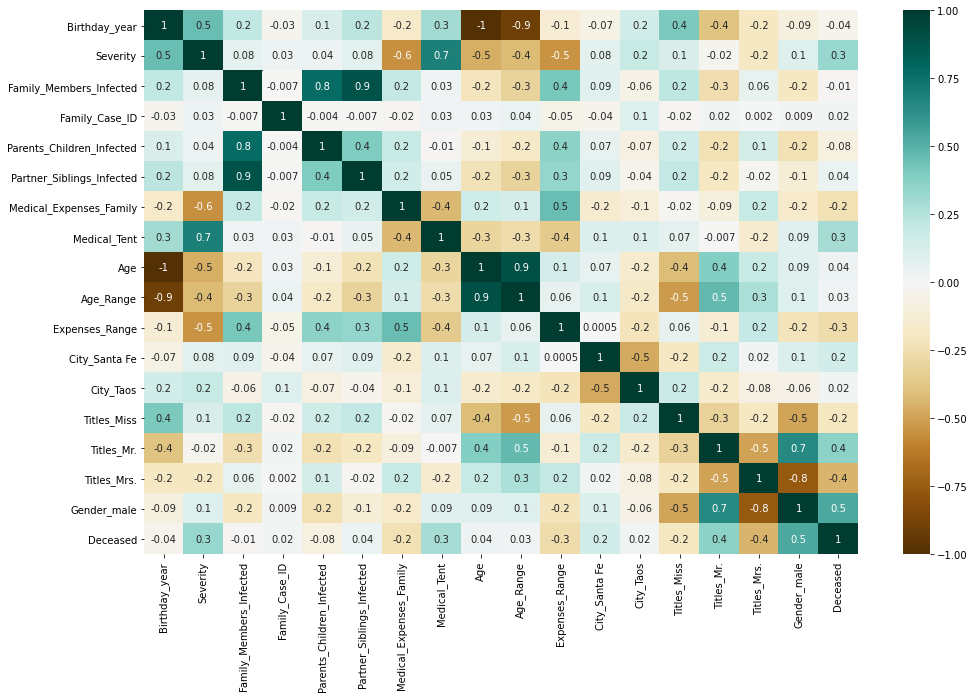

In [975]:
Train_temp_corr = Train_temp.copy()
corr = Train_temp_corr.corr()
figure = plt.figure(figsize=(16,10))
sns.heatmap(data = corr, annot=True, fmt='.1g', cmap='BrBG')

In [976]:
Train_no_outliers_temp = pd.concat([X_train_no_outliers_dummy, y_train],axis=1)

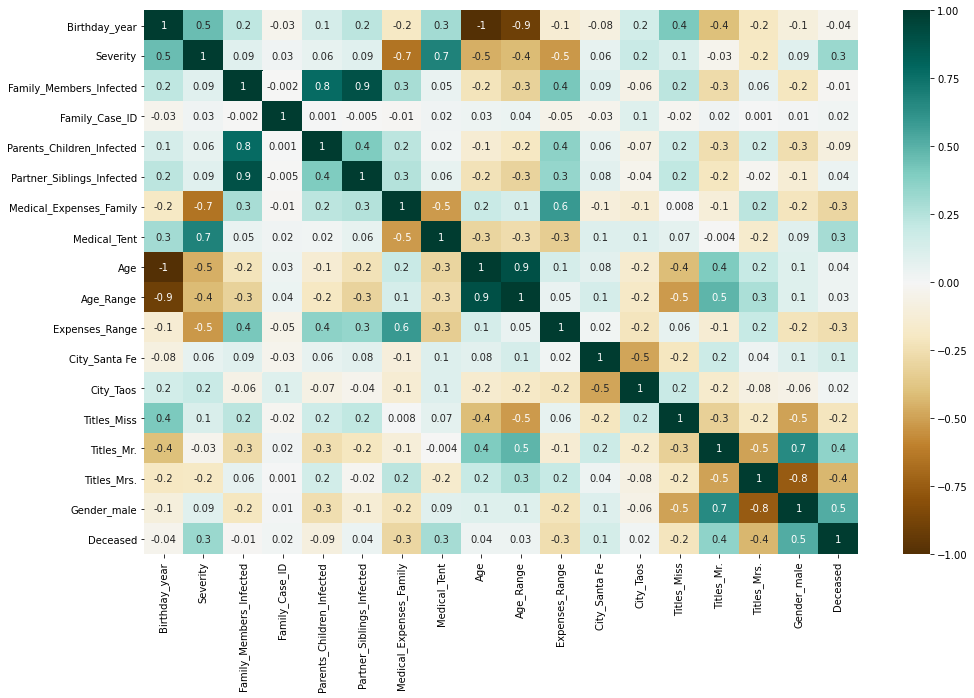

In [977]:
Train_no_outliers_temp_corr = Train_no_outliers_temp.copy()
corr = Train_no_outliers_temp_corr.corr()
figure = plt.figure(figsize=(16,10))
sns.heatmap(data = corr, annot=True, fmt='.1g', cmap='BrBG')

In [978]:
Train_clip_temp = pd.concat([X_train_clip_dummy, y_train],axis=1)

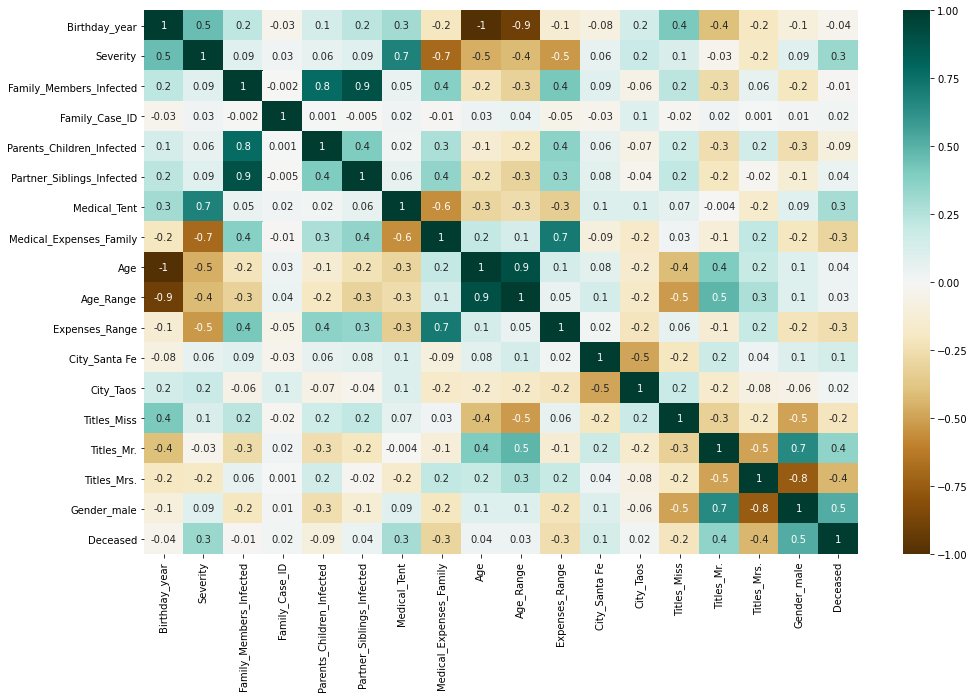

In [979]:
Train_clip_temp_corr = Train_clip_temp.copy()
corr = Train_clip_temp_corr.corr()
figure = plt.figure(figsize=(16,10))
sns.heatmap(data = corr, annot=True, fmt='.1g', cmap='BrBG')

We had the options of Severity, Medical tent, Medical expenses, titles and gender

Because severity, tent and expenses are correlated, we choosed to go with just the severity
Because titles and gender are correlated, we choosed to go with gender

### <span style='color:seagreen'> •	Qui Squared

In [980]:
Train_temp_2 = pd.concat([X_train, y_train],axis=1)

In [981]:
Train_temp_2.groupby(['Deceased', 'Medical_Tent']).count()

Birthday_year  Severity  Family_Members_Infected  \
Deceased Medical_Tent                                                     
0        A                         7         7                        7   
         B_C                      53        53                       53   
         E_D                      37        37                       37   
         F                         7         7                        7   
         G                         1         1                        1   
         Not Applied             173       173                      173   
1        A                         7         7                        7   
         B_C                      30        30                       30   
         E_D                      13        13                       13   
         F                         5         5                        5   
         G                         1         1                        1   
         Not Applied             385       385                      385   

                       Family_Case_ID  Name  Parents_Children_Infected  \
Deceased Medical_Tent                                                    
0        A                          7     7                          7   
         B_C                       53    53                         53   
         E_D                       37    37                         37   
         F                          7     7                          7   
         G                          1     1                          1   
         Not Applied              173   173                        173   
1        A                          7     7                          7   
         B_C                       30    30                         30   
         E_D                       13    13                         13   
         F                          5     5                          5   
         G                          1     1                          1   
         Not Applied              385   385                        385   

                       Partner_Siblings_Infected  Medical_Expenses_Family  \
Deceased Medical_Tent                                                       
0        A                                     7                        7   
         B_C                                  53                       53   
         E_D                                  37                       37   
         F                                     7                        7   
         G                                     1                        1   
         Not Applied                         173                      173   
1        A                                     7                        7   
         B_C                                  30                       30   
         E_D                                  13                       13   
         F                                     5                        5   
         G                                     1                        1   
         Not Applied                         385                      385   

                       City  Titles  Age  Gender  Age_Range  Severity_Range  \
Deceased Medical_Tent                                                         
0        A                7       7    7       7          7               7   
         B_C             53      53   53      53         53              53   
         E_D             37      37   37      37         37              37   
         F                7       7    7       7          7               7   
         G                1       1    1       1          1               1   
         Not Applied    173     173  173     173        173             173   
1        A                7       7    7       7          7               7   
         B_C             30      30   30      30         30              30   
         E_D             13      13   13      13         13       

In [982]:
#(H0): Two variables are independent

data = [[7, 23, 30, 17, 20, 7, 1, 173, 0] , [7, 11, 19, 7, 6, 5, 1, 385, 1]]
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 2.5775466272753056e-11
Dependent (reject H0)


In [983]:
Train_temp_2.groupby(['Deceased', 'Titles']).count()

Birthday_year  Severity  Family_Members_Infected  \
Deceased Titles                                                     
0        Master             32        32                       32   
         Miss               54        54                       54   
         Mr.                61        61                       61   
         Mrs.              131       131                      131   
1        Master            116       116                      116   
         Miss               26        26                       26   
         Mr.               261       261                      261   
         Mrs.               38        38                       38   

                 Family_Case_ID  Name  Parents_Children_Infected  \
Deceased Titles                                                    
0        Master              32    32                         32   
         Miss                54    54                         54   
         Mr.                 61    61                         61   
         Mrs.               131   131                        131   
1        Master             116   116                        116   
         Miss                26    26                         26   
         Mr.                261   261                        261   
         Mrs.                38    38                         38   

                 Partner_Siblings_Infected  Medical_Expenses_Family  \
Deceased Titles                                                       
0        Master                         32                       32   
         Miss                           54                       54   
         Mr.                            61                       61   
         Mrs.                          131                      131   
1        Master                        116                      116   
         Miss                           26                       26   
         Mr.                           261                      261   
         Mrs.                           38                       38   

                 Medical_Tent  City  Age  Gender  Age_Range  Severity_Range  \
Deceased Titles                                                               
0        Master            32    32   32      32         32              32   
         Miss              54    54   54      54         54              54   
         Mr.               61    61   61      61         61              61   
         Mrs.             131   131  131     131        131             131   
1        Master           116   116  116     116        116             116   
         Miss              26    26   26      26         26              26   
         Mr.              261   261  261     261        261             261   
         Mrs.              38    38   38      38         38              38   

                 Expenses_Range  
Deceased Titles                  
0        Master              32  
         Miss                54  
         Mr.                 61  
         Mrs.               131  
1        Master             116  
         Miss                26  
         Mr.                261  
         Mrs.                38

In [984]:
#(H0): Two variables are independent

data = [[32, 54, 61, 131] , [116, 26, 262, 38]]
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 1.218054634863162e-44
Dependent (reject H0)


In [985]:
Train_temp_2.groupby(['Deceased', 'Gender']).count()

Birthday_year  Severity  Family_Members_Infected  \
Deceased Gender                                                     
0        female            185       185                      185   
         male               93        93                       93   
1        female             64        64                       64   
         male              377       377                      377   

                 Family_Case_ID  Name  Parents_Children_Infected  \
Deceased Gender                                                    
0        female             185   185                        185   
         male                93    93                         93   
1        female              64    64                         64   
         male               377   377                        377   

                 Partner_Siblings_Infected  Medical_Expenses_Family  \
Deceased Gender                                                       
0        female                        185                      185   
         male                           93                       93   
1        female                         64                       64   
         male                          377                      377   

                 Medical_Tent  City  Titles  Age  Age_Range  Severity_Range  \
Deceased Gender                                                               
0        female           185   185     185  185        185             185   
         male              93    93      93   93         93              93   
1        female            64    64      64   64         64              64   
         male             377   377     377  377        377             377   

                 Expenses_Range  
Deceased Gender                  
0        female             185  
         male                93  
1        female              64  
         male               377

In [986]:
#(H0): Two variables are independent

data = [[185, 93] , [64, 378]]
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 6.875623584831268e-46
Dependent (reject H0)


In [987]:
Train_temp_2.groupby(['Deceased', 'Age_Range']).count()

Birthday_year  Severity  Family_Members_Infected  \
Deceased Age_Range                                                       
0        Senior                   5         5                        5   
         Adult                  113       113                      113   
         Young Adult             80        80                       80   
         Teen                    43        43                       43   
         Child                   37        37                       37   
1        Senior                  16        16                       16   
         Adult                  160       160                      160   
         Young Adult            146       146                      146   
         Teen                    81        81                       81   
         Child                   38        38                       38   

                      Family_Case_ID  Name  Parents_Children_Infected  \
Deceased Age_Range                                                      
0        Senior                    5     5                          5   
         Adult                   113   113                        113   
         Young Adult              80    80                         80   
         Teen                     43    43                         43   
         Child                    37    37                         37   
1        Senior                   16    16                         16   
         Adult                   160   160                        160   
         Young Adult             146   146                        146   
         Teen                     81    81                         81   
         Child                    38    38                         38   

                      Partner_Siblings_Infected  Medical_Expenses_Family  \
Deceased Age_Range                                                         
0        Senior                               5                        5   
         Adult                              113                      113   
         Young Adult                         80                       80   
         Teen                                43                       43   
         Child                               37                       37   
1        Senior                              16                       16   
         Adult                              160                      160   
         Young Adult                        146                      146   
         Teen                                81                       81   
         Child                               38                       38   

                      Medical_Tent  City  Titles  Age  Gender  Severity_Range  \
Deceased Age_Range                                                              
0        Senior                  5     5       5    5       5               5   
         Adult                 113   113     113  113     113             113   
         Young Adult            80    80      80   80      80              80   
         Teen                   43    43      43   43      43              43   
         Child                  37    37      37   37      37              37   
1        Senior                 16    16      16   16      16              16   
         Adult                 160   160     160  160     160             160   
         Young Adult           146   146     146  146     146             146   
         Teen                   81    81      81   81      81              81   
         Child                  38    38      38   38      38              38   

                      Expenses_Range  
Deceased Age_Range                    
0        Senior                    5  
         Adult                   113  
         Young Adult              80  
         Teen                     43  
         Child                    37  
1        Senior                   16  
         Adult                   160  
         Young Adul

In [988]:
#(H0): Two variables are independent

data = [[5, 113, 80, 43, 37] , [16, 161, 146, 84, 35]]
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 0.042241437345411595
Dependent (reject H0)


In [989]:
Train_temp_2.groupby(['Deceased', 'Severity_Range']).count()

Birthday_year  Severity  Family_Members_Infected  \
Deceased Severity_Range                                                     
0        High                       94        94                       94   
         Low                       109       109                      109   
         Medium                     75        75                       75   
1        High                      293       293                      293   
         Low                        68        68                       68   
         Medium                     80        80                       80   

                         Family_Case_ID  Name  Parents_Children_Infected  \
Deceased Severity_Range                                                    
0        High                        94    94                         94   
         Low                        109   109                        109   
         Medium                      75    75                         75   
1        High                       293   293                        293   
         Low                         68    68                         68   
         Medium                      80    80                         80   

                         Partner_Siblings_Infected  Medical_Expenses_Family  \
Deceased Severity_Range                                                       
0        High                                   94                       94   
         Low                                   109                      109   
         Medium                                 75                       75   
1        High                                  293                      293   
         Low                                    68                       68   
         Medium                                 80                       80   

                         Medical_Tent  City  Titles  Age  Gender  Age_Range  \
Deceased Severity_Range                                                       
0        High                      94    94      94   94      94         94   
         Low                      109   109     109  109     109        109   
         Medium                    75    75      75   75      75         75   
1        High                     293   293     293  293     293        293   
         Low                       68    68      68   68      68         68   
         Medium                    80    80      80   80      80         80   

                         Expenses_Range  
Deceased Severity_Range                  
0        High                        94  
         Low                        109  
         Medium                      75  
1        High                       293  
         Low                         68  
         Medium                      80

In [990]:
#(H0): Two variables are independent

data = [[94, 109, 75] , [293, 69, 80]]
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 1.0560657508854643e-17
Dependent (reject H0)


In [991]:
Train_temp_2.groupby(['Deceased', 'City']).count()

Birthday_year  Severity  Family_Members_Infected  \
Deceased City                                                            
0        Albuquerque             81        81                       81   
         Santa Fe               177       177                      177   
         Taos                    20        20                       20   
1        Albuquerque             61        61                       61   
         Santa Fe               343       343                      343   
         Taos                    37        37                       37   

                      Family_Case_ID  Name  Parents_Children_Infected  \
Deceased City                                                           
0        Albuquerque              81    81                         81   
         Santa Fe                177   177                        177   
         Taos                     20    20                         20   
1        Albuquerque              61    61                         61   
         Santa Fe                343   343                        343   
         Taos                     37    37                         37   

                      Partner_Siblings_Infected  Medical_Expenses_Family  \
Deceased City                                                              
0        Albuquerque                         81                       81   
         Santa Fe                           177                      177   
         Taos                                20                       20   
1        Albuquerque                         61                       61   
         Santa Fe                           343                      343   
         Taos                                37                       37   

                      Medical_Tent  Titles  Age  Gender  Age_Range  \
Deceased City                                                        
0        Albuquerque            81      81   81      81         81   
         Santa Fe              177     177  177     177        177   
         Taos                   20      20   20      20         20   
1        Albuquerque            61      61   61      61         61   
         Santa Fe              343     343  343     343        343   
         Taos                   37      37   37      37         37   

                      Severity_Range  Expenses_Range  
Deceased City                                         
0        Albuquerque              81              81  
         Santa Fe                177             177  
         Taos                     20              20  
1        Albuquerque              61              61  
         Santa Fe                343             343  
         Taos                     37              37

In [992]:
#(H0): Two variables are independent

data = [[81, 177, 20] , [61, 344, 37]]
stat, p, dof, expected = chi2_contingency(data)
  
# interpret p-value
alpha = 0.05
print("p value is " + str(p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (H0 holds true)')

p value is 3.0849523753416175e-06
Dependent (reject H0)


In [993]:
from sklearn.feature_selection import chi2
features = ['Medical_Tent', 'Titles_Miss',
       'Titles_Mr.', 'Titles_Mrs.', 'Gender_male', 'Age_Range',  'City_Santa Fe', 'City_Taos']

chi2_Best = SelectKBest(chi2, k=5)
Data_5_best = chi2_Best.fit_transform(X_train_dummy[features], y_train)
cols = chi2_Best.get_support(indices=True)
features_to_keep = X_train_dummy.iloc[:,cols]
features_to_keep.columns

Index(['Birthday_year', 'Severity', 'Family_Members_Infected',
       'Family_Case_ID', 'Parents_Children_Infected'],
      dtype='object')

In [994]:
from sklearn.feature_selection import chi2
features = ['Medical_Tent', 'Titles_Miss',
       'Titles_Mr.', 'Titles_Mrs.', 'Gender_male', 'Age_Range',  'City_Santa Fe', 'City_Taos']

chi2_Best = SelectKBest(chi2, k=5)
Data_5_best = chi2_Best.fit_transform(X_train_dummy, y_train)
cols = chi2_Best.get_support(indices=True)
features_to_keep = X_train_dummy.iloc[:,cols]
features_to_keep.columns

Index(['Family_Case_ID', 'Medical_Expenses_Family', 'Titles_Mr.',
       'Titles_Mrs.', 'Gender_male'],
      dtype='object')

In [1028]:
X_train_dummy.head()

,Birthday_year,Severity,Family_Members_Infected,Family_Case_ID,Parents_Children_Infected,Partner_Siblings_Infected,Medical_Expenses_Family,Medical_Tent,Age,Age_Range,Expenses_Range,City_Santa Fe,City_Taos,Titles_Miss,Titles_Mr.,Titles_Mrs.,Gender_male
Patient_ID,,,,,,,,,,,,,,,,,
28,2005,3,0.0,22832,0,0,217,0.016693,15,2,1,0,1,0,0,0,1
314,1988,3,0.0,18593,0,0,1582,0.775879,32,4,3,1,0,0,1,0,1
649,1993,2,0.0,3257,0,0,294,0.069519,27,3,2,1,0,0,0,1,0
375,1997,2,0.0,10199,0,0,364,0.775879,23,3,2,1,0,0,1,0,1
276,1959,1,0.0,5625,0,0,938,0.115417,61,5,3,1,0,0,1,0,1


### <span style='color:seagreen'> •	Mutual Information

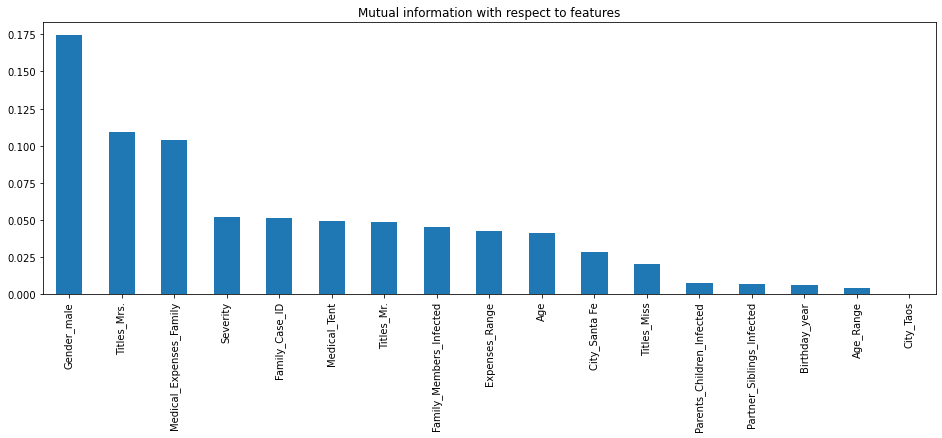

In [996]:
mi = mutual_info_classif(X_train_dummy, y_train)
mi = pd.Series(mi)
mi.index = X_train_dummy.columns
mi.sort_values(ascending=False, inplace = True)
plt.title('Mutual information with respect to features')
mi.plot.bar(figsize = (16,5))
plt.show()

gender, expenses, titles, severity

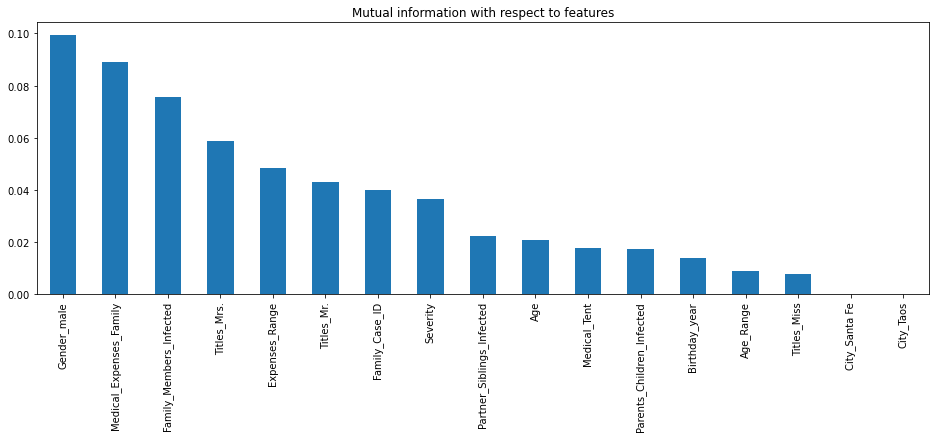

In [997]:
mi = mutual_info_classif(X_train_no_outliers_dummy, y_train_no_outliers)
mi = pd.Series(mi)
mi.index = X_train_no_outliers_dummy.columns
mi.sort_values(ascending=False, inplace = True)
plt.title('Mutual information with respect to features')
mi.plot.bar(figsize = (16,5))
plt.show()

gender, expenses, titles, *family infected*

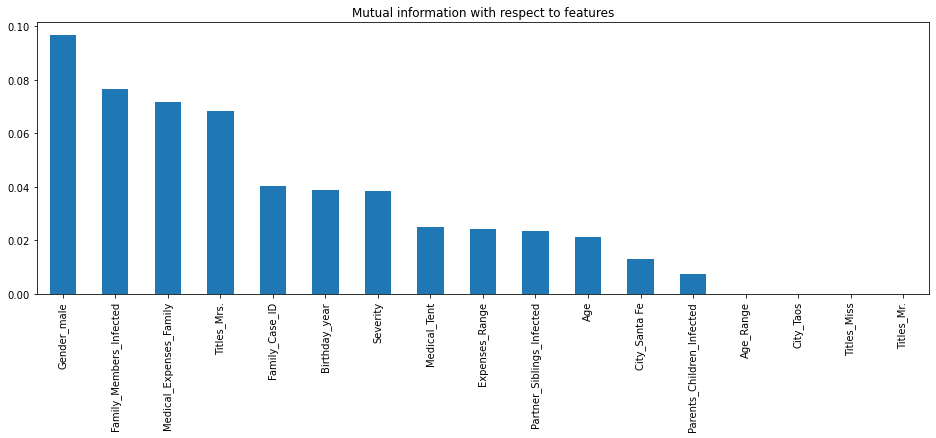

In [998]:
mi = mutual_info_classif(X_train_clip_dummy, y_train_clip)
mi = pd.Series(mi)
mi.index = X_train_clip_dummy.columns
mi.sort_values(ascending=False, inplace = True)
plt.title('Mutual information with respect to features')
mi.plot.bar(figsize = (16,5))
plt.show()

gender, titles, expenses

### <span style='color:seagreen'> •	ANOVA (F-values)

In [999]:
fvalue_Best = SelectKBest(f_classif, k=5)
Data_5_best = fvalue_Best.fit_transform(X_train_dummy, y_train)
cols=fvalue_Best.get_support(indices=True)
features_to_keep=X_train_dummy.iloc[:,cols]
features_to_keep.columns

Index(['Severity', 'Medical_Tent', 'Titles_Mr.', 'Titles_Mrs.', 'Gender_male'], dtype='object')

Severity, Tent, Titles, Gender

## <span style='color:seagreen'> Wrapper Method <a class="anchor" id="Wrapper_Method">

### <span style='color:seagreen'> RFE 

#### <span style='color:seagreen'> For Logistic Regression <a class="anchor" id="thirteenth-bullet">

In [1000]:
base_model = LogisticRegression()

data = X_train_dummy
target = y_train  

rfe = RFE(estimator = base_model, n_features_to_select = 5)
X_rfe = rfe.fit_transform(X = data, y = target) 
base_model.fit(X = X_rfe,y = target)
#rfe.support_
rfe.ranking_

array([11,  1,  8, 13,  9,  4, 12,  1, 10,  1,  7,  2,  3,  5,  6,  1,  1])

In [1001]:
selected_features = pd.Series(rfe.support_, index = data.columns)
selected_features

Birthday_year                False
Severity                      True
Family_Members_Infected      False
Family_Case_ID               False
Parents_Children_Infected    False
Partner_Siblings_Infected    False
Medical_Expenses_Family      False
Medical_Tent                  True
Age                          False
Age_Range                     True
Expenses_Range               False
City_Santa Fe                False
City_Taos                    False
Titles_Miss                  False
Titles_Mr.                   False
Titles_Mrs.                   True
Gender_male                   True
dtype: bool

In [1002]:
base_model = LogisticRegression()

data = X_train_no_outliers_dummy
target = y_train_no_outliers 

rfe = RFE(estimator = base_model, n_features_to_select = 5)
X_rfe = rfe.fit_transform(X = data, y = target) 
base_model.fit(X = X_rfe,y = target)
#rfe.support_
rfe.ranking_

array([11,  1,  9, 13,  8,  4, 12,  1, 10,  2,  7,  6,  5,  1,  3,  1,  1])

In [1003]:
selected_features = pd.Series(rfe.support_, index = data.columns)
selected_features

Birthday_year                False
Severity                      True
Family_Members_Infected      False
Family_Case_ID               False
Parents_Children_Infected    False
Partner_Siblings_Infected    False
Medical_Expenses_Family      False
Medical_Tent                  True
Age                          False
Age_Range                    False
Expenses_Range               False
City_Santa Fe                False
City_Taos                    False
Titles_Miss                   True
Titles_Mr.                   False
Titles_Mrs.                   True
Gender_male                   True
dtype: bool

In [1004]:
base_model = LogisticRegression()

data = X_train_clip_dummy
target = y_train_clip

rfe = RFE(estimator = base_model, n_features_to_select = 5)
X_rfe = rfe.fit_transform(X = data, y = target) 
base_model.fit(X = X_rfe,y = target)
#rfe.support_
rfe.ranking_

array([11,  1,  9, 13,  8,  4,  1, 12, 10,  2,  7,  6,  5,  1,  3,  1,  1])

In [1005]:
selected_features = pd.Series(rfe.support_, index = data.columns)
selected_features

Birthday_year                False
Severity                      True
Family_Members_Infected      False
Family_Case_ID               False
Parents_Children_Infected    False
Partner_Siblings_Infected    False
Medical_Tent                  True
Medical_Expenses_Family      False
Age                          False
Age_Range                    False
Expenses_Range               False
City_Santa Fe                False
City_Taos                    False
Titles_Miss                   True
Titles_Mr.                   False
Titles_Mrs.                   True
Gender_male                   True
dtype: bool

#### <span style='color:seagreen'> For Decision Classifier <a class="anchor" id="thirteenth-bullet">

In [1006]:
base_model = DecisionTreeClassifier()

data = X_train_dummy    
target = y_train    

rfe = RFE(estimator = base_model, n_features_to_select = 6) 
X_rfe = rfe.fit_transform(X = data, y = target) #
base_model.fit(X = X_rfe, y = target)
#rfe.support_
rfe.ranking_

array([ 1,  1,  4,  1,  6,  8,  1,  2,  1,  7,  9,  3, 11, 12,  5, 10,  1])

In [1007]:
selected_features = pd.Series(rfe.support_, index = data.columns)
selected_features

Birthday_year                 True
Severity                      True
Family_Members_Infected      False
Family_Case_ID                True
Parents_Children_Infected    False
Partner_Siblings_Infected    False
Medical_Expenses_Family       True
Medical_Tent                 False
Age                           True
Age_Range                    False
Expenses_Range               False
City_Santa Fe                False
City_Taos                    False
Titles_Miss                  False
Titles_Mr.                   False
Titles_Mrs.                  False
Gender_male                   True
dtype: bool

In [1008]:
base_model = DecisionTreeClassifier()

data = X_train_no_outliers_dummy    
target = y_train_no_outliers    

rfe = RFE(estimator = base_model, n_features_to_select = 6) 
X_rfe = rfe.fit_transform(X = data, y = target) 
base_model.fit(X = X_rfe, y = target)
#rfe.support_
rfe.ranking_

array([ 1,  1,  2,  1,  9,  8,  1,  4,  1,  5,  6,  3, 10, 12,  7, 11,  1])

In [1009]:
selected_features = pd.Series(rfe.support_, index = data.columns)
selected_features

Birthday_year                 True
Severity                      True
Family_Members_Infected      False
Family_Case_ID                True
Parents_Children_Infected    False
Partner_Siblings_Infected    False
Medical_Expenses_Family       True
Medical_Tent                 False
Age                           True
Age_Range                    False
Expenses_Range               False
City_Santa Fe                False
City_Taos                    False
Titles_Miss                  False
Titles_Mr.                   False
Titles_Mrs.                  False
Gender_male                   True
dtype: bool

In [1010]:
base_model = DecisionTreeClassifier()

data = X_train_clip_dummy    
target = y_train_clip 

rfe = RFE(estimator = base_model, n_features_to_select = 6) 
X_rfe = rfe.fit_transform(X = data, y = target)
base_model.fit(X = X_rfe, y = target)
#rfe.support_
rfe.ranking_

array([ 1,  1,  6,  1,  5,  3,  2,  1,  1,  7,  8,  4, 11, 12,  9, 10,  1])

In [1011]:
selected_features = pd.Series(rfe.support_, index = data.columns)
selected_features

Birthday_year                 True
Severity                      True
Family_Members_Infected      False
Family_Case_ID                True
Parents_Children_Infected    False
Partner_Siblings_Infected    False
Medical_Tent                 False
Medical_Expenses_Family       True
Age                           True
Age_Range                    False
Expenses_Range               False
City_Santa Fe                False
City_Taos                    False
Titles_Miss                  False
Titles_Mr.                   False
Titles_Mrs.                  False
Gender_male                   True
dtype: bool

#  

## <span style='color:seagreen'> Embedded Method <a class="anchor" id="Embedded_Method"> 

### <span style='color:seagreen'> LASSO 

In [1012]:
reg = LassoCV()
reg.fit(X= minmax_X_train, y=y_train)
print("Best alpha using built-in LassoCV: %f" % reg.alpha_)

Best alpha using built-in LassoCV: 0.000757


In [1013]:
reg.score(X= minmax_X_train, y=y_train)

0.402614038826563

In [1014]:
coef = pd.Series(reg.coef_, index = minmax_X_train.columns)
coef.sort_values()

Titles_Mrs.                 -0.116332
Expenses_Range              -0.042538
Titles_Mr.                  -0.012576
Birthday_year               -0.009991
Family_Case_ID              -0.000000
Parents_Children_Infected    0.000000
Medical_Expenses_Family      0.000000
Titles_Miss                 -0.000000
City_Taos                    0.055725
Family_Members_Infected      0.058241
City_Santa Fe                0.073165
Age_Range                    0.093724
Medical_Tent                 0.121155
Severity                     0.290017
Partner_Siblings_Infected    0.303902
Age                          0.362807
Gender_male                  0.422473
dtype: float64

In [1015]:
print("Lasso picked " + str(sum(coef != 0)) + " variables and eliminated the other " +  str(sum(coef == 0)) + " variables")

Lasso picked 13 variables and eliminated the other 4 variables


### <span style='color:seagreen'> Elastic Net 

In [1016]:
# Train the model
e_net = ElasticNet(alpha = 1)
e_net.fit(X_train_dummy, y_train)
  
# calculate the prediction and mean square error
y_pred_elastic = e_net.predict(X_train_dummy)
mean_squared_error = np.mean((y_pred_elastic - y_train)**2)
print("Mean Squared Error on test set", mean_squared_error)
  
e_net_coeff = pd.DataFrame()
e_net_coeff["Columns"] = X_train_dummy.columns
e_net_coeff['Coefficient Estimate'] = pd.Series(e_net.coef_)
e_net_coeff

Mean Squared Error on test set 0.22357412947804792


,Columns,Coefficient Estimate
0,Birthday_year,-4.434218e-05
1,Severity,0.000000e+00
2,Family_Members_Infected,0.000000e+00
3,Family_Case_ID,2.238276e-07
4,Parents_Children_Infected,-0.000000e+00
5,Partner_Siblings_Infected,0.000000e+00
6,Medical_Expenses_Family,-8.679409e-05
7,Medical_Tent,0.000000e+00
8,Age,4.789605e-05
9,Age_Range,0.000000e+00


Year, Family_ID, Expenses, Age

#  

## <span style='color:darkcyan'>  Prediction <a class="anchor" id="Prediction"> 

### <span style='color:darkcyan'>  •	Logistic Regression <a class="anchor" id="Logistic_Regression">

Severity, Tent, Age_Range, Titles, Gender


Severity, Medical tent, Medical expenses, titles and gender

Age_Range
Tent, Severity_Range, City
Titles, Gender

Gender, expenses, titles, severity

Severity, Tent, Titles, Gender

Year, Family_ID, Expenses, Age



Severity, Tent, Gender, Titles, Age_Range
Severity, Gender, Age_Range

#### <span style='color:darkcyan'>  X_train <a class="anchor" id="fiveteenth-bullet">

Min Max [0,1] X_train

In [1017]:
X_train_Log_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_mm = y_train

X_val_Log_mm = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_Log_mm = y_val


X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train_Log_mm, y_val_Log_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm.shape[0])] + [0 for _ in range(X_val_Log_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'C': 1}
------------------------------------------------------------------------------------------------------------------------
0.800 (+/-0.000) for {'C': 100}
0.800 (+/-0.000) for {'C': 10}
0.811 (+/-0.000) for {'C': 1}
0.800 (+/-0.000) for {'C': 0.1}
0.739 (+/-0.000) for {'C': 0.01}


In [1018]:
log_model = LogisticRegression(C=1)
log_model.fit(X_train_Log_mm, y_train_Log_mm)

y_pred_train = log_model.predict(X_train_Log_mm)
accuracy_score(y_train_Log_mm, y_pred_train) 

0.7983310152990264

In [1019]:
y_pred_val = log_model.predict(X_val_Log_mm)
accuracy_score(y_val_Log_mm, y_pred_val) 

0.8111111111111111

Submiting to Kaggle

In [1020]:
X_test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = log_model.predict(X_test)
y_pred_array

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0,
       1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,

In [1021]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

,Patient_ID,Deceased
0,901,1
1,902,1
2,903,1
3,904,1
4,905,1
...,...,...
395,1296,1
396,1297,1
397,1298,0
398,1299,1


In [1022]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Log_MinMax.csv', index = False)

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\Leonor\\Documents\\IMS\\2º Semestre\\Métodos Preditivos Data Mining\\Project\\Log_MinMax.csv'

Min Max [0,1] X_train

In [ ]:
X_train_Log_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_mm = y_train

X_val_Log_mm = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_Log_mm = y_val


X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train_Log_mm, y_val_Log_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm.shape[0])] + [0 for _ in range(X_val_Log_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=1)
log_model.fit(X_train_Log_mm, y_train_Log_mm)

y_pred_train = log_model.predict(X_train_Log_mm)
accuracy_score(y_train_Log_mm, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm)
accuracy_score(y_val_Log_mm, y_pred_val) 

Submiting to Kaggle

In [ ]:
log_model.fit(X, y)

X_test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = log_model.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Log_MinMax-1.csv', index = False)

Min Max [0,1] X_train with smote

In [ ]:
minmax_X_train.shape

In [ ]:
SVMsmote = SVMSMOTE(sampling_strategy='auto', random_state =5)
minmax_X_train_balanced, minmax_y_train_balanced = SVMsmote.fit_resample(minmax_X_train, y_train)
minmax_X_train_balanced.shape

In [ ]:
X_train_Log_mm_smote = minmax_X_train_balanced[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_mm_smote = minmax_y_train_balanced

X_val_Log_mm_smote = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_Log_mm_smote = y_val


X = pd.concat([X_train_Log_mm_smote, X_val_Log_mm_smote],axis=0)
y = pd.concat([y_train_Log_mm_smote, y_val_Log_mm_smote],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm_smote.shape[0])] + [0 for _ in range(X_val_Log_mm_smote.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=0.01)
log_model.fit(X_train_Log_mm_smote, y_train_Log_mm_smote)

y_pred_train = log_model.predict(X_train_Log_mm_smote)
accuracy_score(y_train_Log_mm_smote, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm_smote)
accuracy_score(y_val_Log_mm_smote, y_pred_val) 

Min Max [0,1] X_train with Gender_male, Age, Partner_Siblings_Infected, Expenses_Range

In [ ]:
X_train_Log_mm = minmax_X_train[['Gender_male', 'Age', 'Partner_Siblings_Infected', 'Expenses_Range']]
y_train_Log_mm = y_train

X_val_Log_mm = minmax_X_val[['Gender_male', 'Age', 'Partner_Siblings_Infected', 'Expenses_Range']]
y_val_Log_mm = y_val


X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train_Log_mm, y_val_Log_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm.shape[0])] + [0 for _ in range(X_val_Log_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=1)
log_model.fit(X_train_Log_mm, y_train_Log_mm)

y_pred_train = log_model.predict(X_train_Log_mm)
accuracy_score(y_train_Log_mm, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm)
accuracy_score(y_val_Log_mm, y_pred_val) 

In [ ]:
X_test = minmax_Test[['Gender_male', 'Age', 'Partner_Siblings_Infected', 'Expenses_Range']]

y_pred_array = log_model.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Log_MinMax2.csv', index = False)

Min Max [-1,1] X_train

In [ ]:
X_train_Log_mm1 = minmax_X_train1[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_mm1 = y_train

X_val_Log_mm1 = minmax_X_val1[['Severity', 'Gender_male', 'Age_Range']]
y_val_Log_mm1 = y_val


X = pd.concat([X_train_Log_mm1, X_val_Log_mm1],axis=0)
y = pd.concat([y_train_Log_mm1, y_val_Log_mm1],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm1.shape[0])] + [0 for _ in range(X_val_Log_mm1.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=1)
log_model.fit(X_train_Log_mm1, y_train_Log_mm1)

y_pred_train = log_model.predict(X_train_Log_mm1)
accuracy_score(y_train_Log_mm1, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm1)
accuracy_score(y_val_Log_mm1, y_pred_val) 

In [ ]:
X_test = minmax_Test1[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = log_model.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Log_MinMax4.csv', index = False)

Standard X_train

In [ ]:
X_train_Log_s = standard_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_s = y_train

X_val_Log_s = standard_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_Log_s = y_val


X = pd.concat([X_train_Log_s, X_val_Log_s],axis=0)
y = pd.concat([y_train_Log_s, y_val_Log_s],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_s.shape[0])] + [0 for _ in range(X_val_Log_s.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=0.1)
log_model.fit(X_train_Log_s, y_train_Log_s)

y_pred_train = log_model.predict(X_train_Log_s)
accuracy_score(y_train_Log_s, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_s)
accuracy_score(y_val_Log_s, y_pred_val) 

In [ ]:
X_test = standard_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = log_model.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Log_MinMax5.csv', index = False)

Robust X_train

In [ ]:
X_train_Log_r = robust_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_r = y_train

X_val_Log_r = robust_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_Log_r = y_val


X = pd.concat([X_train_Log_r, X_val_Log_r],axis=0)
y = pd.concat([y_train_Log_r, y_val_Log_r],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_r.shape[0])] + [0 for _ in range(X_val_Log_r.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=0.1)
log_model.fit(X_train_Log_r, y_train_Log_r)

y_pred_train = log_model.predict(X_train_Log_r)
accuracy_score(y_train_Log_r, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_r)
accuracy_score(y_val_Log_r, y_pred_val) 

In [ ]:
X_test = robust_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = log_model.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Log_MinMax6.csv', index = False)

#### <span style='color:darkcyan'>  X_train_no_outliers <a class="anchor" id="fiveteenth-bullet">

MinMax [0,1] X_train_no_outliers

In [ ]:
X_train_Log_mm_out = minmax_X_train_no_outliers[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_mm_out = y_train_no_outliers

X_val_Log_mm_out = minmax_X_val_no_outliers[['Severity', 'Gender_male', 'Age_Range']]
y_val_Log_mm_out = pd.DataFrame (y_val)


X = pd.concat([X_train_Log_mm_out, X_val_Log_mm_out],axis=0)
y = pd.concat([y_train_Log_mm_out, y_val_Log_mm_out],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm_out.shape[0])] + [0 for _ in range(X_val_Log_mm_out.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=100)
log_model.fit(X_train_Log_mm_out, y_train_Log_mm_out)

y_pred_train = log_model.predict(X_train_Log_mm_out)
accuracy_score(y_train_Log_mm_out, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm_out)
accuracy_score(y_val_Log_mm_out, y_pred_val)

In [ ]:
X_test = minmax_Test_no_outliers[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = log_model.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Log_MinMax7.csv', index = False)

#### <span style='color:darkcyan'>  X_train_clip <a class="anchor" id="fiveteenth-bullet">

MinMax [0,1] X_train_clip

In [ ]:
X_train_Log_mm_clip = minmax_X_train_clip[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_mm_clip = y_train_clip

X_val_Log_mm_clip = minmax_X_val_Mix_clip[['Severity', 'Gender_male', 'Age_Range']]
y_val_Log_mm_clip = pd.DataFrame (y_val)


X = pd.concat([X_train_Log_mm_clip, X_val_Log_mm_clip],axis=0)
y = pd.concat([y_train_Log_mm_clip, y_val_Log_mm_clip],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm_clip.shape[0])] + [0 for _ in range(X_val_Log_mm_clip.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=100)
log_model.fit(X_train_Log_mm_clip, y_train_Log_mm_clip)

y_pred_train = log_model.predict(X_train_Log_mm_clip)
accuracy_score(y_train_Log_mm_clip, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm_clip)
accuracy_score(y_val_Log_mm_clip, y_pred_val)

Min Max [0,1] X_train com [['Severity', 'Gender_male']]

In [ ]:
X_train_Log_mm = minmax_X_train[['Severity', 'Gender_male', 'Age']]
y_train_Log_mm = y_train

X_val_Log_mm = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_Log_mm = y_val


X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train_Log_mm, y_val_Log_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm.shape[0])] + [0 for _ in range(X_val_Log_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=1)
log_model.fit(X_train_Log_mm, y_train_Log_mm)

y_pred_train = log_model.predict(X_train_Log_mm)
accuracy_score(y_train_Log_mm, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm)
accuracy_score(y_val_Log_mm, y_pred_val) 

Min Max [0,1] X_train com [['Severity', 'Gender_male']]

In [ ]:
X_train_Log_mm = minmax_X_train[['Severity', 'Gender_male']]
y_train_Log_mm = y_train

X_val_Log_mm = minmax_X_val[['Severity', 'Gender_male']]
y_val_Log_mm = y_val


X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train_Log_mm, y_val_Log_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm.shape[0])] + [0 for _ in range(X_val_Log_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=100)
log_model.fit(X_train_Log_mm, y_train_Log_mm)

y_pred_train = log_model.predict(X_train_Log_mm)
accuracy_score(y_train_Log_mm, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm)
accuracy_score(y_val_Log_mm, y_pred_val) 

Min Max [0,1] X_train com [['Medical_Tent', 'Gender_male', 'Age']]

In [ ]:
X_train_Log_mm = minmax_X_train[['Medical_Tent', 'Gender_male', 'Age']]
y_train_Log_mm = y_train

X_val_Log_mm = minmax_X_val[['Medical_Tent', 'Gender_male', 'Age']]
y_val_Log_mm = y_val


X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train_Log_mm, y_val_Log_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm.shape[0])] + [0 for _ in range(X_val_Log_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=100)
log_model.fit(X_train_Log_mm, y_train_Log_mm)

y_pred_train = log_model.predict(X_train_Log_mm)
accuracy_score(y_train_Log_mm, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm)
accuracy_score(y_val_Log_mm, y_pred_val) 

Min Max [0,1] X_train com [['Medical_Tent', 'Titles_Miss',
       'Titles_Mr.', 'Titles_Mrs.']]

In [ ]:
X_train_Log_mm = minmax_X_train[['Medical_Tent', 'Titles_Miss',
       'Titles_Mr.', 'Titles_Mrs.']]
y_train_Log_mm = y_train

X_val_Log_mm = minmax_X_val[['Medical_Tent', 'Titles_Miss',
       'Titles_Mr.', 'Titles_Mrs.']]
y_val_Log_mm = y_val


X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train_Log_mm, y_val_Log_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm.shape[0])] + [0 for _ in range(X_val_Log_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=100)
log_model.fit(X_train_Log_mm, y_train_Log_mm)

y_pred_train = log_model.predict(X_train_Log_mm)
accuracy_score(y_train_Log_mm, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm)
accuracy_score(y_val_Log_mm, y_pred_val) 

Min Max [0,1] X_train com [['Severity', 'Gender_male', 'Family_Members_Infected']]

In [ ]:
X_train_Log_mm = minmax_X_train[['Severity', 'Gender_male', 'Family_Members_Infected']]
y_train_Log_mm = y_train

X_val_Log_mm = minmax_X_val[['Severity', 'Gender_male', 'Family_Members_Infected']]
y_val_Log_mm = y_val


X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train_Log_mm, y_val_Log_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_mm.shape[0])] + [0 for _ in range(X_val_Log_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=100)
log_model.fit(X_train_Log_mm, y_train_Log_mm)

y_pred_train = log_model.predict(X_train_Log_mm)
accuracy_score(y_train_Log_mm, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_mm)
accuracy_score(y_val_Log_mm, y_pred_val) 

Standard [0,1] X_train

In [ ]:
X_train_Log_d = standard_X_train[['Severity', 'Gender_male', 'Age']]
y_train_Log_d = y_train

X_val_Log_d = standard_X_val[['Severity', 'Gender_male', 'Age']]
y_val_Log_d = y_val


X = pd.concat([X_train_Log_d, X_val_Log_d],axis=0)
y = pd.concat([y_train_Log_d, y_val_Log_d],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_Log_d.shape[0])] + [0 for _ in range(X_val_Log_d.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [100, 10, 1, 0.1, 0.01],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = LogisticRegression(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
log_model = LogisticRegression(C=0.1)
log_model.fit(X_train_Log_d, y_train_Log_d)

y_pred_train = log_model.predict(X_train_Log_d)
accuracy_score(y_train_Log_d, y_pred_train) 

In [ ]:
y_pred_val = log_model.predict(X_val_Log_d)
accuracy_score(y_val_Log_d, y_pred_val) 

In [ ]:
X_test = standard_Test[['Severity', 'Gender_male', 'Age']]

y_pred_array = log_model.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Log_MinMax8.csv', index = False)

#   

### <span style='color:darkcyan'>  •	Gaussian Naive Bayes <a class="anchor" id="Gaussian_Naive_Bayes">

Severity, Tent, Expenses, Titles, Gender (Age)

MinMax [0,1] X_train

In [ ]:
X_train_GNB_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_mm = y_train

X_val_GNB_mm = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_mm = y_val


X = pd.concat([X_train_GNB_mm, X_val_GNB_mm],axis=0)
y = pd.concat([y_train_GNB_mm, y_val_GNB_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_mm.shape[0])] + [0 for _ in range(X_val_GNB_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 1)
modelNB.fit(X_train_GNB_mm, y_train_GNB_mm)

y_pred_train = modelNB.predict(X_train_GNB_mm)
accuracy_score(y_train_GNB_mm, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_mm)
accuracy_score(y_val_GNB_mm, y_pred_val)

In [ ]:
X_test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelNB.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GaussianNB.csv', index = False)

MinMax [0,1] X_train

In [ ]:
X_train_GNB_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_mm = y_train

X_val_GNB_mm = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_mm = y_val


X = pd.concat([X_train_GNB_mm, X_val_GNB_mm],axis=0)
y = pd.concat([y_train_GNB_mm, y_val_GNB_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_mm.shape[0])] + [0 for _ in range(X_val_GNB_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 1)
modelNB.fit(X_train_GNB_mm, y_train_GNB_mm)

y_pred_train = modelNB.predict(X_train_GNB_mm)
accuracy_score(y_train_GNB_mm, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_mm)
accuracy_score(y_val_GNB_mm, y_pred_val)

In [ ]:
modelNB.fit(X, y)

X_test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelNB.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GaussianNB-1.csv', index = False)

MinMax [0,1] X_train

In [ ]:
X_train_GNB_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_mm = y_train

X_val_GNB_mm = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_mm = y_val


X = pd.concat([X_train_GNB_mm, X_val_GNB_mm],axis=0)
y = pd.concat([y_train_GNB_mm, y_val_GNB_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_mm.shape[0])] + [0 for _ in range(X_val_GNB_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 1)
modelNB.fit(X_train_GNB_mm, y_train_GNB_mm)

y_pred_train = modelNB.predict(X_train_GNB_mm)
accuracy_score(y_train_GNB_mm, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_mm)
accuracy_score(y_val_GNB_mm, y_pred_val)

In [ ]:
modelNB.fit(X, y)
X_test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelNB.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GaussianNB.csv', index = False)

MinMax [0,1] X_train with smote

In [ ]:
minmax_X_train.shape

In [ ]:
SVMsmote = SVMSMOTE(sampling_strategy='auto', random_state = 5)
minmax_X_train_balanced, minmax_y_train_balanced = SVMsmote.fit_resample(minmax_X_train, y_train)
minmax_X_train_balanced.shape

In [ ]:
X_train_GNB_mm_smote = minmax_X_train_balanced[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_mm_smote = minmax_y_train_balanced

X_val_GNB_mm_smote = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_mm_smote = y_val


X = pd.concat([X_train_GNB_mm_smote, X_val_GNB_mm_smote],axis=0)
y = pd.concat([y_train_GNB_mm_smote, y_val_GNB_mm_smote],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_mm_smote.shape[0])] + [0 for _ in range(X_val_GNB_mm_smote.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 1)
modelNB.fit(X_train_GNB_mm_smote, y_train_GNB_mm_smote)

y_pred_train = modelNB.predict(X_train_GNB_mm_smote)
accuracy_score(y_train_GNB_mm_smote, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_mm_smote)
accuracy_score(y_val_GNB_mm_smote, y_pred_val)

MinMax [-1,1] X_train

In [ ]:
X_train_GNB_mm1 = minmax_X_train1[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_mm1 = y_train

X_val_GNB_mm1 = minmax_X_val1[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_mm1 = y_val


X = pd.concat([X_train_GNB_mm1, X_val_GNB_mm1],axis=0)
y = pd.concat([y_train_GNB_mm1, y_val_GNB_mm1],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_mm1.shape[0])] + [0 for _ in range(X_val_GNB_mm1.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 1)
modelNB.fit(X_train_GNB_mm1, y_train_GNB_mm1)

y_pred_train = modelNB.predict(X_train_GNB_mm1)
accuracy_score(y_train_GNB_mm1, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_mm1)
accuracy_score(y_val_GNB_mm1, y_pred_val)

In [ ]:
X_test = minmax_Test1[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelNB.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GaussianNB2.csv', index = False)

Standard X_train

In [ ]:
X_train_GNB_s = standard_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_s = y_train

X_val_GNB_s = standard_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_s = y_val


X = pd.concat([X_train_GNB_s, X_val_GNB_s],axis=0)
y = pd.concat([y_train_GNB_s, y_val_GNB_s],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_s.shape[0])] + [0 for _ in range(X_val_GNB_s.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 1)
modelNB.fit(X_train_GNB_s, y_train_GNB_s)

y_pred_train = modelNB.predict(X_train_GNB_s)
accuracy_score(y_train_GNB_s, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_s)
accuracy_score(y_val_GNB_s, y_pred_val)

Robust X_train

In [ ]:
X_train_GNB_r = robust_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_r = y_train

X_val_GNB_r = robust_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_r = y_val


X = pd.concat([X_train_GNB_r, X_val_GNB_r],axis=0)
y = pd.concat([y_train_GNB_r, y_val_GNB_r],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_r.shape[0])] + [0 for _ in range(X_val_GNB_r.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 0.23101297000831597)
modelNB.fit(X_train_GNB_r, y_train_GNB_r)

y_pred_train = modelNB.predict(X_train_GNB_r)
accuracy_score(y_train_GNB_r, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_r)
accuracy_score(y_val_GNB_r, y_pred_val)

MixMax [0,1] X_train_no_outliers

In [ ]:
X_train_GNB_mm_out = minmax_X_train_no_outliers[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_mm_out = y_train_no_outliers

X_val_GNB_mm_out = minmax_X_val_no_outliers[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_mm_out = pd.DataFrame(y_val)


X = pd.concat([X_train_GNB_mm_out, X_val_GNB_mm_out],axis=0)
y = pd.concat([y_train_GNB_mm_out, y_val_GNB_mm_out],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_mm_out.shape[0])] + [0 for _ in range(X_val_GNB_mm_out.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 0.8111308307896871)
modelNB.fit(X_train_GNB_mm_out, y_train_GNB_mm_out)

y_pred_train = modelNB.predict(X_train_GNB_mm_out)
accuracy_score(y_train_GNB_mm_out, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_mm_out)
accuracy_score(y_val_GNB_mm_out, y_pred_val)

MixMax [0,1] X_train_clip

In [ ]:
X_train_GNB_mm_clip = minmax_X_train_clip[['Severity', 'Gender_male', 'Age_Range']]
y_train_GNB_mm_clip = y_train_clip

X_val_GNB_mm_clip = minmax_X_val_clip[['Severity', 'Gender_male', 'Age_Range']]
y_val_GNB_mm_clip = pd.DataFrame(y_val)


X = pd.concat([X_train_GNB_mm_clip, X_val_GNB_mm_clip],axis=0)
y = pd.concat([y_train_GNB_mm_clip, y_val_GNB_mm_clip],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_mm_clip.shape[0])] + [0 for _ in range(X_val_GNB_mm_clip.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 0.8111308307896871)
modelNB.fit(X_train_GNB_mm_clip, y_train_GNB_mm_clip)

y_pred_train = modelNB.predict(X_train_GNB_mm_clip)
accuracy_score(y_train_GNB_mm_clip, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_mm_clip)
accuracy_score(y_val_GNB_mm_clip, y_pred_val)

MinMax [-1,1] X_train with Expenses_Range

In [ ]:
X_train_GNB_mm = minmax_X_train[['Expenses_Range', 'Gender_male', 'Age_Range']]
y_train_GNB_mm = y_train

X_val_GNB_mm = minmax_X_val[['Expenses_Range', 'Gender_male', 'Age_Range']]
y_val_GNB_mm = y_val


X = pd.concat([X_train_GNB_mm, X_val_GNB_mm],axis=0)
y = pd.concat([y_train_GNB_mm, y_val_GNB_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GNB_mm.shape[0])] + [0 for _ in range(X_val_GNB_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'var_smoothing': np.logspace(0,-9, num=100),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GaussianNB(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNB = GaussianNB(var_smoothing = 1)
modelNB.fit(X_train_GNB_mm, y_train_GNB_mm)

y_pred_train = modelNB.predict(X_train_GNB_mm)
accuracy_score(y_train_GNB_mm, y_pred_train) 

In [ ]:
y_pred_val = modelNB.predict(X_val_GNB_mm)
accuracy_score(y_val_GNB_mm, y_pred_val)

#  

### <span style='color:darkcyan'>  •	KNN <a class="anchor" id="KNN">

X_train_dummy

In [ ]:
X_train_KNN_dummy = X_train_dummy[['Medical_Tent', 'Gender_male', 'Age_Range']]
y_train_KNN_dummy = y_train

X_val_KNN_dummy = X_val_dummy[['Medical_Tent', 'Gender_male', 'Age_Range']]
y_val_KNN_dummy = y_val


X = pd.concat([X_train_KNN_dummy, X_val_KNN_dummy],axis=0)
y = pd.concat([y_train_KNN_dummy, y_val_KNN_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_dummy.shape[0])] + [0 for _ in range(X_val_KNN_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'brute', metric= 'euclidean', n_neighbors= 9, weights= 'uniform')
modelKNN.fit(X_train_KNN_dummy, y_train_KNN_dummy)

y_pred_train = modelKNN.predict(X_train_KNN_dummy)
accuracy_score(y_train_KNN_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_dummy)
accuracy_score(y_val_KNN_dummy, y_pred_val) 

In [ ]:
X_test = Test_dummy[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelKNN.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\KNN_Dummy.csv', index = False)

X_train_dummy with n_neighbors and metric

In [ ]:
X_train_KNN_dummy = X_train_dummy[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_dummy = y_train

X_val_KNN_dummy = X_val_dummy[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_dummy = y_val


X = pd.concat([X_train_KNN_dummy, X_val_KNN_dummy],axis=0)
y = pd.concat([y_train_KNN_dummy, y_val_KNN_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_dummy.shape[0])] + [0 for _ in range(X_val_KNN_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'metric': ['euclidean', 'minkowski', 'manhattan']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(metric= 'euclidean', n_neighbors= 7)
modelKNN.fit(X_train_KNN_dummy, y_train_KNN_dummy)

y_pred_train = modelKNN.predict(X_train_KNN_dummy)
accuracy_score(y_train_KNN_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_dummy)
accuracy_score(y_val_KNN_dummy, y_pred_val) 

MinMax [0,1] X_train

In [ ]:
X_train_KNN_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_mm = y_train

X_val_KNN_mm = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_mm = y_val


X = pd.concat([X_train_KNN_mm, X_val_KNN_mm],axis=0)
y = pd.concat([y_train_KNN_mm, y_val_KNN_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_mm.shape[0])] + [0 for _ in range(X_val_KNN_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'brute', metric= 'euclidean', n_neighbors= 9, weights= 'uniform')
modelKNN.fit(X_train_KNN_mm, y_train_KNN_mm)

y_pred_train = modelKNN.predict(X_train_KNN_mm)
accuracy_score(y_train_KNN_mm, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_mm)
accuracy_score(y_val_KNN_mm, y_pred_val) 

Standard X_train

In [ ]:
X_train_KNN_mm = standard_X_train[['Expenses_Range','Gender_male', 'Age']]
y_train_KNN_mm = y_train

X_val_KNN_mm = standard_X_val[['Expenses_Range','Gender_male', 'Age']]
y_val_KNN_mm = y_val


X = pd.concat([X_train_KNN_mm, X_val_KNN_mm],axis=0)
y = pd.concat([y_train_KNN_mm, y_val_KNN_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_mm.shape[0])] + [0 for _ in range(X_val_KNN_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'auto', n_neighbors= 7, weights= 'uniform')
modelKNN.fit(X_train_KNN_mm, y_train_KNN_mm)

y_pred_train = modelKNN.predict(X_train_KNN_mm)
accuracy_score(y_train_KNN_mm, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_mm)
accuracy_score(y_val_KNN_mm, y_pred_val) 

In [ ]:
X_test = standard_Test[['Expenses_Range','Gender_male', 'Age']]

y_pred_array = modelKNN.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\KNN_S_2.csv', index = False)

MinMax [0,1] X_train

In [ ]:
X_train_KNN_mm = standard_X_train[['Severity', 'Gender_male', 'Age']]
y_train_KNN_mm = y_train

X_val_KNN_mm = standard_X_val[['Severity', 'Gender_male', 'Age']]
y_val_KNN_mm = y_val


X = pd.concat([X_train_KNN_mm, X_val_KNN_mm],axis=0)
y = pd.concat([y_train_KNN_mm, y_val_KNN_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_mm.shape[0])] + [0 for _ in range(X_val_KNN_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'brute', metric= 'manhattan', n_neighbors= 10, weights= 'uniform')
modelKNN.fit(X_train_KNN_mm, y_train_KNN_mm)

y_pred_train = modelKNN.predict(X_train_KNN_mm)
accuracy_score(y_train_KNN_mm, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_mm)
accuracy_score(y_val_KNN_mm, y_pred_val) 

MinMax [0,1] X_train with n_neighbors, metric and algorithm

In [ ]:
X_train_KNN_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_mm = y_train

X_val_KNN_mm = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_mm = y_val


X = pd.concat([X_train_KNN_mm, X_val_KNN_mm],axis=0)
y = pd.concat([y_train_KNN_mm, y_val_KNN_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_mm.shape[0])] + [0 for _ in range(X_val_KNN_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'brute', weights = 'uniform', n_neighbors= 9)
modelKNN.fit(X_train_KNN_mm, y_train_KNN_mm)

y_pred_train = modelKNN.predict(X_train_KNN_mm)
accuracy_score(y_train_KNN_mm, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_mm)
accuracy_score(y_val_KNN_mm, y_pred_val) 

MinMax [0,1] X_train with n_neighbors and metric

In [ ]:
X_train_KNN_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_mm = y_train

X_val_KNN_mm = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_mm = y_val


X = pd.concat([X_train_KNN_mm, X_val_KNN_mm],axis=0)
y = pd.concat([y_train_KNN_mm, y_val_KNN_mm],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_mm.shape[0])] + [0 for _ in range(X_val_KNN_mm.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'metric': ['euclidean', 'minkowski', 'manhattan'],
    'weights': ['uniform', 'distance'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(metric = 'euclidean', weights = 'uniform')
modelKNN.fit(X_train_KNN_mm, y_train_KNN_mm)

y_pred_train = modelKNN.predict(X_train_KNN_mm)
accuracy_score(y_train_KNN_mm, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_mm)
accuracy_score(y_val_KNN_mm, y_pred_val) 

MinMax [-1,1] X_train

In [ ]:
X_train_KNN_mm1 = minmax_X_train1[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_mm1 = y_train

X_val_KNN_mm1 = minmax_X_val1[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_mm1 = y_val


X = pd.concat([X_train_KNN_mm1, X_val_KNN_mm1],axis=0)
y = pd.concat([y_train_KNN_mm1, y_val_KNN_mm1],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_mm1.shape[0])] + [0 for _ in range(X_val_KNN_mm1.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'brute', metric= 'euclidean', n_neighbors= 9, weights= 'uniform')
modelKNN.fit(X_train_KNN_mm1, y_train_KNN_mm1)

y_pred_train = modelKNN.predict(X_train_KNN_mm1)
accuracy_score(y_train_KNN_mm1, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_mm1)
accuracy_score(y_val_KNN_mm1, y_pred_val) 

Standard X_train

In [ ]:
X_train_KNN_s = standard_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_s = y_train

X_val_KNN_s = standard_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_s = y_val


X = pd.concat([X_train_KNN_s, X_val_KNN_s],axis=0)
y = pd.concat([y_train_KNN_s, y_val_KNN_s],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_s.shape[0])] + [0 for _ in range(X_val_KNN_s.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'auto', metric= 'euclidean', n_neighbors= 7, weights= 'uniform')
modelKNN.fit(X_train_KNN_s, y_train_KNN_s)

y_pred_train = modelKNN.predict(X_train_KNN_s)
accuracy_score(y_train_KNN_s, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_s)
accuracy_score(y_val_KNN_s, y_pred_val) 

In [ ]:
X_test = standard_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelKNN.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\KNN10.csv', index = False)

Standard X_train

In [ ]:
SVMsmote = SVMSMOTE(sampling_strategy='auto', random_state = 5)
standard_X_train_balanced, standard_y_train_balanced = SVMsmote.fit_resample(standard_X_train, y_train)
standard_X_train_balanced.shape

In [ ]:
X_train_KNN_s = standard_X_train_balanced[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_s = standard_y_train_balanced

X_val_KNN_s = standard_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_s = y_val


X = pd.concat([X_train_KNN_s, X_val_KNN_s],axis=0)
y = pd.concat([y_train_KNN_s, y_val_KNN_s],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_s.shape[0])] + [0 for _ in range(X_val_KNN_s.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'brute', metric= 'manhattan', n_neighbors= 9, weights= 'uniform')
modelKNN.fit(X_train_KNN_s, y_train_KNN_s)

y_pred_train = modelKNN.predict(X_train_KNN_s)
accuracy_score(y_train_KNN_s, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_s)
accuracy_score(y_val_KNN_s, y_pred_val) 

Standard X_train

In [ ]:
X_train_KNN_s = standard_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_s = y_train

X_val_KNN_s = standard_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_s = y_val


X = pd.concat([X_train_KNN_s, X_val_KNN_s],axis=0)
y = pd.concat([y_train_KNN_s, y_val_KNN_s],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_s.shape[0])] + [0 for _ in range(X_val_KNN_s.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'auto', metric= 'euclidean', n_neighbors= 7, weights= 'uniform')
modelKNN.fit(X_train_KNN_s, y_train_KNN_s)

y_pred_train = modelKNN.predict(X_train_KNN_s)
accuracy_score(y_train_KNN_s, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_s)
accuracy_score(y_val_KNN_s, y_pred_val) 

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'auto', metric= 'euclidean', n_neighbors= 7, weights= 'uniform')
modelKNN.fit(X, y)

X_test = standard_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelKNN.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\KNN11.csv', index = False)

Robust X_train

In [ ]:
X_train_KNN_r = robust_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_r = y_train

X_val_KNN_r = robust_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_r = y_val


X = pd.concat([X_train_KNN_r, X_val_KNN_r],axis=0)
y = pd.concat([y_train_KNN_r, y_val_KNN_r],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_r.shape[0])] + [0 for _ in range(X_val_KNN_r.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'auto', metric= 'euclidean', n_neighbors= 7, weights= 'uniform')
modelKNN.fit(X_train_KNN_r, y_train_KNN_r)

y_pred_train = modelKNN.predict(X_train_KNN_r)
accuracy_score(y_train_KNN_r, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_r)
accuracy_score(y_val_KNN_r, y_pred_val) 

X_train_no_outliers

In [ ]:
X_train_KNN_out_dummy = X_train_no_outliers_dummy[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_out_dummy = y_train_no_outliers

X_val_KNN_out_dummy = X_val_dummy[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_out_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_KNN_out_dummy, X_val_KNN_out_dummy],axis=0)
y = pd.concat([y_train_KNN_out_dummy, y_val_KNN_out_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_out_dummy.shape[0])] + [0 for _ in range(X_val_KNN_out_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'brute', metric= 'euclidean', n_neighbors= 6, weights= 'uniform')
modelKNN.fit(X_train_KNN_out_dummy, y_train_KNN_out_dummy)

y_pred_train = modelKNN.predict(X_train_KNN_out_dummy)
accuracy_score(y_train_KNN_out_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_out_dummy)
accuracy_score(y_val_KNN_out_dummy, y_pred_val) 

Standard X_train_no_outliers

In [ ]:
X_train_KNN_s_out = standard_X_train_no_outliers[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_s_out = y_train_no_outliers

X_val_KNN_s_out = standard_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_s_out = pd.DataFrame(y_val)


X = pd.concat([X_train_KNN_s_out, X_val_KNN_s_out],axis=0)
y = pd.concat([y_train_KNN_s_out, y_val_KNN_s_out],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_s_out.shape[0])] + [0 for _ in range(X_val_KNN_s_out.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'metric': ['euclidean', 'minkowski', 'manhattan' ]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(algorithm = 'auto', metric= 'manhattan', n_neighbors= 5, weights= 'uniform')
modelKNN.fit(X_train_KNN_s_out, y_train_KNN_s_out)

y_pred_train = modelKNN.predict(X_train_KNN_s_out)
accuracy_score(y_train_KNN_s_out, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_s_out)
accuracy_score(y_val_KNN_s_out, y_pred_val) 

X_train_dummy with n_neighbors and metric

In [ ]:
X_train_KNN_dummy = X_train_clip_dummy[['Severity', 'Gender_male', 'Age_Range']]
y_train_KNN_dummy = y_train_clip

X_val_KNN_dummy = X_val_dummy[['Severity', 'Gender_male', 'Age_Range']]
y_val_KNN_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_KNN_dummy, X_val_KNN_dummy],axis=0)
y = pd.concat([y_train_KNN_dummy, y_val_KNN_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_KNN_dummy.shape[0])] + [0 for _ in range(X_val_KNN_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_neighbors': [5,6,7,8,9,10],
    'metric': ['euclidean', 'minkowski', 'manhattan']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = KNeighborsClassifier(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelKNN = KNeighborsClassifier(metric= 'euclidean', n_neighbors= 5)
modelKNN.fit(X_train_KNN_dummy, y_train_KNN_dummy)

y_pred_train = modelKNN.predict(X_train_KNN_dummy)
accuracy_score(y_train_KNN_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelKNN.predict(X_val_KNN_dummy)
accuracy_score(y_val_KNN_dummy, y_pred_val)

#  

### <span style='color:darkcyan'>  •	SVC <a class="anchor" id="SVC">

In [ ]:
X_train_SVC = minmax_X_train[['Severity', 'Gender_male', 'Age']]
y_train_SVC = y_train

X_val_SVC = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_SVC = y_val


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

In [ ]:
X_test = minmax_Test[['Severity', 'Gender_male', 'Age']]

y_pred_array = modelSVC.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\SVC.csv', index = False)

In [ ]:
X_train_SVC = minmax_X_train[['Severity', 'Gender_male', 'Age']]
y_train_SVC = y_train

X_val_SVC = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_SVC = y_val


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

In [ ]:
modelSVC.fit(X, y)

X_test = minmax_Test[['Severity', 'Gender_male', 'Age']]

y_pred_array = modelSVC.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\SVC-1.csv', index = False)

With Oversampling

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_SVC = minmax_X_train_over[['Severity', 'Gender_male', 'Age']]
y_train_SVC = y_train_over

X_val_SVC = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_SVC = y_val


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

With Random Oversampling

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_SVC = minmax_X_train_over[['Severity', 'Gender_male', 'Age']]
y_train_SVC = y_train_over

X_val_SVC = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_SVC = y_val


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

In [ ]:
X_test = minmax_Test[['Severity', 'Gender_male', 'Age']]

y_pred_array = modelSVC.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

 With Smote Oversampling

In [ ]:
SVMsmote = SVMSMOTE(sampling_strategy='auto', random_state = 5)
minmax_X_train_balanced, minmax_y_train_balanced = SVMsmote.fit_resample(minmax_X_train, y_train)
minmax_X_train_balanced.shape

In [ ]:
X_train_SVC = minmax_X_train_over[['Severity', 'Gender_male', 'Age']]
y_train_SVC = y_train_over

X_val_SVC = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_SVC = y_val


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

With other variables

In [ ]:
X_train_SVC = minmax_X_train[['Medical_Expenses_Family', 'Gender_male', 'Age']]
y_train_SVC = y_train

X_val_SVC = minmax_X_val[['Medical_Expenses_Family', 'Gender_male', 'Age']]
y_val_SVC = y_val


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

In [ ]:
X_train_SVC = minmax_X_train[['Expenses_Range', 'Gender_male', 'Age']]
y_train_SVC = y_train

X_val_SVC = minmax_X_val[['Expenses_Range', 'Gender_male', 'Age']]
y_val_SVC = y_val


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

X_train_no_outliers

In [ ]:
X_train_SVC = minmax_X_train_no_outliers[['Severity', 'Gender_male', 'Age']]
y_train_SVC = y_train_no_outliers

X_val_SVC = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_SVC = pd.DataFrame(y_val)


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

X_train_no_outliers

In [ ]:
X_train_SVC = minmax_X_train_no_outliers[['Severity', 'Gender_male', 'Age']]
y_train_SVC = y_train_no_outliers

X_val_SVC = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_SVC = pd.DataFrame(y_val)


X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train_SVC, y_val_SVC],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_SVC.shape[0])] + [0 for _ in range(X_val_SVC.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'sigmoid'],
    'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = SVC(),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)

y_pred_train = modelSVC.predict(X_train_SVC)
accuracy_score(y_train_SVC, y_pred_train) 

In [ ]:
y_pred_val = modelSVC.predict(X_val_SVC)
accuracy_score(y_val_SVC, y_pred_val)

#  

### <span style='color:darkcyan'>  •	Decision Trees <a class="anchor" id="Decision_Trees">

X_train_dummy

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train

X_val_DT_dummy = X_val_dummy
y_val_DT_dummy = y_val


X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train_DT_dummy, y_val_DT_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_dummy.shape[0])] + [0 for _ in range(X_val_DT_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(criterion = 'gini', max_depth= 8, max_leaf_nodes = 20, splitter = 'random', random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)

y_pred_train = modelDT.predict(X_train_DT_dummy)
accuracy_score(y_train_DT_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_dummy)
accuracy_score(y_val_DT_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummy3.csv', index = False)

In [ ]:
dot_data = tree.export_graphviz(modelDT, out_file=None, 
                     feature_names=Test_dummy.columns, 
                     class_names=["No Deceased", "Deceased"],  
                     filled=True)  
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"10,10!"')
gvz_graph = graphviz.Source(pydot_graph.to_string())
gvz_graph

X_train_dummy with oversampling

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
X_train_over, y_train_over = oversample.fit_resample(X_train_dummy, y_train)
X_train_over.shape

In [ ]:
X_train_DT_dummy = X_train_over
y_train_DT_dummy = y_train_over

X_val_DT_dummy = X_val_dummy
y_val_DT_dummy = y_val


X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train_DT_dummy, y_val_DT_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_dummy.shape[0])] + [0 for _ in range(X_val_DT_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(criterion = 'gini', max_depth= 6, max_leaf_nodes = 14, splitter = 'best', random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)

y_pred_train = modelDT.predict(X_train_DT_dummy)
accuracy_score(y_train_DT_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_dummy)
accuracy_score(y_val_DT_dummy, y_pred_val) 

X_train_dummy with max_depth

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train

X_val_DT_dummy = X_val_dummy
y_val_DT_dummy = y_val


X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train_DT_dummy, y_val_DT_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_dummy.shape[0])] + [0 for _ in range(X_val_DT_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth = 4, random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)

y_pred_train = modelDT.predict(X_train_DT_dummy)
accuracy_score(y_train_DT_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_dummy)
accuracy_score(y_val_DT_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummy5.csv', index = False)

X_train_dummy with max_depth

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train

X_val_DT_dummy = X_val_dummy
y_val_DT_dummy = y_val


X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train_DT_dummy, y_val_DT_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_dummy.shape[0])] + [0 for _ in range(X_val_DT_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth = 4, random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)

y_pred_train = modelDT.predict(X_train_DT_dummy)
accuracy_score(y_train_DT_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_dummy)
accuracy_score(y_val_DT_dummy, y_pred_val) 

In [ ]:
modelDT.fit(X, y)

y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummy5-1.csv', index = False)

X_train_dummy with max_depth

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
X_train_over, y_train_over = oversample.fit_resample(X_train_dummy, y_train)
X_train_over.shape

In [ ]:
X_train_DT_dummy = X_train_over
y_train_DT_dummy = y_train_over

X_val_DT_dummy = X_val_dummy
y_val_DT_dummy = y_val


X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train_DT_dummy, y_val_DT_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_dummy.shape[0])] + [0 for _ in range(X_val_DT_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth = 4, random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)

y_pred_train = modelDT.predict(X_train_DT_dummy)
accuracy_score(y_train_DT_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_dummy)
accuracy_score(y_val_DT_dummy, y_pred_val) 

In [ ]:
modelDT.fit(X, y)

y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummy5-1-2.csv', index = False)

X_train_dummy with max leaf nodes

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train

X_val_DT_dummy = X_val_dummy
y_val_DT_dummy = y_val


X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train_DT_dummy, y_val_DT_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_dummy.shape[0])] + [0 for _ in range(X_val_DT_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)

y_pred_train = modelDT.predict(X_train_DT_dummy)
accuracy_score(y_train_DT_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_dummy)
accuracy_score(y_val_DT_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummy4.csv', index = False)

X_train_dummy with max_depth and max_leaf_nodes

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train

X_val_DT_dummy = X_val_dummy
y_val_DT_dummy = y_val


X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train_DT_dummy, y_val_DT_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_dummy.shape[0])] + [0 for _ in range(X_val_DT_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth = 8, max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)

y_pred_train = modelDT.predict(X_train_DT_dummy)
accuracy_score(y_train_DT_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_dummy)
accuracy_score(y_val_DT_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummy6.csv', index = False)

X_train_Sum_expenses_dummy

In [ ]:
X_train_DT_se_dummy = X_train_Sum_expenses_dummy
y_train_DT_se_dummy = y_train

X_val_DT_se_dummy = X_val_Sum_expenses_dummy
y_val_DT_se_dummy = y_val


X = pd.concat([X_train_DT_se_dummy, X_val_DT_se_dummy],axis=0)
y = pd.concat([y_train_DT_se_dummy, y_val_DT_se_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_se_dummy.shape[0])] + [0 for _ in range(X_val_DT_se_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(criterion = 'gini', max_depth= 8, max_leaf_nodes = 20, splitter = 'random', random_state = 5)
modelDT.fit(X_train_DT_se_dummy, y_train_DT_se_dummy)

y_pred_train = modelDT.predict(X_train_DT_se_dummy)
accuracy_score(y_train_DT_se_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_se_dummy)
accuracy_score(y_val_DT_se_dummy, y_pred_val) 

In [ ]:
dot_data = tree.export_graphviz(modelDT, out_file=None, 
                     feature_names=Test_dummy.columns, 
                     class_names=["No Deceased", "Deceased"],  
                     filled=True)  
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"10,10!"')
gvz_graph = graphviz.Source(pydot_graph.to_string())
gvz_graph

In [ ]:
y_pred_array = modelDT.predict(Test_Sum_expenses_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummySE.csv', index = False)

X_train_Sum_expenses_dummy with max_depth

In [ ]:
X_train_DT_se_dummy = X_train_Sum_expenses_dummy
y_train_DT_se_dummy = y_train

X_val_DT_se_dummy = X_val_Sum_expenses_dummy
y_val_DT_se_dummy = y_val


X = pd.concat([X_train_DT_se_dummy, X_val_DT_se_dummy],axis=0)
y = pd.concat([y_train_DT_se_dummy, y_val_DT_se_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_se_dummy.shape[0])] + [0 for _ in range(X_val_DT_se_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 4, random_state = 5)
modelDT.fit(X_train_DT_se_dummy, y_train_DT_se_dummy)

y_pred_train = modelDT.predict(X_train_DT_se_dummy)
accuracy_score(y_train_DT_se_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_se_dummy)
accuracy_score(y_val_DT_se_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Sum_expenses_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummySE1.csv', index = False)

X_train_Sum_expenses_dummy with max_leaf_nodes

In [ ]:
X_train_DT_se_dummy = X_train_Sum_expenses_dummy
y_train_DT_se_dummy = y_train

X_val_DT_se_dummy = X_val_Sum_expenses_dummy
y_val_DT_se_dummy = y_val


X = pd.concat([X_train_DT_se_dummy, X_val_DT_se_dummy],axis=0)
y = pd.concat([y_train_DT_se_dummy, y_val_DT_se_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_se_dummy.shape[0])] + [0 for _ in range(X_val_DT_se_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X_train_DT_se_dummy, y_train_DT_se_dummy)

y_pred_train = modelDT.predict(X_train_DT_se_dummy)
accuracy_score(y_train_DT_se_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_se_dummy)
accuracy_score(y_val_DT_se_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Sum_expenses_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummySE3.csv', index = False)

X_train_Sum_expenses_dummy with max_leaf_nodes and max_leaf_nodes

In [ ]:
X_train_DT_se_dummy = X_train_Sum_expenses_dummy
y_train_DT_se_dummy = y_train

X_val_DT_se_dummy = X_val_Sum_expenses_dummy
y_val_DT_se_dummy = y_val


X = pd.concat([X_train_DT_se_dummy, X_val_DT_se_dummy],axis=0)
y = pd.concat([y_train_DT_se_dummy, y_val_DT_se_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_se_dummy.shape[0])] + [0 for _ in range(X_val_DT_se_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 8, max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X_train_DT_se_dummy, y_train_DT_se_dummy)

y_pred_train = modelDT.predict(X_train_DT_se_dummy)
accuracy_score(y_train_DT_se_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_se_dummy)
accuracy_score(y_val_DT_se_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Sum_expenses_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummySE4.csv', index = False)

X_train_Family_ID_dummy

In [ ]:
X_train_DT_f_dummy = X_train_Family_ID_dummy
y_train_DT_f_dummy = y_train

X_val_DT_f_dummy = X_val_Family_ID_dummy
y_val_DT_f_dummy = y_val


X = pd.concat([X_train_DT_f_dummy, X_val_DT_f_dummy],axis=0)
y = pd.concat([y_train_DT_f_dummy, y_val_DT_f_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_f_dummy.shape[0])] + [0 for _ in range(X_val_DT_f_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(criterion = 'gini', max_depth= 8, max_leaf_nodes = 20, splitter = 'random', random_state = 5)
modelDT.fit(X_train_DT_f_dummy, y_train_DT_f_dummy)

y_pred_train = modelDT.predict(X_train_DT_f_dummy)
accuracy_score(y_train_DT_f_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_f_dummy)
accuracy_score(y_val_DT_f_dummy, y_pred_val) 

In [ ]:
dot_data = tree.export_graphviz(modelDT, out_file=None, 
                     feature_names=Test_dummy.columns, 
                     class_names=["No Deceased", "Deceased"],  
                     filled=True)  
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"10,10!"')
gvz_graph = graphviz.Source(pydot_graph.to_string())
gvz_graph

X_train_Family_ID_dummy only with max_depth

In [ ]:
X_train_DT_f_dummy = X_train_Family_ID_dummy
y_train_DT_f_dummy = y_train

X_val_DT_f_dummy = X_val_Family_ID_dummy
y_val_DT_f_dummy = y_val


X = pd.concat([X_train_DT_f_dummy, X_val_DT_f_dummy],axis=0)
y = pd.concat([y_train_DT_f_dummy, y_val_DT_f_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_f_dummy.shape[0])] + [0 for _ in range(X_val_DT_f_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 4, random_state = 5)
modelDT.fit(X_train_DT_f_dummy, y_train_DT_f_dummy)

y_pred_train = modelDT.predict(X_train_DT_f_dummy)
accuracy_score(y_train_DT_f_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_f_dummy)
accuracy_score(y_val_DT_f_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Family_ID_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyF2.csv', index = False)

X_train_Family_ID_dummy only with max_depth and max_leaf_nodes

In [ ]:
X_train_DT_f_dummy = X_train_Family_ID_dummy
y_train_DT_f_dummy = y_train

X_val_DT_f_dummy = X_val_Family_ID_dummy
y_val_DT_f_dummy = y_val


X = pd.concat([X_train_DT_f_dummy, X_val_DT_f_dummy],axis=0)
y = pd.concat([y_train_DT_f_dummy, y_val_DT_f_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_f_dummy.shape[0])] + [0 for _ in range(X_val_DT_f_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth = 8, max_leaf_nodes = 18, random_state = 5)
modelDT.fit(X_train_DT_f_dummy, y_train_DT_f_dummy)

y_pred_train = modelDT.predict(X_train_DT_f_dummy)
accuracy_score(y_train_DT_f_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_f_dummy)
accuracy_score(y_val_DT_f_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Family_ID_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyF4.csv', index = False)

X_train_Family_ID_dummy only with max_leaf_nodes

In [ ]:
X_train_DT_f_dummy = X_train_Family_ID_dummy
y_train_DT_f_dummy = y_train

X_val_DT_f_dummy = X_val_Family_ID_dummy
y_val_DT_f_dummy = y_val


X = pd.concat([X_train_DT_f_dummy, X_val_DT_f_dummy],axis=0)
y = pd.concat([y_train_DT_f_dummy, y_val_DT_f_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_f_dummy.shape[0])] + [0 for _ in range(X_val_DT_f_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_leaf_nodes = 18, random_state = 5)
modelDT.fit(X_train_DT_f_dummy, y_train_DT_f_dummy)

y_pred_train = modelDT.predict(X_train_DT_f_dummy)
accuracy_score(y_train_DT_f_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_f_dummy)
accuracy_score(y_val_DT_f_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Family_ID_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyF3.csv', index = False)

X_train_Dominant_dummy

In [ ]:
X_train_DT_d_dummy = X_train_Dominant_dummy
y_train_DT_d_dummy = y_train

X_val_DT_d_dummy = X_val_Dominant_dummy
y_val_DT_d_dummy = y_val


X = pd.concat([X_train_DT_d_dummy, X_val_DT_d_dummy],axis=0)
y = pd.concat([y_train_DT_d_dummy, y_val_DT_d_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_d_dummy.shape[0])] + [0 for _ in range(X_val_DT_d_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(criterion = 'gini', max_depth = 8, max_leaf_nodes = 20, splitter = 'random', random_state = 5)
modelDT.fit(X_train_DT_d_dummy, y_train_DT_d_dummy)

y_pred_train = modelDT.predict(X_train_DT_d_dummy)
accuracy_score(y_train_DT_d_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_d_dummy)
accuracy_score(y_val_DT_d_dummy, y_pred_val) 

In [ ]:
dot_data = tree.export_graphviz(modelDT, out_file=None, 
                     feature_names=Test_dummy.columns, 
                     class_names=["No Deceased", "Deceased"],  
                     filled=True)  
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"10,10!"')
gvz_graph = graphviz.Source(pydot_graph.to_string())
gvz_graph

X_train_Dominant_dummy with max_depth

In [ ]:
X_train_DT_d_dummy = X_train_Dominant_dummy
y_train_DT_d_dummy = y_train

X_val_DT_d_dummy = X_val_Dominant_dummy
y_val_DT_d_dummy = y_val


X = pd.concat([X_train_DT_d_dummy, X_val_DT_d_dummy],axis=0)
y = pd.concat([y_train_DT_d_dummy, y_val_DT_d_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_d_dummy.shape[0])] + [0 for _ in range(X_val_DT_d_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth = 4, random_state = 5)
modelDT.fit(X_train_DT_d_dummy, y_train_DT_d_dummy)

y_pred_train = modelDT.predict(X_train_DT_d_dummy)
accuracy_score(y_train_DT_d_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_d_dummy)
accuracy_score(y_val_DT_d_dummy, y_pred_val) 

X_train_Dominant_dummy with max_leaf_nodes

In [ ]:
X_train_DT_d_dummy = X_train_Dominant_dummy
y_train_DT_d_dummy = y_train

X_val_DT_d_dummy = X_val_Dominant_dummy
y_val_DT_d_dummy = y_val


X = pd.concat([X_train_DT_d_dummy, X_val_DT_d_dummy],axis=0)
y = pd.concat([y_train_DT_d_dummy, y_val_DT_d_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_d_dummy.shape[0])] + [0 for _ in range(X_val_DT_d_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X_train_DT_d_dummy, y_train_DT_d_dummy)

y_pred_train = modelDT.predict(X_train_DT_d_dummy)
accuracy_score(y_train_DT_d_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_d_dummy)
accuracy_score(y_val_DT_d_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Dominant_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyD2.csv', index = False)

X_train_Dominant_dummy with max_depth and max_leaf_nodes

In [ ]:
X_train_DT_d_dummy = X_train_Dominant_dummy
y_train_DT_d_dummy = y_train

X_val_DT_d_dummy = X_val_Dominant_dummy
y_val_DT_d_dummy = y_val


X = pd.concat([X_train_DT_d_dummy, X_val_DT_d_dummy],axis=0)
y = pd.concat([y_train_DT_d_dummy, y_val_DT_d_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_d_dummy.shape[0])] + [0 for _ in range(X_val_DT_d_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth = 6, max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X_train_DT_d_dummy, y_train_DT_d_dummy)

y_pred_train = modelDT.predict(X_train_DT_d_dummy)
accuracy_score(y_train_DT_d_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_d_dummy)
accuracy_score(y_val_DT_d_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Dominant_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyD3.csv', index = False)

X_train_Mix_dummy

In [ ]:
X_train_DT_m_dummy = X_train_Mix_dummy
y_train_DT_m_dummy = y_train

X_val_DT_m_dummy = X_val_Mix_dummy
y_val_DT_m_dummy = y_val


X = pd.concat([X_train_DT_m_dummy, X_val_DT_m_dummy],axis=0)
y = pd.concat([y_train_DT_m_dummy, y_val_DT_m_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_m_dummy.shape[0])] + [0 for _ in range(X_val_DT_m_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(criterion = 'gini', max_depth= 8, max_leaf_nodes = 20, splitter = 'random', random_state = 5)
modelDT.fit(X_train_DT_m_dummy, y_train_DT_m_dummy)

y_pred_train = modelDT.predict(X_train_DT_m_dummy)
accuracy_score(y_train_DT_m_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_m_dummy)
accuracy_score(y_val_DT_m_dummy, y_pred_val) 

In [ ]:
dot_data = tree.export_graphviz(modelDT, out_file=None, 
                     feature_names=Test_dummy.columns, 
                     class_names=["No Deceased", "Deceased"],  
                     filled=True)  
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"10,10!"')
gvz_graph = graphviz.Source(pydot_graph.to_string())
gvz_graph

In [ ]:
y_pred_array = modelDT.predict(Test_Mix_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyMix.csv', index = False)

X_train_Mix_dummy with max_depth

In [ ]:
X_train_DT_m_dummy = X_train_Mix_dummy
y_train_DT_m_dummy = y_train

X_val_DT_m_dummy = X_val_Mix_dummy
y_val_DT_m_dummy = y_val


X = pd.concat([X_train_DT_m_dummy, X_val_DT_m_dummy],axis=0)
y = pd.concat([y_train_DT_m_dummy, y_val_DT_m_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_m_dummy.shape[0])] + [0 for _ in range(X_val_DT_m_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 4, random_state = 5)
modelDT.fit(X_train_DT_m_dummy, y_train_DT_m_dummy)

y_pred_train = modelDT.predict(X_train_DT_m_dummy)
accuracy_score(y_train_DT_m_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_m_dummy)
accuracy_score(y_val_DT_m_dummy, y_pred_val) 

X_train_Mix_dummy with max_leaf_nodes

In [ ]:
X_train_DT_m_dummy = X_train_Mix_dummy
y_train_DT_m_dummy = y_train

X_val_DT_m_dummy = X_val_Mix_dummy
y_val_DT_m_dummy = y_val


X = pd.concat([X_train_DT_m_dummy, X_val_DT_m_dummy],axis=0)
y = pd.concat([y_train_DT_m_dummy, y_val_DT_m_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_m_dummy.shape[0])] + [0 for _ in range(X_val_DT_m_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_leaf_nodes = 18, random_state = 5)
modelDT.fit(X_train_DT_m_dummy, y_train_DT_m_dummy)

y_pred_train = modelDT.predict(X_train_DT_m_dummy)
accuracy_score(y_train_DT_m_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_m_dummy)
accuracy_score(y_val_DT_m_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Mix_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyMix3.csv', index = False)

X_train_Mix_dummy with max_depth and max_leaf_nodes

In [ ]:
X_train_DT_m_dummy = X_train_Mix_dummy
y_train_DT_m_dummy = y_train

X_val_DT_m_dummy = X_val_Mix_dummy
y_val_DT_m_dummy = y_val


X = pd.concat([X_train_DT_m_dummy, X_val_DT_m_dummy],axis=0)
y = pd.concat([y_train_DT_m_dummy, y_val_DT_m_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_m_dummy.shape[0])] + [0 for _ in range(X_val_DT_m_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 8, max_leaf_nodes = 18, random_state = 5)
modelDT.fit(X_train_DT_m_dummy, y_train_DT_m_dummy)

y_pred_train = modelDT.predict(X_train_DT_m_dummy)
accuracy_score(y_train_DT_m_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_m_dummy)
accuracy_score(y_val_DT_m_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_Mix_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyMix4.csv', index = False)

X_train_no_outliers_dummy

In [ ]:
X_train_DT_out_dummy = X_train_no_outliers_dummy
y_train_DT_out_dummy = y_train_no_outliers

X_val_DT_out_dummy = X_val_dummy
y_val_DT_out_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_DT_out_dummy, X_val_DT_out_dummy],axis=0)
y = pd.concat([y_train_DT_out_dummy, y_val_DT_out_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_out_dummy.shape[0])] + [0 for _ in range(X_val_DT_out_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(criterion = 'gini', max_depth= 4, max_leaf_nodes = 8, splitter = 'random', random_state = 5)
modelDT.fit(X_train_DT_out_dummy, y_train_DT_out_dummy)

y_pred_train = modelDT.predict(X_train_DT_out_dummy)
accuracy_score(y_train_DT_out_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_out_dummy)
accuracy_score(y_val_DT_out_dummy, y_pred_val) 

In [ ]:
dot_data = tree.export_graphviz(modelDT, out_file=None, 
                     feature_names=Test_dummy.columns, 
                     class_names=["No Deceased", "Deceased"],  
                     filled=True)  
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"10,10!"')
gvz_graph = graphviz.Source(pydot_graph.to_string())
gvz_graph

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyOut.csv', index = False)

X_train_no_outliers_dummy with max_depth

In [ ]:
X_train_DT_out_dummy = X_train_no_outliers_dummy
y_train_DT_out_dummy = y_train_no_outliers

X_val_DT_out_dummy = X_val_dummy
y_val_DT_out_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_DT_out_dummy, X_val_DT_out_dummy],axis=0)
y = pd.concat([y_train_DT_out_dummy, y_val_DT_out_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_out_dummy.shape[0])] + [0 for _ in range(X_val_DT_out_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 4, random_state = 5)
modelDT.fit(X_train_DT_out_dummy, y_train_DT_out_dummy)

y_pred_train = modelDT.predict(X_train_DT_out_dummy)
accuracy_score(y_train_DT_out_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_out_dummy)
accuracy_score(y_val_DT_out_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyOut2.csv', index = False)

X_train_no_outliers_dummy with max_leaf_nodes

In [ ]:
X_train_DT_out_dummy = X_train_no_outliers_dummy
y_train_DT_out_dummy = y_train_no_outliers

X_val_DT_out_dummy = X_val_dummy
y_val_DT_out_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_DT_out_dummy, X_val_DT_out_dummy],axis=0)
y = pd.concat([y_train_DT_out_dummy, y_val_DT_out_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_out_dummy.shape[0])] + [0 for _ in range(X_val_DT_out_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_leaf_nodes = 14, random_state = 5)
modelDT.fit(X_train_DT_out_dummy, y_train_DT_out_dummy)

y_pred_train = modelDT.predict(X_train_DT_out_dummy)
accuracy_score(y_train_DT_out_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_out_dummy)
accuracy_score(y_val_DT_out_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyOut3.csv', index = False)

X_train_no_outliers_dummy with max_depth and max_leaf_nodes

In [ ]:
X_train_DT_out_dummy = X_train_no_outliers_dummy
y_train_DT_out_dummy = y_train_no_outliers

X_val_DT_out_dummy = X_val_dummy
y_val_DT_out_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_DT_out_dummy, X_val_DT_out_dummy],axis=0)
y = pd.concat([y_train_DT_out_dummy, y_val_DT_out_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_out_dummy.shape[0])] + [0 for _ in range(X_val_DT_out_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 4, max_leaf_nodes = 12, random_state = 5)
modelDT.fit(X_train_DT_out_dummy, y_train_DT_out_dummy)

y_pred_train = modelDT.predict(X_train_DT_out_dummy)
accuracy_score(y_train_DT_out_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_out_dummy)
accuracy_score(y_val_DT_out_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyOut4.csv', index = False)

X_train_clip_dummy

In [ ]:
X_train_DT_clip_dummy = X_train_clip_dummy
y_train_DT_clip_dummy = y_train_clip

X_val_DT_clip_dummy = X_val_dummy
y_val_DT_clip_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_DT_clip_dummy, X_val_DT_clip_dummy],axis=0)
y = pd.concat([y_train_DT_clip_dummy, y_val_DT_clip_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_clip_dummy.shape[0])] + [0 for _ in range(X_val_DT_clip_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'criterion': ['gini', 'entropy'],
    'splitter': ['best', 'random'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(criterion = 'gini', max_depth= 4, max_leaf_nodes = 8, splitter = 'random', random_state = 5)
modelDT.fit(X_train_DT_clip_dummy, y_train_DT_clip_dummy)

y_pred_train = modelDT.predict(X_train_DT_clip_dummy)
accuracy_score(y_train_DT_clip_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_clip_dummy)
accuracy_score(y_val_DT_clip_dummy, y_pred_val) 

In [ ]:
dot_data = tree.export_graphviz(modelDT, out_file=None, 
                     feature_names=Test_dummy.columns, 
                     class_names=["No Deceased", "Deceased"],  
                     filled=True)  
pydot_graph = pydotplus.graph_from_dot_data(dot_data)
pydot_graph.set_size('"10,10!"')
gvz_graph = graphviz.Source(pydot_graph.to_string())
gvz_graph

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyClip.csv', index = False)

X_train_clip_dummy with max_depth

In [ ]:
X_train_DT_clip_dummy = X_train_clip_dummy
y_train_DT_clip_dummy = y_train_clip

X_val_DT_clip_dummy = X_val_dummy
y_val_DT_clip_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_DT_clip_dummy, X_val_DT_clip_dummy],axis=0)
y = pd.concat([y_train_DT_clip_dummy, y_val_DT_clip_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_clip_dummy.shape[0])] + [0 for _ in range(X_val_DT_clip_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 4, random_state = 5)
modelDT.fit(X_train_DT_clip_dummy, y_train_DT_clip_dummy)

y_pred_train = modelDT.predict(X_train_DT_clip_dummy)
accuracy_score(y_train_DT_clip_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_clip_dummy)
accuracy_score(y_val_DT_clip_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyClip2.csv', index = False)

X_train_clip_dummy with max_leaf_nodes

In [ ]:
X_train_DT_clip_dummy = X_train_clip_dummy
y_train_DT_clip_dummy = y_train_clip

X_val_DT_clip_dummy = X_val_dummy
y_val_DT_clip_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_DT_clip_dummy, X_val_DT_clip_dummy],axis=0)
y = pd.concat([y_train_DT_clip_dummy, y_val_DT_clip_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_clip_dummy.shape[0])] + [0 for _ in range(X_val_DT_clip_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_leaf_nodes = 14, random_state = 5)
modelDT.fit(X_train_DT_clip_dummy, y_train_DT_clip_dummy)

y_pred_train = modelDT.predict(X_train_DT_clip_dummy)
accuracy_score(y_train_DT_clip_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_clip_dummy)
accuracy_score(y_val_DT_clip_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyClip3.csv', index = False)

X_train_clip_dummy with max_depth and max_leaf_nodes

In [ ]:
X_train_DT_clip_dummy = X_train_clip_dummy
y_train_DT_clip_dummy = y_train_clip

X_val_DT_clip_dummy = X_val_dummy
y_val_DT_clip_dummy = pd.DataFrame(y_val)


X = pd.concat([X_train_DT_clip_dummy, X_val_DT_clip_dummy],axis=0)
y = pd.concat([y_train_DT_clip_dummy, y_val_DT_clip_dummy],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_DT_clip_dummy.shape[0])] + [0 for _ in range(X_val_DT_clip_dummy.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = DecisionTreeClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelDT = DecisionTreeClassifier(max_depth= 4, max_leaf_nodes = 12, random_state = 5)
modelDT.fit(X_train_DT_clip_dummy, y_train_DT_clip_dummy)

y_pred_train = modelDT.predict(X_train_DT_clip_dummy)
accuracy_score(y_train_DT_clip_dummy, y_pred_train) 

In [ ]:
y_pred_val = modelDT.predict(X_val_DT_clip_dummy)
accuracy_score(y_val_DT_clip_dummy, y_pred_val) 

In [ ]:
y_pred_array = modelDT.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\DecisionTreeDummyClip4.csv', index = False)

#  

### <span style='color:darkcyan'>  •	Ensemble <a class="anchor" id="Ensemble">

#### <span style='color:darkcyan'>  •	Random Forest <a class="anchor" id="Random_Forest">

X_train_dummy

In [1035]:
X_train_RF = X_train_dummy
y_train_RF = y_train

X_val_RF = X_val_dummy
y_val_RF = y_val


X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train_RF, y_val_RF],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF.shape[0])] + [0 for _ in range(X_val_RF.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_estimators': [50,100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

------------------------------------------------------------------------------------------------------------------------
Best parameters found:
 {'criterion': 'gini', 'max_depth': 6, 'max_leaf_nodes': 18, 'n_estimators': 50}
------------------------------------------------------------------------------------------------------------------------
0.756 (+/-0.000) for {'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 2, 'n_estimators': 50}
0.761 (+/-0.000) for {'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 2, 'n_estimators': 100}
0.806 (+/-0.000) for {'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 4, 'n_estimators': 50}
0.806 (+/-0.000) for {'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 4, 'n_estimators': 100}
0.806 (+/-0.000) for {'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 6, 'n_estimators': 50}
0.806 (+/-0.000) for {'criterion': 'gini', 'max_depth': 2, 'max_leaf_nodes': 6, 'n_estimators': 100}
0.806 (+/-0.000) for {'criterion': 'gini', 'max_dep

In [1036]:
modelRF = RandomForestClassifier(criterion = 'gini', max_depth = 6, max_leaf_nodes = 18, n_estimators = 50, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)

y_pred_train = modelRF.predict(X_train_RF)
accuracy_score(y_train_RF, y_pred_train) 

0.8553546592489569

In [1037]:
y_pred_val = modelRF.predict(X_val_RF)
accuracy_score(y_val_RF, y_pred_val) 

0.8388888888888889

In [1038]:
y_pred_array = modelRF.predict(Test_dummy)
y_pred_array

array([1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,

In [1039]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

,Patient_ID,Deceased
0,901,1
1,902,1
2,903,1
3,904,1
4,905,1
...,...,...
395,1296,1
396,1297,1
397,1298,0
398,1299,1


In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\RandomForestdummy2.csv', index = False)

X_train_dummy with oversampling

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
X_train_over, y_train_over = oversample.fit_resample(X_train_dummy, y_train)
X_train_over.shape

In [ ]:
X_train_RF = X_train_over
y_train_RF = y_train_over

X_val_RF = X_val_dummy
y_val_RF = y_val


X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train_RF, y_val_RF],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF.shape[0])] + [0 for _ in range(X_val_RF.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_estimators': [50,100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelRF = RandomForestClassifier(criterion = 'gini', max_depth = 4, max_leaf_nodes = 10, n_estimators = 100, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)

y_pred_train = modelRF.predict(X_train_RF)
accuracy_score(y_train_RF, y_pred_train) 

In [ ]:
y_pred_val = modelRF.predict(X_val_RF)
accuracy_score(y_val_RF, y_pred_val) 

X_train_dummy with max_depth

In [ ]:
X_train_RF = X_train_dummy
y_train_RF = y_train

X_val_RF = X_val_dummy
y_val_RF = y_val


X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train_RF, y_val_RF],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF.shape[0])] + [0 for _ in range(X_val_RF.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelRF = RandomForestClassifier(max_depth = 4, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)

y_pred_train = modelRF.predict(X_train_RF)
accuracy_score(y_train_RF, y_pred_train) 

In [ ]:
y_pred_val = modelRF.predict(X_val_RF)
accuracy_score(y_val_RF, y_pred_val) 

In [ ]:
y_pred_array = modelRF.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\RandomForestdummy3.csv', index = False)

X_train_dummy with max_leaf_nodes

In [ ]:
X_train_RF = X_train_dummy
y_train_RF = y_train

X_val_RF = X_val_dummy
y_val_RF = y_val


X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train_RF, y_val_RF],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF.shape[0])] + [0 for _ in range(X_val_RF.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelRF = RandomForestClassifier(max_leaf_nodes = 12, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)

y_pred_train = modelRF.predict(X_train_RF)
accuracy_score(y_train_RF, y_pred_train) 

In [ ]:
y_pred_val = modelRF.predict(X_val_RF)
accuracy_score(y_val_RF, y_pred_val) 

In [ ]:
y_pred_array = modelRF.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\RandomForestdummy4.csv', index = False)

X_train_dummy with max_leaf_nodes

In [ ]:
X_train_RF = X_train_dummy
y_train_RF = y_train

X_val_RF = X_val_dummy
y_val_RF = y_val


X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train_RF, y_val_RF],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF.shape[0])] + [0 for _ in range(X_val_RF.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelRF = RandomForestClassifier(max_leaf_nodes = 12, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)

y_pred_train = modelRF.predict(X_train_RF)
accuracy_score(y_train_RF, y_pred_train) 

In [ ]:
y_pred_val = modelRF.predict(X_val_RF)
accuracy_score(y_val_RF, y_pred_val) 

In [ ]:
modelRF.fit(X, y)

y_pred_array = modelRF.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\RandomForestdummy4-1.csv', index = False)

X_train_dummy with max_depth and max_leaf_nodes

In [ ]:
X_train_RF = X_train_dummy
y_train_RF = y_train

X_val_RF = X_val_dummy
y_val_RF = y_val


X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train_RF, y_val_RF],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF.shape[0])] + [0 for _ in range(X_val_RF.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelRF = RandomForestClassifier(max_depth = 6, max_leaf_nodes = 12, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)

y_pred_train = modelRF.predict(X_train_RF)
accuracy_score(y_train_RF, y_pred_train) 

In [ ]:
y_pred_val = modelRF.predict(X_val_RF)
accuracy_score(y_val_RF, y_pred_val) 

In [ ]:
y_pred_array = modelRF.predict(Test_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\RandomForestdummy5.csv', index = False)

X_train_Sum_expenses_dummy

In [ ]:
X_train_RF_se = X_train_Sum_expenses_dummy
y_train_RF_se = y_train

X_val_RF_se = X_val_Sum_expenses_dummy
y_val_RF_se = y_val


X = pd.concat([X_train_RF_se, X_val_RF_se],axis=0)
y = pd.concat([y_train_RF_se, y_val_RF_se],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF_se.shape[0])] + [0 for _ in range(X_val_RF_se.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_estimators': [50,100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelRF = RandomForestClassifier(criterion = 'entropy', max_depth = 6, max_leaf_nodes = 20, n_estimators = 100, random_state = 5)
modelRF.fit(X_train_RF_se, y_train_RF_se)

y_pred_train = modelRF.predict(X_train_RF_se)
accuracy_score(y_train_RF_se, y_pred_train) 

In [ ]:
y_pred_val = modelRF.predict(X_val_RF_se)
accuracy_score(y_val_RF_se, y_pred_val) 

In [ ]:
y_pred_array = modelRF.predict(Test_Sum_expenses_dummy)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\RandomForestSE.csv', index = False)

X_train_no_outliers_dummy

In [ ]:
X_train_RF = X_train_no_outliers_dummy
y_train_RF = y_train_no_outliers

X_val_RF = X_val_dummy
y_val_RF = pd.DataFrame(y_val)


X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train_RF, y_val_RF],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF.shape[0])] + [0 for _ in range(X_val_RF.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_estimators': [50,100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelRF = RandomForestClassifier(criterion = 'gini', max_depth = 12, max_leaf_nodes = 20, n_estimators = 100, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)

y_pred_train = modelRF.predict(X_train_RF)
accuracy_score(y_train_RF, y_pred_train) 

In [ ]:
y_pred_val = modelRF.predict(X_val_RF)
accuracy_score(y_val_RF, y_pred_val) 

X_train_clip_dummy

In [ ]:
X_train_RF = X_train_clip_dummy
y_train_RF = y_train_clip

X_val_RF = X_val_dummy
y_val_RF = pd.DataFrame(y_val)


X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train_RF, y_val_RF],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_RF.shape[0])] + [0 for _ in range(X_val_RF.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'n_estimators': [50,100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [2,4,6,8,10,12, 'None'],
    'max_leaf_nodes': [2,4,6,8,10,12,14,16,18,20, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = RandomForestClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelRF = RandomForestClassifier(criterion = 'gini', max_depth = 6, max_leaf_nodes = 14, n_estimators = 100, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)

y_pred_train = modelRF.predict(X_train_RF)
accuracy_score(y_train_RF, y_pred_train) 

In [ ]:
y_pred_val = modelRF.predict(X_val_RF)
accuracy_score(y_val_RF, y_pred_val) 

#  

#### <span style='color:darkcyan'>  •	Gradient Boosting <a class="anchor" id="Gradient_Boosting">

In [ ]:
X_train_GB = minmax_X_train
y_train_GB = y_train

X_val_GB = minmax_X_val
y_val_GB = y_val


X = pd.concat([X_train_GB, X_val_GB],axis=0)
y = pd.concat([y_train_GB, y_val_GB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB.shape[0])] + [0 for _ in range(X_val_GB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.1, max_features = 6, min_samples_leaf =0.1, min_samples_split = 0.4, random_state=5)
modelGB.fit(X_train_GB, y_train_GB)

y_pred_train = modelGB.predict(X_train_GB)
accuracy_score(y_train_GB, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB)
accuracy_score(y_val_GB, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(minmax_Test)
y_pred_array

In [ ]:
X_train_GB.columns

In [ ]:
minmax_Test.columns

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoosting.csv', index = False)

MinMax X_train_over with Random Oversampling

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_GB_over = minmax_X_train_over
y_train_GB_over = minmax_y_train_over

X_val_GB_over = minmax_X_val
y_val_GB_over = y_val


X = pd.concat([X_train_GB_over, X_val_GB_over],axis=0)
y = pd.concat([y_train_GB_over, y_val_GB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_over.shape[0])] + [0 for _ in range(X_val_GB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, max_features = 4, min_samples_leaf = 0.1, min_samples_split = 0.30000000000000004, random_state=5)
modelGB.fit(X_train_GB_over, y_train_GB_over)

y_pred_train = modelGB.predict(X_train_GB_over)
accuracy_score(y_train_GB_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_over)
accuracy_score(y_val_GB_over, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoosting2.csv', index = False)

MinMax X_train_over with min_samples_split and min_samples_leaf

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_GB_over = minmax_X_train_over
y_train_GB_over = minmax_y_train_over

X_val_GB_over = minmax_X_val
y_val_GB_over = y_val


X = pd.concat([X_train_GB_over, X_val_GB_over],axis=0)
y = pd.concat([y_train_GB_over, y_val_GB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_over.shape[0])] + [0 for _ in range(X_val_GB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(min_samples_leaf = 0.1, min_samples_split = 0.1, random_state=5)
modelGB.fit(X_train_GB_over, y_train_GB_over)

y_pred_train = modelGB.predict(X_train_GB_over)
accuracy_score(y_train_GB_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_over)
accuracy_score(y_val_GB_over, y_pred_val) 

In [ ]:
modelGB.fit(X, y)

y_pred_array = modelGB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoosting3-1.csv', index = False)

MinMax X_train_over with min_samples_split and min_samples_leaf

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_GB_over = minmax_X_train_over
y_train_GB_over = minmax_y_train_over

X_val_GB_over = minmax_X_val
y_val_GB_over = y_val


X = pd.concat([X_train_GB_over, X_val_GB_over],axis=0)
y = pd.concat([y_train_GB_over, y_val_GB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_over.shape[0])] + [0 for _ in range(X_val_GB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(min_samples_leaf = 0.1, min_samples_split = 0.1, random_state=5)
modelGB.fit(X_train_GB_over, y_train_GB_over)

y_pred_train = modelGB.predict(X_train_GB_over)
accuracy_score(y_train_GB_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_over)
accuracy_score(y_val_GB_over, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoosting3.csv', index = False)

MinMax X_train_over with learning_rate and max_features

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_GB_over = minmax_X_train_over
y_train_GB_over = minmax_y_train_over

X_val_GB_over = minmax_X_val
y_val_GB_over = y_val


X = pd.concat([X_train_GB_over, X_val_GB_over],axis=0)
y = pd.concat([y_train_GB_over, y_val_GB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_over.shape[0])] + [0 for _ in range(X_val_GB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, max_features = 6, random_state=5)
modelGB.fit(X_train_GB_over, y_train_GB_over)

y_pred_train = modelGB.predict(X_train_GB_over)
accuracy_score(y_train_GB_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_over)
accuracy_score(y_val_GB_over, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoosting4.csv', index = False)

MinMax X_train_over with learning_rate and min_samples_split

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_GB_over = minmax_X_train_over
y_train_GB_over = minmax_y_train_over

X_val_GB_over = minmax_X_val
y_val_GB_over = y_val


X = pd.concat([X_train_GB_over, X_val_GB_over],axis=0)
y = pd.concat([y_train_GB_over, y_val_GB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_over.shape[0])] + [0 for _ in range(X_val_GB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, min_samples_split = 0.1, random_state=5)
modelGB.fit(X_train_GB_over, y_train_GB_over)

y_pred_train = modelGB.predict(X_train_GB_over)
accuracy_score(y_train_GB_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_over)
accuracy_score(y_val_GB_over, y_pred_val) 

MinMax X_train_over with learning_rate and min_samples_leaf

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_GB_over = minmax_X_train_over
y_train_GB_over = minmax_y_train_over

X_val_GB_over = minmax_X_val
y_val_GB_over = y_val


X = pd.concat([X_train_GB_over, X_val_GB_over],axis=0)
y = pd.concat([y_train_GB_over, y_val_GB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_over.shape[0])] + [0 for _ in range(X_val_GB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, min_samples_leaf = 0.1, random_state=5)
modelGB.fit(X_train_GB_over, y_train_GB_over)

y_pred_train = modelGB.predict(X_train_GB_over)
accuracy_score(y_train_GB_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_over)
accuracy_score(y_val_GB_over, y_pred_val) 

MinMax X_train_over with Smote Oversampling

In [ ]:
minmax_X_train.shape

In [ ]:
SVMsmote = SVMSMOTE(sampling_strategy='auto', random_state = 5)
minmax_X_train_balanced, minmax_y_train_balanced = SVMsmote.fit_resample(minmax_X_train, y_train)
minmax_X_train_balanced.shape

In [ ]:
X_train_GB_over = minmax_X_train_balanced
y_train_GB_over = minmax_y_train_balanced

X_val_GB_over = minmax_X_val
y_val_GB_over = y_val


X = pd.concat([X_train_GB_over, X_val_GB_over],axis=0)
y = pd.concat([y_train_GB_over, y_val_GB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_over.shape[0])] + [0 for _ in range(X_val_GB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, max_features = 7, min_samples_leaf = 0.1, min_samples_split = 0.1, random_state=5)
modelGB.fit(X_train_GB_over, y_train_GB_over)

y_pred_train = modelGB.predict(X_train_GB_over)
accuracy_score(y_train_GB_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_over)
accuracy_score(y_val_GB_over, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoostingSmote.csv', index = False)

MinMax X_train_Mix Over

In [ ]:
minmax_X_train_Mix.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_mix_over, minmax_y_train_mix_over = oversample.fit_resample(minmax_X_train_Mix, y_train)
minmax_X_train_mix_over.shape

In [ ]:
X_train_GB_m_over = minmax_X_train_mix_over
y_train_GB_m_over = minmax_y_train_mix_over

X_val_GB_m_over = minmax_X_val_Mix
y_val_GB_m_over = y_val


X = pd.concat([X_train_GB_m_over, X_val_GB_m_over],axis=0)
y = pd.concat([y_train_GB_m_over, y_val_GB_m_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_m_over.shape[0])] + [0 for _ in range(X_val_GB_m_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, max_features = 6, min_samples_leaf = 0.1, min_samples_split = 0.1, random_state=5)
modelGB.fit(X_train_GB_m_over, y_train_GB_m_over)

y_pred_train = modelGB.predict(X_train_GB_m_over)
accuracy_score(y_train_GB_m_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_m_over)
accuracy_score(y_val_GB_m_over, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(minmax_Test_Mix)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoosting6.csv', index = False)

MinMax [-1,1] X_train

In [ ]:
minmax_X_train1.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over1, minmax_y_train_over1 = oversample.fit_resample(minmax_X_train_Mix1, y_train)
minmax_X_train_over1.shape

In [ ]:
X_train_GB_mm1_over = minmax_X_train_over1
y_train_GB_mm1_over = minmax_y_train_over1

X_val_GB_mm1_over = minmax_X_val1
y_val_GB_mm1_over = y_val


X = pd.concat([X_train_GB_mm1_over, X_val_GB_mm1_over],axis=0)
y = pd.concat([y_train_GB_mm1_over, y_val_GB_mm1_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_mm1_over.shape[0])] + [0 for _ in range(X_val_GB_mm1_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, max_features = 6, min_samples_leaf = 0.1, min_samples_split = 0.1, random_state=5)
modelGB.fit(X_train_GB_mm1_over, y_train_GB_mm1_over)

y_pred_train = modelGB.predict(X_train_GB_mm1_over)
accuracy_score(y_train_GB_mm1_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_mm1_over)
accuracy_score(y_val_GB_mm1_over, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(minmax_Test1)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoostingMix1.csv', index = False)

Standard X_train

In [ ]:
standard_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
standard_X_train_over, standard_y_train_over = oversample.fit_resample(standard_X_train, y_train)
standard_X_train_over.shape

In [ ]:
X_train_GB_s_over = standard_X_train_over
y_train_GB_s_over = standard_y_train_over

X_val_GB_s_over = standard_X_val
y_val_GB_s_over = y_val


X = pd.concat([X_train_GB_s_over, X_val_GB_s_over],axis=0)
y = pd.concat([y_train_GB_s_over, y_val_GB_s_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_s_over.shape[0])] + [0 for _ in range(X_val_GB_s_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, max_features = 4, min_samples_leaf = 0.1, min_samples_split = 0.4, random_state=5)
modelGB.fit(X_train_GB_s_over, y_train_GB_s_over)

y_pred_train = modelGB.predict(X_train_GB_s_over)
accuracy_score(y_train_GB_s_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_s_over)
accuracy_score(y_val_GB_s_over, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(standard_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoosting8.csv', index = False)

Robust X_train

In [ ]:
robust_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
robust_X_train_over, robust_y_train_over = oversample.fit_resample(robust_X_train, y_train)
robust_X_train_over.shape

In [ ]:
X_train_GB_r_over = robust_X_train_over
y_train_GB_r_over = robust_y_train_over

X_val_GB_r_over = robust_X_val
y_val_GB_r_over = y_val


X = pd.concat([X_train_GB_r_over, X_val_GB_r_over],axis=0)
y = pd.concat([y_train_GB_r_over, y_val_GB_r_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_r_over.shape[0])] + [0 for _ in range(X_val_GB_r_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, max_features = 4, min_samples_leaf = 0.1, min_samples_split = 0.4, random_state=5)
modelGB.fit(X_train_GB_r_over, y_train_GB_r_over)

y_pred_train = modelGB.predict(X_train_GB_r_over)
accuracy_score(y_train_GB_r_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_r_over)
accuracy_score(y_val_GB_r_over, y_pred_val) 

In [ ]:
y_pred_array = modelGB.predict(robust_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:

y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\GradientBoosting7.csv', index = False)

Minmax without outliers and Random oversampling 

In [ ]:
minmax_X_train_no_outliers.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_no_outliers_over, minmax_y_train_no_outliers_over = oversample.fit_resample(minmax_X_train_no_outliers, y_train_no_outliers)
minmax_X_train_no_outliers_over.shape

In [ ]:
X_train_GB_out_over = minmax_X_train_no_outliers_over
y_train_GB_out_over = minmax_y_train_no_outliers_over

X_val_GB_out_over = minmax_X_val
y_val_GB_out_over = pd.DataFrame(y_val)


X = pd.concat([X_train_GB_out_over, X_val_GB_out_over],axis=0)
y = pd.concat([y_train_GB_out_over, y_val_GB_out_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB_out_over.shape[0])] + [0 for _ in range(X_val_GB_out_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(min_samples_leaf = 0.30000000000000004, min_samples_split = 0.1, random_state=5)
modelGB.fit(X_train_GB_out_over, y_train_GB_out_over)

y_pred_train = modelGB.predict(X_train_GB_out_over)
accuracy_score(y_train_GB_out_over, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB_out_over)
accuracy_score(y_val_GB_out_over, y_pred_val) 

X_train_no_outliers

In [ ]:
X_train_GB = minmax_X_train_no_outliers
y_train_GB = y_train_no_outliers

X_val_GB = minmax_X_val
y_val_GB = pd.DataFrame(y_val)


X = pd.concat([X_train_GB, X_val_GB],axis=0)
y = pd.concat([y_train_GB, y_val_GB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB.shape[0])] + [0 for _ in range(X_val_GB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.15, max_features = 5, min_samples_leaf =0.1, min_samples_split = 0.5, random_state=5)
modelGB.fit(X_train_GB, y_train_GB)

y_pred_train = modelGB.predict(X_train_GB)
accuracy_score(y_train_GB, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB)
accuracy_score(y_val_GB, y_pred_val) 

X_train_clip

In [ ]:
X_train_GB = minmax_X_train_clip
y_train_GB = y_train_clip

X_val_GB = minmax_X_val
y_val_GB = pd.DataFrame(y_val)


X = pd.concat([X_train_GB, X_val_GB],axis=0)
y = pd.concat([y_train_GB, y_val_GB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_GB.shape[0])] + [0 for _ in range(X_val_GB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'max_features':[2,3,4,5,6,7,8,9],
    'min_samples_split': np.linspace(0.1, 0.5, 5),
    'min_samples_leaf': np.linspace(0.1, 0.5, 5),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = GradientBoostingClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelGB = GradientBoostingClassifier(learning_rate = 0.1, max_features = 6, min_samples_leaf =0.1, min_samples_split = 0.30000000000000004, random_state=5)
modelGB.fit(X_train_GB, y_train_GB)

y_pred_train = modelGB.predict(X_train_GB)
accuracy_score(y_train_GB, y_pred_train) 

In [ ]:
y_pred_val = modelGB.predict(X_val_GB)
accuracy_score(y_val_GB, y_pred_val) 

#  

### <span style='color:darkcyan'>  •	Neural Networks <a class="anchor" id="Neural_Networks">

MinMax X_train

In [ ]:
X_train_NN = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = y_train

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN = y_val


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
    'learning_rate': ['constant','adaptive'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (50, 100, 50), learning_rate = 'constant', learning_rate_init = 0.02500750000, solver = 'adam', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

In [ ]:
modelNN.coefs_[0]

In [ ]:
X_Test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelNN.predict(X_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\NN2.csv', index = False)

MinMax with Random Oversampling

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_NN = minmax_X_train_over[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = minmax_y_train_over

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN = y_val


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
    'learning_rate': ['constant','adaptive'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'relu', hidden_layer_sizes = (50, 50, 50), learning_rate = 'constant', learning_rate_init = 0.0750025, solver = 'adam', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

In [ ]:
X_test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]
y_pred_array = modelNN.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\NN3.csv', index = False)

MinMax with Random Oversampling

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_NN = minmax_X_train_over[['Severity', 'Gender_male', 'Age']]
y_train_NN = minmax_y_train_over

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_NN = y_val


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
    'learning_rate': ['constant','adaptive'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'relu', hidden_layer_sizes = (50, 50, 50), learning_rate = 'constant', learning_rate_init = 0.10, solver = 'sgd', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

In [ ]:
X_test = minmax_Test[['Severity', 'Gender_male', 'Age']]
y_pred_array = modelNN.predict(X_test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\NN31.csv', index = False)

With [(1,), (3,), (1,1,1)]

In [ ]:
X_train_NN = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = y_train

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN = y_val


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(1,), (3,), (1,1,1)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (3,), learning_rate = 'constant', learning_rate_init = 0.0750025, solver = 'adam', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

In [ ]:
modelNN.coefs_[0]

In [ ]:
X_Test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelNN.predict(X_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\NN4.csv', index = False)

Although we got the same validation accuracy, in Kaggle the accuracy is better when the hidden layers are [(1,), (3,), (1,1,1)] so we will use it 

With [(1,), (3,), (1,1,1)]

In [ ]:
X_train_NN = minmax_X_train[['Severity', 'Gender_male', 'Age']]
y_train_NN = y_train

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_NN = y_val


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(1,), (3,), (1,1,1)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'logistic', hidden_layer_sizes = (3,), learning_rate_init = 1e-05, solver = 'lbfgs', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

With [(1,), (3,), (1,1,1)] and learning_rate_init

In [ ]:
X_train_NN = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = y_train

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN = y_val


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(1,), (3,), (1,1,1)],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(hidden_layer_sizes = (1,), learning_rate_init = 0.1, random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

In [ ]:
modelNN.coefs_[0]

[(1,), (3,), (1,1,1)] With Oversampling 

In [ ]:
minmax_X_train.shape

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_NN = minmax_X_train_over[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = minmax_y_train_over

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN = y_val


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(1,), (3,), (1,1,1)] ,
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
    'learning_rate': ['constant','adaptive'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (1,), learning_rate = 'constant', learning_rate_init = 0.025007500000000002, solver = 'adam', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

In [ ]:
modelNN.coefs_[0]

[(1,), (3,), (1,1,1)] MinMax [-1,1]

In [ ]:
X_train_NN1 = minmax_X_train1[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN1 = y_train

X_val_NN1 = minmax_X_val1[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN1 = y_val


X = pd.concat([X_train_NN1, X_val_NN1],axis=0)
y = pd.concat([y_train_NN1, y_val_NN1],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN1.shape[0])] + [0 for _ in range(X_val_NN1.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(1,), (3,), (1,1,1)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (3,), learning_rate_init = 0.0750025, solver = 'adam',  random_state = 5)
modelNN.fit(X_train_NN1, y_train_NN1)

y_pred_train = modelNN.predict(X_train_NN1)
accuracy_score(y_train_NN1, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN1)
accuracy_score(y_val_NN1, y_pred_val) 

[(1,), (3,), (1,1,1)] Standard

In [ ]:
X_train_NN_s = standard_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN_s = y_train

X_val_NN_s = standard_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN_s = y_val


X = pd.concat([X_train_NN_s, X_val_NN_s],axis=0)
y = pd.concat([y_train_NN_s, y_val_NN_s],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN_s.shape[0])] + [0 for _ in range(X_val_NN_s.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(1,), (3,), (1,1,1)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (3,), learning_rate_init = 0.05000500000000001, solver = 'adam',  random_state = 5)
modelNN.fit(X_train_NN_s, y_train_NN_s)

y_pred_train = modelNN.predict(X_train_NN_s)
accuracy_score(y_train_NN_s, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN_s)
accuracy_score(y_val_NN_s, y_pred_val) 

In [ ]:
modelNN.coefs_[0]

In [ ]:
X_Test = standard_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelNN.predict(X_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\NN5.csv', index = False)

[(1,), (3,), (1,1,1)] Robust

In [ ]:
X_train_NN_r = robust_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN_r = y_train

X_val_NN_r = robust_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN_r = y_val


X = pd.concat([X_train_NN_r, X_val_NN_r],axis=0)
y = pd.concat([y_train_NN_r, y_val_NN_r],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN_r.shape[0])] + [0 for _ in range(X_val_NN_r.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(1,), (3,), (1,1,1)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'relu', hidden_layer_sizes = (3,), learning_rate_init = 1e-05, solver = 'lbfgs',  random_state = 5)
modelNN.fit(X_train_NN_r, y_train_NN_r)

y_pred_train = modelNN.predict(X_train_NN_r)
accuracy_score(y_train_NN_r, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN_r)
accuracy_score(y_val_NN_r, y_pred_val) 

In [ ]:
modelNN.coefs_[0]

In [ ]:
X_Test = robust_Test[['Severity', 'Gender_male', 'Age_Range']]

y_pred_array = modelNN.predict(X_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\NN6.csv', index = False)

With [(1,), (3,), (1,1,1)]

In [ ]:
X_train_NN = minmax_X_train[['Expenses_Range', 'Gender_male', 'Age_Range']]
y_train_NN = y_train

X_val_NN = minmax_X_val[['Expenses_Range', 'Gender_male', 'Age_Range']]
y_val_NN = y_val


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(1,), (3,), (1,1,1)],
    'activation': ['tanh', 'relu', 'logistic'],
    'solver': ['sgd', 'adam', 'lbfgs'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'logistic', hidden_layer_sizes = (3,), learning_rate_init = 0.05000500000000001, solver = 'adam', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

In [ ]:
modelNN.coefs_[0]

MinMax X_train_no_outliers

In [ ]:
X_train_NN = minmax_X_train_no_outliers[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = y_train_no_outliers

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN = pd.DataFrame(y_val)


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
    'learning_rate': ['constant','adaptive'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (50, 50, 50), learning_rate = 'constant', learning_rate_init = 0.02500750000, solver = 'sgd', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

MinMax X_train_clip

In [ ]:
X_train_NN = minmax_X_train_clip[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = y_train_clip

X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age_Range']]
y_val_NN = pd.DataFrame(y_val)


X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_NN.shape[0])] + [0 for _ in range(X_val_NN.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd', 'adam'],
    'learning_rate_init': list(np.linspace(0.00001,0.1,5)),
    'learning_rate': ['constant','adaptive'],
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = MLPClassifier(random_state = 5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (50, 50, 50), learning_rate = 'constant', learning_rate_init = 0.02500750000, solver = 'sgd', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)

y_pred_train = modelNN.predict(X_train_NN)
accuracy_score(y_train_NN, y_pred_train) 

In [ ]:
y_pred_val = modelNN.predict(X_val_NN)
accuracy_score(y_val_NN, y_pred_val) 

#  

#### <span style='color:darkcyan'>  •	Ada Boosting <a class="anchor" id="Ada_Boosting">

In [ ]:
X_train_AB_over = minmax_X_train
y_train_AB_over = y_train

X_val_AB_over = minmax_X_val
y_val_AB_over = y_val


X = pd.concat([X_train_AB_over, X_val_AB_over],axis=0)
y = pd.concat([y_train_AB_over, y_val_AB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_AB_over.shape[0])] + [0 for _ in range(X_val_AB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'algorithm': ['SAMME', 'SAMME.R']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = AdaBoostClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelAB = AdaBoostClassifier(algorithm = 'SAMME.R', learning_rate = 0.1, random_state=5)
modelAB.fit(X_train_AB_over, y_train_AB_over)

y_pred_train = modelAB.predict(X_train_AB_over)
accuracy_score(y_train_AB_over, y_pred_train) 

In [ ]:
y_pred_val = modelAB.predict(X_val_AB_over)
accuracy_score(y_val_AB_over, y_pred_val) 

In [ ]:
minmax_X_train.shape

oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
minmax_X_train_over.shape

In [ ]:
X_train_AB_over = minmax_X_train_over
y_train_AB_over = minmax_y_train_over

X_val_AB_over = minmax_X_val
y_val_AB_over = y_val


X = pd.concat([X_train_AB_over, X_val_AB_over],axis=0)
y = pd.concat([y_train_AB_over, y_val_AB_over],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_AB_over.shape[0])] + [0 for _ in range(X_val_AB_over.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'algorithm': ['SAMME', 'SAMME.R']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = AdaBoostClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelAB = AdaBoostClassifier(algorithm = 'SAMME.R', learning_rate = 0.15, random_state=5)
modelAB.fit(X_train_AB_over, y_train_AB_over)

y_pred_train = modelAB.predict(X_train_AB_over)
accuracy_score(y_train_AB_over, y_pred_train) 

In [ ]:
y_pred_val = modelAB.predict(X_val_AB_over)
accuracy_score(y_val_AB_over, y_pred_val) 

In [ ]:
y_pred_array = modelAB.predict(minmax_Test)
y_pred_array

MinMax X_train

In [ ]:
X_train_AB = minmax_X_train
y_train_AB = y_train

X_val_AB = minmax_X_val
y_val_AB = y_val


X = pd.concat([X_train_AB, X_val_AB],axis=0)
y = pd.concat([y_train_AB, y_val_AB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_AB.shape[0])] + [0 for _ in range(X_val_AB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'algorithm': ['SAMME', 'SAMME.R']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = AdaBoostClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelAB = AdaBoostClassifier(algorithm = 'SAMME.R', learning_rate = 0.1, random_state=5)
modelAB.fit(X_train_AB, y_train_AB)

y_pred_train = modelAB.predict(X_train_AB)
accuracy_score(y_train_AB, y_pred_train) 

In [ ]:
y_pred_val = modelAB.predict(X_val_AB)
accuracy_score(y_val_AB, y_pred_val) 

In [ ]:
y_pred_array = modelAB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\AdaBoosting.csv', index = False)

In [ ]:
X_train_AB = minmax_X_train
y_train_AB = y_train

X_val_AB = minmax_X_val
y_val_AB = y_val


X = pd.concat([X_train_AB, X_val_AB],axis=0)
y = pd.concat([y_train_AB, y_val_AB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_AB.shape[0])] + [0 for _ in range(X_val_AB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'algorithm': ['SAMME', 'SAMME.R']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = AdaBoostClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelAB = AdaBoostClassifier(algorithm = 'SAMME.R', learning_rate = 0.1, random_state=5)
modelAB.fit(X_train_AB_over, y_train_AB_over)

y_pred_train = modelAB.predict(X_train_AB_over)
accuracy_score(y_train_AB_over, y_pred_train) 

In [ ]:
y_pred_val = modelAB.predict(X_val_AB_over)
accuracy_score(y_val_AB_over, y_pred_val) 

In [ ]:
X_train_AB = minmax_X_train_no_outliers
y_train_AB = y_train_no_outliers

X_val_AB = minmax_X_val
y_val_AB = pd.DataFrame(y_val)


X = pd.concat([X_train_AB, X_val_AB],axis=0)
y = pd.concat([y_train_AB, y_val_AB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_AB.shape[0])] + [0 for _ in range(X_val_AB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'algorithm': ['SAMME', 'SAMME.R']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = AdaBoostClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelAB = AdaBoostClassifier(algorithm = 'SAMME', learning_rate = 0.15, random_state=5)
modelAB.fit(X_train_AB_over, y_train_AB_over)

y_pred_train = modelAB.predict(X_train_AB_over)
accuracy_score(y_train_AB_over, y_pred_train) 

In [ ]:
y_pred_val = modelAB.predict(X_val_AB_over)
accuracy_score(y_val_AB_over, y_pred_val) 

In [ ]:
X_train_AB = minmax_X_train_clip
y_train_AB = y_train_clip

X_val_AB = minmax_X_val
y_val_AB = pd.DataFrame(y_val)


X = pd.concat([X_train_AB, X_val_AB],axis=0)
y = pd.concat([y_train_AB, y_val_AB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_AB.shape[0])] + [0 for _ in range(X_val_AB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],
    'algorithm': ['SAMME', 'SAMME.R']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = AdaBoostClassifier(random_state=5),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelAB = AdaBoostClassifier(algorithm = 'SAMME', learning_rate = 0.15, random_state=5)
modelAB.fit(X_train_AB_over, y_train_AB_over)

y_pred_train = modelAB.predict(X_train_AB_over)
accuracy_score(y_train_AB_over, y_pred_train) 

In [ ]:
y_pred_val = modelAB.predict(X_val_AB_over)
accuracy_score(y_val_AB_over, y_pred_val) 

#  

#### <span style='color:darkcyan'>  •	XG Boosting <a class="anchor" id="XG_Boosting">

Minmax X_train with min_child_weight and max_depth

In [ ]:
X_train_XB = minmax_X_train
y_train_XB = y_train

X_val_XB = minmax_X_val
y_val_XB = y_val


X = pd.concat([X_train_XB, X_val_XB],axis=0)
y = pd.concat([y_train_XB, y_val_XB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_XB.shape[0])] + [0 for _ in range(X_val_XB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'min_child_weight': [1, 5, 10],
    'max_depth': [3, 4, 5]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = XGBClassifier(learning_rate=0.01, objective='binary:logistic'),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelXB = XGBClassifier(max_depth = 4, min_child_weight = 1, learning_rate=0.01, objective='binary:logistic')
modelXB.fit(X_train_XB, y_train_XB)

y_pred_train = modelXB.predict(X_train_XB)
accuracy_score(y_train_XB, y_pred_train) 

In [ ]:
y_pred_val = modelXB.predict(X_val_XB)
accuracy_score(y_val_XB, y_pred_val) 

Minmax X_train with gamma and max_depth

In [ ]:
X_train_XB = minmax_X_train
y_train_XB = y_train

X_val_XB = minmax_X_val
y_val_XB = y_val


X = pd.concat([X_train_XB, X_val_XB],axis=0)
y = pd.concat([y_train_XB, y_val_XB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_XB.shape[0])] + [0 for _ in range(X_val_XB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'gamma': [0.5, 1, 1.5, 2, 5],
    'max_depth': [3, 4, 5]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = XGBClassifier(learning_rate=0.01, objective='binary:logistic'),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelXB = XGBClassifier(gamma = 0.5, max_depth = 4, learning_rate=0.01, objective='binary:logistic')
modelXB.fit(X_train_XB, y_train_XB)

y_pred_train = modelXB.predict(X_train_XB)
accuracy_score(y_train_XB, y_pred_train) 

In [ ]:
y_pred_val = modelXB.predict(X_val_XB)
accuracy_score(y_val_XB, y_pred_val) 

In [ ]:
minmax_Test = minmax_Test[['Birthday_year', 'Severity', 'Family_Members_Infected', 'Family_Case_ID', 'Parents_Children_Infected', 'Partner_Siblings_Infected', 'Medical_Expenses_Family', 'Medical_Tent', 'Age', 'Age_Range', 'Expenses_Range', 'City_Santa Fe', 'City_Taos', 'Titles_Miss', 'Titles_Mr.', 'Titles_Mrs.', 'Gender_male']]
modelXB = XGBClassifier(gamma = 0.5, max_depth = 4, learning_rate=0.01, objective='binary:logistic')
modelXB.fit(X, y)
y_pred_array = modelXB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\AdaBoosting-1.csv', index = False)

Minmax X_train with learning_rate and max_depth

In [ ]:
X_train_XB = minmax_X_train
y_train_XB = y_train

X_val_XB = minmax_X_val
y_val_XB = y_val


X = pd.concat([X_train_XB, X_val_XB],axis=0)
y = pd.concat([y_train_XB, y_val_XB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_XB.shape[0])] + [0 for _ in range(X_val_XB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'learning_rate':[0.15,0.1,0.05,0.01,0.005,0.001],    
    'max_depth': [2,4,6,8,10,12, 'None']
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = XGBClassifier(random_state = 5, objective='binary:logistic'),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelXB = XGBClassifier(learning_rate = 0.15, max_depth = 4, random_state = 5, objective='binary:logistic')
modelXB.fit(X_train_XB, y_train_XB)

y_pred_train = modelXB.predict(X_train_XB)
accuracy_score(y_train_XB, y_pred_train) 

In [ ]:
y_pred_val = modelXB.predict(X_val_XB)
accuracy_score(y_val_XB, y_pred_val) 

Minmax X_train with gamma and max_depth

In [1032]:
X_train_XB = minmax_X_train_no_outliers
y_train_XB = y_train_no_outliers

X_val_XB = minmax_X_val
y_val_XB = pd.DataFrame(y_val)


X = pd.concat([X_train_XB, X_val_XB],axis=0)
y = pd.concat([y_train_XB, y_val_XB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_XB.shape[0])] + [0 for _ in range(X_val_XB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'gamma': [0.5, 1, 1.5, 2, 5],
    'max_depth': [3, 4, 5]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = XGBClassifier(learning_rate=0.01, objective='binary:logistic'),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

[12:42:56] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:42:56] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:42:56] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[12:42:56] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be

In [1033]:
modelXB = XGBClassifier(gamma = 0.5, max_depth = 5, learning_rate=0.01, objective='binary:logistic')
modelXB.fit(X_train_XB, y_train_XB)

y_pred_train = modelXB.predict(X_train_XB)
accuracy_score(y_train_XB, y_pred_train) 

[12:43:03] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


0.8394886363636364

In [1034]:
y_pred_val = modelXB.predict(X_val_XB)
accuracy_score(y_val_XB, y_pred_val) 

0.8333333333333334

Minmax X_train with gamma and max_depth

In [ ]:
X_train_XB = minmax_X_train_clip
y_train_XB = y_train_clip

X_val_XB = minmax_X_val
y_val_XB = pd.DataFrame(y_val)


X = pd.concat([X_train_XB, X_val_XB],axis=0)
y = pd.concat([y_train_XB, y_val_XB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_XB.shape[0])] + [0 for _ in range(X_val_XB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'gamma': [0.5, 1, 1.5, 2, 5],
    'max_depth': [3, 4, 5]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = XGBClassifier(learning_rate=0.01, objective='binary:logistic'),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelXB = XGBClassifier(gamma = 0.5, max_depth = 5, learning_rate=0.01, objective='binary:logistic')
modelXB.fit(X_train_XB, y_train_XB)

y_pred_train = modelXB.predict(X_train_XB)
accuracy_score(y_train_XB, y_pred_train) 

In [ ]:
minmax_X_train_clip.columns

In [ ]:
X_val_XB = minmax_X_val[['Birthday_year', 'Severity', 'Family_Members_Infected',
       'Family_Case_ID', 'Parents_Children_Infected',
       'Partner_Siblings_Infected', 'Medical_Tent', 'Medical_Expenses_Family',
       'Age', 'Age_Range', 'Expenses_Range', 'City_Santa Fe', 'City_Taos',
       'Titles_Miss', 'Titles_Mr.', 'Titles_Mrs.', 'Gender_male']]

y_pred_val = modelXB.predict(X_val_XB)
accuracy_score(y_val_XB, y_pred_val) 

Minmax X_train with gamma and max_depth

In [ ]:
X_train_XB = minmax_X_train_clip
y_train_XB = y_train_clip

X_val_XB = minmax_X_val
y_val_XB = pd.DataFrame(y_val)


X = pd.concat([X_train_XB, X_val_XB],axis=0)
y = pd.concat([y_train_XB, y_val_XB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_XB.shape[0])] + [0 for _ in range(X_val_XB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'gamma': [0.5, 1, 1.5, 2, 5],
    'max_depth': [3, 4, 5]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = XGBClassifier(learning_rate=0.01, objective='binary:logistic'),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelXB = XGBClassifier(gamma = 0.5, max_depth = 5, learning_rate=0.01, objective='binary:logistic')
modelXB.fit(X_train_XB, y_train_XB)

y_pred_train = modelXB.predict(X_train_XB)
accuracy_score(y_train_XB, y_pred_train) 

In [ ]:
X_val_XB = minmax_X_val[['Birthday_year', 'Severity', 'Family_Members_Infected',
       'Family_Case_ID', 'Parents_Children_Infected',
       'Partner_Siblings_Infected', 'Medical_Tent', 'Medical_Expenses_Family',
       'Age', 'Age_Range', 'Expenses_Range', 'City_Santa Fe', 'City_Taos',
       'Titles_Miss', 'Titles_Mr.', 'Titles_Mrs.', 'Gender_male']]

y_pred_val = modelXB.predict(X_val_XB)
accuracy_score(y_val_XB, y_pred_val) 

In [ ]:
minmax_Test = minmax_Test[['Birthday_year', 'Severity', 'Family_Members_Infected',
       'Family_Case_ID', 'Parents_Children_Infected',
       'Partner_Siblings_Infected', 'Medical_Tent', 'Medical_Expenses_Family',
       'Age', 'Age_Range', 'Expenses_Range', 'City_Santa Fe', 'City_Taos',
       'Titles_Miss', 'Titles_Mr.', 'Titles_Mrs.', 'Gender_male']]

y_pred_array = modelXB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\XGBoostingg.csv', index = False)

Minmax X_train with gamma and max_depth

In [ ]:
X_train_XB = minmax_X_train_clip
y_train_XB = y_train_clip

X_val_XB = minmax_X_val
y_val_XB = pd.DataFrame(y_val)


X = pd.concat([X_train_XB, X_val_XB],axis=0)
y = pd.concat([y_train_XB, y_val_XB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_XB.shape[0])] + [0 for _ in range(X_val_XB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'gamma': [0.5, 1, 1.5, 2, 5],
    'max_depth': [3, 4, 5]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = XGBClassifier(learning_rate=0.01, objective='binary:logistic'),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelXB = XGBClassifier(gamma = 0.5, max_depth = 5, learning_rate=0.01, objective='binary:logistic')
modelXB.fit(X_train_XB, y_train_XB)

y_pred_train = modelXB.predict(X_train_XB)
accuracy_score(y_train_XB, y_pred_train) 

In [ ]:
X_val_XB = minmax_X_val[['Birthday_year', 'Severity', 'Family_Members_Infected',
       'Family_Case_ID', 'Parents_Children_Infected',
       'Partner_Siblings_Infected', 'Medical_Tent', 'Medical_Expenses_Family',
       'Age', 'Age_Range', 'Expenses_Range', 'City_Santa Fe', 'City_Taos',
       'Titles_Miss', 'Titles_Mr.', 'Titles_Mrs.', 'Gender_male']]

y_pred_val = modelXB.predict(X_val_XB)
accuracy_score(y_val_XB, y_pred_val) 

In [ ]:
modelXB.fit(X, y)

minmax_Test = minmax_Test[['Birthday_year', 'Severity', 'Family_Members_Infected',
       'Family_Case_ID', 'Parents_Children_Infected',
       'Partner_Siblings_Infected', 'Medical_Tent', 'Medical_Expenses_Family',
       'Age', 'Age_Range', 'Expenses_Range', 'City_Santa Fe', 'City_Taos',
       'Titles_Miss', 'Titles_Mr.', 'Titles_Mrs.', 'Gender_male']]

y_pred_array = modelXB.predict(minmax_Test)
y_pred_array

In [ ]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\XGBoostingg-1.csv', index = False)

Minmax X_train with gamma and max_depth

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_clip_over, minmax_y_train_clip_over = oversample.fit_resample(minmax_X_train_clip, y_train_clip)
minmax_X_train_clip_over.shape

In [ ]:
X_train_XB = minmax_X_train_clip_over
y_train_XB = minmax_y_train_clip_over

X_val_XB = minmax_X_val
y_val_XB = pd.DataFrame(y_val)


X = pd.concat([X_train_XB, X_val_XB],axis=0)
y = pd.concat([y_train_XB, y_val_XB],axis=0)


#Define split
test_fold = [-1 for _ in range(X_train_XB.shape[0])] + [0 for _ in range(X_val_XB.shape[0])]
ps = PredefinedSplit(test_fold)

#Define the parameters to test
parameter_space = {
    'gamma': [0.5, 1, 1.5, 2, 5],
    'max_depth': [3, 4, 5]
}


# Use PredefinedSplit in GridSearchCV
clf = GridSearchCV(estimator = XGBClassifier(learning_rate=0.01, objective='binary:logistic'),
                   cv=ps,
                   param_grid=parameter_space)

# Fit with all data
clf.fit(X, y)

# Best parameter set
print('------------------------------------------------------------------------------------------------------------------------')
print('Best parameters found:\n', clf.best_params_)
print('------------------------------------------------------------------------------------------------------------------------')

# All results
means = clf.cv_results_['mean_test_score']
stds = clf.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, clf.cv_results_['params']):
    print("%0.3f (+/-%0.03f) for %r" % (mean, std , params))

In [ ]:
modelXB = XGBClassifier(gamma = 0.5, max_depth = 3, learning_rate=0.01, objective='binary:logistic')
modelXB.fit(X_train_XB, y_train_XB)

y_pred_train = modelXB.predict(X_train_XB)
accuracy_score(y_train_XB, y_pred_train) 

In [ ]:
X_val_XB = minmax_X_val[['Birthday_year', 'Severity', 'Family_Members_Infected',
       'Family_Case_ID', 'Parents_Children_Infected',
       'Partner_Siblings_Infected', 'Medical_Tent', 'Medical_Expenses_Family',
       'Age', 'Age_Range', 'Expenses_Range', 'City_Santa Fe', 'City_Taos',
       'Titles_Miss', 'Titles_Mr.', 'Titles_Mrs.', 'Gender_male']]

y_pred_val = modelXB.predict(X_val_XB)
accuracy_score(y_val_XB, y_pred_val) 

#  

#### <span style='color:darkcyan'>  •	Majority Voting <a class="anchor" id="Majority_Voting">

In [1029]:
data = minmax_X_train
target = y_train

kfold = model_selection.KFold(n_splits=8, random_state = 5)

estimators = []

model1 = LogisticRegression(C=1) 
estimators.append(('logistic', model1))

model2 = GaussianNB(var_smoothing = 1)
estimators.append(('cart', model2))

model3 = DecisionTreeClassifier(criterion = 'gini', max_depth= 8, max_leaf_nodes = 16, splitter = 'random', random_state = 5)
estimators.append(('tree', model3))

model4 = KNeighborsClassifier(algorithm = 'auto', metric= 'euclidean', n_neighbors= 7, weights= 'uniform')  
estimators.append(('KNN', model4))

model5 = RandomForestClassifier(criterion = 'entropy', max_leaf_nodes = 18, n_estimators = 50, random_state = 5)  
estimators.append(('random forest', model5))

model6 = GradientBoostingClassifier(learning_rate = 0.1, max_features = 6, min_samples_leaf = 0.1, min_samples_split = 0.30000000000000004, random_state = 5)  
estimators.append(('gradient boosting', model6))

model7 = AdaBoostClassifier(algorithm = 'SAMME.R', learning_rate = 0.1, random_state=5) 
estimators.append(('ada boosting', model7))

model8 = SVC(C = 1, gamma = 1, kernel = 'rbf')  
estimators.append(('svc', model8))

# create the ensemble model
ensemble = VotingClassifier(estimators)

results = model_selection.cross_val_score(ensemble, data, target, cv=kfold)
print(results.mean())

0.8192571785268414


In [1030]:
x_to_pred = minmax_Test

ensemble.fit(data, y_train)
y_pred_array = ensemble.predict(x_to_pred)
y_pred_array

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,

In [1031]:
y_pred_ALONE = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})
y_pred = pd.concat([Patient_ID, y_pred_ALONE],axis=1)
y_pred

,Patient_ID,Deceased
0,901,1
1,902,1
2,903,1
3,904,1
4,905,1
...,...,...
395,1296,1
396,1297,1
397,1298,1
398,1299,1


In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Ensemble.csv', index = False)

With majority

In [ ]:
X_train_Log_mm = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_Log_mm = y_train
X = pd.concat([X_train_Log_mm, X_val_Log_mm],axis=0)
y = pd.concat([y_train, y_val],axis=0)

log_model = LogisticRegression(C=1)
log_model.fit(X, y)
y_pred_array = log_model.predict(X_test)
y_pred_Logistic = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train
X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train, y_val],axis=0)

modelDT = DecisionTreeClassifier(max_depth = 4, random_state = 5)
modelDT.fit(X, y)
y_pred_array = modelDT.predict(Test_dummy)
y_pred_DecisionTree1 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train
X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train, y_val],axis=0)

modelDT = DecisionTreeClassifier(max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X, y)
y_pred_array = modelDT.predict(Test_dummy)
y_pred_DecisionTree2 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_NN = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = y_train
X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train, y_val],axis=0)

modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (50, 100, 50), learning_rate = 'constant', learning_rate_init = 0.02500750000, solver = 'adam', random_state = 5)
modelNN.fit(X, y)
X_Test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]
y_pred_array = modelNN.predict(X_Test)
y_pred_NN = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
all_data = [ y_pred_Logistic , 
             y_pred_DecisionTree1, 
             y_pred_DecisionTree2, 
             y_pred_NN ]

votes       = pd.concat(all_data, axis='columns')

predictions = votes.mode(axis='columns').drop(columns = 1).to_numpy()


y_pred = pd.DataFrame({'Patient_ID': Patient_ID, 
                       'Deceased'   : predictions.flatten()})
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Majority.csv', index = False)

Majority with other algorithms

In [ ]:
X_train_SVC = minmax_X_train[['Severity', 'Gender_male', 'Age']]
y_train_SVC = y_train
modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X_train_SVC, y_train_SVC)
X_test = minmax_Test[['Gender_male', 'Severity', 'Age']]
y_pred_array = modelSVC.predict(X_test)
y_pred_SVC = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train
modelDT = DecisionTreeClassifier(max_depth = 4, random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)
y_pred_array = modelDT.predict(Test_dummy)
y_pred_DecisionTree1 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_DT_dummy = X_train_dummy
y_train_DT_dummy = y_train
modelDT = DecisionTreeClassifier(max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X_train_DT_dummy, y_train_DT_dummy)
y_pred_array = modelDT.predict(Test_dummy)
y_pred_DecisionTree2 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_RF = X_train_dummy
y_train_RF = y_train

X_val_RF = X_val_dummy
y_val_RF = y_val
modelRF = RandomForestClassifier(max_leaf_nodes = 12, random_state = 5)
modelRF.fit(X_train_RF, y_train_RF)
y_pred_array = modelRF.predict(Test_dummy)
y_pred_RandomForest = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_NN = minmax_X_train_over[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = minmax_y_train_over
modelNN = MLPClassifier(activation = 'relu', hidden_layer_sizes = (50, 100, 50), learning_rate = 'constant', learning_rate_init = 0.10, solver = 'adam', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)
X_test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]
y_pred_array = modelNN.predict(X_test)
y_pred_NN1 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_NN = minmax_X_train[['Severity', 'Gender_male', 'Age_Range']]
y_train_NN = y_train
modelNN = MLPClassifier(activation = 'tanh', hidden_layer_sizes = (3,), learning_rate = 'constant', learning_rate_init = 0.0750025, solver = 'adam', random_state = 5)
modelNN.fit(X_train_NN, y_train_NN)
X_Test = minmax_Test[['Severity', 'Gender_male', 'Age_Range']]
y_pred_array = modelNN.predict(X_Test)
y_pred_NN2 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_GB = minmax_X_train
y_train_GB = y_train
modelGB = GradientBoostingClassifier(learning_rate = 0.1, max_features = 6, min_samples_leaf =0.1, min_samples_split = 0.4, random_state=5)
modelGB.fit(X_train_GB, y_train_GB)
y_pred_array = modelGB.predict(minmax_Test)
y_pred_GradientBoost = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
all_data = [ y_pred_SVC , 
             y_pred_DecisionTree1, 
             y_pred_DecisionTree2, 
             y_pred_RandomForest,
             y_pred_NN1,
             y_pred_NN2,
             y_pred_GradientBoost]

votes       = pd.concat(all_data, axis='columns')

predictions = votes.mode(axis='columns').to_numpy()


y_pred = pd.DataFrame({'Patient_ID': Patient_ID, 
                       'Deceased'   : predictions.flatten()})
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Majority2.csv', index = False)

Majority with other algorithms

In [ ]:
X_train_SVC = minmax_X_train[['Severity', 'Gender_male', 'Age']]
X_val_SVC = minmax_X_val[['Severity', 'Gender_male', 'Age']]
X = pd.concat([X_train_SVC, X_val_SVC],axis=0)
y = pd.concat([y_train, y_val],axis=0)

modelSVC = SVC(C = 10, gamma = 1, kernel = 'rbf')
modelSVC.fit(X, y)
X_test = minmax_Test[['Gender_male', 'Severity', 'Age']]
y_pred_array = modelSVC.predict(X_test)
y_pred_SVC = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_DT_dummy = X_train_dummy
X_val_DT_dummy = X_val_dummy
X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train, y_val],axis=0)

modelDT = DecisionTreeClassifier(max_depth = 4, random_state = 5)
modelDT.fit(X, y)
y_pred_array = modelDT.predict(Test_dummy)
y_pred_DecisionTree1 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_DT_dummy = X_train_dummy
X_val_DT_dummy = X_val_dummy
X = pd.concat([X_train_DT_dummy, X_val_DT_dummy],axis=0)
y = pd.concat([y_train, y_val],axis=0)

modelDT = DecisionTreeClassifier(max_leaf_nodes = 16, random_state = 5)
modelDT.fit(X, y)
y_pred_array = modelDT.predict(Test_dummy)
y_pred_DecisionTree2 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_RF = X_train_dummy
X_val_RF = X_val_dummy
X = pd.concat([X_train_RF, X_val_RF],axis=0)
y = pd.concat([y_train, y_val],axis=0)

modelRF = RandomForestClassifier(max_leaf_nodes = 12, random_state = 5)
modelRF.fit(X, y)
y_pred_array = modelRF.predict(Test_dummy)
y_pred_RandomForest = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
oversample = RandomOverSampler(sampling_strategy=0.9, random_state = 5)
minmax_X_train_over, minmax_y_train_over = oversample.fit_resample(minmax_X_train, y_train)
X_train_NN = minmax_X_train_over[['Severity', 'Gender_male', 'Age']]
y_train_NN = minmax_y_train_over
X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age']]
y_val_NN = y_val
X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train_NN, y_val_NN],axis=0)
modelNN = MLPClassifier(activation = 'relu', hidden_layer_sizes = (50, 50, 50), learning_rate = 'constant', learning_rate_init = 0.10, solver = 'sgd', random_state = 5)
modelNN.fit(X, y)
X_test = minmax_Test[['Severity', 'Gender_male', 'Age']]
y_pred_array = modelNN.predict(X_test)
y_pred_array = modelNN.predict(X_test)
y_pred_NN1 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_NN = minmax_X_train[['Severity', 'Gender_male', 'Age']]
X_val_NN = minmax_X_val[['Severity', 'Gender_male', 'Age']]
X = pd.concat([X_train_NN, X_val_NN],axis=0)
y = pd.concat([y_train, y_val],axis=0)
modelNN = MLPClassifier(activation = 'logistic', hidden_layer_sizes = (3,), learning_rate_init = 1e-05, solver = 'lbfgs', random_state = 5)
modelNN.fit(X, y)
X_test = minmax_Test[['Severity', 'Gender_male', 'Age']]
y_pred_array = modelNN.predict(X_test)
y_pred_array = modelNN.predict(X_test)
y_pred_NN2 = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
X_train_GB = minmax_X_train
X_val_GB = minmax_X_val
X = pd.concat([X_train_GB, X_val_GB],axis=0)
y = pd.concat([y_train, y_val],axis=0)

modelGB = GradientBoostingClassifier(learning_rate = 0.1, max_features = 6, min_samples_leaf =0.1, min_samples_split = 0.4, random_state=5)
modelGB.fit(X, y)
y_pred_array = modelGB.predict(minmax_Test)
y_pred_GradientBoost = pd.DataFrame (y_pred_array).rename(columns={0:'Deceased'})

In [ ]:
all_data = [ y_pred_SVC , 
             y_pred_DecisionTree1, 
             y_pred_DecisionTree2, 
             y_pred_RandomForest,
             y_pred_NN1,
             y_pred_NN2,
             y_pred_GradientBoost]

votes       = pd.concat(all_data, axis='columns')

predictions = votes.mode(axis='columns').to_numpy()


y_pred = pd.DataFrame({'Patient_ID': Patient_ID, 
                       'Deceased'   : predictions.flatten()})
y_pred

In [ ]:
y_pred['Deceased'] = y_pred['Deceased'].astype('int')
y_pred.to_csv(r'C:\Users\Leonor\Documents\IMS\2º Semestre\Métodos Preditivos Data Mining\Project\Majority2-1.csv', index = False)

#  

# <span style='color:brown'>  Assessment <a class="anchor" id="Assessment">

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

In [ ]:
def metrics(y_train, pred_train , y_val, pred_val):
    print('___________________________________________________________________________________________________________')
    print('                                                     TRAIN                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_train, pred_train))
    print(confusion_matrix(y_train, pred_train))


    print('___________________________________________________________________________________________________________')
    print('                                                VALIDATION                                                 ')
    print('-----------------------------------------------------------------------------------------------------------')
    print(classification_report(y_val, pred_val))
    print(confusion_matrix(y_val, pred_val))

In [ ]:
model = DecisionTreeClassifier(max_depth = 4, random_state = 5)
model.fit(X_train_dummy, y_train)
labels_train = model.predict(X_train_dummy)
labels_val = model.predict(X_val_dummy)

metrics(y_train, labels_train, y_val, labels_val)